In [4]:
import os

# Set the environment variable
os.environ['DATA_DIRECTORY'] = '/Users/liamk/research-project-erc20-governance/data'

# Now you can access it
path = os.environ['DATA_DIRECTORY']
print(f"The data directory is set to: {path}")


The data directory is set to: /Users/liamk/research-project-erc20-governance/data


In [5]:
import os
import pandas as pd

# Set the environment variable
os.environ['DATA_DIRECTORY'] = '/Users/liamk/research-project-erc20-governance/data'

# Now you can access it
data_directory = os.environ['DATA_DIRECTORY']
file_path = os.path.join(data_directory, 'final_token_selection.csv')

# Verify the constructed file path
print(f"The file path is: {file_path}")

# Check if the file exists
if os.path.exists(file_path):
    # Read the CSV file into a DataFrame
    df = pd.read_csv(file_path)
    print("File opened successfully. Here are the first few rows:")
    print(df.head())
else:
    print(f"File does not exist: {file_path}")


The file path is: /Users/liamk/research-project-erc20-governance/data/final_token_selection.csv
File opened successfully. Here are the first few rows:
      coingecko_id     name    VL    MC  \
0          uniswap  Uniswap  True  True   
1             aave     Aave  True  True   
2         lido-dao     Lido  True  True   
3            maker    Maker  True  True   
4  curve-dao-token    Curve  True  True   

                                      address symbol  
0  0x1f9840a85d5af5bf1d1762f925bdaddc4201f984    UNI  
1  0x7fc66500c84a76ad7e9c93437bfc5ac33e2ddae9   AAVE  
2  0x5a98fcbea516cf06857215779fd812ca3bef1b32    LDO  
3  0x9f8f72aa9304c8b593d555f12ef6589cc3a579a2    MKR  
4  0xd533a949740bb3306d119cc777fa900ba034cd52    CRV  


In [6]:
import os

# Set the environment variable (for demonstration purposes)
os.environ['DATA_DIRECTORY'] = '/Users/liamk/research-project-erc20-governance/data'

# Access the environment variable
data_directory = os.environ['DATA_DIRECTORY']

# Use the path in your code
print(f"The data directory is set to: {data_directory}")

# Example: List all files in the data directory
for root, dirs, files in os.walk(data_directory):
    for file in files:
        print(os.path.join(root, file))


The data directory is set to: /Users/liamk/research-project-erc20-governance/data
/Users/liamk/research-project-erc20-governance/data/final_token_selection.csv
/Users/liamk/research-project-erc20-governance/data/snapshot_selection.csv
/Users/liamk/research-project-erc20-governance/data/price_table.csv
/Users/liamk/research-project-erc20-governance/data/address_labels/address_labels_targeted_dox.csv
/Users/liamk/research-project-erc20-governance/data/address_labels/address_labels_projects.csv
/Users/liamk/research-project-erc20-governance/data/address_labels/df_know_burner_addresses.csv
/Users/liamk/research-project-erc20-governance/data/address_labels/address_labels_cefi.csv
/Users/liamk/research-project-erc20-governance/data/address_labels/dex_lp_pair_addresses.csv
/Users/liamk/research-project-erc20-governance/data/address_labels/address_labels_kaggle.csv
/Users/liamk/research-project-erc20-governance/data/raw_data_collection/token_transfers.ipynb
/Users/liamk/research-project-erc20-

In [7]:
import pandas as pd
import numpy as np
import networkx as nx 

import matplotlib.pyplot as plt
from ast import literal_eval

from os.path import join
import os

# from token_projection.token_projection import *
# from utilities.metrics_and_tests import * 
# from utilities.utils import * 

from dotenv import load_dotenv
load_dotenv()  

path = os.environ['DATA_DIRECTORY']
#covalent_key = os.environ['COVALENTHQ_API_KEY']
df_snapshots = pd.read_csv('../data/snapshot_selection.csv')
df_snapshots['Date'] = pd.to_datetime(df_snapshots['Date'])  # Ensure dates are in datetime format
df_tokens = pd.read_csv("../data/final_token_selection.csv")

# Convert DataFrame to a dictionary where keys are addresses and values are symbols
address_to_symbol = pd.Series(df_tokens['symbol'].values, index=df_tokens['address']).to_dict()
address_to_symbol

# df_tokens = pd.read_csv('../assets/df_final_token_selection_20230813.csv')

# remove burner addresses 
known_burner_addresses = ['0x0000000000000000000000000000000000000000',
                        '0x0000000000000000000000000000000000000000',
                        '0x0000000000000000000000000000000000000001',
                        '0x0000000000000000000000000000000000000002',
                        '0x0000000000000000000000000000000000000003',
                        '0x0000000000000000000000000000000000000004',
                        '0x0000000000000000000000000000000000000005',
                        '0x0000000000000000000000000000000000000006',
                        '0x0000000000000000000000000000000000000007',
                        '0x000000000000000000000000000000000000dead']

### NOTE: YOU NEED TO RE-RUN TOKEN VALIDATION --> REMOVAL OF BITDAO CAUSED THIS.
### ALSO DOUBLE CHECK THAT BITDAO IS THE PROBLEM AND NOT AURA !!! 

In [8]:
import pandas as pd
import os
from dotenv import load_dotenv

# Load environment variables from .env file
load_dotenv()  

# Set the base data directory path from environment variable
data_directory = os.environ.get('DATA_DIRECTORY')

# Verify if the DATA_DIRECTORY environment variable is set
if not data_directory:
    raise EnvironmentError("DATA_DIRECTORY environment variable is not set.")

# Define file paths
snapshot_file_path = os.path.join(data_directory, 'snapshot_selection.csv')
token_file_path = os.path.join(data_directory, 'final_token_selection.csv')

# Check if the files exist
if not os.path.exists(snapshot_file_path):
    print(f"File does not exist: {snapshot_file_path}")
else:
    print(f"File exists: {snapshot_file_path}")

if not os.path.exists(token_file_path):
    print(f"File does not exist: {token_file_path}")
else:
    print(f"File exists: {token_file_path}")

# Read the snapshot selection CSV file
try:
    df_snapshots = pd.read_csv(snapshot_file_path)
    df_snapshots['Date'] = pd.to_datetime(df_snapshots['Date'])  # Ensure dates are in datetime format
    print("Snapshot selection file loaded successfully. Here are the first few rows:")
    print(df_snapshots.head())
except Exception as e:
    print(f"Error reading snapshot selection file: {e}")

# Read the final token selection CSV file
try:
    df_tokens = pd.read_csv(token_file_path)
    print("Final token selection file loaded successfully. Here are the first few rows:")
    print(df_tokens.head())
except Exception as e:
    print(f"Error reading final token selection file: {e}")

# Convert DataFrame to a dictionary where keys are addresses and values are symbols
try:
    address_to_symbol = pd.Series(df_tokens['symbol'].values, index=df_tokens['address']).to_dict()
    print("Address to symbol dictionary created successfully.")
    print(list(address_to_symbol.items())[:5])  # Print the first 5 items
except Exception as e:
    print(f"Error creating address to symbol dictionary: {e}")

# Known burner addresses
known_burner_addresses = [
    '0x0000000000000000000000000000000000000000',
    '0x0000000000000000000000000000000000000001',
    '0x0000000000000000000000000000000000000002',
    '0x0000000000000000000000000000000000000003',
    '0x0000000000000000000000000000000000000004',
    '0x0000000000000000000000000000000000000005',
    '0x0000000000000000000000000000000000000006',
    '0x0000000000000000000000000000000000000007',
    '0x000000000000000000000000000000000000dead'
]

print("Known burner addresses list:")
print(known_burner_addresses)


File exists: /Users/liamk/research-project-erc20-governance/data/snapshot_selection.csv
File exists: /Users/liamk/research-project-erc20-governance/data/final_token_selection.csv
Snapshot selection file loaded successfully. Here are the first few rows:
   Nr.  Block Height       Date
0    1       7962629 2019-06-15
1    2       8155117 2019-07-15
2    3       8354625 2019-08-15
3    4       8553607 2019-09-15
4    5       8745378 2019-10-15
Final token selection file loaded successfully. Here are the first few rows:
      coingecko_id     name    VL    MC  \
0          uniswap  Uniswap  True  True   
1             aave     Aave  True  True   
2         lido-dao     Lido  True  True   
3            maker    Maker  True  True   
4  curve-dao-token    Curve  True  True   

                                      address symbol  
0  0x1f9840a85d5af5bf1d1762f925bdaddc4201f984    UNI  
1  0x7fc66500c84a76ad7e9c93437bfc5ac33e2ddae9   AAVE  
2  0x5a98fcbea516cf06857215779fd812ca3bef1b32    LDO  

In [9]:
import sys
import os

current_dir = os.getcwd()
sys.path.append(os.path.abspath(os.path.join(current_dir, '..')))

from src.analysis.clique_analysis import * 
from src.visualisations.wallet_network_projections_visualisations import * 

In [10]:
import sys
import os

# Get the current working directory
current_dir = os.getcwd()
print(f"Current Directory: {current_dir}")

# Add the parent directory to the Python path
parent_dir = os.path.abspath(os.path.join(current_dir, '..'))
sys.path.append(parent_dir)
print(f"Parent Directory added to sys.path: {parent_dir}")

# Verify the updated sys.path
print("Updated sys.path:")
for path in sys.path:
    print(path)

# Import the modules
try:
    from src.analysis.clique_analysis import * 
    from src.visualisations.wallet_network_projections_visualisations import * 
    print("Modules imported successfully.")
except ImportError as e:
    print(f"Error importing modules: {e}")


Current Directory: /Users/liamk/research-project-erc20-governance/notebooks
Parent Directory added to sys.path: /Users/liamk/research-project-erc20-governance
Updated sys.path:
/Users/liamk/research-project-erc20-governance/notebooks
/Users/liamk/anaconda3/lib/python311.zip
/Users/liamk/anaconda3/lib/python3.11
/Users/liamk/anaconda3/lib/python3.11/lib-dynload

/Users/liamk/anaconda3/lib/python3.11/site-packages
/Users/liamk/anaconda3/lib/python3.11/site-packages/aeosa
/Users/liamk/research-project-erc20-governance
/Users/liamk/research-project-erc20-governance
Modules imported successfully.


In [11]:
import os
import pandas as pd
import networkx as nx
from dotenv import load_dotenv

# Load environment variables from .env file (if needed for other variables)
load_dotenv()

# Set the input directory directly to the local folder where the graphs are stored
input_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'

# Check if the input directory exists
if not os.path.exists(input_directory):
    raise FileNotFoundError(f"Input directory does not exist: {input_directory}")

print(f"Input directory is set to: {input_directory}")

# Function to load graphs from snapshots
def load_wallet_graphs_from_snapshots(df_snapshots, input_directory):
    graphs = {}
    dates = {}
    
    for index, row in df_snapshots.iterrows():
        snapshot = row['Block Height']
        date = row['Date'].strftime('%Y-%m-%d')  # Format date as string
        dates[snapshot] = date
        file_path = os.path.join(input_directory, f"validated_wallet_projection_graph_{snapshot}.graphml")
        
        print(f"Checking file: {file_path}")  # Debug print

        if os.path.exists(file_path):
            graph = nx.read_graphml(file_path)
            graphs[snapshot] = graph
            print(f"Loaded graph for snapshot {snapshot}")
        else:
            print(f"Graph file for snapshot {snapshot} does not exist at {file_path}")
    
    return graphs, dates

# Assuming df_snapshots is already loaded
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
df_snapshots = pd.read_csv(os.path.join(data_directory, 'snapshot_selection.csv'))
df_snapshots['Date'] = pd.to_datetime(df_snapshots['Date'])  # Ensure dates are in datetime format

# Load the graphs
graphs, dates = load_wallet_graphs_from_snapshots(df_snapshots, input_directory)

# Print the loaded graphs for verification
print(f"Loaded {len(graphs)} graphs.")
for snapshot, graph in graphs.items():
    print(f"Snapshot: {snapshot}, Number of nodes: {len(graph.nodes)}, Number of edges: {len(graph.edges)}")


Input directory is set to: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Graph file for snapshot 7962629 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Graph file for snapshot 8155117 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8354625.graphml
Graph file for snapshot 8354625 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_gra

In [12]:
import os
import pandas as pd
import networkx as nx
from dotenv import load_dotenv

# Load environment variables from .env file (if needed for other variables)
load_dotenv()

# Set the input directory directly to the local folder where the graphs are stored
input_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'

# Check if the input directory exists
if not os.path.exists(input_directory):
    raise FileNotFoundError(f"Input directory does not exist: {input_directory}")

print(f"Input directory is set to: {input_directory}")

# Function to load graphs from snapshots
def load_wallet_graphs_from_snapshots(df_snapshots, input_directory):
    graphs = {}
    dates = {}
    missing_snapshots = []
    
    for index, row in df_snapshots.iterrows():
        snapshot = row['Block Height']
        date = row['Date'].strftime('%Y-%m-%d')  # Format date as string
        dates[snapshot] = date
        file_path = os.path.join(input_directory, f"validated_wallet_projection_graph_{snapshot}.graphml")
        
        print(f"Checking file: {file_path}")  # Debug print

        if os.path.exists(file_path):
            graph = nx.read_graphml(file_path)
            graphs[snapshot] = graph
            print(f"Loaded graph for snapshot {snapshot}")
        else:
            print(f"Graph file for snapshot {snapshot} does not exist at {file_path}")
            missing_snapshots.append(snapshot)
    
    return graphs, dates, missing_snapshots

# Assuming df_snapshots is already loaded
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
df_snapshots = pd.read_csv(os.path.join(data_directory, 'snapshot_selection.csv'))
df_snapshots['Date'] = pd.to_datetime(df_snapshots['Date'])  # Ensure dates are in datetime format

# Load the graphs
graphs, dates, missing_snapshots = load_wallet_graphs_from_snapshots(df_snapshots, input_directory)

# Print the loaded graphs for verification
print(f"Loaded {len(graphs)} graphs.")
for snapshot, graph in graphs.items():
    print(f"Snapshot: {snapshot}, Number of nodes: {len(graph.nodes)}, Number of edges: {len(graph.edges)}")

# Print missing snapshots
if missing_snapshots:
    print(f"Missing graph files for snapshots: {missing_snapshots}")
else:
    print("All graph files were found.")


Input directory is set to: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Graph file for snapshot 7962629 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Graph file for snapshot 8155117 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8354625.graphml
Graph file for snapshot 8354625 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_gra

Loaded graph for snapshot 14589816
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14779829.graphml
Loaded graph for snapshot 14779829
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14967365.graphml
Loaded graph for snapshot 14967365
Loaded 18 graphs.
Snapshot: 11659570, Number of nodes: 118, Number of edges: 883
Snapshot: 11861210, Number of nodes: 114, Number of edges: 817
Snapshot: 12043054, Number of nodes: 116, Number of edges: 864
Snapshot: 12244515, Number of nodes: 114, Number of edges: 831
Snapshot: 12438842, Number of nodes: 119, Number of edges: 852
Snapshot: 12638919, Number of nodes: 130, Number of edges: 890
Snapshot: 12831436, Number of nodes: 155, Number of edges: 1128
Snapshot: 13029639, Number of nodes: 167, Number of edges: 1148
Snapshot: 13230157, Number of nodes: 172, Number of edges: 1189
Snapshot: 13422506, Num

# Generating the graphs


In [37]:
import os
from os.path import join
from dotenv import load_dotenv
import dask.dataframe as dd
from tqdm import tqdm
import pandas as pd
import time
import numpy as np
import networkx as nx

from src.wallet_projection.wallet_projection_analysis import validate_wallet_links  # Adjust the import if necessary

load_dotenv()

path = os.environ['DATA_DIRECTORY']

# Constants
SNAPSHOT_CSV_PATH = '/Users/liamk/Desktop/DATA_DIRECTORY/data/snapshot_selection.csv'
ADDRESS_CSV_PATH = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
OUTPUT_PATH = join(path, '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs')
SUPPLY_THRESHOLD = 0.01 # 0.01  equal 1% of token supply

KNOWN_BURNER_ADDRESSES = set([
    '0x0000000000000000000000000000000000000000', '0x000000000000000000000000000000000000dead',
    '0x0000000000000000000000000000000000000001', '0x0000000000000000000000000000000000000002',
    '0x0000000000000000000000000000000000000003', '0x0000000000000000000000000000000000000004',
    '0x0000000000000000000000000000000000000005', '0x0000000000000000000000000000000000000006',
    '0x0000000000000000000000000000000000000007'
])

# Helper function to process each snapshot
def process_snapshot(snapshot, df_addresses):
    start_time = time.time()
    
    dtypes = {
        'label': 'object',  # Specify dtype for the label column
        # Add other columns with their expected dtypes if necessary
    }
    
    ddf = dd.read_csv(
        join(path, f'/Users/liamk/Desktop/DATA_DIRECTORY/data/snapshot_token_balance_tables_enriched/token_holder_snapshot_balance_labelled_{snapshot}.csv'),
        dtype=dtypes
    )   
    
    # Efficient filtering using Dask
    ddf = ddf[(ddf['value'] > 0) & 
              (ddf.pct_supply > SUPPLY_THRESHOLD) &
              (~ddf['address'].isin(KNOWN_BURNER_ADDRESSES)) & 
              (ddf['token_address'].isin(df_addresses['address']))]

    present_addresses = ddf['address'].unique().compute()
    pop_size = len(ddf['token_address'].unique().compute())

    # Validate wallet links in parallel
    validated_links = validate_wallet_links(present_addresses, ddf.compute(), pop_size)

    G = nx.Graph()
    G.add_edges_from(validated_links['combination'])

    # Store the graph with a name based on snapshot height
    nx.write_graphml(G, join(OUTPUT_PATH, f'validated_wallet_projection_graph_{snapshot}.graphml'))

    end_time = time.time()
    time_taken = end_time - start_time
    return snapshot, time_taken

# Main function to load, process data, and generate network graphs
def generate_network_graphs():
    df_snapshot = pd.read_csv(SNAPSHOT_CSV_PATH)
    df_addresses = pd.read_csv(ADDRESS_CSV_PATH)

    snapshots = df_snapshot[df_snapshot['Block Height'] >= 11659570]['Block Height']

    total_snapshots = len(snapshots)
    total_time = 0

    with tqdm(total=total_snapshots) as pbar:
        for snapshot in snapshots:
            snapshot, time_taken = process_snapshot(snapshot, df_addresses)
            total_time += time_taken
            avg_time_per_snapshot = total_time / (pbar.n + 1)
            estimated_total_time = avg_time_per_snapshot * total_snapshots
            remaining_time = estimated_total_time - total_time
            pbar.set_postfix({
                'Snapshot': snapshot,
                'Time per snapshot': f'{avg_time_per_snapshot:.2f}s',
                'Remaining time': f'{remaining_time:.2f}s'
            })
            pbar.update(1)

if __name__ == "__main__":
    generate_network_graphs()

Calculating p-values: 100%|███████████████| 6903/6903 [00:05<00:00, 1199.12it/s]
  6%| | 1/18 [00:11<03:07, 11.00s/it, Snapshot=1.17e+7, Time per snapshot=11.00s
Calculating p-values: 100%|███████████████| 6441/6441 [00:05<00:00, 1113.41it/s]
 11%| | 2/18 [00:22<03:01, 11.37s/it, Snapshot=1.19e+7, Time per snapshot=11.32s
Calculating p-values: 100%|████████████████| 6670/6670 [00:07<00:00, 916.90it/s]
 17%|▏| 3/18 [00:36<03:08, 12.54s/it, Snapshot=1.2e+7, Time per snapshot=12.19s,
Calculating p-values: 100%|███████████████| 6555/6555 [00:05<00:00, 1120.68it/s]
 22%|▏| 4/18 [00:49<02:59, 12.79s/it, Snapshot=1.22e+7, Time per snapshot=12.43s
Calculating p-values: 100%|████████████████| 7140/7140 [00:07<00:00, 942.28it/s]
 28%|▎| 5/18 [01:05<03:01, 13.97s/it, Snapshot=1.24e+7, Time per snapshot=13.16s
Calculating p-values: 100%|████████████████| 8515/8515 [00:09<00:00, 899.72it/s]
 33%|▎| 6/18 [01:24<03:06, 15.55s/it, Snapshot=1.26e+7, Time per snapshot=14.07s
Calculating p-values: 100%|█

Calculating p-values: 100%|██████████████| 16290/16290 [00:16<00:00, 996.62it/s]
 61%|▌| 11/18 [03:16<02:34, 22.01s/it, Snapshot=1.36e+7, Time per snapshot=17.85
Calculating p-values: 100%|██████████████| 15051/15051 [00:16<00:00, 924.16it/s]
 67%|▋| 12/18 [03:42<02:19, 23.20s/it, Snapshot=1.38e+7, Time per snapshot=18.52
Calculating p-values: 100%|█████████████| 14878/14878 [00:13<00:00, 1065.28it/s]
 72%|▋| 13/18 [04:06<01:57, 23.52s/it, Snapshot=1.4e+7, Time per snapshot=18.96s
Calculating p-values: 100%|█████████████| 15931/15931 [00:13<00:00, 1144.16it/s]
 78%|▊| 14/18 [04:30<01:34, 23.73s/it, Snapshot=1.42e+7, Time per snapshot=19.34
Calculating p-values: 100%|█████████████| 16836/16836 [00:13<00:00, 1251.63it/s]
 83%|▊| 15/18 [04:54<01:10, 23.66s/it, Snapshot=1.44e+7, Time per snapshot=19.61
Calculating p-values: 100%|█████████████| 17955/17955 [00:14<00:00, 1275.20it/s]
 89%|▉| 16/18 [05:17<00:47, 23.54s/it, Snapshot=1.46e+7, Time per snapshot=19.84
Calculating p-values: 100%|█

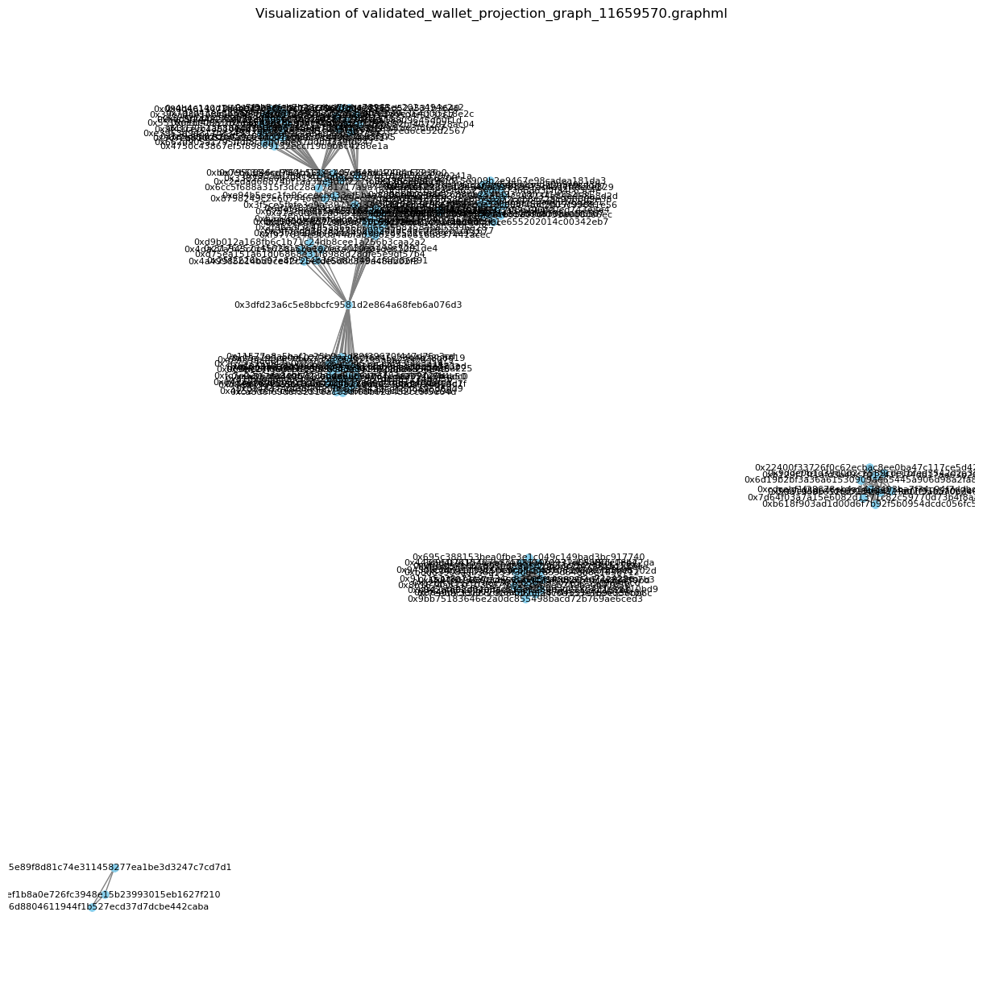

In [13]:
import os
import networkx as nx
import matplotlib.pyplot as plt

# Set the path to the directory where the GraphML files are stored
input_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/'

# Function to load a GraphML file
def load_graph(file_name, directory):
    file_path = os.path.join(directory, file_name)
    
    # Check if the file exists
    if not os.path.exists(file_path):
        raise FileNotFoundError(f"The file {file_path} does not exist.")
    
    # Load the graph
    graph = nx.read_graphml(file_path)
    return graph

# Function to visualize the graph
def visualize_graph(graph, title="Graph Visualization"):
    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(graph)
    nx.draw(graph, pos, with_labels=True, node_size=50, node_color='skyblue', edge_color='gray', linewidths=0.5, font_size=8)
    plt.title(title)
    plt.show()

# Example usage
file_name = 'validated_wallet_projection_graph_11659570.graphml'  # Replace with the actual file name
graph = load_graph(file_name, input_directory)
visualize_graph(graph, title=f"Visualization of {file_name}")


In [14]:
graph.number_of_nodes()

118

In [15]:

input_directory = os.path.join(path, '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs')
graphs, dates = load_wallet_graphs_from_snapshots(df_snapshots, input_directory)

Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Graph file for snapshot 7962629 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Graph file for snapshot 8155117 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8354625.graphml
Graph file for snapshot 8354625 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8354625.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTOR

ValueError: too many values to unpack (expected 2)

In [23]:
import os
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.patches as patches 
import pandas as pd
import numpy as np 
from src.utilities.metrics_and_tests import jaccard_similarity


def load_token_graphs_from_snapshots(df_snapshots, input_directory):
    """
    Load graphs from the given snapshots and store them in a dictionary.

    Parameters:
    df_snapshots (pd.DataFrame): DataFrame containing snapshot information with 'Block Height' and 'Date' columns.
    path (str): Base directory path where the graph files are located.

    Returns:
    dict: A dictionary containing loaded graphs with snapshot as the key.
    dict: A dictionary containing dates with snapshot as the key.
    """
    
    graphs = {}
    dates = {}
    
    for index, row in df_snapshots.iterrows():
        snapshot = row['Block Height']
        date = row['Date'].strftime('%Y-%m-%d')  # Format date as string
        dates[snapshot] = date
        file_path = os.path.join(input_directory, f"validated_token_projection_graph_{snapshot}.graphml")
        
        if os.path.exists(file_path):
            graph = nx.read_graphml(file_path)
            graphs[snapshot] = graph
        else:
            print(f"Graph file for snapshot {snapshot} does not exist.")
    
    return graphs, dates

def load_wallet_graphs_from_snapshots(df_snapshots, input_directory):
    """
    Load graphs from the given snapshots and store them in a dictionary.

    Parameters:
    df_snapshots (pd.DataFrame): DataFrame containing snapshot information with 'Block Height' and 'Date' columns.
    path (str): Base directory path where the graph files are located.

    Returns:
    dict: A dictionary containing loaded graphs with snapshot as the key.
    dict: A dictionary containing dates with snapshot as the key.
    """
    
    graphs = {}
    dates = {}
    
    for index, row in df_snapshots.iterrows():
        snapshot = row['Block Height']
        date = row['Date'].strftime('%Y-%m-%d')  # Format date as string
        dates[snapshot] = date
        file_path = os.path.join(input_directory, f"validated_wallet_projection_graph_{snapshot}.graphml")
        
        if os.path.exists(file_path):
            graph = nx.read_graphml(file_path)
            graphs[snapshot] = graph
        else:
            print(f"Graph file for snapshot {snapshot} does not exist.")
    
    return graphs, dates


def calculate_similarity_matrix(graphs):
    """
    Calculate the Jaccard Similarity matrix for a dictionary of graphs.

    Parameters:
    graphs (dict): A dictionary of graphs with snapshots as keys.

    Returns:
    np.ndarray: A 2D numpy array representing the similarity matrix.
    list: A sorted list of snapshot keys.
    """
    snapshot_list = sorted(graphs.keys())
    similarity_matrix = np.zeros((len(snapshot_list), len(snapshot_list)))

    for i, snapshot1 in enumerate(snapshot_list):
        for j, snapshot2 in enumerate(snapshot_list):
            if i <= j:
                similarity = jaccard_similarity(graphs[snapshot1], graphs[snapshot2])
                similarity_matrix[i, j] = similarity
                similarity_matrix[j, i] = similarity  # Symmetric matrix

    return similarity_matrix, snapshot_list


def visualize_wallet_network_grid(graphs, dates, address_to_symbol, output_directory, layout=nx.kamada_kawai_layout):
    # Define the grid size
    rows, cols = 3, 6  # Adjust based on the number of graphs
    fig, axes = plt.subplots(rows, cols, figsize=(20, 10))
    axes = axes.flatten()  # Flatten to iterate easily
    
    for ax, (snapshot, graph) in zip(axes, graphs.items()):
        # Relabel nodes with symbols using the mapping
        relabeled_graph = nx.relabel_nodes(graph, address_to_symbol)
        
        # Compute layout
        pos = layout(relabeled_graph)  
        
        # Draw the graph with relabeled nodes
        nx.draw(relabeled_graph, pos, ax=ax, with_labels=False, node_size=50, node_color='skyblue', edge_color='gray', font_size=8)
        ax.set_title(dates[snapshot], fontsize=10)
        ax.set_axis_off()  # Hide axis for clarity
        
        # Draw a rectangle around the plot area
        rect = patches.Rectangle((0, 0), 1, 1, linewidth=1, edgecolor='black', facecolor='none', transform=ax.transAxes, clip_on=False)
        ax.add_patch(rect)

    # Turn off any unused subplots
    for i in range(len(graphs), len(axes)):
        axes[i].set_axis_off()
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # Adjust the top spacing to accommodate title if necessary
    
    # Save the figure
    fig.suptitle('Validated Wallet Projections Over Time', fontsize=16)
    plt.savefig(os.path.join(output_directory, "wallet_projection_grid.png"), format='png', dpi=300)
    plt.show()
    

def plot_similarity_heatmap(similarity_matrix, snapshot_list, dates, output_directory):
    """
    Plot a heatmap of the Jaccard Similarity matrix.

    Parameters:
    similarity_matrix (np.ndarray): A 2D numpy array representing the similarity matrix.
    snapshot_list (list): A sorted list of snapshot keys.
    dates (dict): A dictionary of dates with snapshots as keys.
    """
    fig, ax = plt.subplots(figsize=(12, 10))  # Adjusted size to better fit more labels
    cax = ax.matshow(similarity_matrix, interpolation='nearest', cmap='coolwarm')
    fig.colorbar(cax)

    # Set the ticks and labels with dates
    date_labels = [dates[snapshot] for snapshot in snapshot_list]
    ax.set_xticks(range(len(snapshot_list)))
    ax.set_xticklabels(date_labels, rotation=90)  # Rotate for better readability
    ax.set_yticks(range(len(snapshot_list)))
    ax.set_yticklabels(date_labels)

    ax.xaxis.set_ticks_position('bottom')  # X-axis labels on the bottom

    # Set title with padding
    ax.set_title('Jaccard Similarity Heatmap of Graph Snapshots', size=16, pad=20)

    ax.set_xlabel('Snapshot Date')
    ax.set_ylabel('Snapshot Date')
    
    plt.savefig(os.path.join(output_directory, "jaccard_similarity.png"), format='png', dpi=300)

    plt.show()

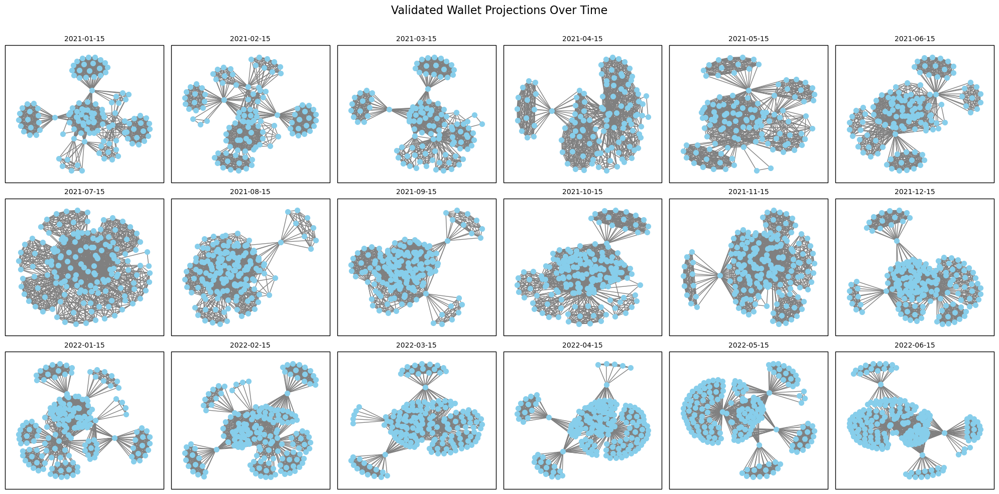

In [24]:
visualize_wallet_network_grid(graphs, dates, address_to_symbol, output_directory='../output/wallet_network_projections/', layout=nx.kamada_kawai_layout)


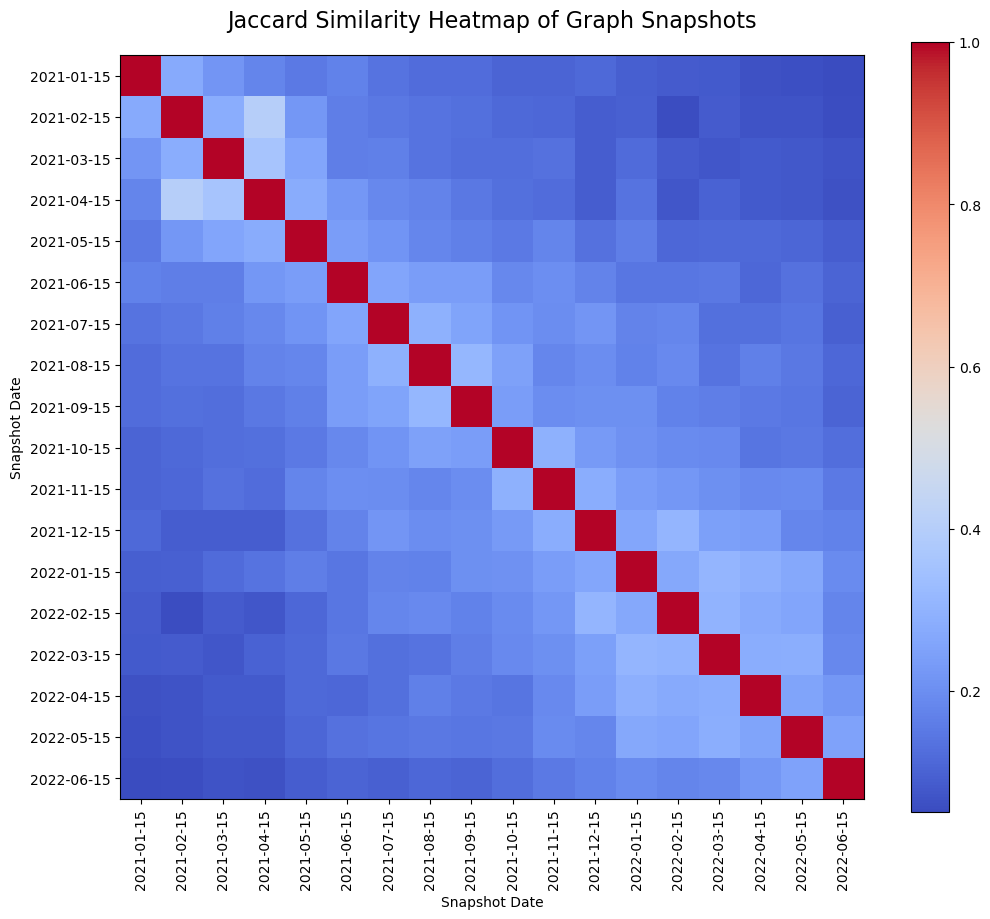

In [25]:
similarity_matrix, snapshot_list = calculate_similarity_matrix(graphs)

plot_similarity_heatmap(similarity_matrix, snapshot_list, dates, output_directory='../output/wallet_network_projections/')

# Successfully replicated and debugged

## Louvain method
#### Optimizes modularity through an efficient two-phase process, suitable for large networks, and provides a flat or hierarchical partition of the network.

Input directory is set to: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Graph file for snapshot 7962629 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Graph file for snapshot 8155117 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8354625.graphml
Graph file for snapshot 8354625 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_gra

Loaded graph for snapshot 14391029
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14589816.graphml
Loaded graph for snapshot 14589816
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14779829.graphml
Loaded graph for snapshot 14779829
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14967365.graphml
Loaded graph for snapshot 14967365


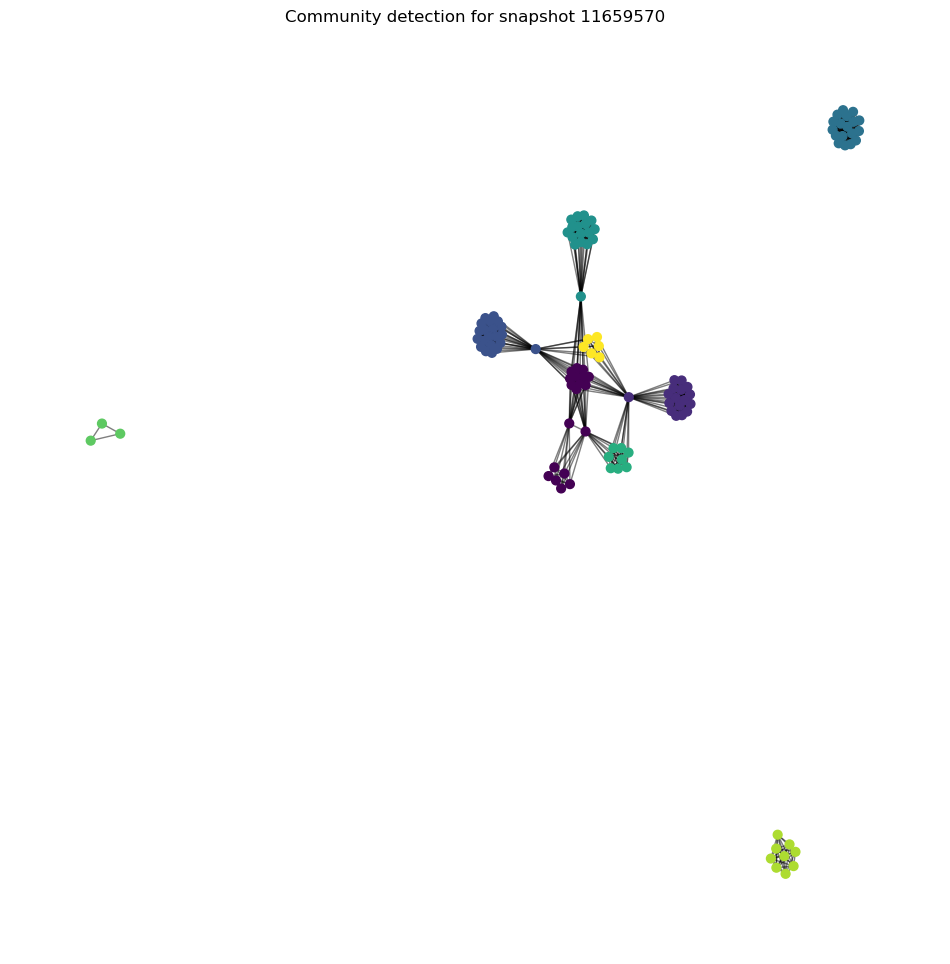

Snapshot: 11659570, Number of communities detected: 9


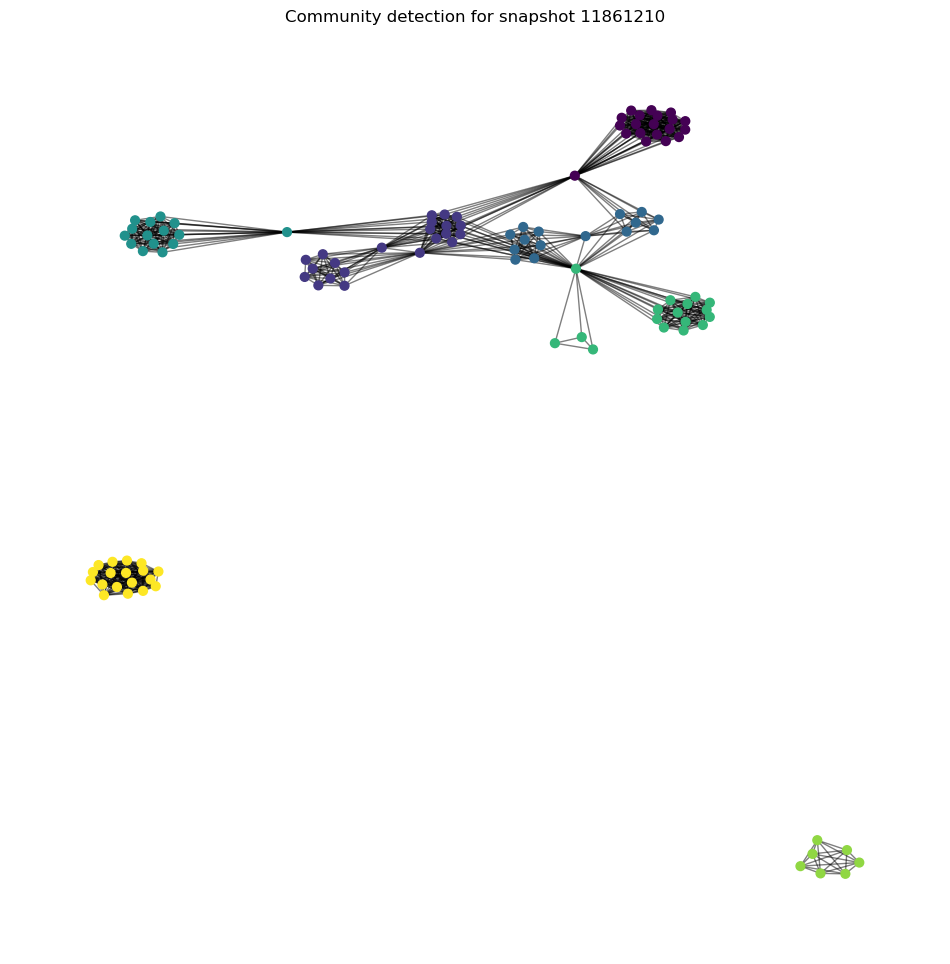

Snapshot: 11861210, Number of communities detected: 7


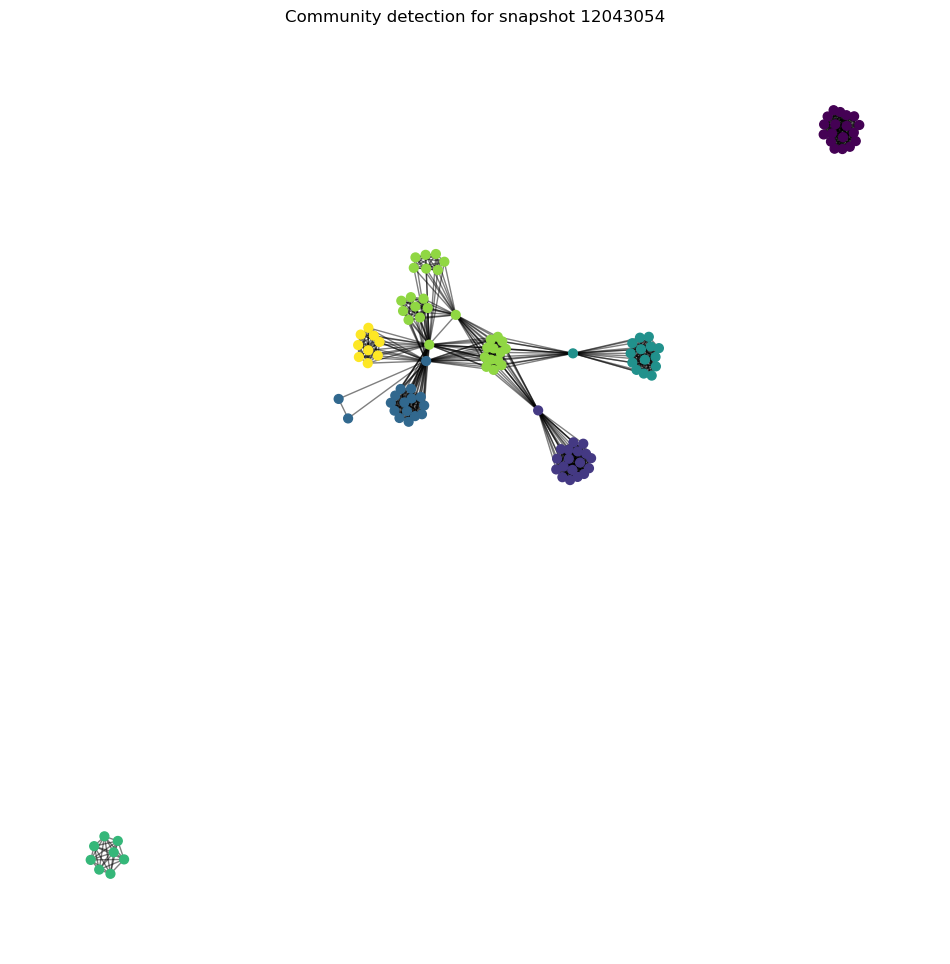

Snapshot: 12043054, Number of communities detected: 7


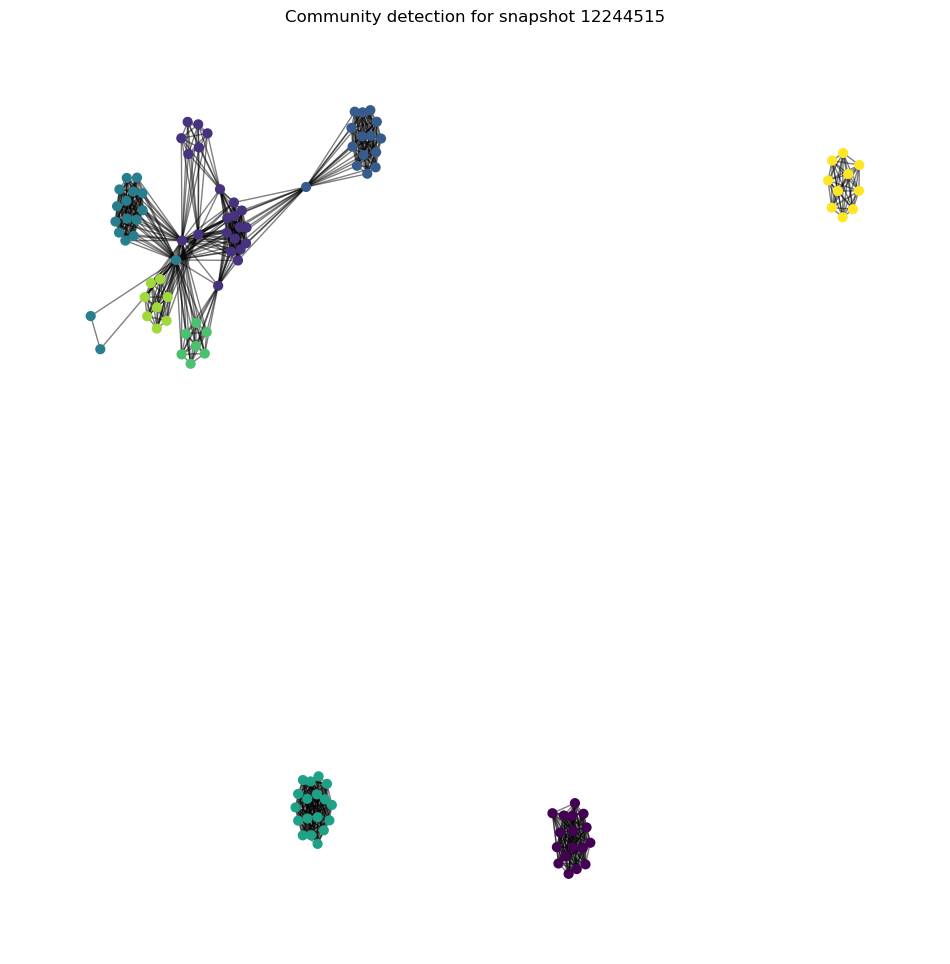

Snapshot: 12244515, Number of communities detected: 8


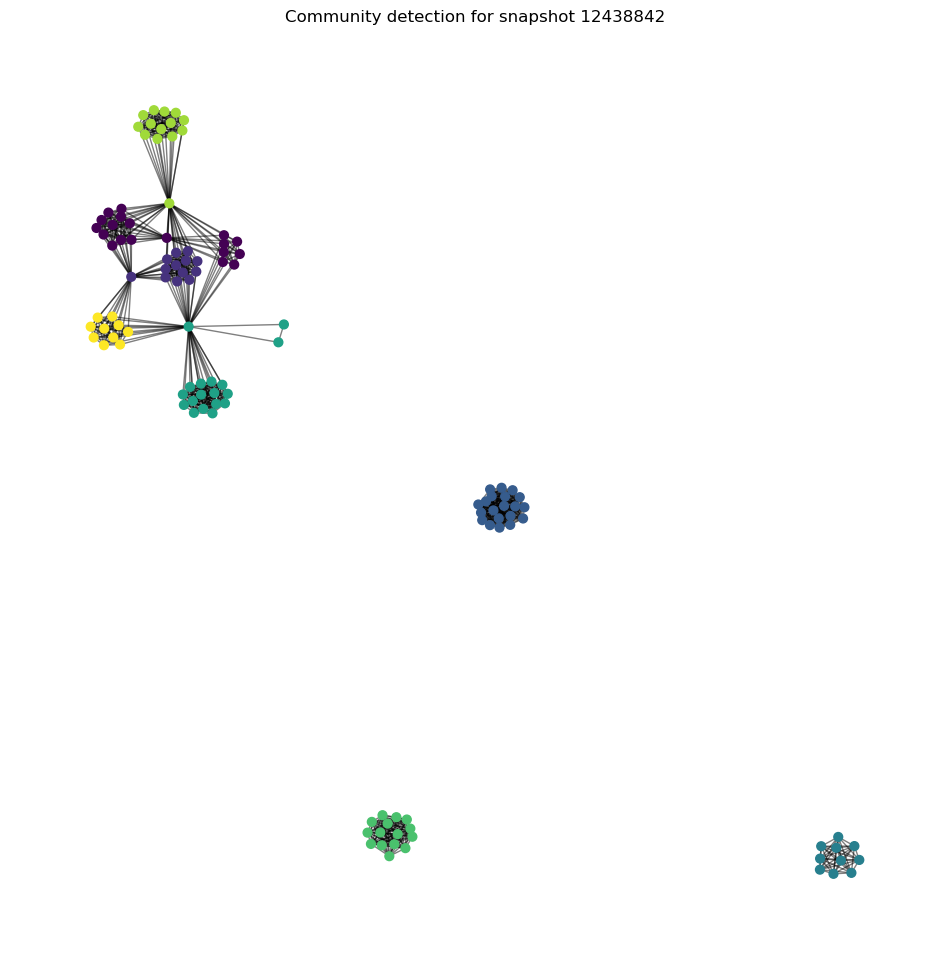

Snapshot: 12438842, Number of communities detected: 8


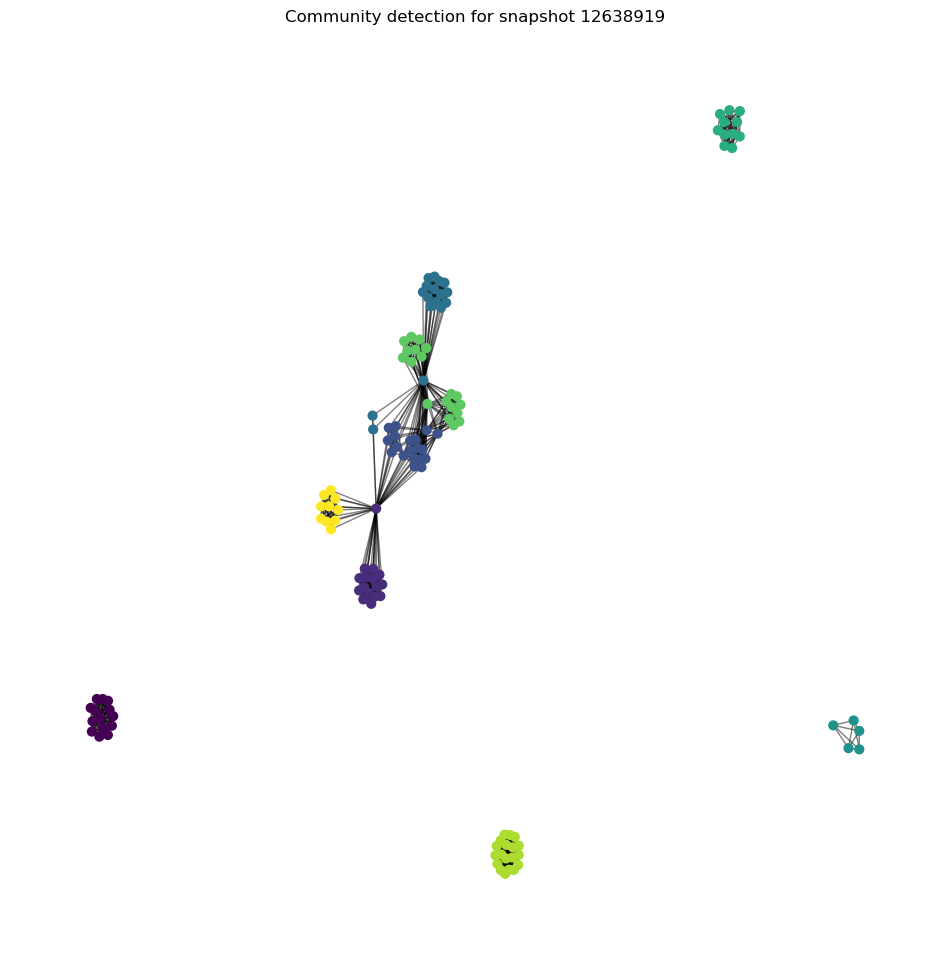

Snapshot: 12638919, Number of communities detected: 9


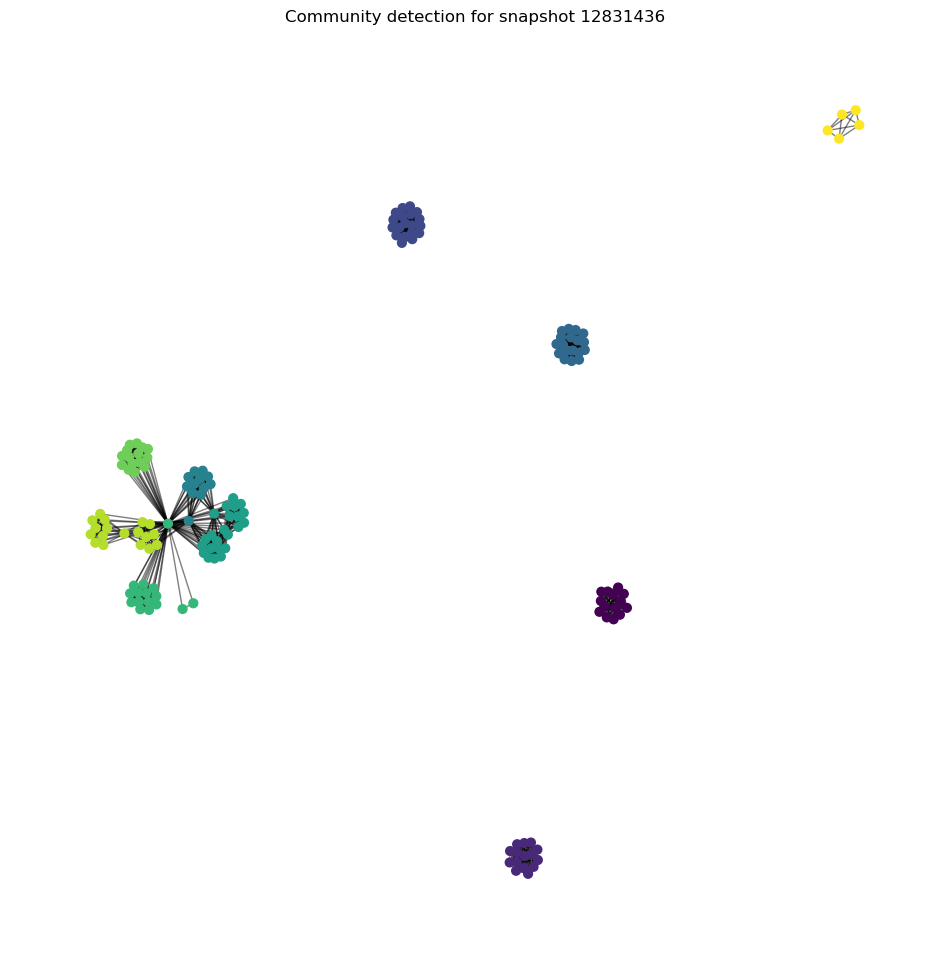

Snapshot: 12831436, Number of communities detected: 10


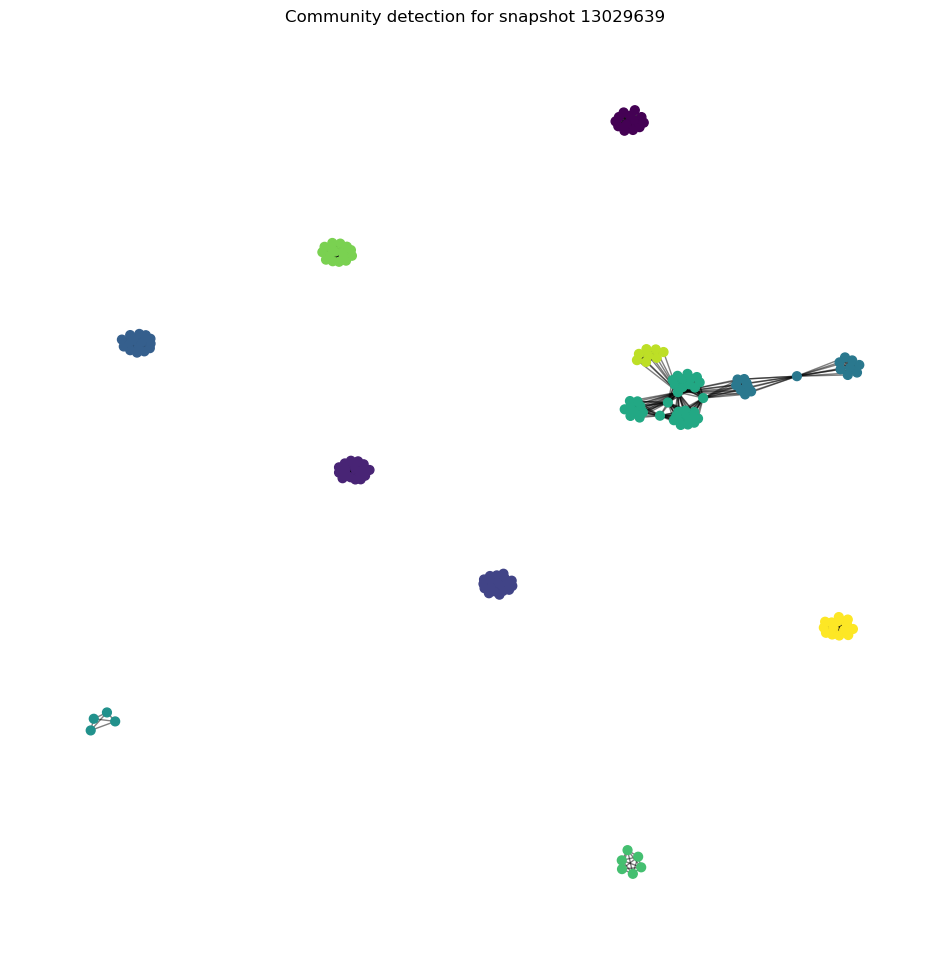

Snapshot: 13029639, Number of communities detected: 11


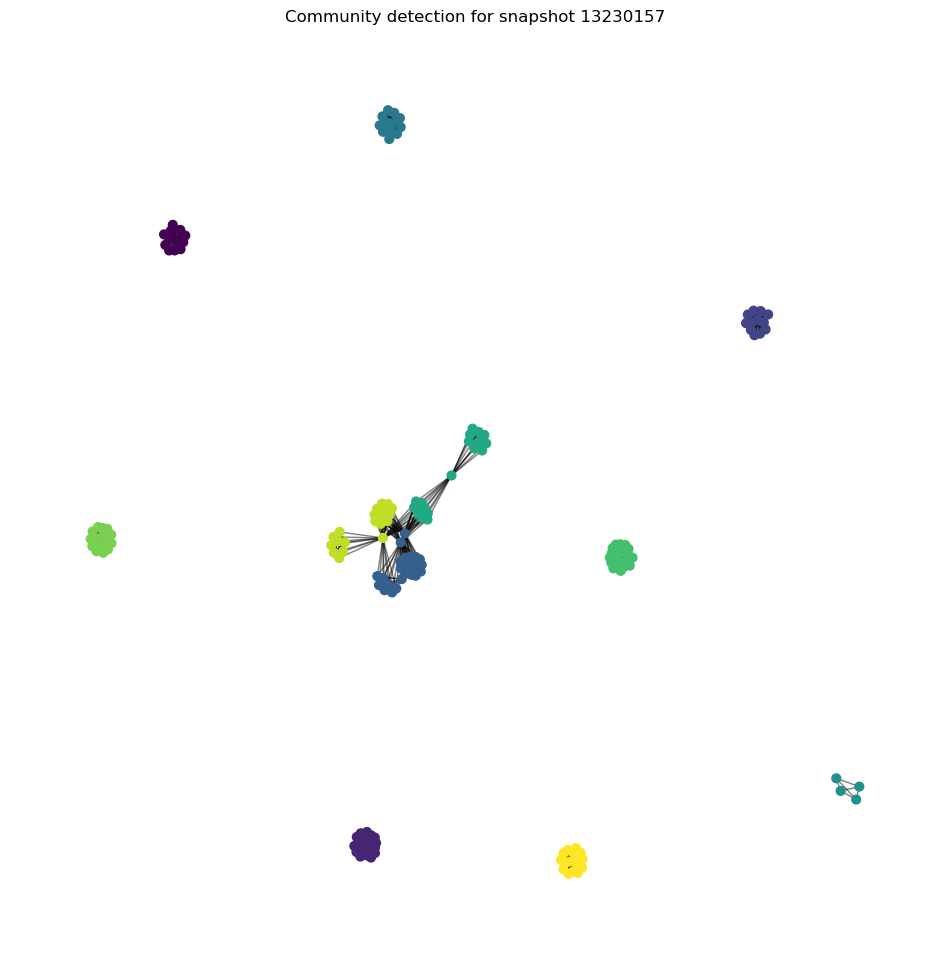

Snapshot: 13230157, Number of communities detected: 11


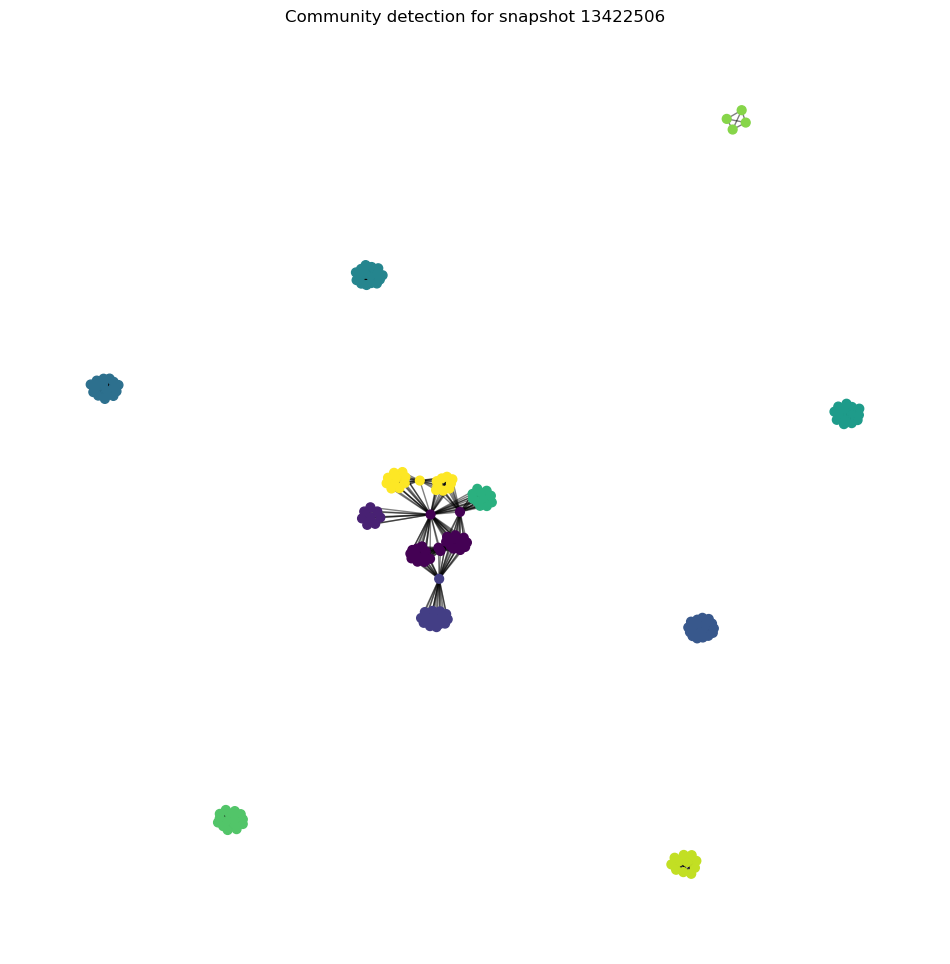

Snapshot: 13422506, Number of communities detected: 12


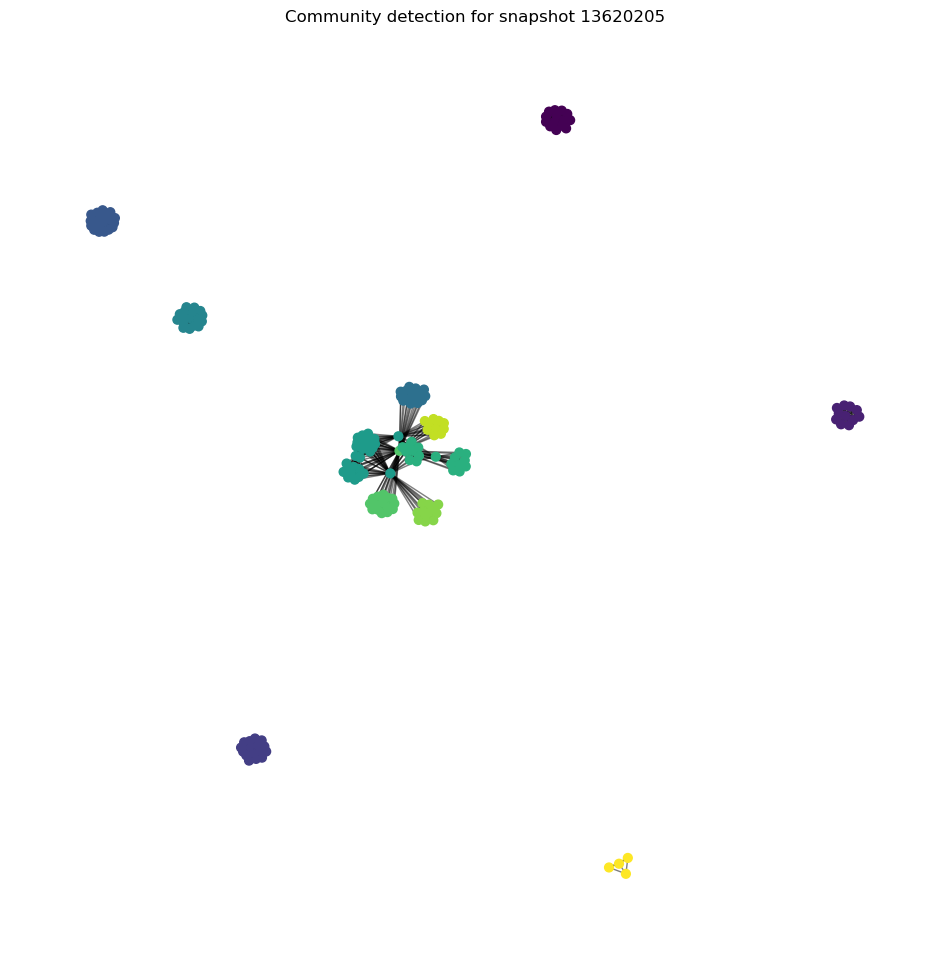

Snapshot: 13620205, Number of communities detected: 12


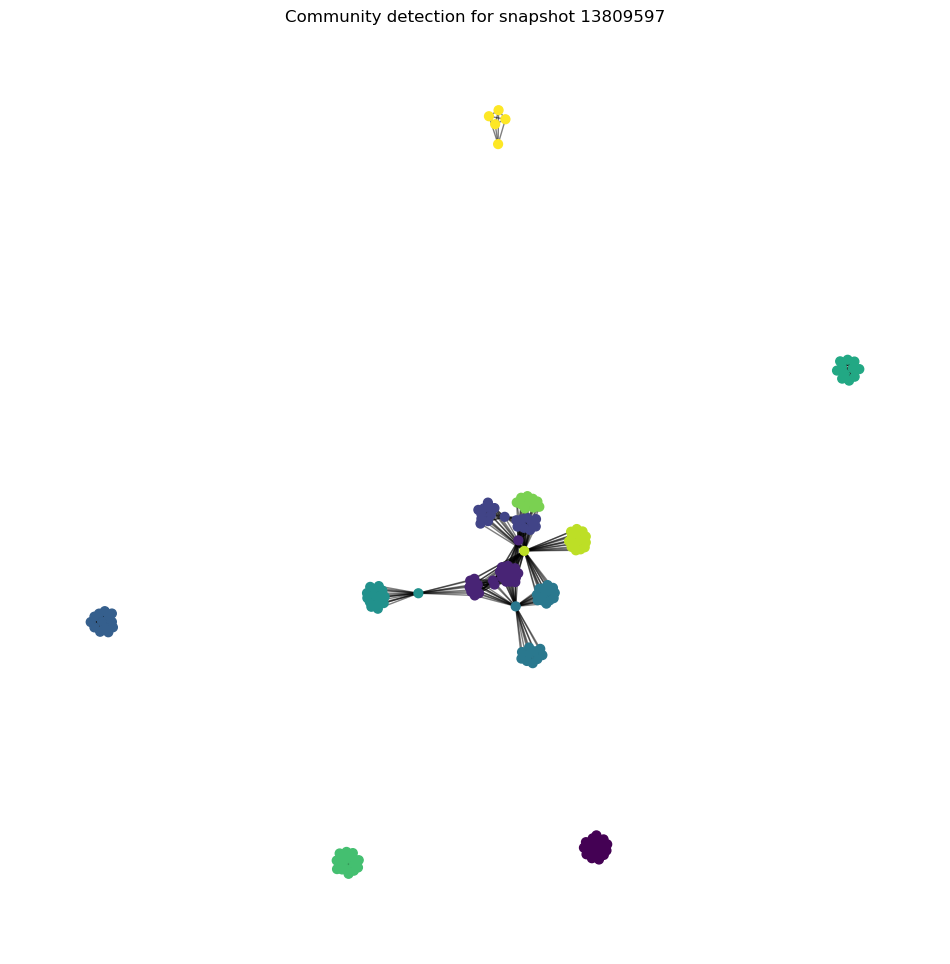

Snapshot: 13809597, Number of communities detected: 11


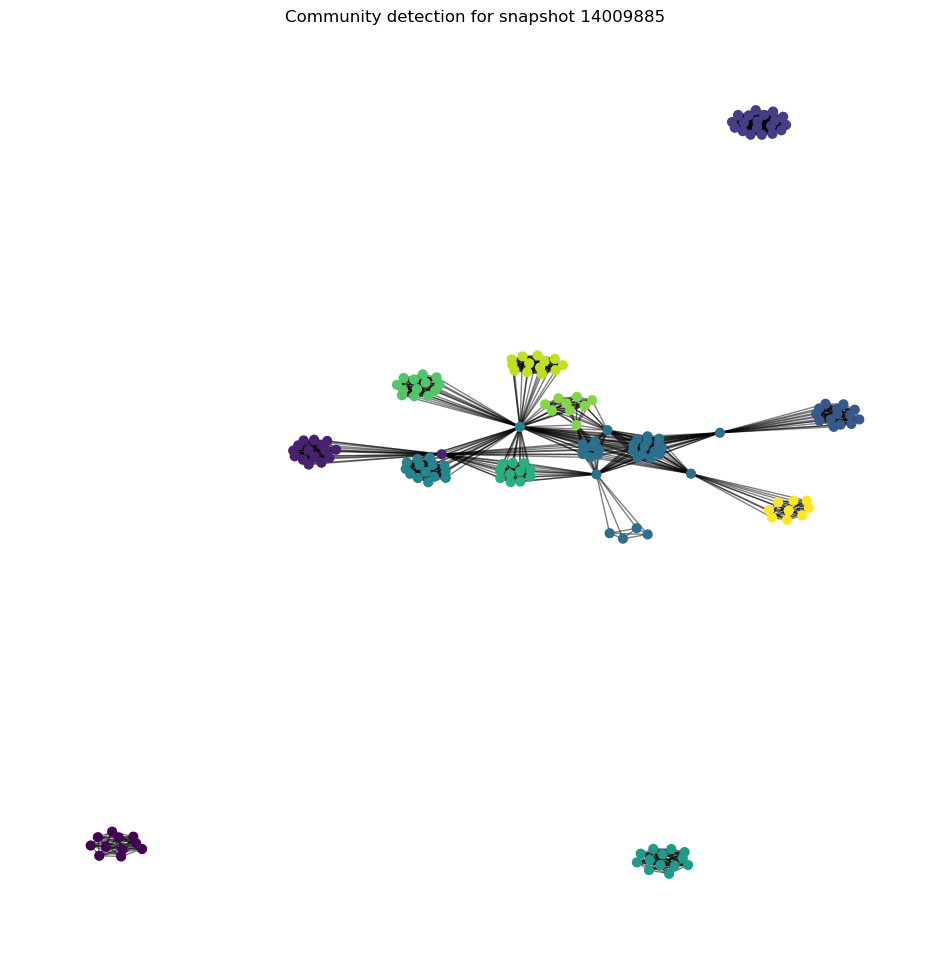

Snapshot: 14009885, Number of communities detected: 12


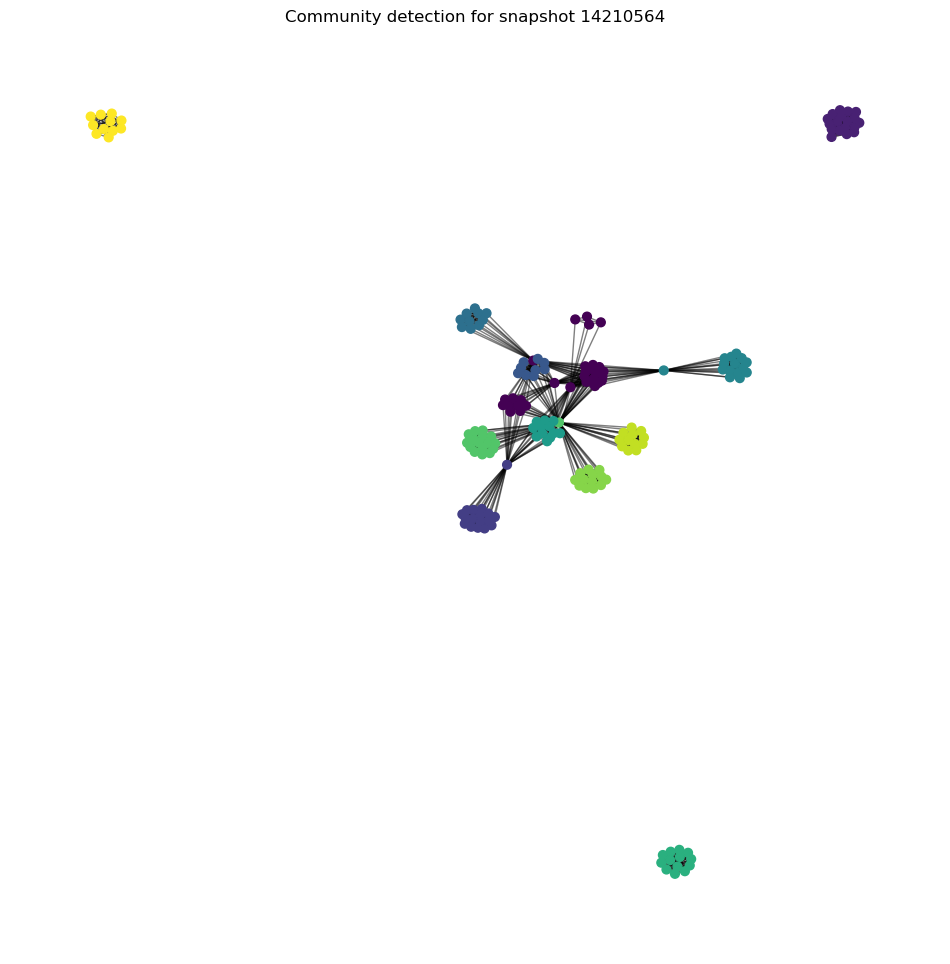

Snapshot: 14210564, Number of communities detected: 12


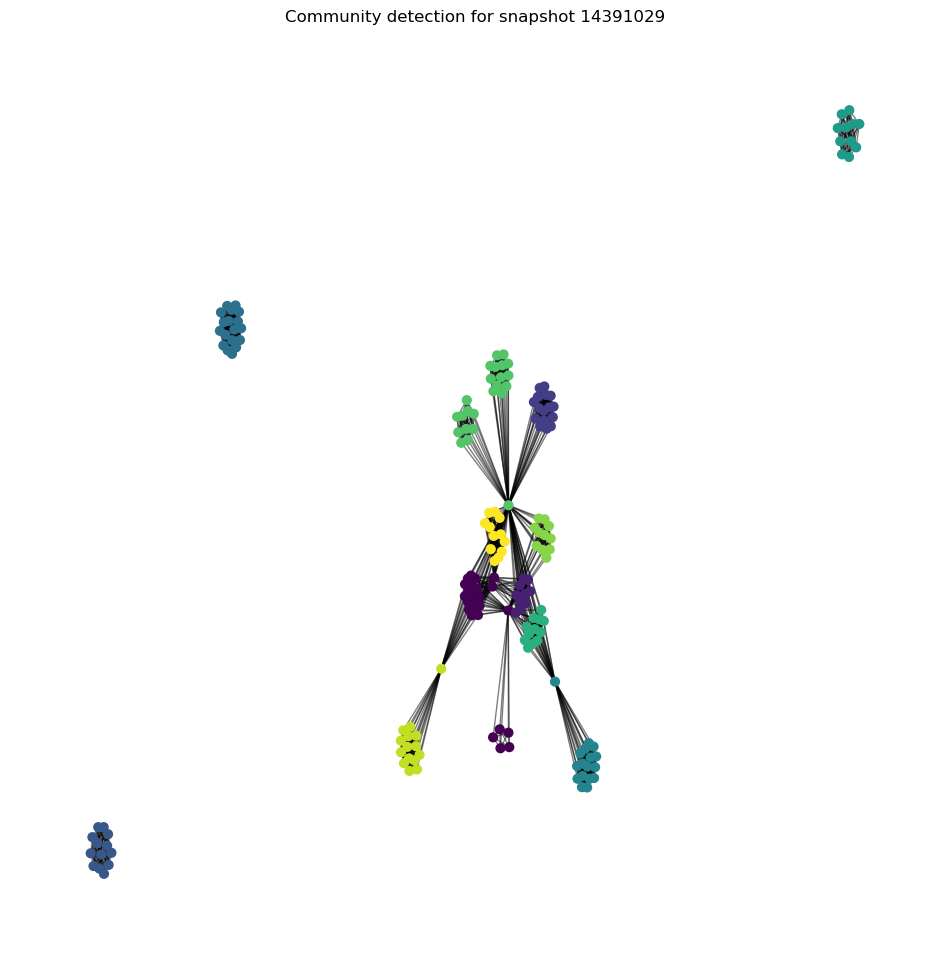

Snapshot: 14391029, Number of communities detected: 12


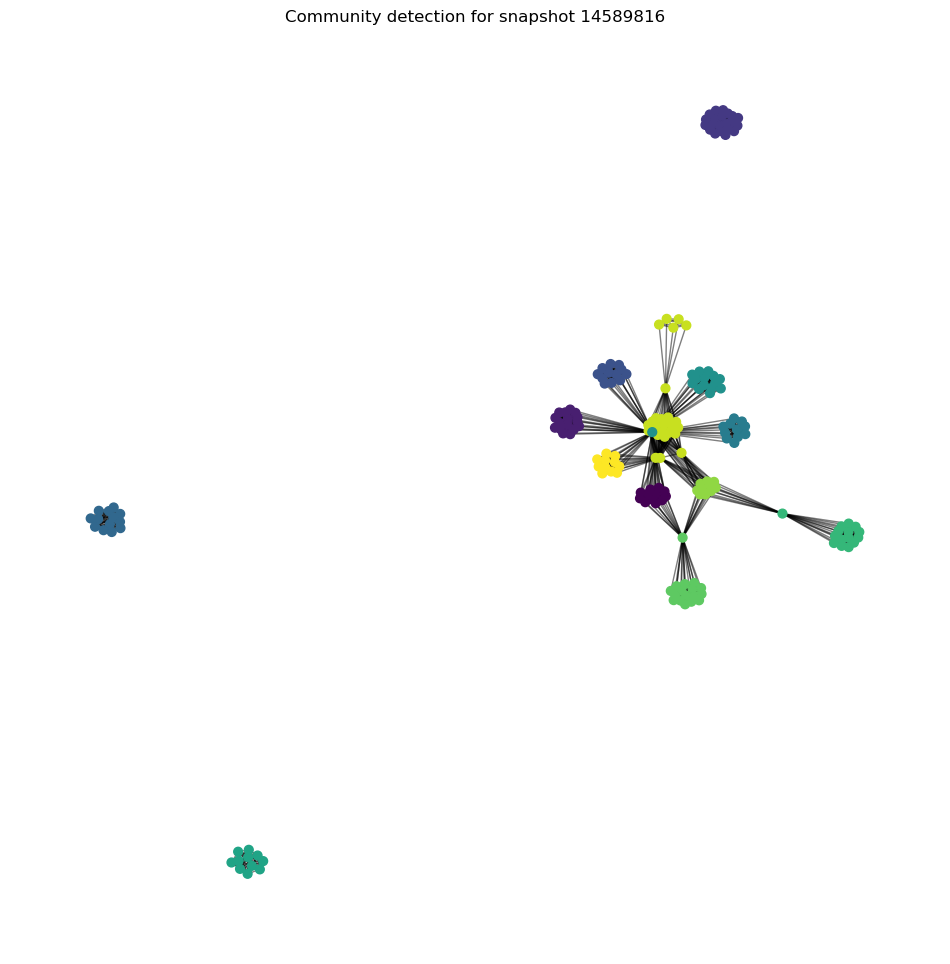

Snapshot: 14589816, Number of communities detected: 13


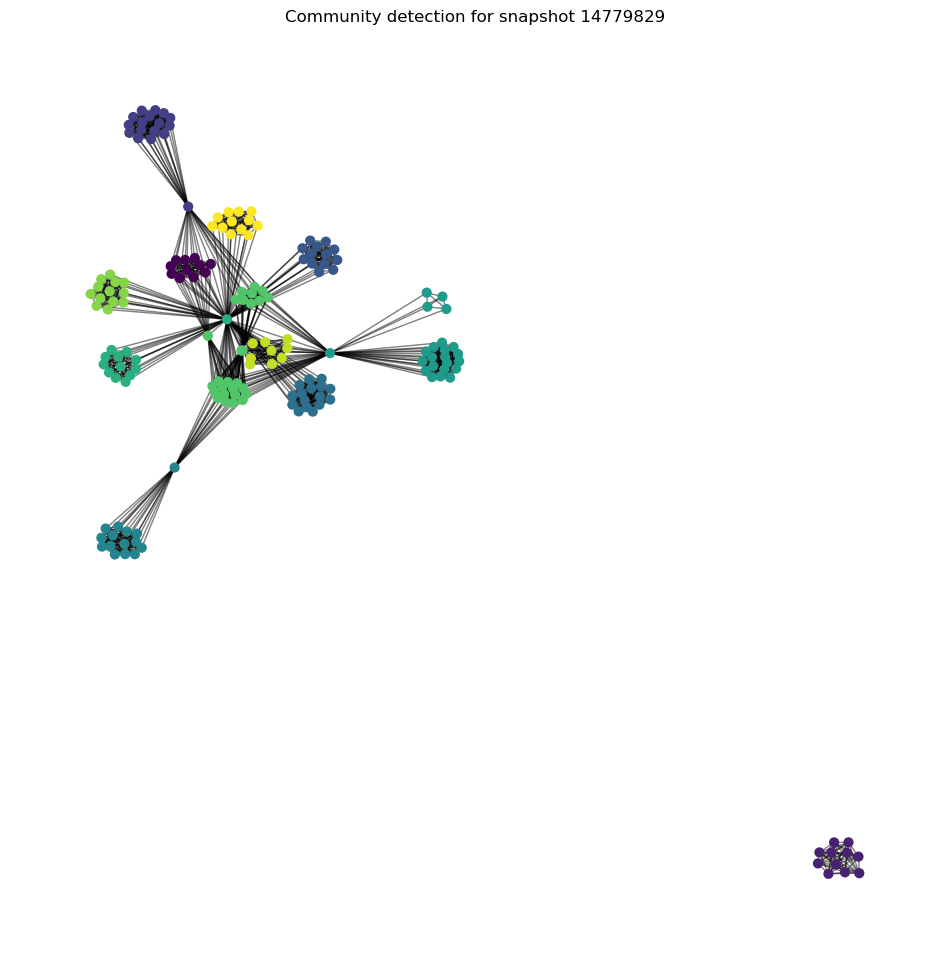

Snapshot: 14779829, Number of communities detected: 12


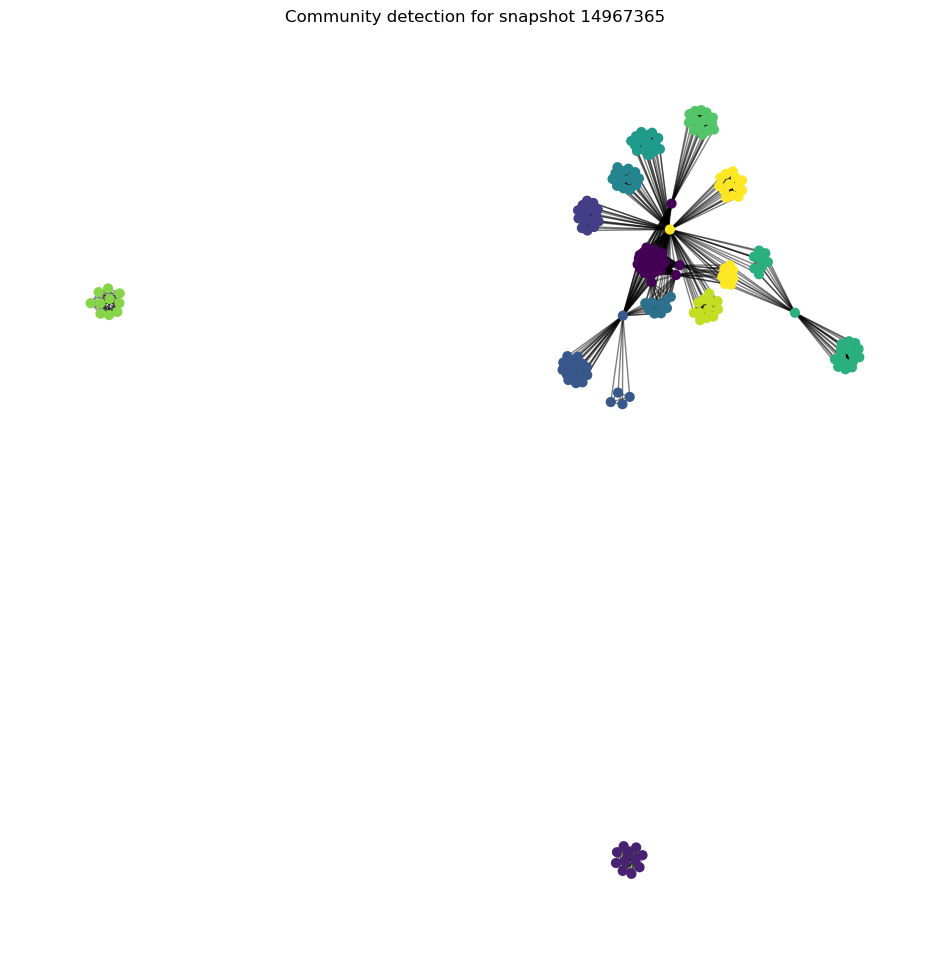

Snapshot: 14967365, Number of communities detected: 12


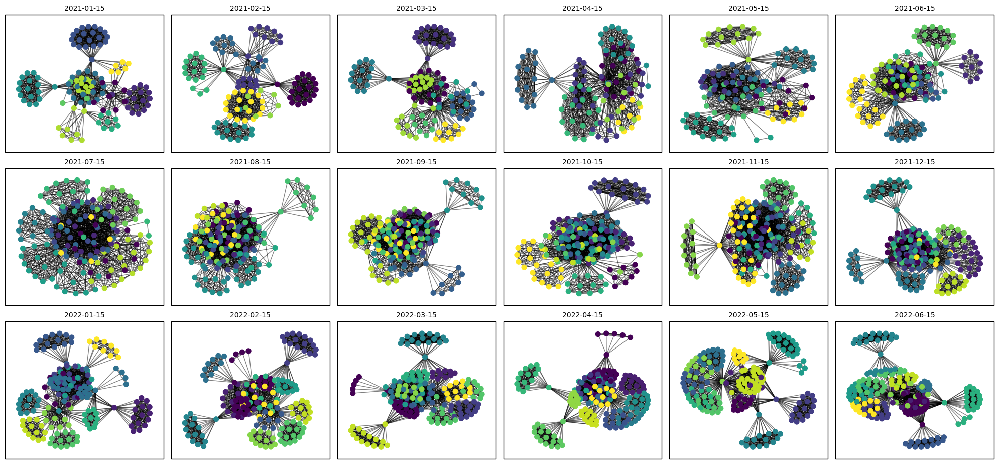

In [26]:
import os
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
from matplotlib import patches
from dotenv import load_dotenv

# Load environment variables from .env file (if needed for other variables)
load_dotenv()

# Set the input directory directly to the local folder where the graphs are stored
input_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'

# Check if the input directory exists
if not os.path.exists(input_directory):
    raise FileNotFoundError(f"Input directory does not exist: {input_directory}")

print(f"Input directory is set to: {input_directory}")

# Function to load graphs from snapshots
def load_wallet_graphs_from_snapshots(df_snapshots, input_directory):
    graphs = {}
    dates = {}
    missing_snapshots = []
    
    for index, row in df_snapshots.iterrows():
        snapshot = row['Block Height']
        date = row['Date'].strftime('%Y-%m-%d')  # Format date as string
        dates[snapshot] = date
        file_path = os.path.join(input_directory, f"validated_wallet_projection_graph_{snapshot}.graphml")
        
        print(f"Checking file: {file_path}")  # Debug print

        if os.path.exists(file_path):
            graph = nx.read_graphml(file_path)
            graphs[snapshot] = graph
            print(f"Loaded graph for snapshot {snapshot}")
        else:
            print(f"Graph file for snapshot {snapshot} does not exist at {file_path}")
            missing_snapshots.append(snapshot)
    
    return graphs, dates, missing_snapshots

# Assuming df_snapshots is already loaded
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
df_snapshots = pd.read_csv(os.path.join(data_directory, 'snapshot_selection.csv'))
df_snapshots['Date'] = pd.to_datetime(df_snapshots['Date'])  # Ensure dates are in datetime format

# Load the graphs
graphs, dates, missing_snapshots = load_wallet_graphs_from_snapshots(df_snapshots, input_directory)

# Function to perform community detection and visualize results
def detect_and_visualize_communities(graph, snapshot, output_directory):
    # Compute the best partition using the Louvain method
    partition = community_louvain.best_partition(graph)
    
    # Draw the graph with communities
    pos = nx.spring_layout(graph)
    cmap = plt.get_cmap('viridis')
    plt.figure(figsize=(12, 12))
    
    # Draw nodes with community colors
    nx.draw_networkx_nodes(graph, pos, partition.keys(), node_size=40, 
                           cmap=cmap, node_color=list(partition.values()))
    nx.draw_networkx_edges(graph, pos, alpha=0.5)
    
    plt.title(f"Community detection for snapshot {snapshot}")
    plt.axis('off')
    plt.savefig(os.path.join(output_directory, f'community_snapshot_{snapshot}.png'))
    plt.show()
    
    return partition

# Directory to save community detection visualizations
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/output'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Perform community detection on loaded graphs
for snapshot, graph in graphs.items():
    partition = detect_and_visualize_communities(graph, snapshot, output_directory)
    
    # Analyze the partition
    num_communities = len(set(partition.values()))
    print(f"Snapshot: {snapshot}, Number of communities detected: {num_communities}")
    
    # Example: Save partition information
    partition_df = pd.DataFrame(list(partition.items()), columns=['Node', 'Community'])
    partition_df.to_csv(os.path.join(output_directory, f'partition_snapshot_{snapshot}.csv'), index=False)

def visualize_wallet_network_grid(graphs, dates, output_directory, layout=nx.kamada_kawai_layout):
    # Define the grid size
    rows, cols = 3, 6  # Adjust based on the number of graphs
    fig, axes = plt.subplots(rows, cols, figsize=(20, 10))
    axes = axes.flatten()  # Flatten to iterate easily
    
    for ax, (snapshot, graph) in zip(axes, graphs.items()):
        # Perform community detection
        partition = community_louvain.best_partition(graph)
        
        # Compute layout
        pos = layout(graph)  
        
        # Draw the graph with communities
        nx.draw_networkx_nodes(graph, pos, node_size=50, cmap=plt.get_cmap('viridis'),
                               node_color=list(partition.values()), ax=ax)
        nx.draw_networkx_edges(graph, pos, alpha=0.5, ax=ax)
        ax.set_title(dates[snapshot], fontsize=10)
        ax.set_axis_off()  # Hide axis for clarity
        
        # Draw a rectangle around the plot area
        rect = patches.Rectangle((0, 0), 1, 1, linewidth=1, edgecolor='black', facecolor='none', transform=ax.transAxes, clip_on=False)
        ax.add_patch(rect)

    # Turn off any unused subplots
    for i in range(len(graphs), len(axes)):
        axes[i].set_axis_off()
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # Adjust the top spacing to accommodate title if necessary
    plt.savefig(os.path.join(output_directory, 'wallet_network_grid.png'))
    plt.show()

# Visualize the wallet network grid
visualize_wallet_network_grid(graphs, dates, output_directory)


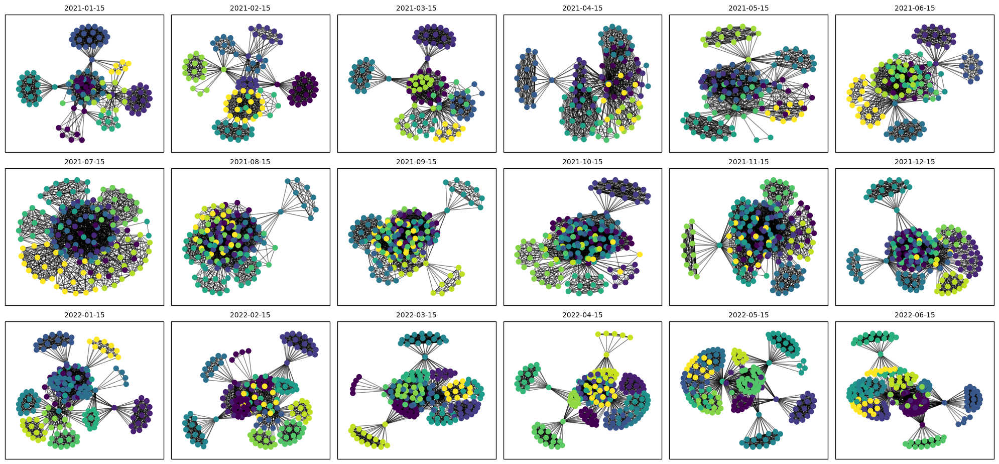

In [27]:
def visualize_wallet_network_grid(graphs, dates, output_directory, layout=nx.kamada_kawai_layout):
    # Define the grid size
    rows, cols = 3, 6  # Adjust based on the number of graphs
    fig, axes = plt.subplots(rows, cols, figsize=(20, 10))
    axes = axes.flatten()  # Flatten to iterate easily
    
    for ax, (snapshot, graph) in zip(axes, graphs.items()):
        # Perform community detection
        partition = community_louvain.best_partition(graph)
        
        # Compute layout
        pos = layout(graph)  
        
        # Draw the graph with communities
        nx.draw_networkx_nodes(graph, pos, node_size=50, cmap=plt.get_cmap('viridis'),
                               node_color=list(partition.values()), ax=ax)
        nx.draw_networkx_edges(graph, pos, alpha=0.5, ax=ax)
        ax.set_title(dates[snapshot], fontsize=10)
        ax.set_axis_off()  # Hide axis for clarity
        
        # Draw a rectangle around the plot area
        rect = patches.Rectangle((0, 0), 1, 1, linewidth=1, edgecolor='black', facecolor='none', transform=ax.transAxes, clip_on=False)
        ax.add_patch(rect)

    # Turn off any unused subplots
    for i in range(len(graphs), len(axes)):
        axes[i].set_axis_off()
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # Adjust the top spacing to accommodate title if necessary
    plt.savefig(os.path.join(output_directory, 'wallet_network_grid.png'))
    plt.show()

# Visualize the wallet network grid
visualize_wallet_network_grid(graphs, dates, output_directory)

## Ravasz Algorithm with Dendrogram
#### Uses hierarchical clustering based on topological similarity, producing a dendrogram, and is often used in biological network analysis.


Input directory is set to: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Graph file for snapshot 7962629 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Graph file for snapshot 8155117 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8354625.graphml
Graph file for snapshot 8354625 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_gra

Loaded graph for snapshot 14210564
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14391029.graphml
Loaded graph for snapshot 14391029
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14589816.graphml
Loaded graph for snapshot 14589816
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14779829.graphml
Loaded graph for snapshot 14779829
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14967365.graphml
Loaded graph for snapshot 14967365


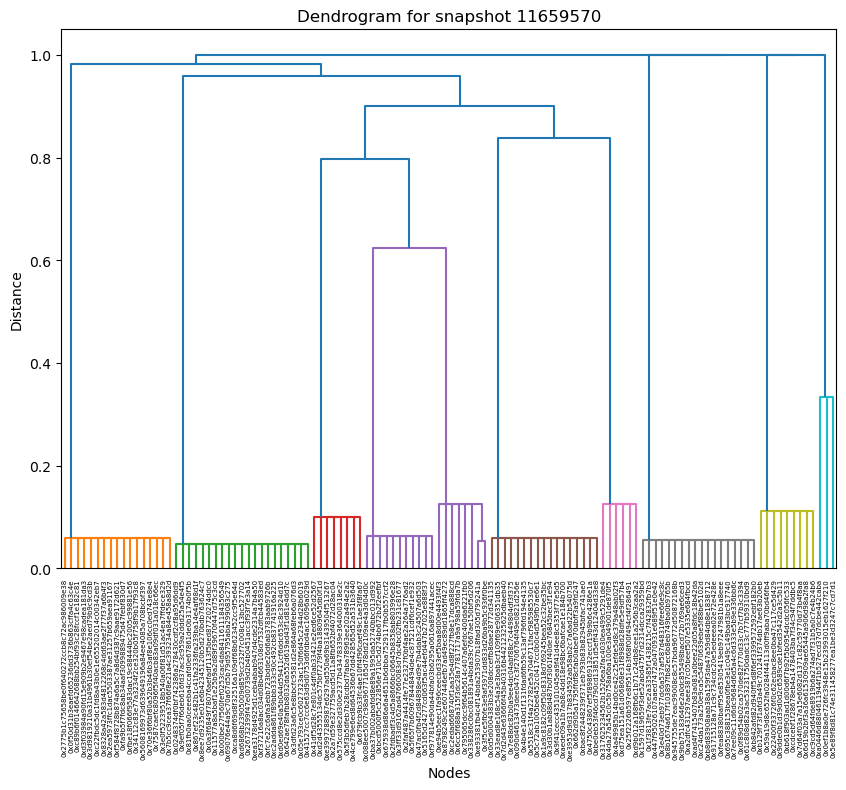

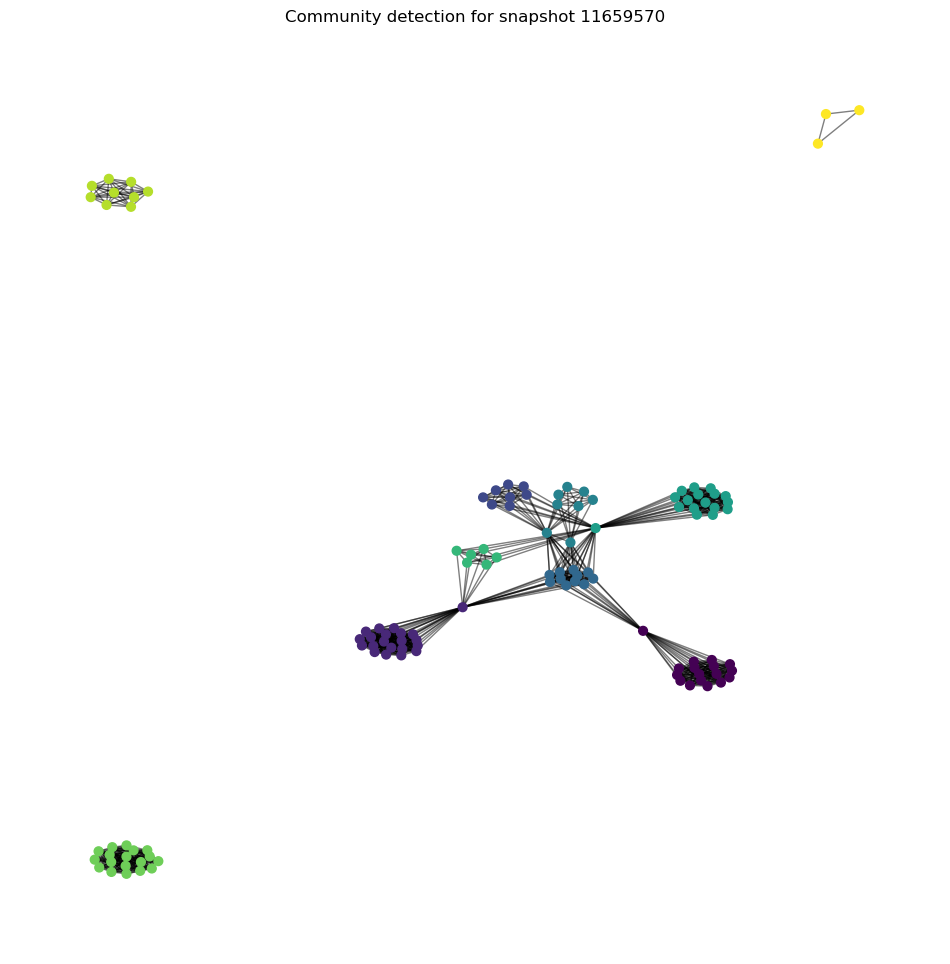

Snapshot: 11659570, Number of communities detected: 10
Community sizes for snapshot 11659570:
Community
2     21
8     18
6     17
1     17
4     11
9      9
5      8
3      8
7      6
10     3
Name: count, dtype: int64


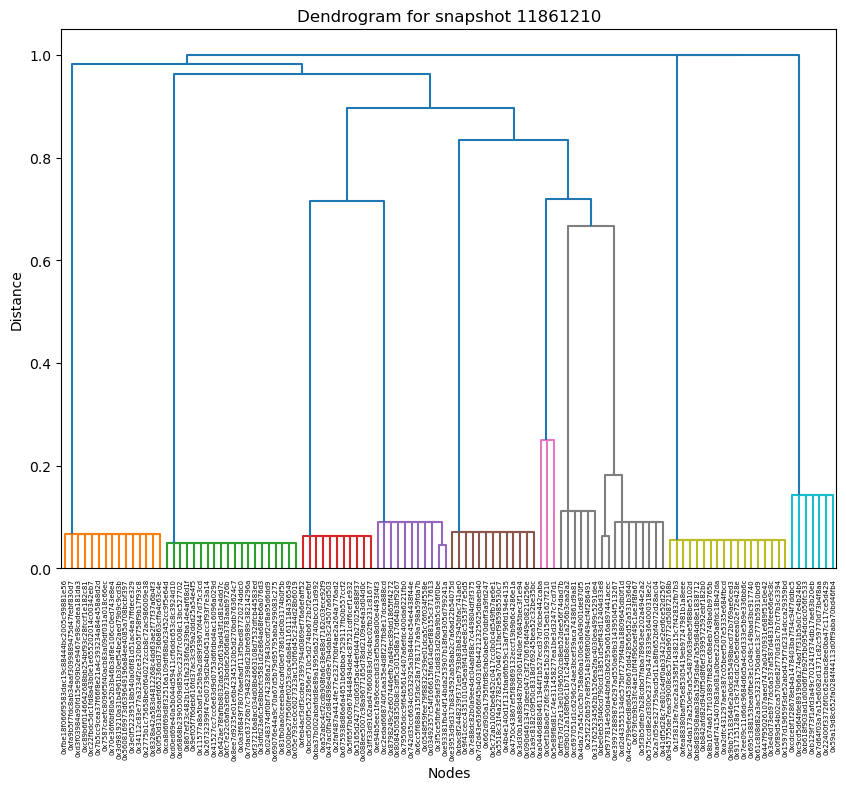

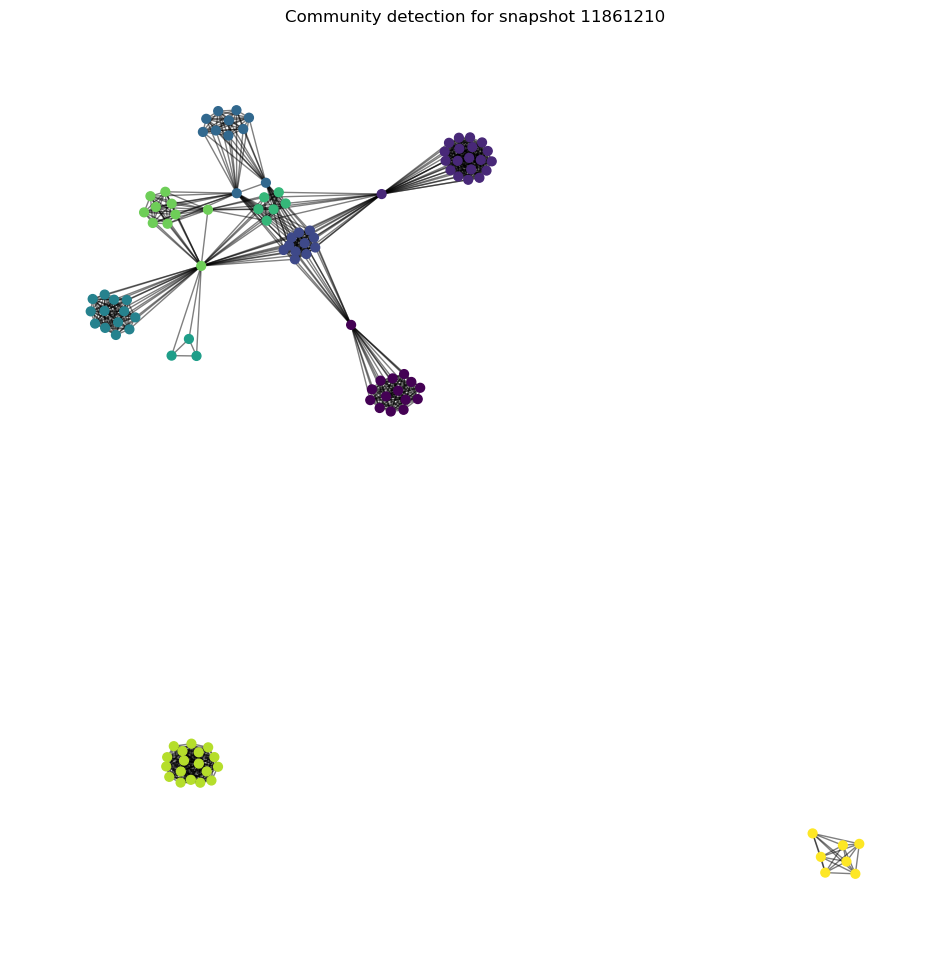

Snapshot: 11861210, Number of communities detected: 10
Community sizes for snapshot 11861210:
Community
2     20
9     18
1     15
5     13
4     11
3     11
8     10
10     7
7      6
6      3
Name: count, dtype: int64


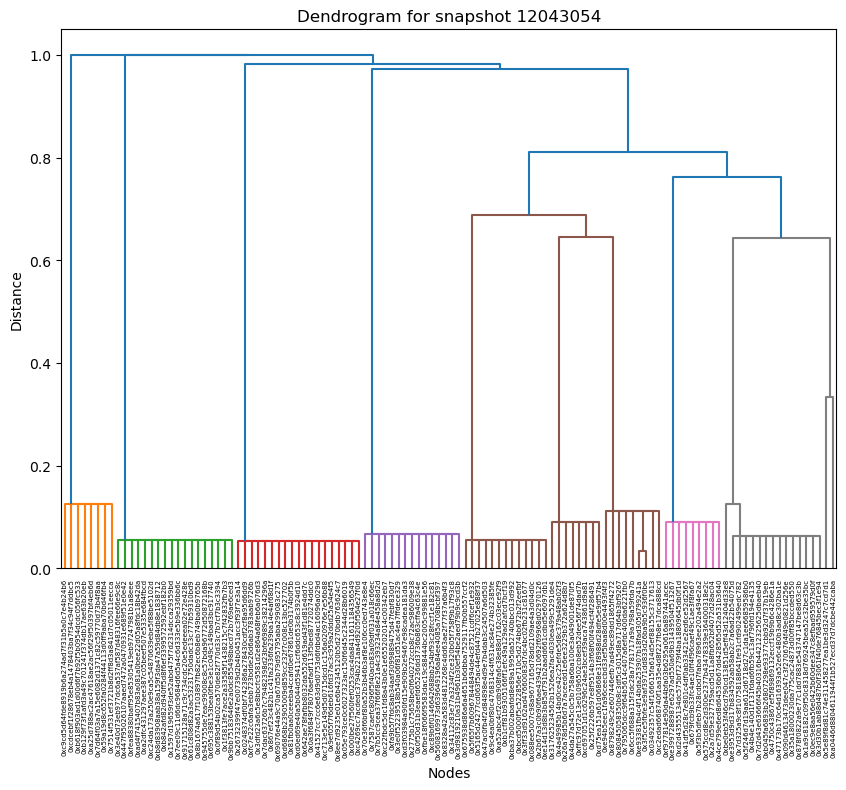

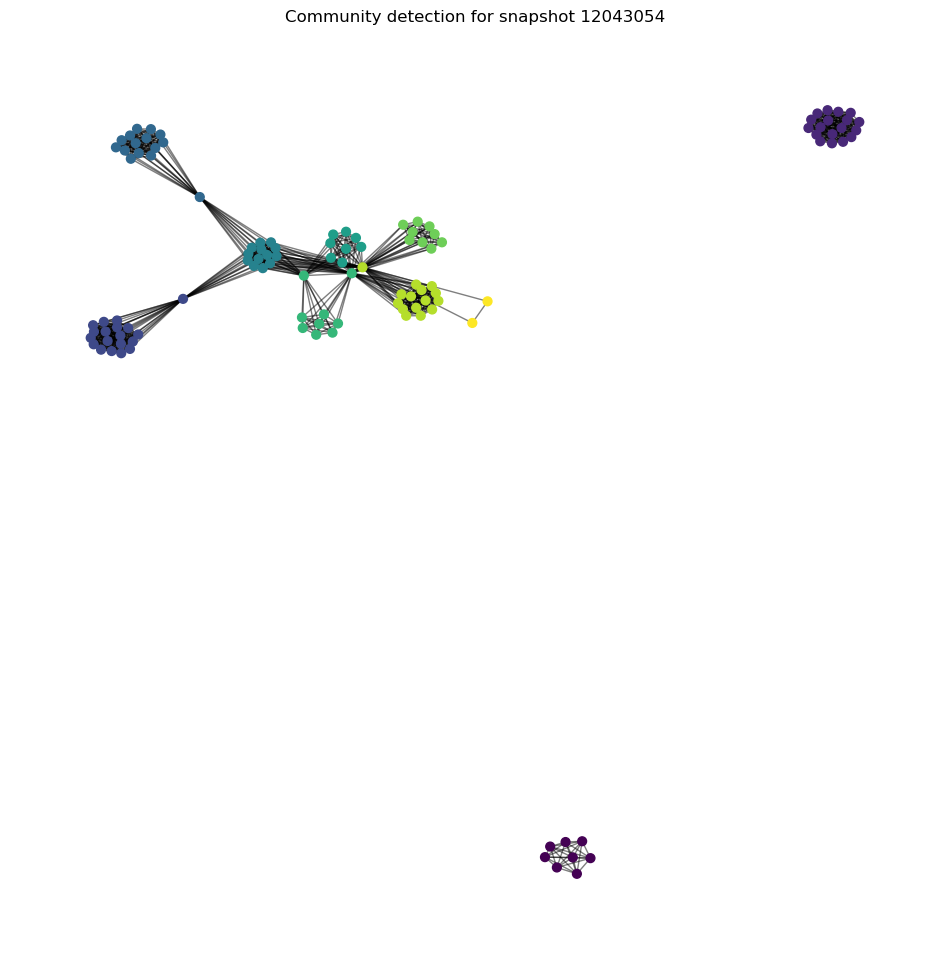

Snapshot: 12043054, Number of communities detected: 10
Community sizes for snapshot 12043054:
Community
3     19
2     18
9     15
4     15
5     13
7      9
8      9
6      8
1      8
10     2
Name: count, dtype: int64


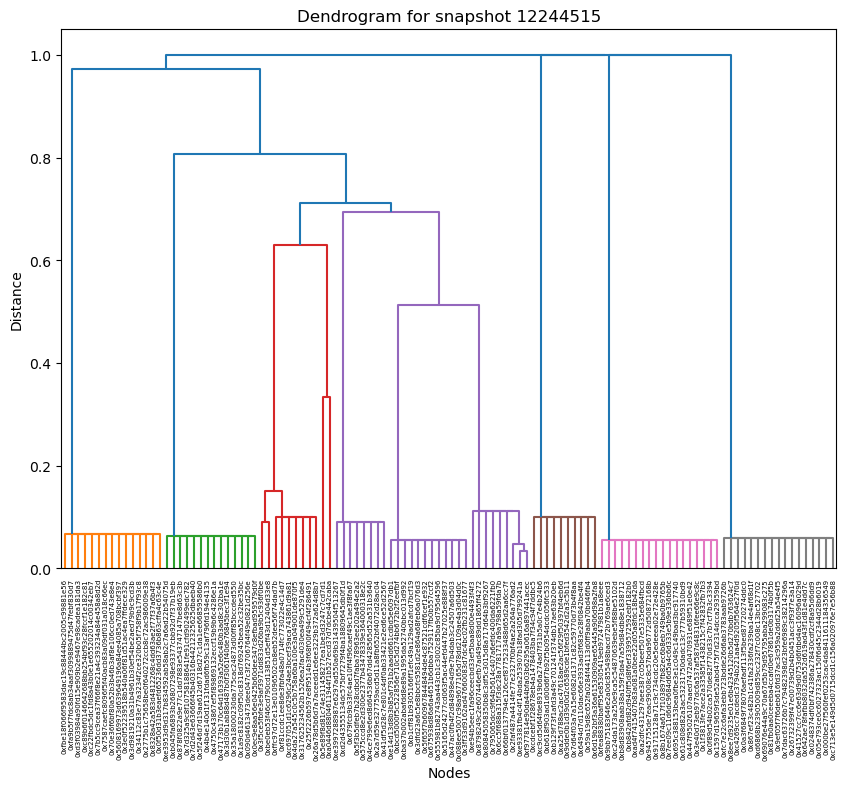

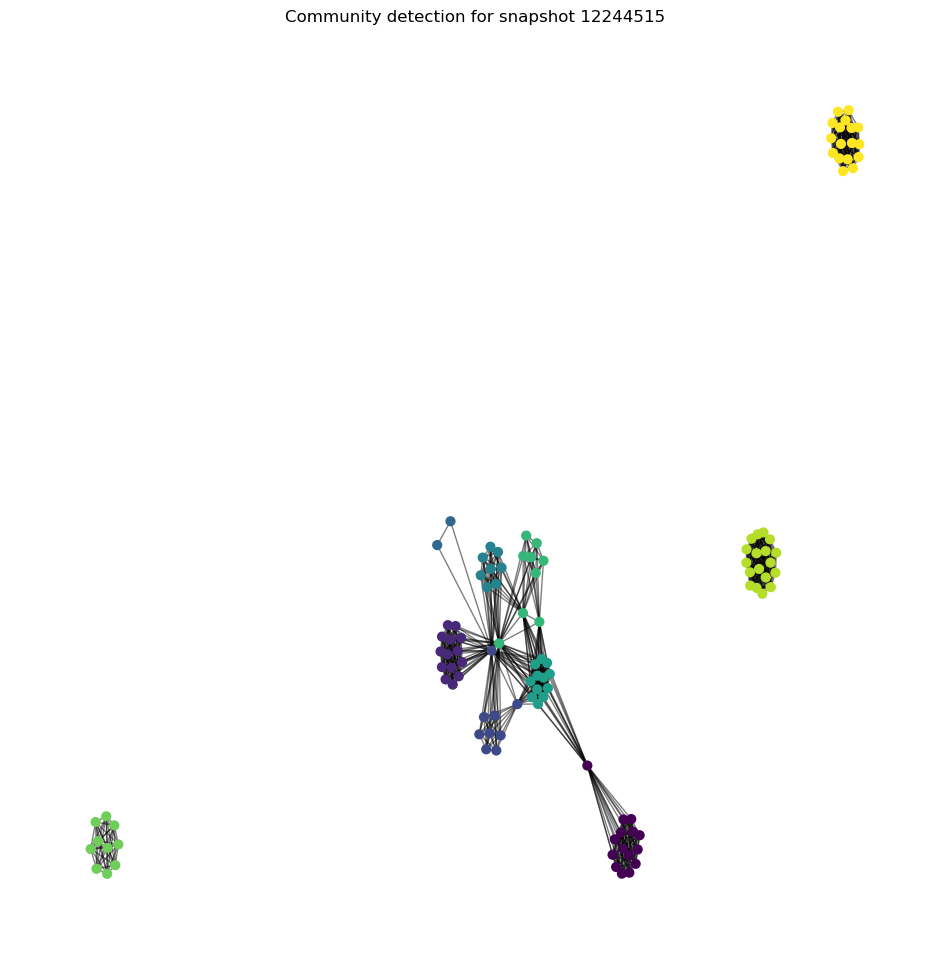

Snapshot: 12244515, Number of communities detected: 10
Community sizes for snapshot 12244515:
Community
9     18
10    17
1     15
2     14
6     12
8     10
7      9
3      9
5      8
4      2
Name: count, dtype: int64


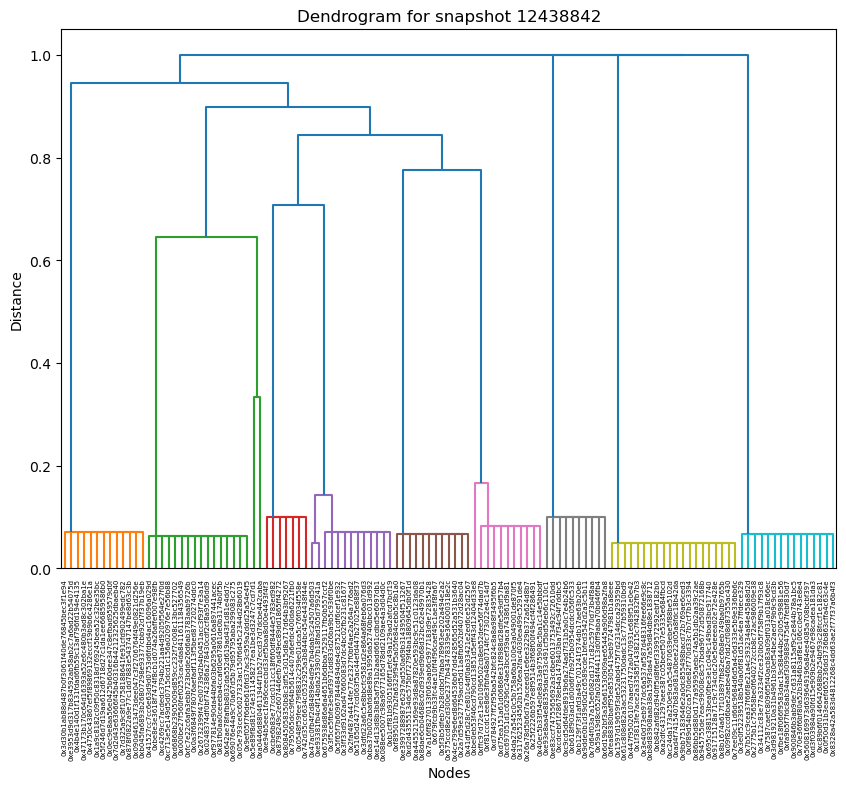

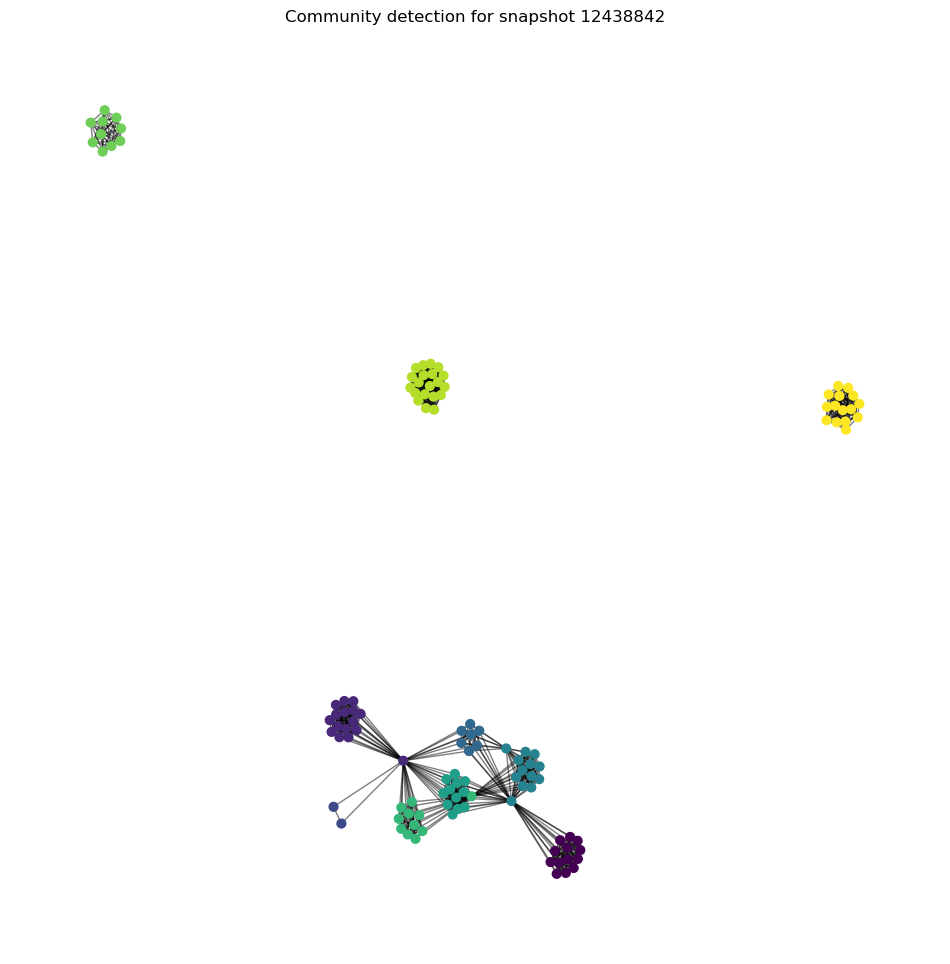

Snapshot: 12438842, Number of communities detected: 10
Community sizes for snapshot 12438842:
Community
9     20
2     16
10    15
5     13
1     13
6     12
7     11
8     10
4      7
3      2
Name: count, dtype: int64


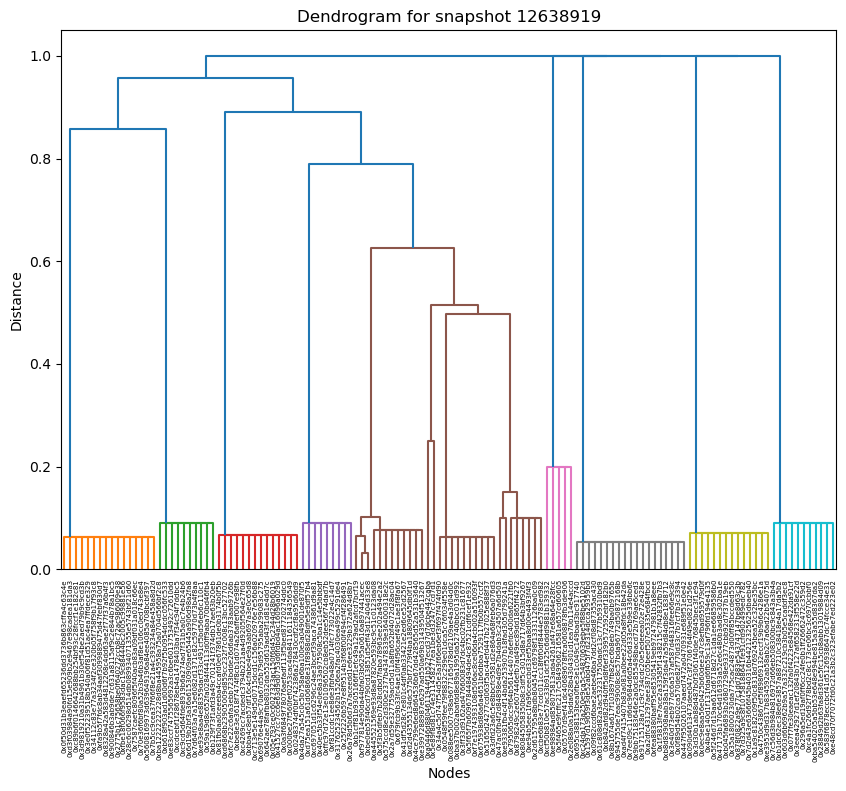

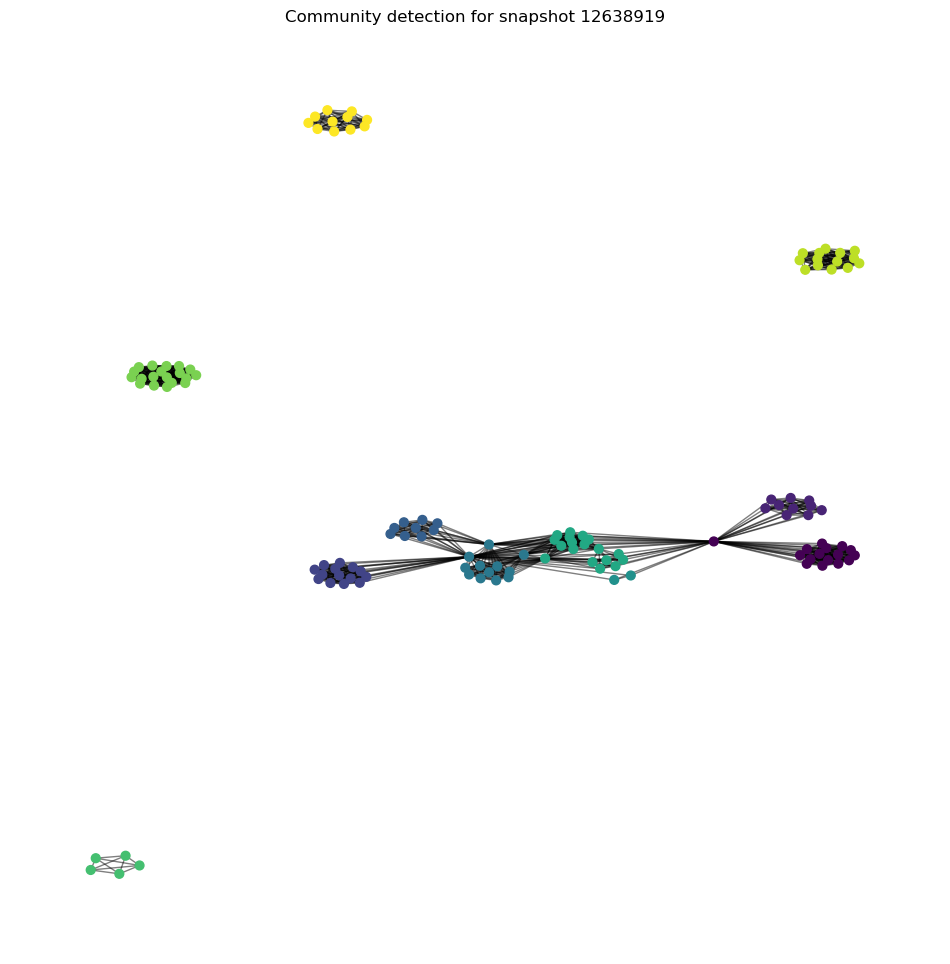

Snapshot: 12638919, Number of communities detected: 11
Community sizes for snapshot 12638919:
Community
9     19
7     18
1     16
10    14
3     14
5     12
11    11
2     10
4      9
8      5
6      2
Name: count, dtype: int64


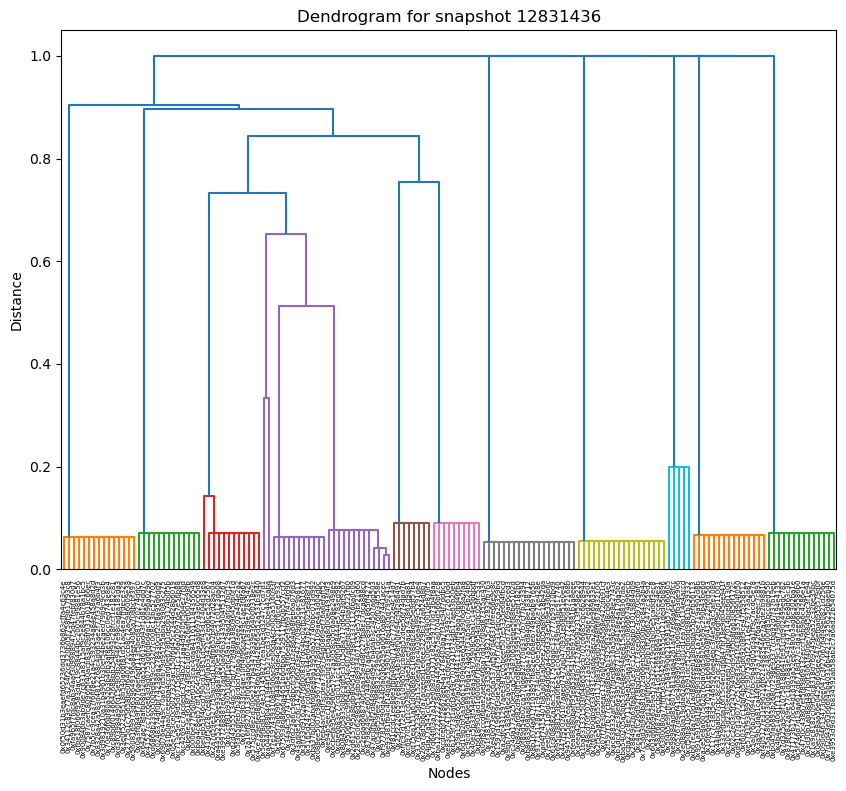

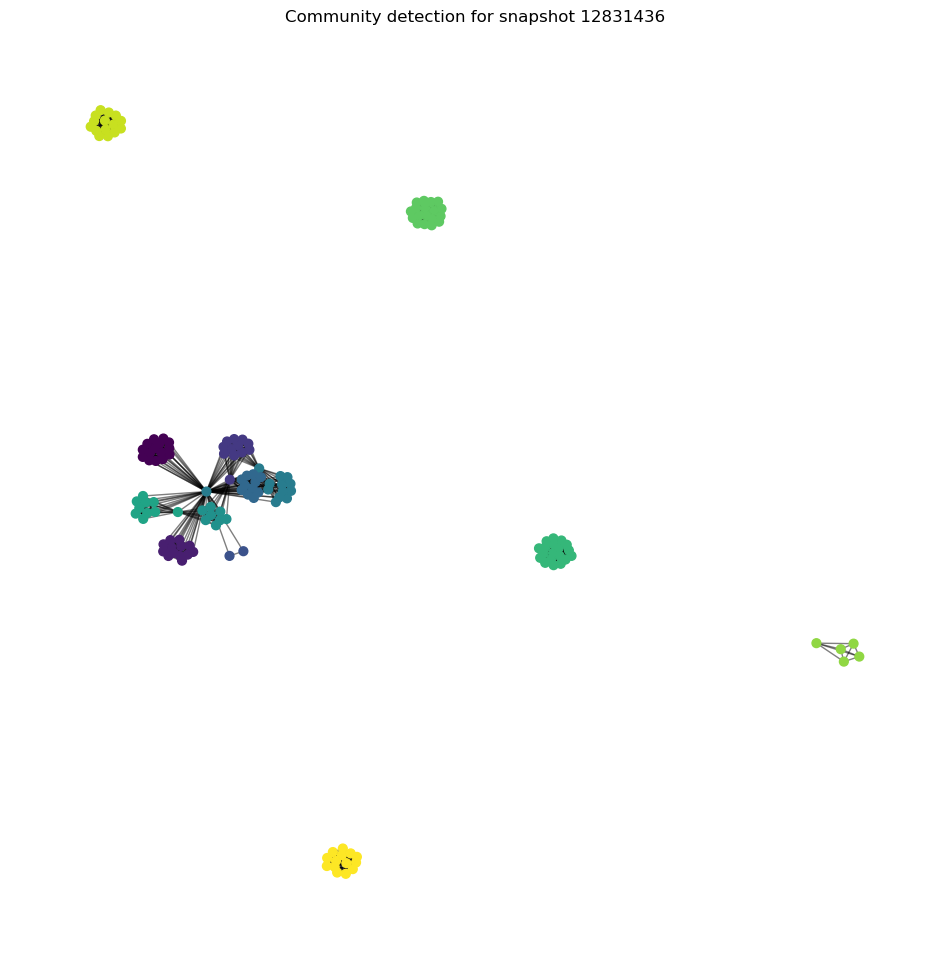

Snapshot: 12831436, Number of communities detected: 13
Community sizes for snapshot 12831436:
Community
9     19
10    18
12    15
1     15
13    14
2     13
6     13
3     12
5     11
8     10
7      8
11     5
4      2
Name: count, dtype: int64


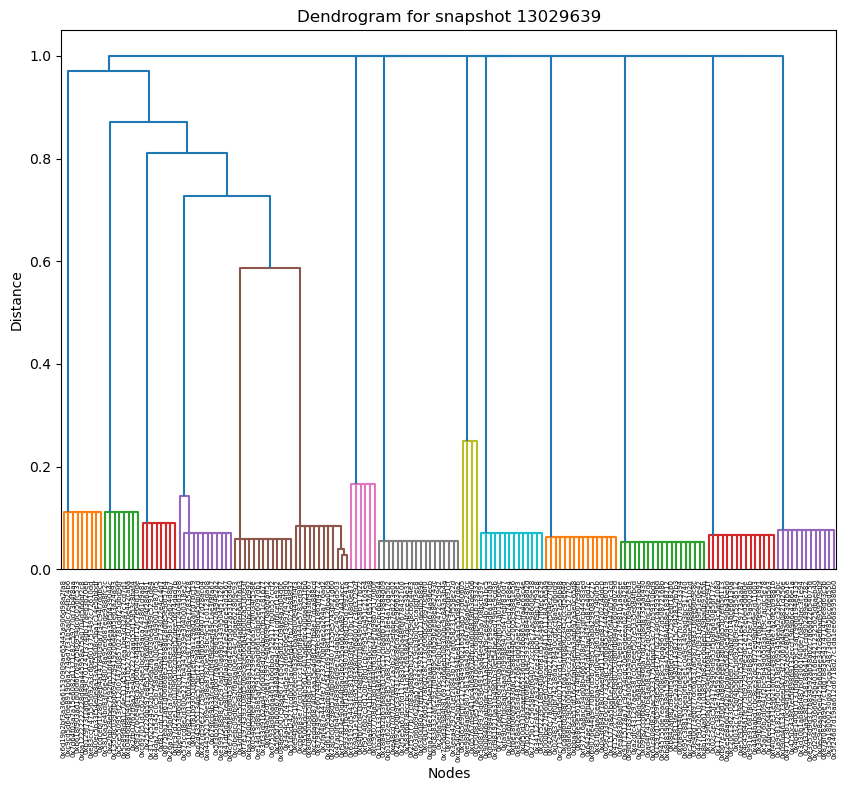

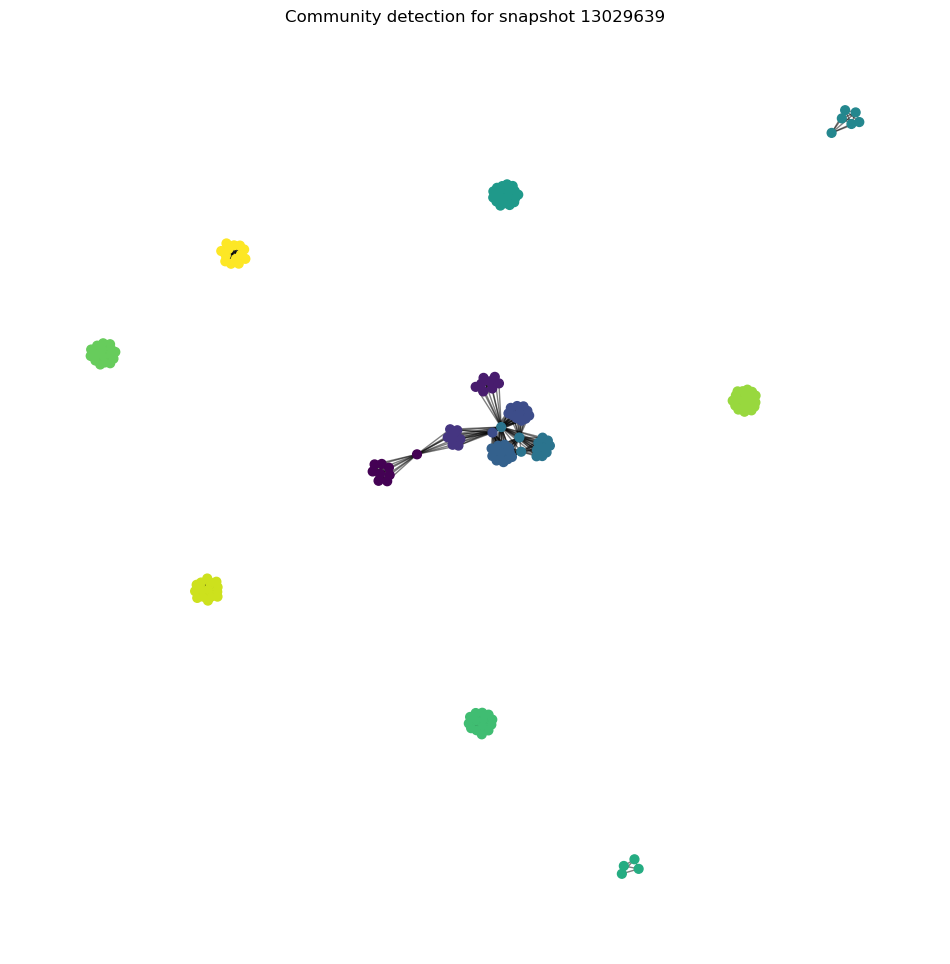

Snapshot: 13029639, Number of communities detected: 14
Community sizes for snapshot 13029639:
Community
12    19
8     18
11    16
13    15
10    14
14    13
5     13
6     12
4     12
1      9
3      8
2      8
7      6
9      4
Name: count, dtype: int64


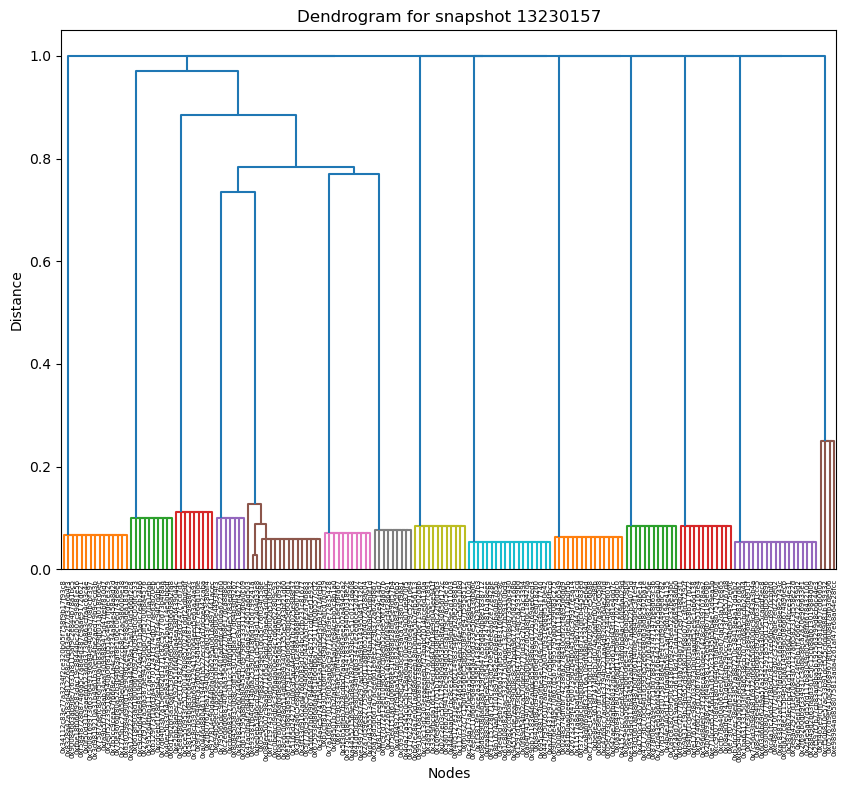

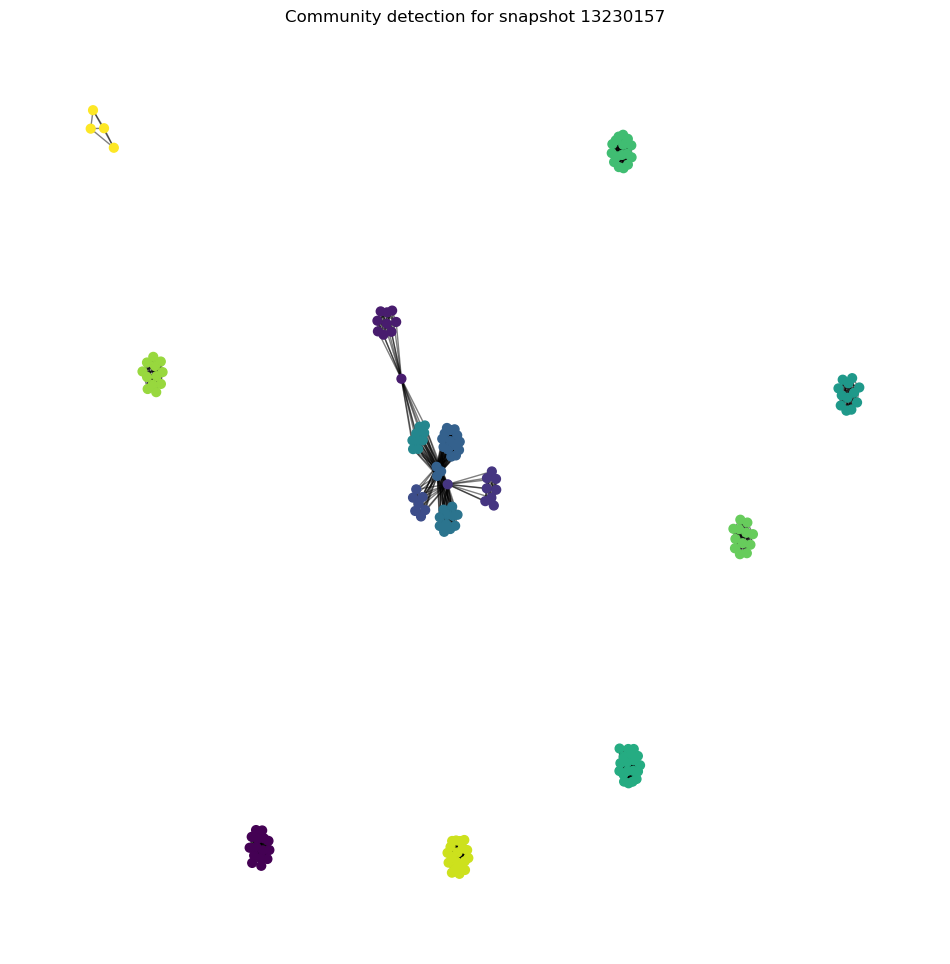

Snapshot: 13230157, Number of communities detected: 14
Community sizes for snapshot 13230157:
Community
13    19
9     19
5     17
10    16
1     15
11    12
8     12
12    12
6     11
2     10
7      9
3      9
4      7
14     4
Name: count, dtype: int64


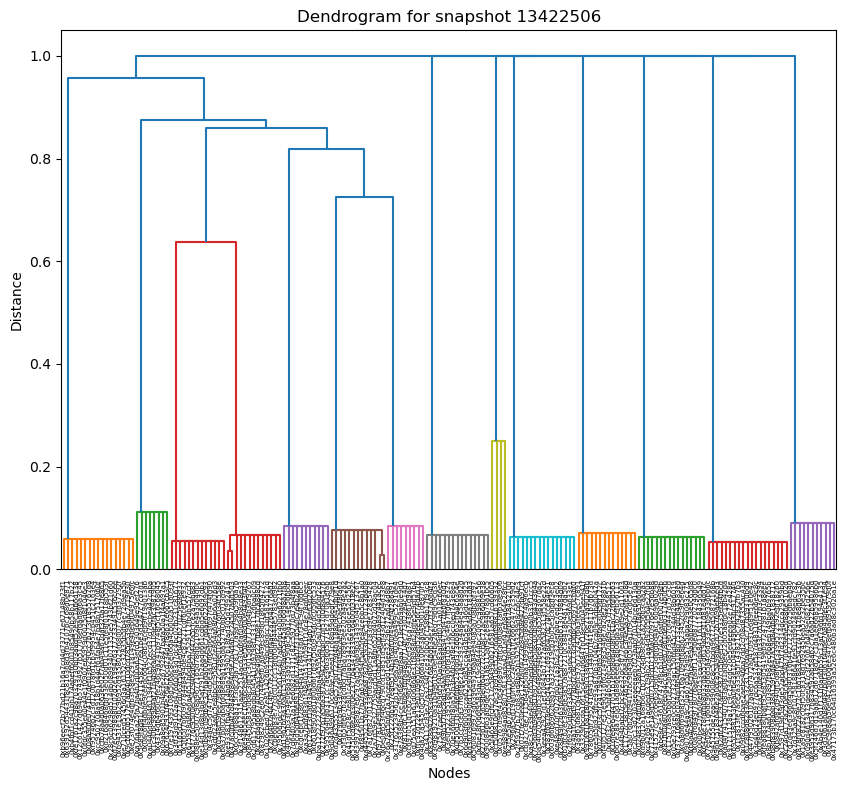

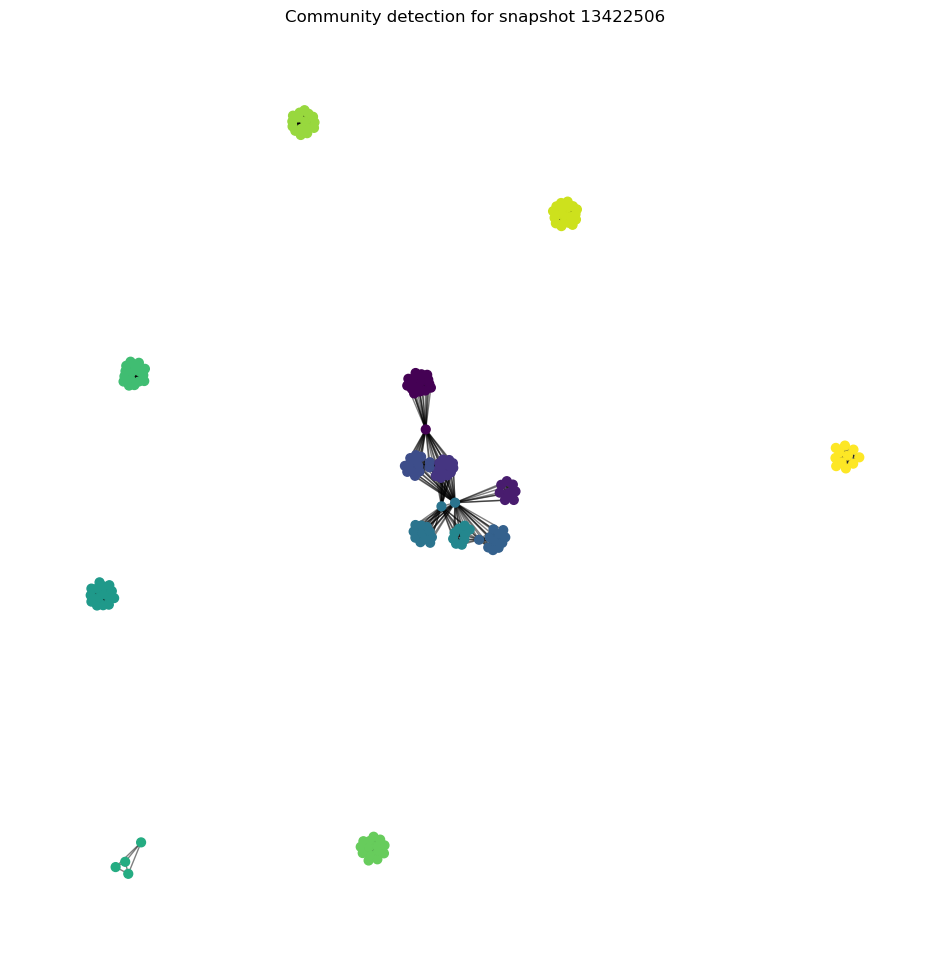

Snapshot: 13422506, Number of communities detected: 14
Community sizes for snapshot 13422506:
Community
13    19
1     17
12    16
10    16
8     15
11    14
4     13
6     13
3     13
5     11
14    11
7      9
2      8
9      4
Name: count, dtype: int64


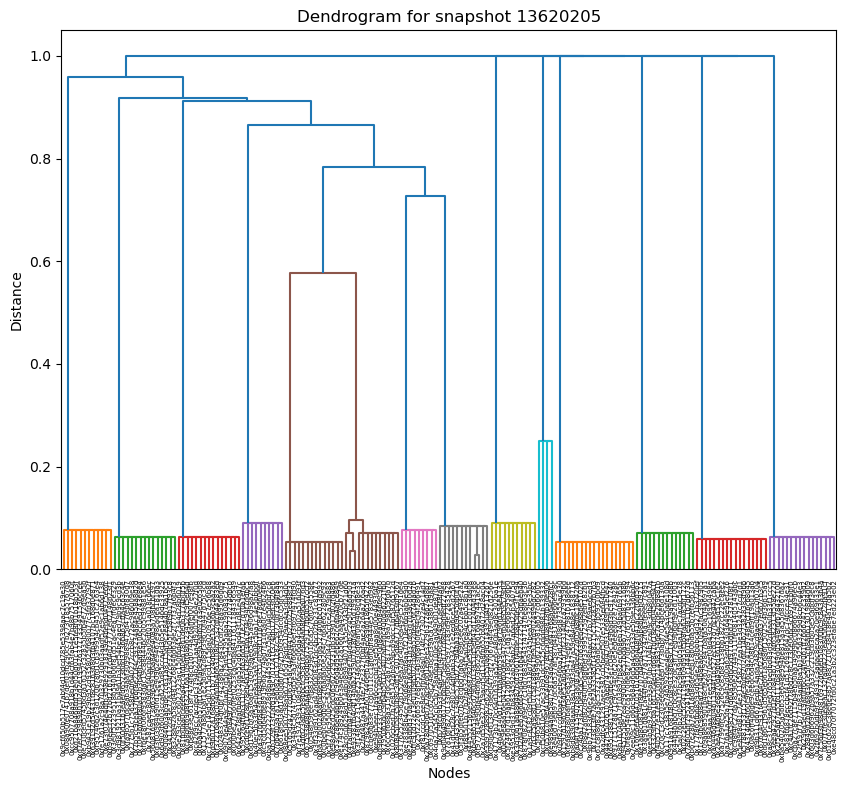

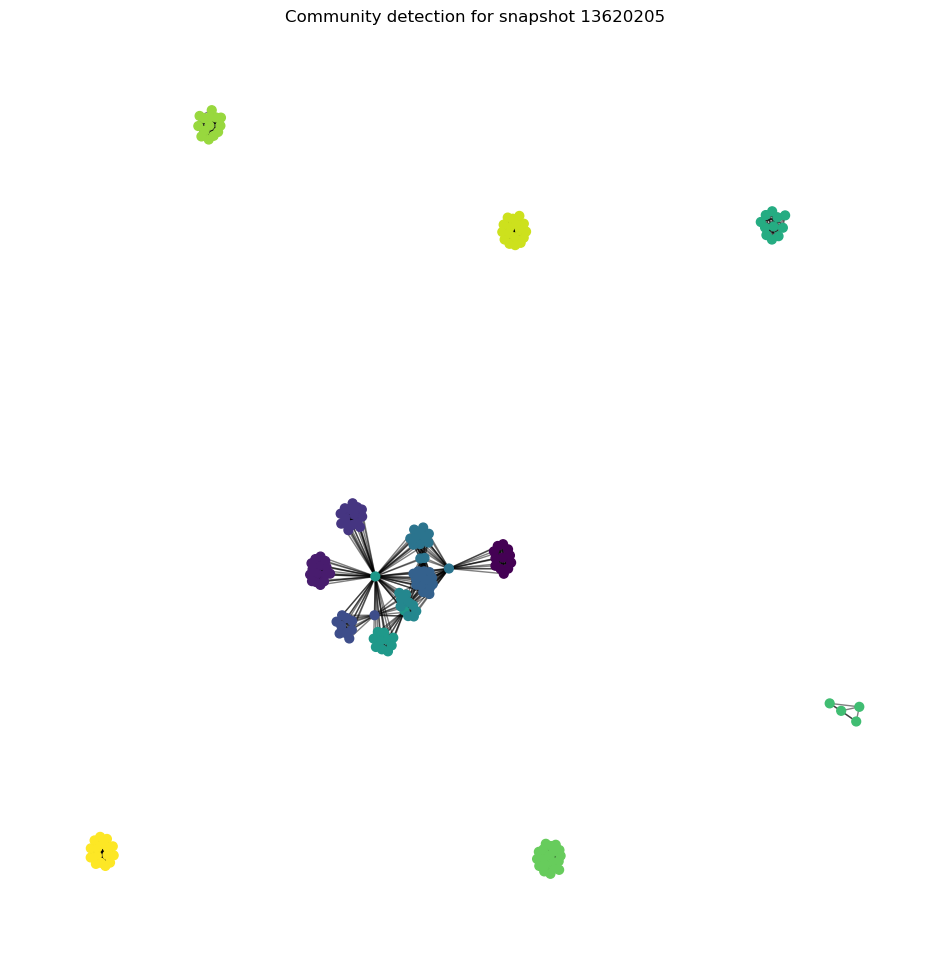

Snapshot: 13620205, Number of communities detected: 14
Community sizes for snapshot 13620205:
Community
11    19
13    17
14    16
2     15
3     15
5     14
12    14
6     13
8     12
1     12
9     11
4     10
7      9
10     4
Name: count, dtype: int64


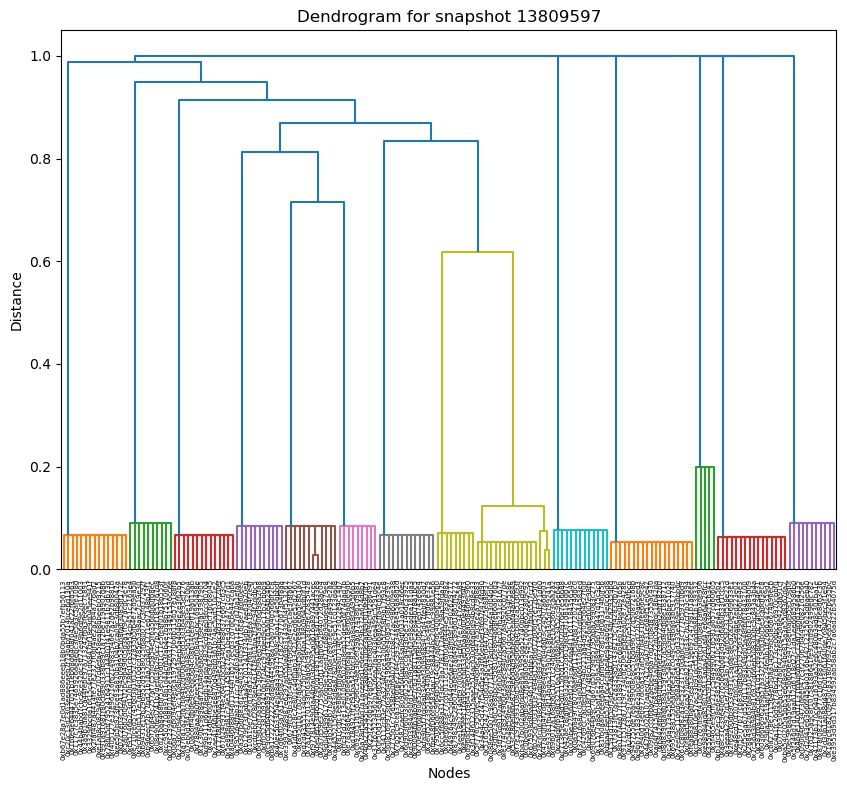

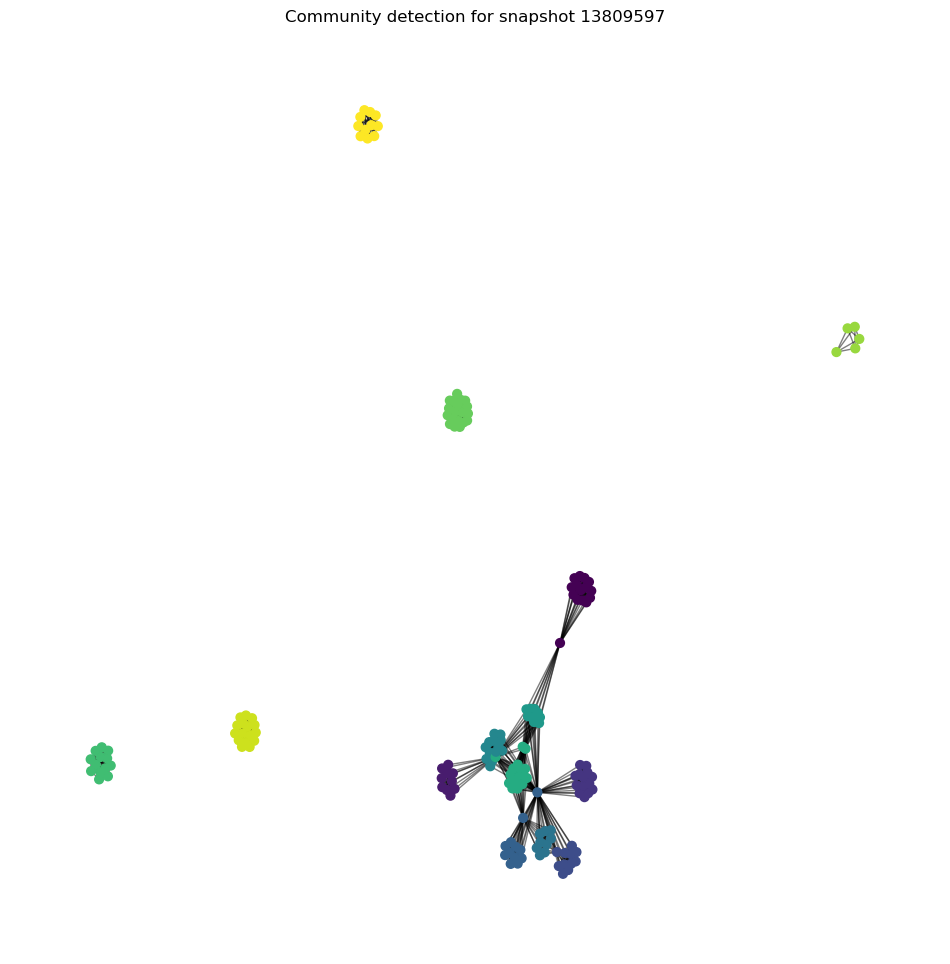

Snapshot: 13809597, Number of communities detected: 14
Community sizes for snapshot 13809597:
Community
11    19
9     17
13    16
1     15
3     14
10    13
7     13
5     12
4     11
14    11
2     10
6      9
8      9
12     5
Name: count, dtype: int64


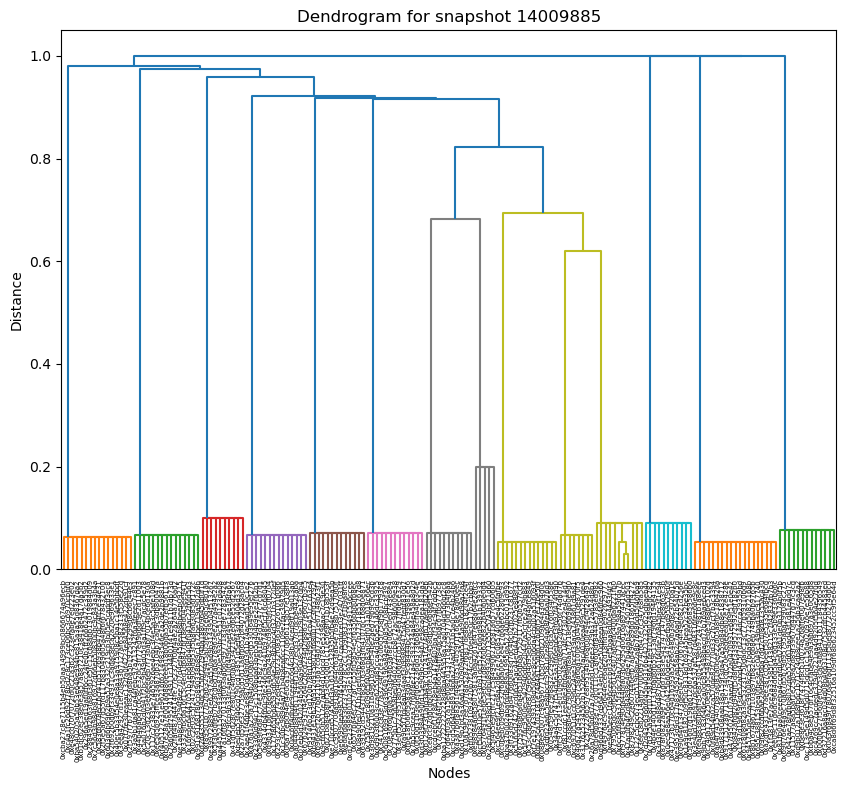

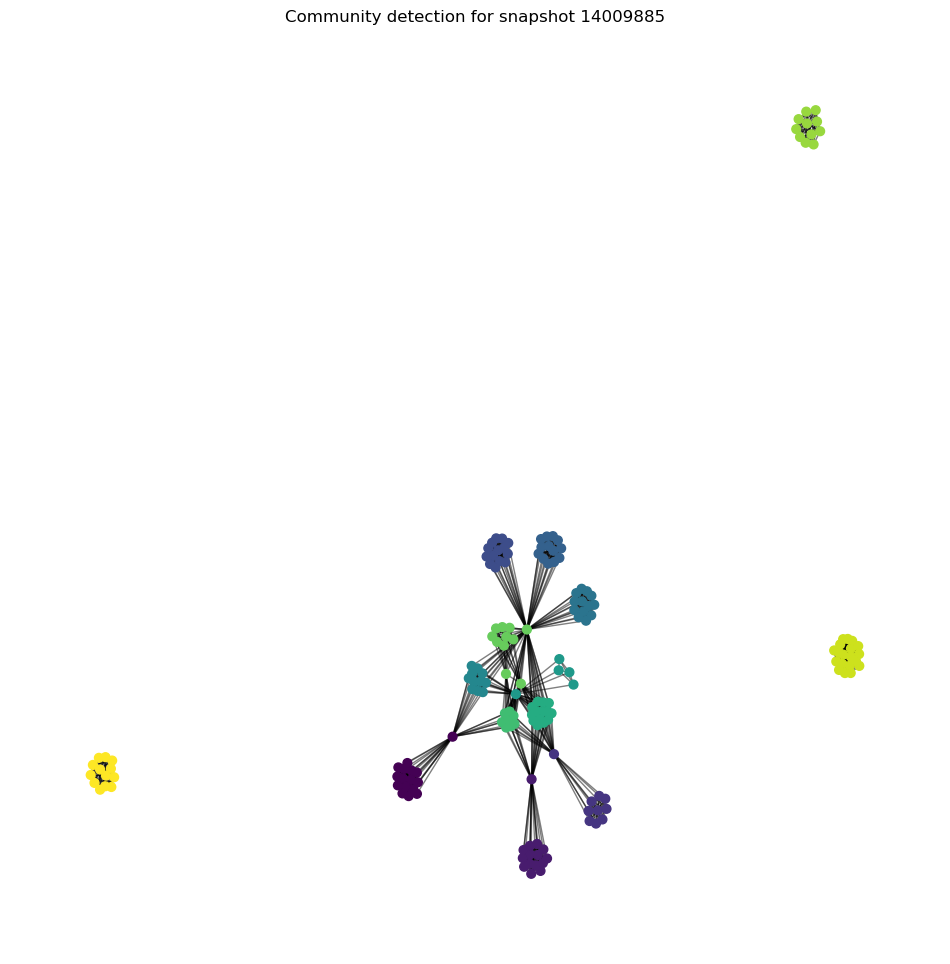

Snapshot: 14009885, Number of communities detected: 14
Community sizes for snapshot 14009885:
Community
13    19
1     16
2     15
9     14
4     14
14    13
6     13
5     13
12    11
7     11
11    11
3     10
10     8
8      5
Name: count, dtype: int64


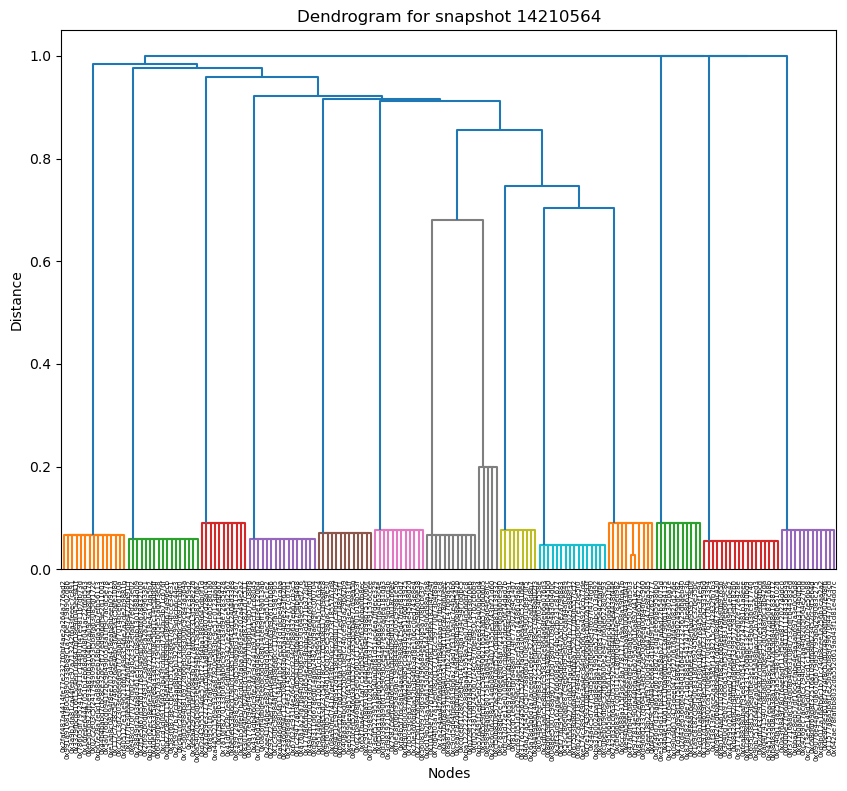

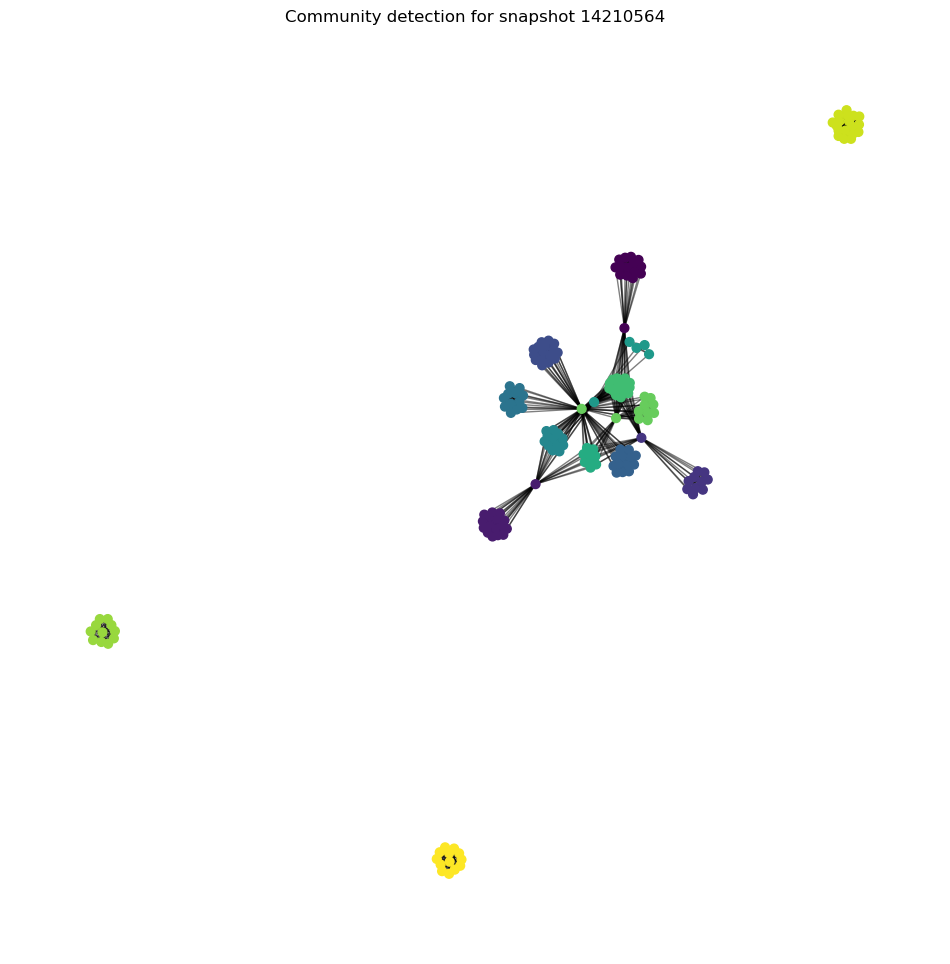

Snapshot: 14210564, Number of communities detected: 14
Community sizes for snapshot 14210564:
Community
13    18
2     17
4     16
10    16
1     15
14    13
5     13
7     12
6     12
11    11
12    11
3     11
9      9
8      5
Name: count, dtype: int64


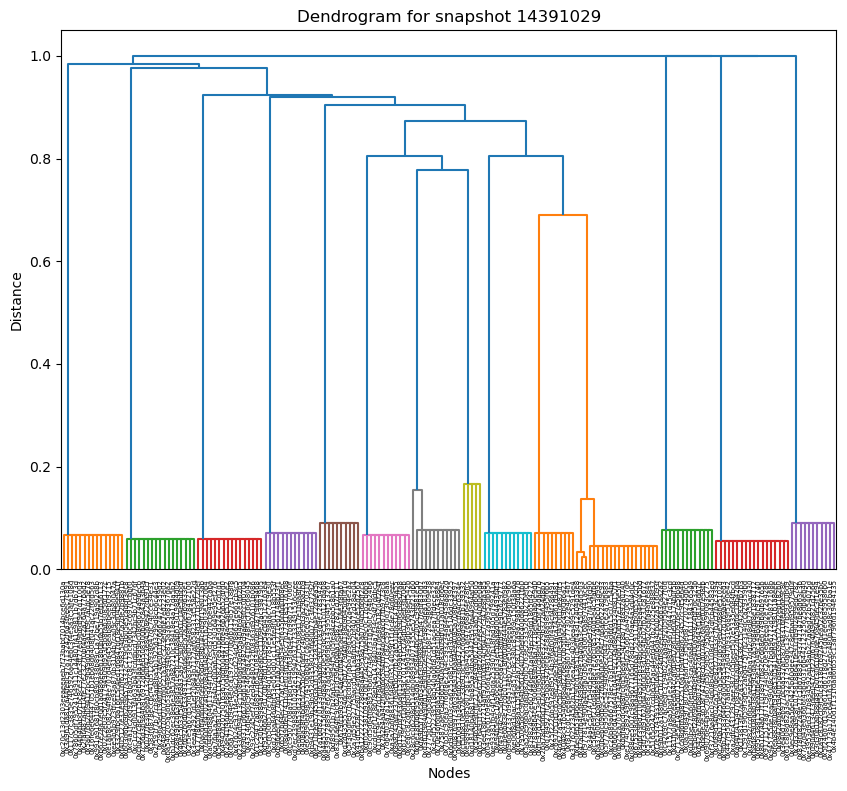

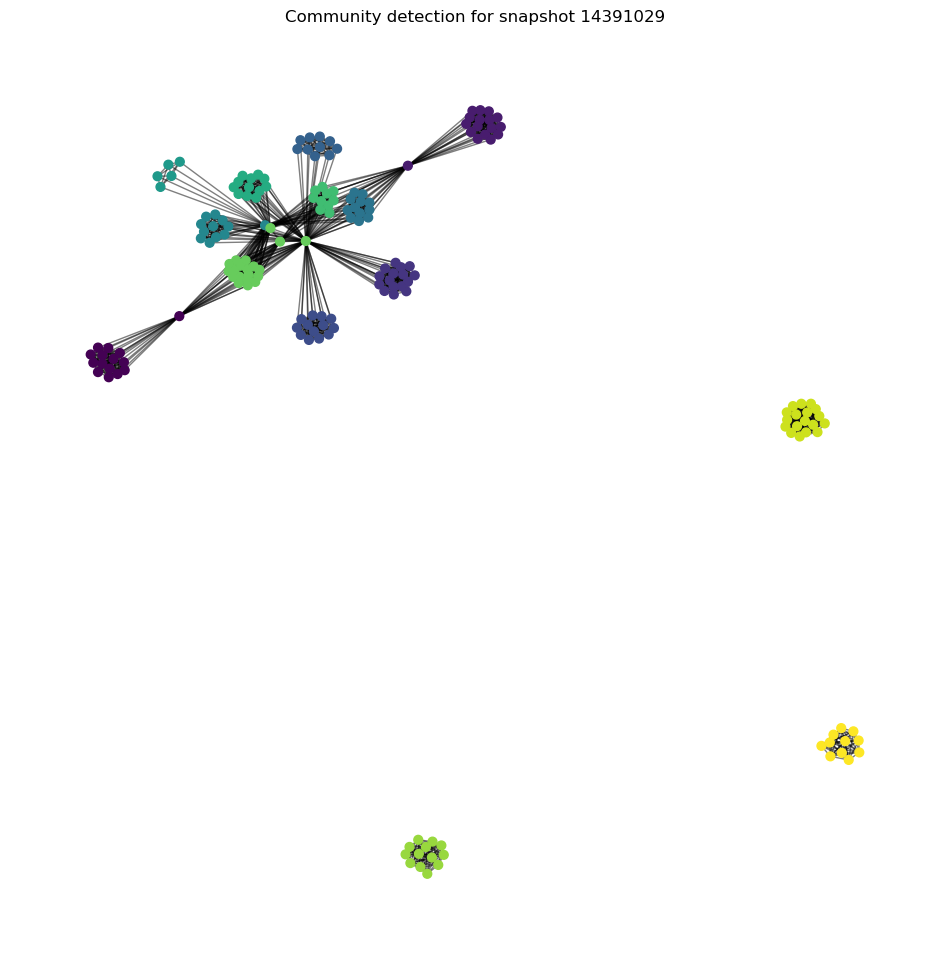

Snapshot: 14391029, Number of communities detected: 14
Community sizes for snapshot 14391029:
Community
11    20
13    18
2     17
3     16
1     15
12    13
4     13
7     12
6     12
9     12
14    11
10    10
5     10
8      5
Name: count, dtype: int64


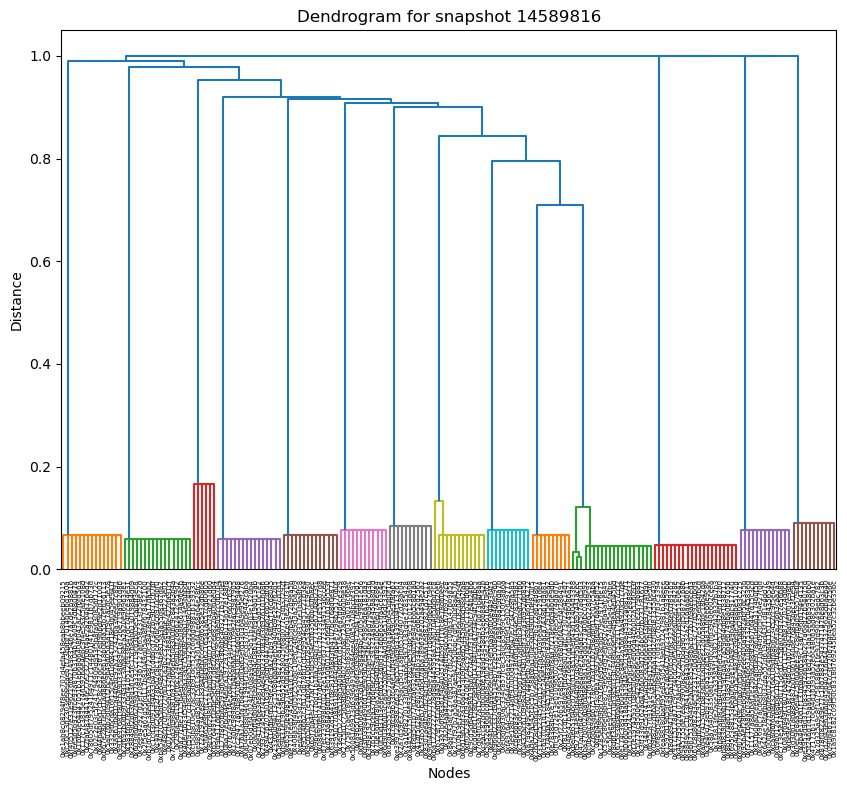

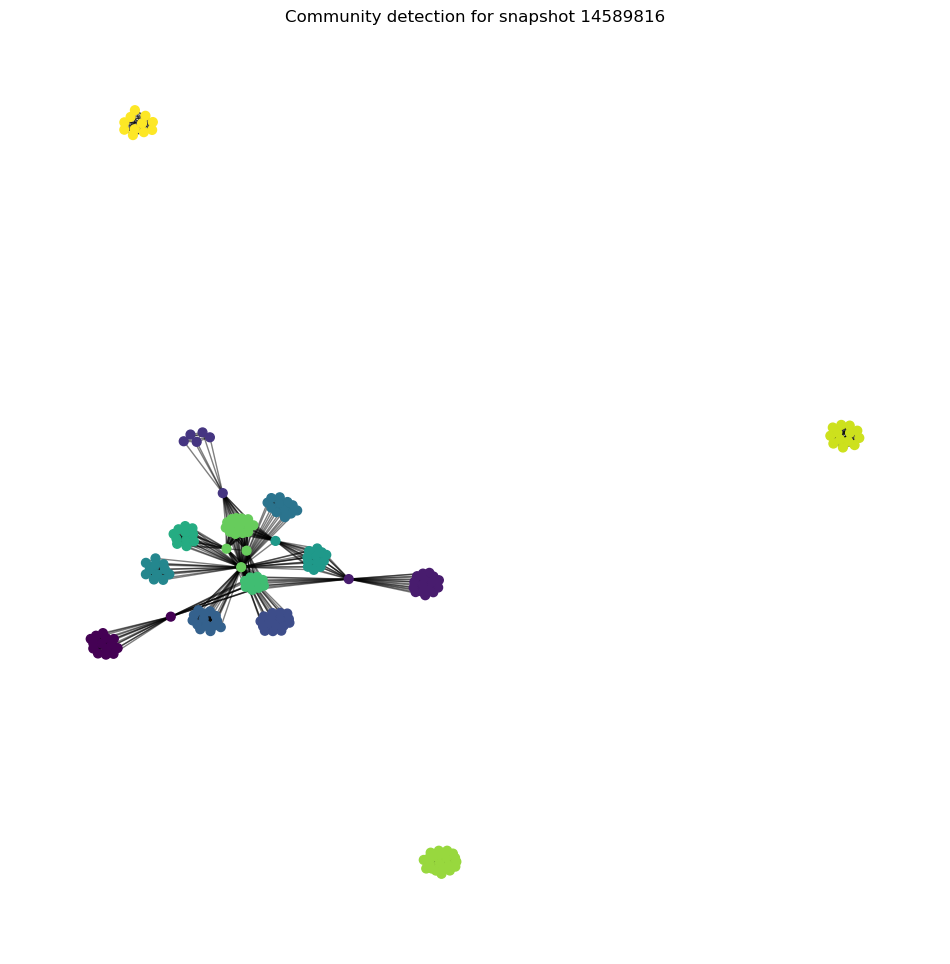

Snapshot: 14589816, Number of communities detected: 14
Community sizes for snapshot 14589816:
Community
12    21
11    20
2     17
4     16
1     15
5     14
13    13
8     13
6     12
7     11
14    11
9     11
10    10
3      6
Name: count, dtype: int64


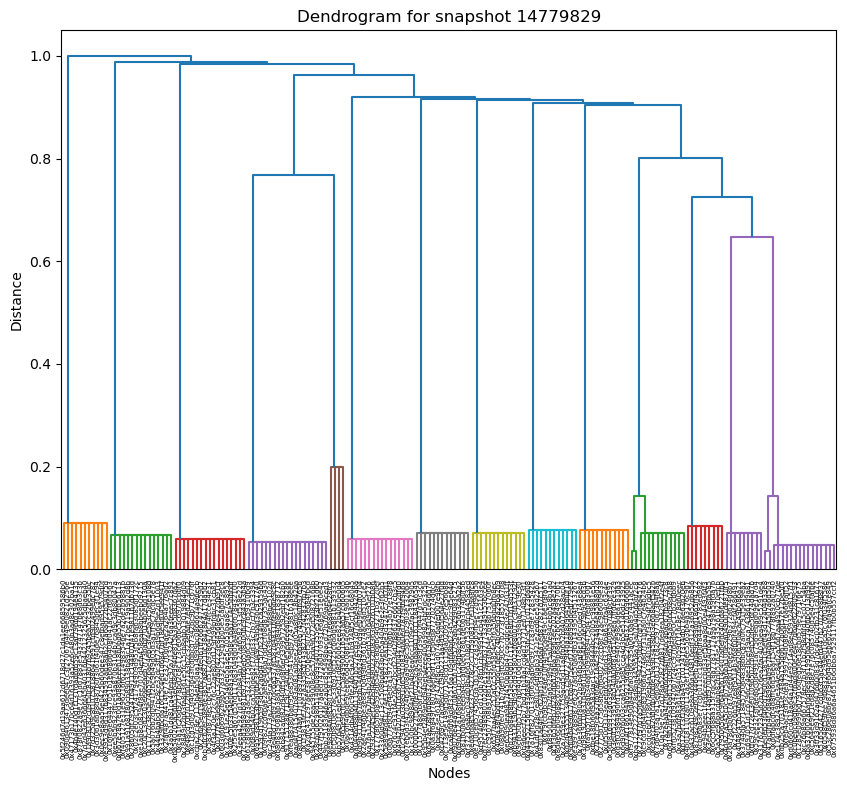

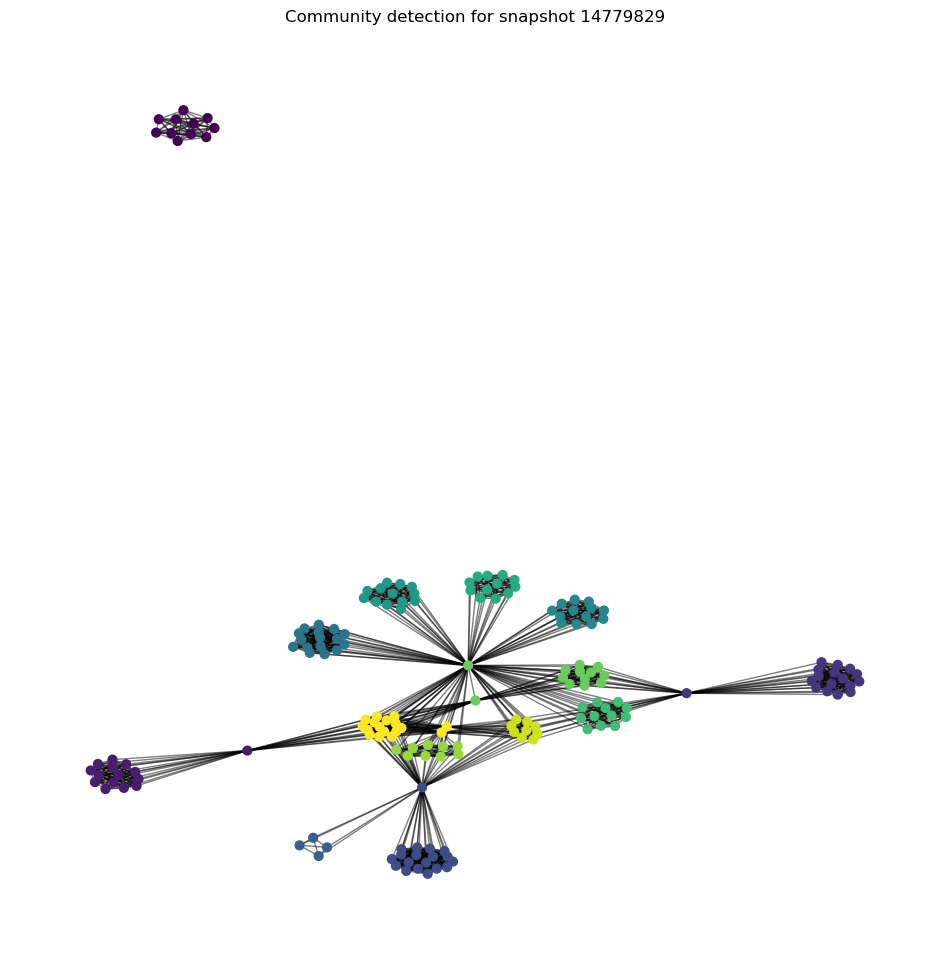

Snapshot: 14779829, Number of communities detected: 14
Community sizes for snapshot 14779829:
Community
4     19
3     17
14    17
6     16
2     15
11    13
7     13
8     13
10    12
9     12
1     11
13     9
12     9
5      4
Name: count, dtype: int64


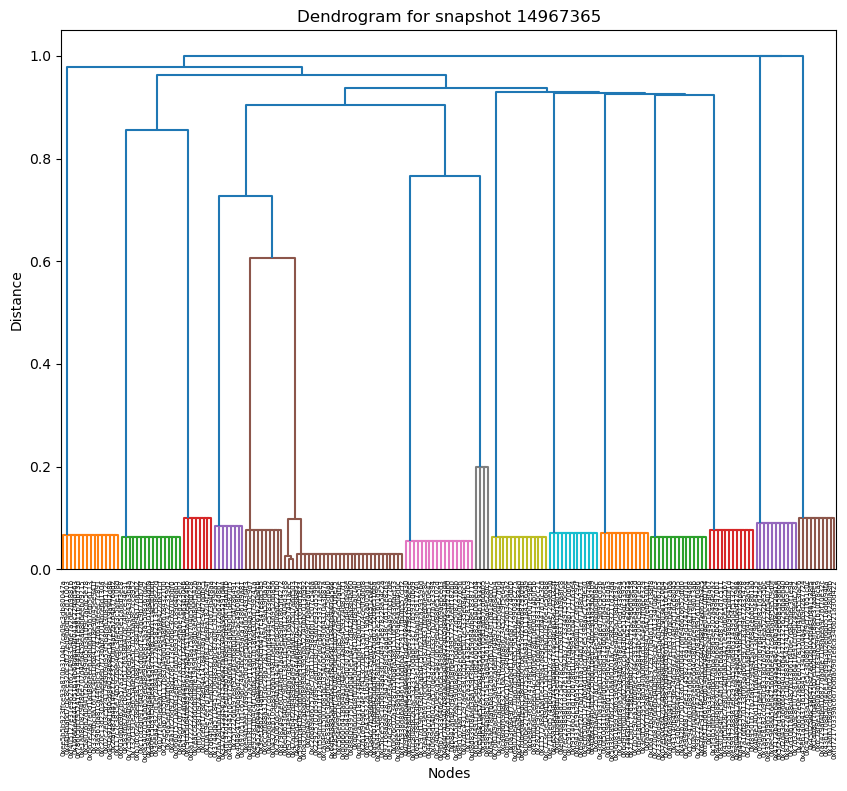

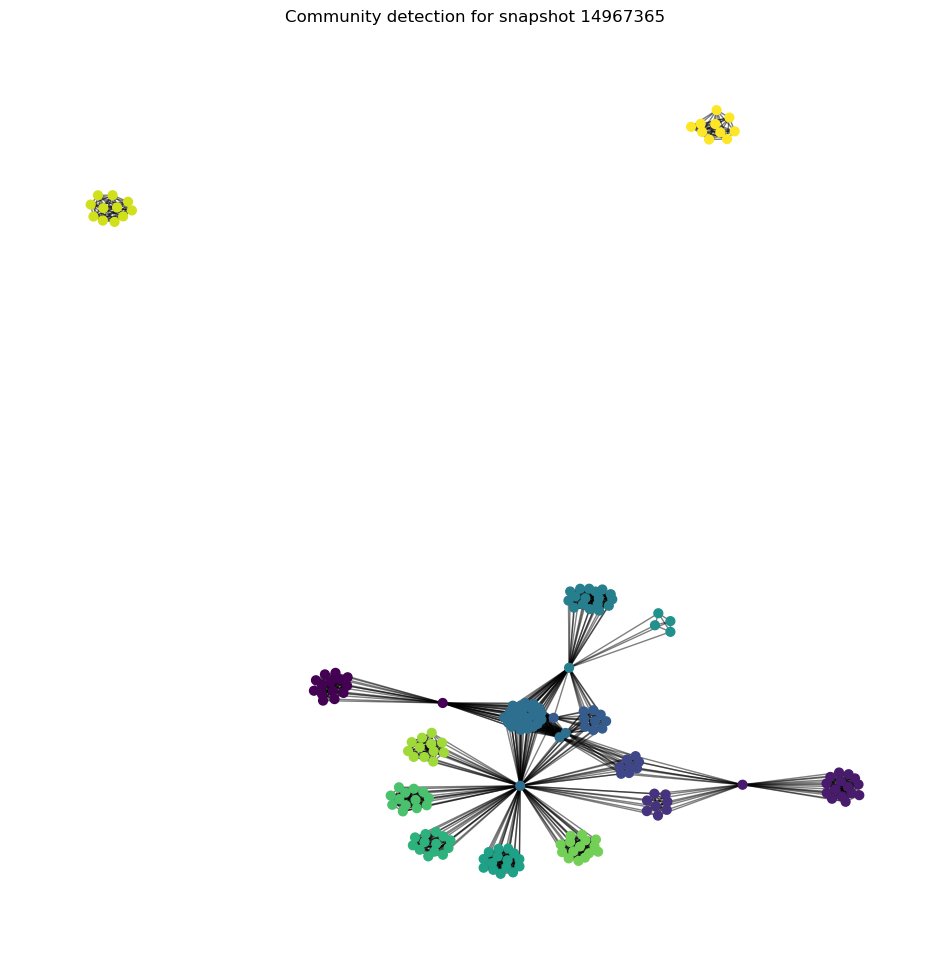

Snapshot: 14967365, Number of communities detected: 15
Community sizes for snapshot 14967365:
Community
6     31
7     18
2     16
9     15
1     15
12    15
11    13
10    13
13    12
14    11
5     10
15    10
4      8
3      8
8      4
Name: count, dtype: int64
Community detection and analysis complete.


In [28]:
import os
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.spatial.distance import squareform
from sklearn.metrics import pairwise_distances
from networkx.algorithms.community import modularity
from dotenv import load_dotenv

# Load environment variables from .env file (if needed for other variables)
load_dotenv()

# Set the input directory directly to the local folder where the graphs are stored
input_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'

# Check if the input directory exists
if not os.path.exists(input_directory):
    raise FileNotFoundError(f"Input directory does not exist: {input_directory}")

print(f"Input directory is set to: {input_directory}")

# Function to load graphs from snapshots
def load_wallet_graphs_from_snapshots(df_snapshots, input_directory):
    graphs = {}
    dates = {}
    missing_snapshots = []
    
    for index, row in df_snapshots.iterrows():
        snapshot = row['Block Height']
        date = row['Date'].strftime('%Y-%m-%d')  # Format date as string
        dates[snapshot] = date
        file_path = os.path.join(input_directory, f"validated_wallet_projection_graph_{snapshot}.graphml")
        
        print(f"Checking file: {file_path}")  # Debug print

        if os.path.exists(file_path):
            graph = nx.read_graphml(file_path)
            graphs[snapshot] = graph
            print(f"Loaded graph for snapshot {snapshot}")
        else:
            print(f"Graph file for snapshot {snapshot} does not exist at {file_path}")
            missing_snapshots.append(snapshot)
    
    return graphs, dates, missing_snapshots

# Function to calculate the topological overlap matrix
def calculate_topological_overlap(graph):
    nodes = list(graph.nodes())
    num_nodes = len(nodes)
    overlap_matrix = np.zeros((num_nodes, num_nodes))
    
    for i, node_i in enumerate(nodes):
        for j, node_j in enumerate(nodes):
            if i >= j:
                continue
            neighbors_i = set(graph.neighbors(node_i))
            neighbors_j = set(graph.neighbors(node_j))
            common_neighbors = neighbors_i & neighbors_j
            num_common_neighbors = len(common_neighbors)
            
            if graph.has_edge(node_i, node_j):
                num_common_neighbors += 1
            
            min_degree = min(graph.degree[node_i], graph.degree[node_j])
            overlap_matrix[i, j] = num_common_neighbors / (min_degree + 1)
            overlap_matrix[j, i] = overlap_matrix[i, j]
    
    return overlap_matrix, nodes

# Function to perform hierarchical clustering and visualize results
def detect_and_visualize_communities(graph, snapshot, output_directory):
    # Calculate the topological overlap matrix
    overlap_matrix, nodes = calculate_topological_overlap(graph)
    
    # Convert the overlap matrix to a distance matrix
    dist_matrix = 1 - overlap_matrix
    np.fill_diagonal(dist_matrix, 0)  # Ensure the diagonal is zero
    dist_matrix = squareform(dist_matrix)
    
    # Perform hierarchical clustering
    Z = linkage(dist_matrix, method='average')
    
    # Plot the dendrogram
    plt.figure(figsize=(10, 7))
    dendrogram(Z, labels=nodes)
    plt.title(f"Dendrogram for snapshot {snapshot}")
    plt.xlabel('Nodes')
    plt.ylabel('Distance')
    plt.savefig(os.path.join(output_directory, f'dendrogram_snapshot_{snapshot}.png'))
    plt.show()
    
    # Determine the clusters (communities)
    max_d = 0.5  # This threshold can be adjusted based on the dendrogram
    clusters = fcluster(Z, max_d, criterion='distance')
    
    # Create a partition dictionary
    partition = {nodes[i]: clusters[i] for i in range(len(nodes))}
    
    # Draw the graph with communities
    pos = nx.spring_layout(graph)
    cmap = plt.get_cmap('viridis')
    plt.figure(figsize=(12, 12))
    
    # Draw nodes with community colors
    nx.draw_networkx_nodes(graph, pos, partition.keys(), node_size=40, 
                           cmap=cmap, node_color=list(partition.values()))
    nx.draw_networkx_edges(graph, pos, alpha=0.5)
    
    plt.title(f"Community detection for snapshot {snapshot}")
    plt.axis('off')
    plt.savefig(os.path.join(output_directory, f'community_snapshot_{snapshot}.png'))
    plt.show()
    
    return partition

# Assuming df_snapshots is already loaded
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
df_snapshots = pd.read_csv(os.path.join(data_directory, 'snapshot_selection.csv'))
df_snapshots['Date'] = pd.to_datetime(df_snapshots['Date'])  # Ensure dates are in datetime format

# Load the graphs
graphs, dates, missing_snapshots = load_wallet_graphs_from_snapshots(df_snapshots, input_directory)

# Directory to save community detection visualizations
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/output'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Perform community detection on loaded graphs
for snapshot, graph in graphs.items():
    partition = detect_and_visualize_communities(graph, snapshot, output_directory)
    
    # Analyze the partition
    num_communities = len(set(partition.values()))
    print(f"Snapshot: {snapshot}, Number of communities detected: {num_communities}")
    
    # Save partition information
    partition_df = pd.DataFrame(list(partition.items()), columns=['Node', 'Community'])
    partition_df.to_csv(os.path.join(output_directory, f'partition_snapshot_{snapshot}.csv'), index=False)
    
    # Analyze community structure
    community_sizes = partition_df['Community'].value_counts()
    print(f"Community sizes for snapshot {snapshot}:")
    print(community_sizes)
    
    # Save community sizes to a CSV file
    community_sizes.to_csv(os.path.join(output_directory, f'community_sizes_snapshot_{snapshot}.csv'))

print("Community detection and analysis complete.")


## Time tracking
#### hierarchical clustering

/Users/liamk/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


Input directory is set to: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Graph file for snapshot 7962629 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Graph file for snapshot 8155117 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8354625.graphml
Graph file for snapshot 8354625 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_gra

Loaded graph for snapshot 14589816
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14779829.graphml
Loaded graph for snapshot 14779829
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14967365.graphml
Loaded graph for snapshot 14967365


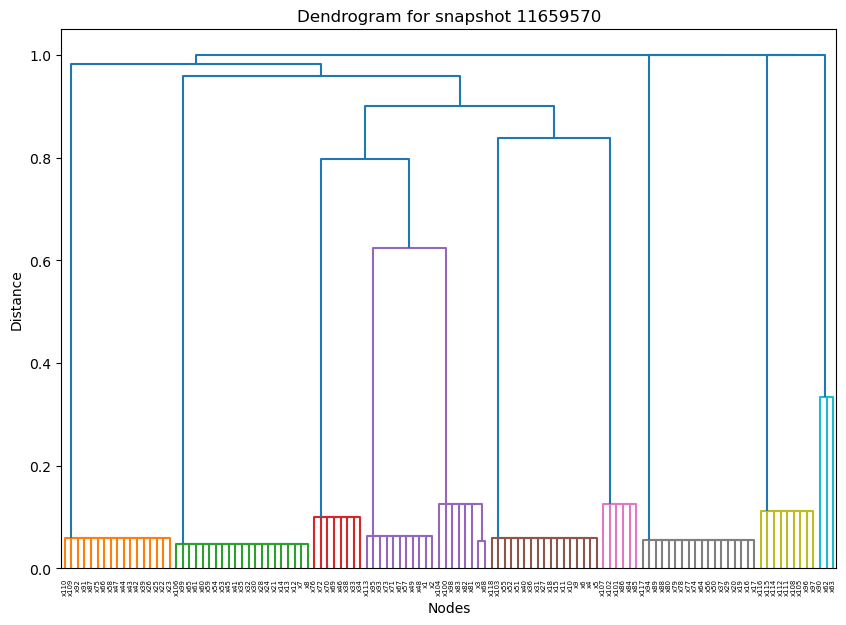

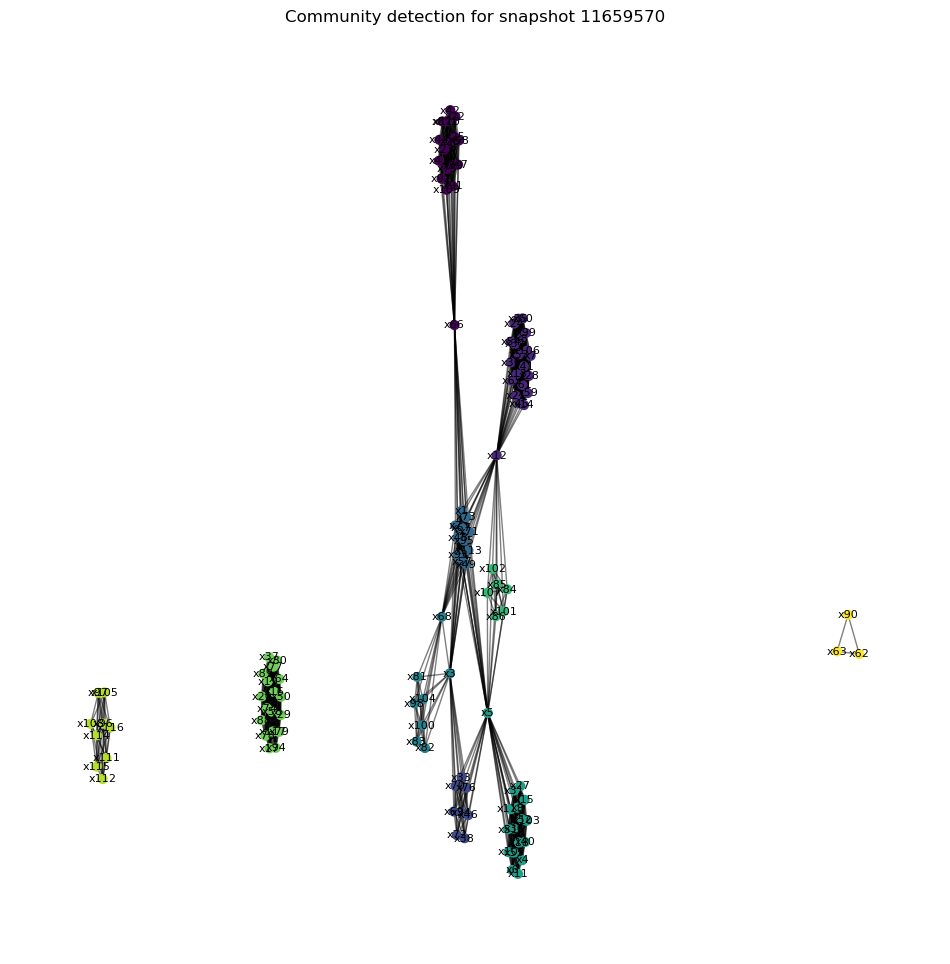

Snapshot: 11659570, Number of communities detected: 10
Community sizes for snapshot 11659570:
Community
2     21
8     18
6     17
1     17
4     11
9      9
5      8
3      8
7      6
10     3
Name: count, dtype: int64


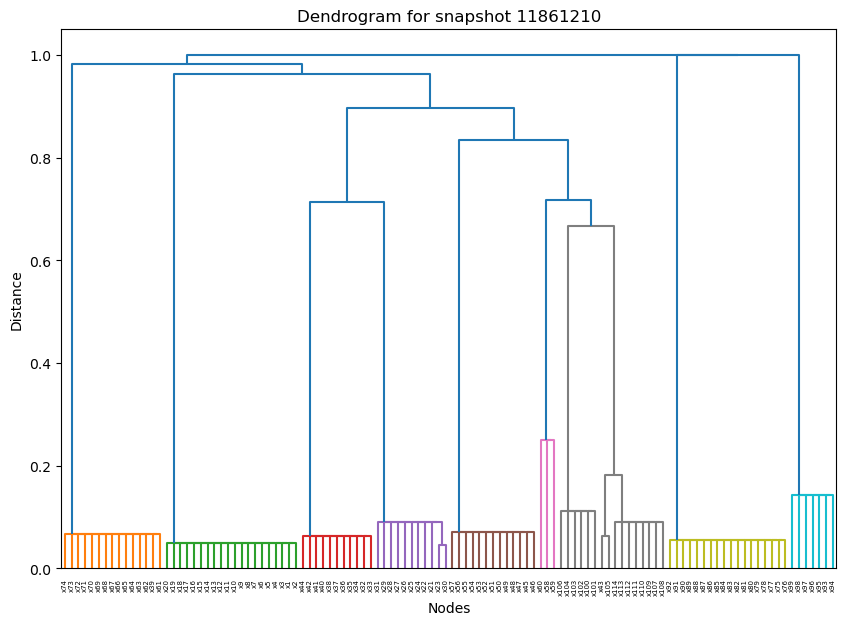

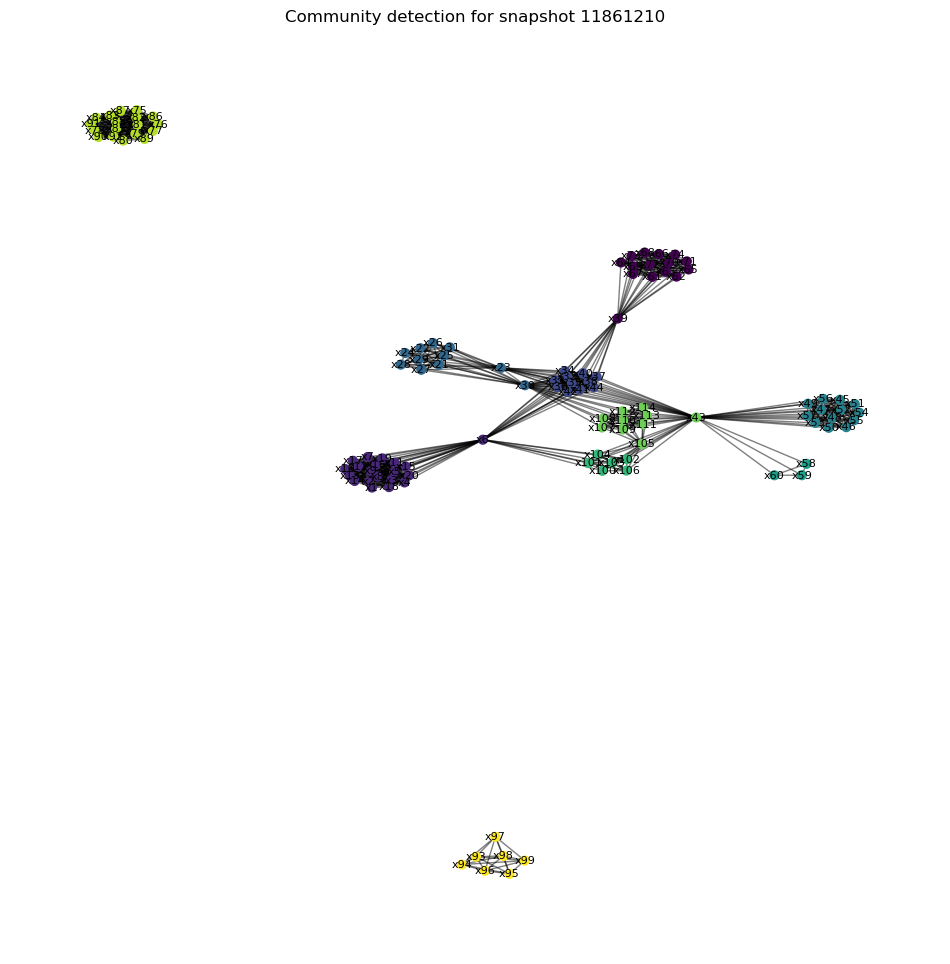

Snapshot: 11861210, Number of communities detected: 10
Community sizes for snapshot 11861210:
Community
2     20
9     18
1     15
5     13
4     11
3     11
8     10
10     7
7      6
6      3
Name: count, dtype: int64


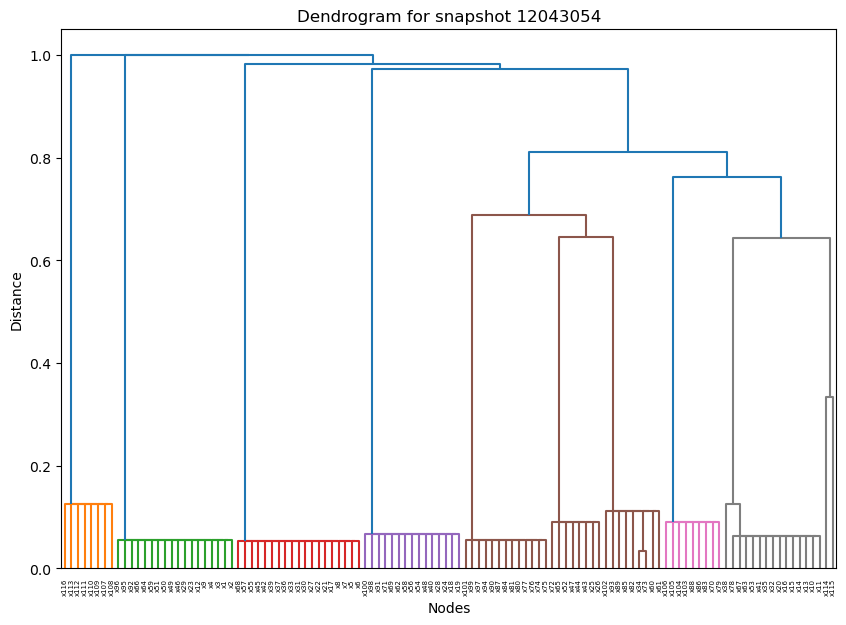

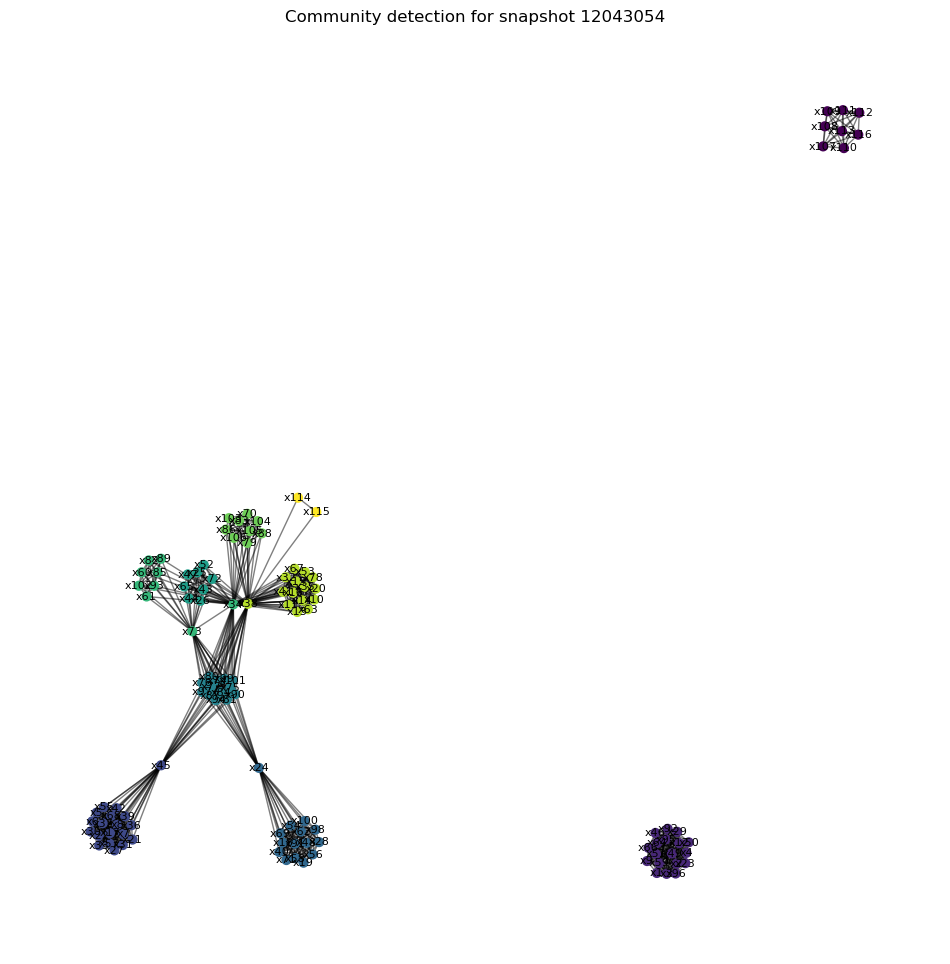

Snapshot: 12043054, Number of communities detected: 10
Community sizes for snapshot 12043054:
Community
3     19
2     18
9     15
4     15
5     13
7      9
8      9
6      8
1      8
10     2
Name: count, dtype: int64


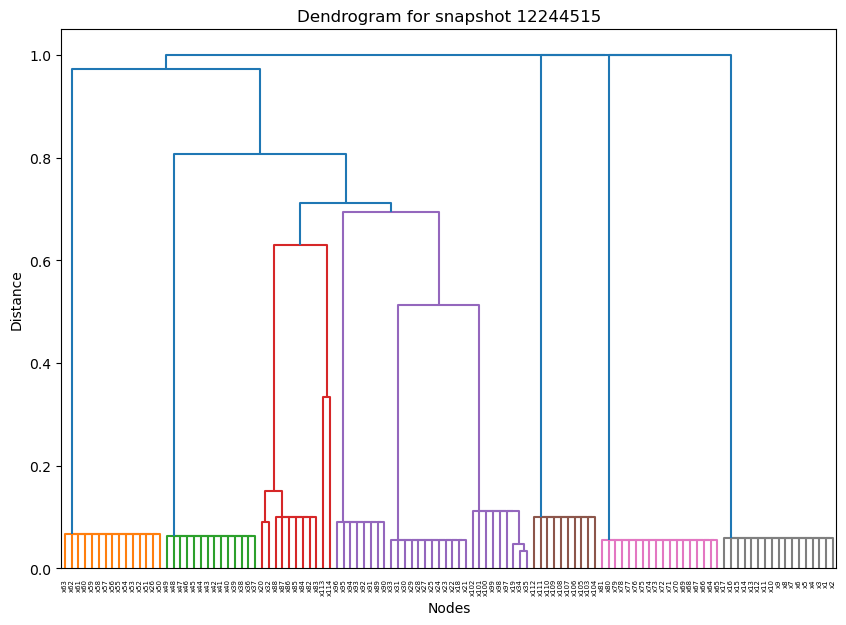

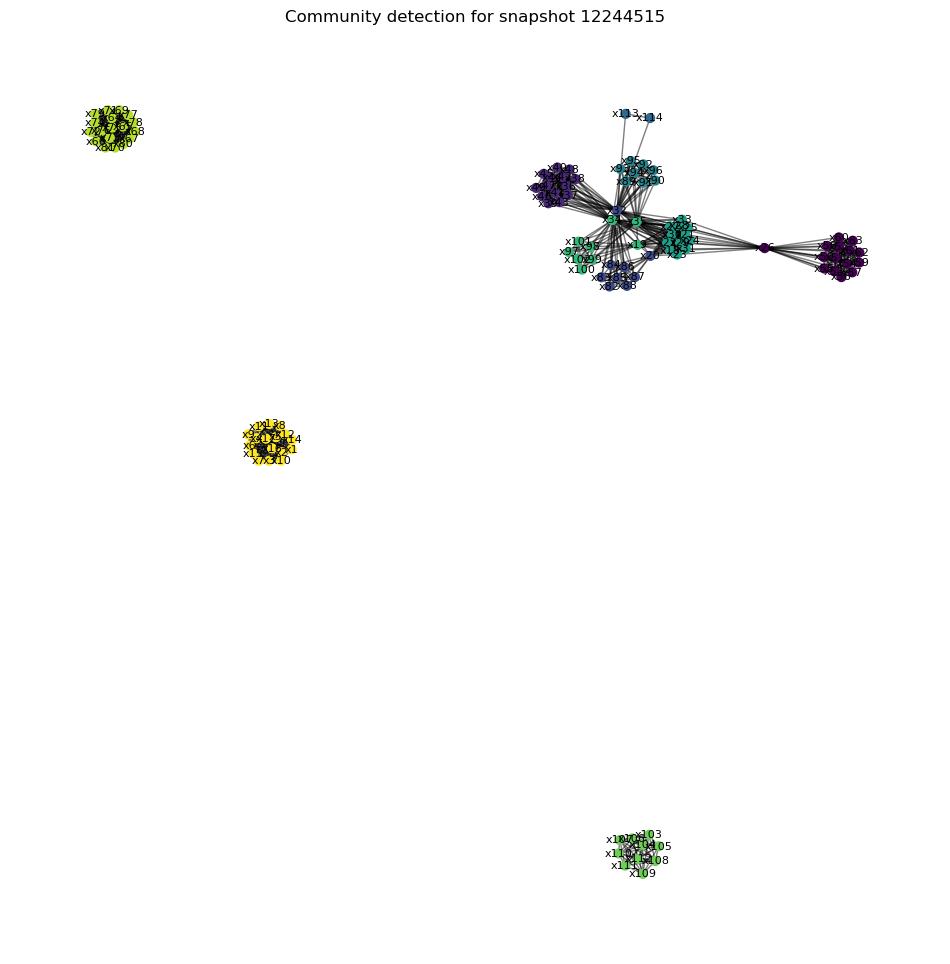

Snapshot: 12244515, Number of communities detected: 10
Community sizes for snapshot 12244515:
Community
9     18
10    17
1     15
2     14
6     12
8     10
7      9
3      9
5      8
4      2
Name: count, dtype: int64


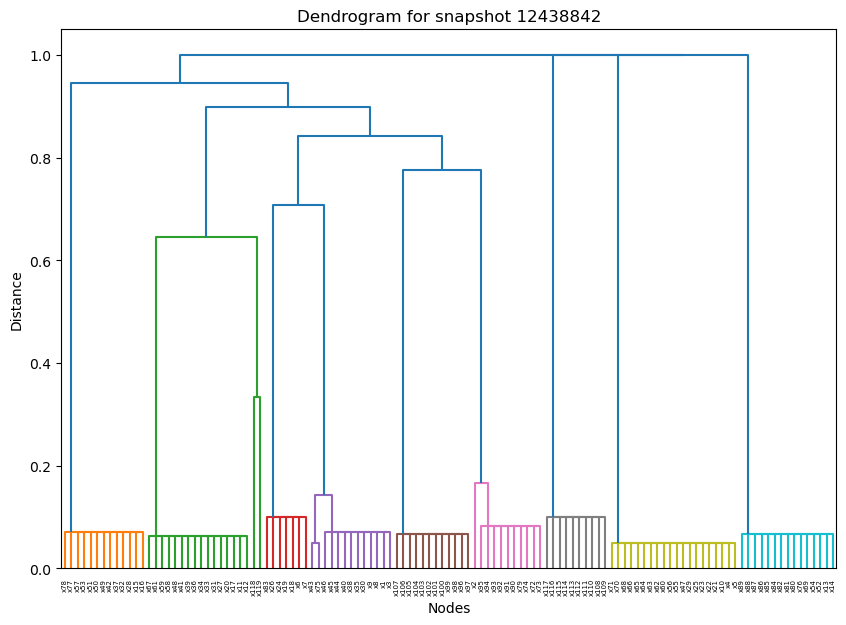

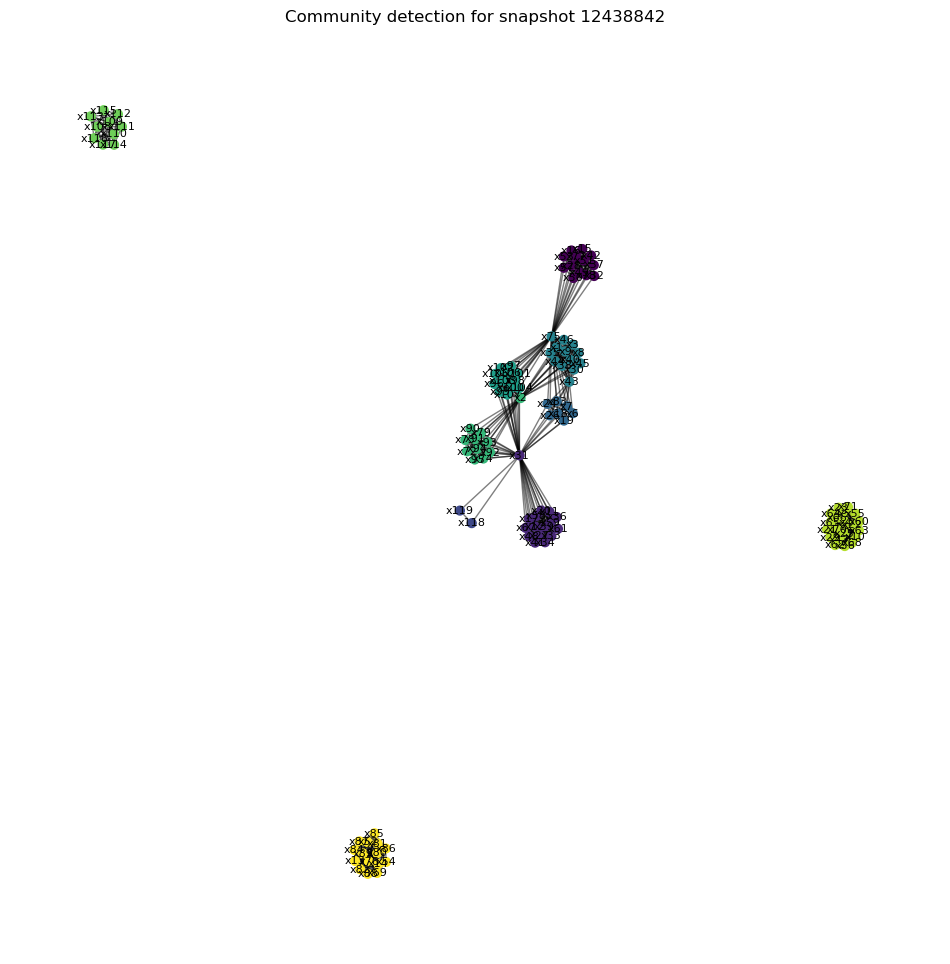

Snapshot: 12438842, Number of communities detected: 10
Community sizes for snapshot 12438842:
Community
9     20
2     16
10    15
5     13
1     13
6     12
7     11
8     10
4      7
3      2
Name: count, dtype: int64


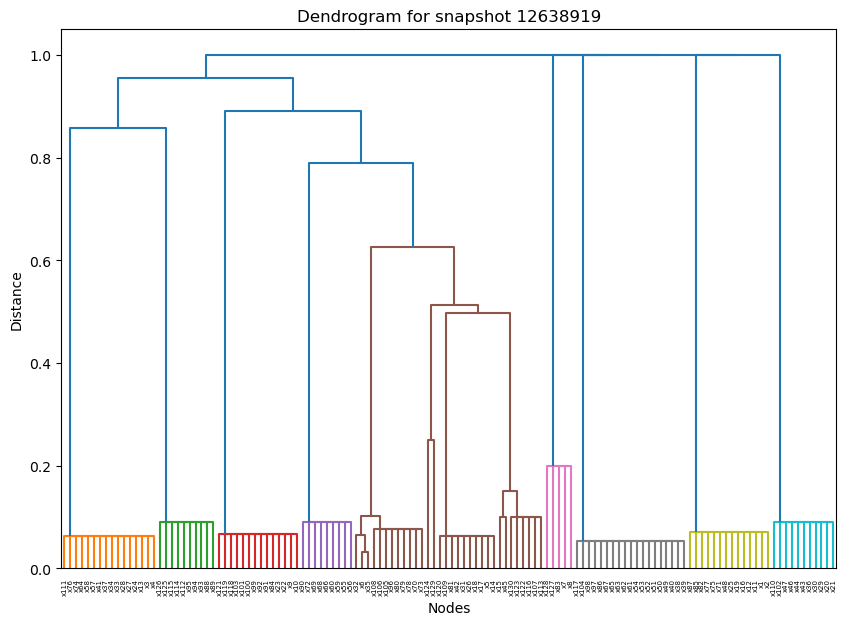

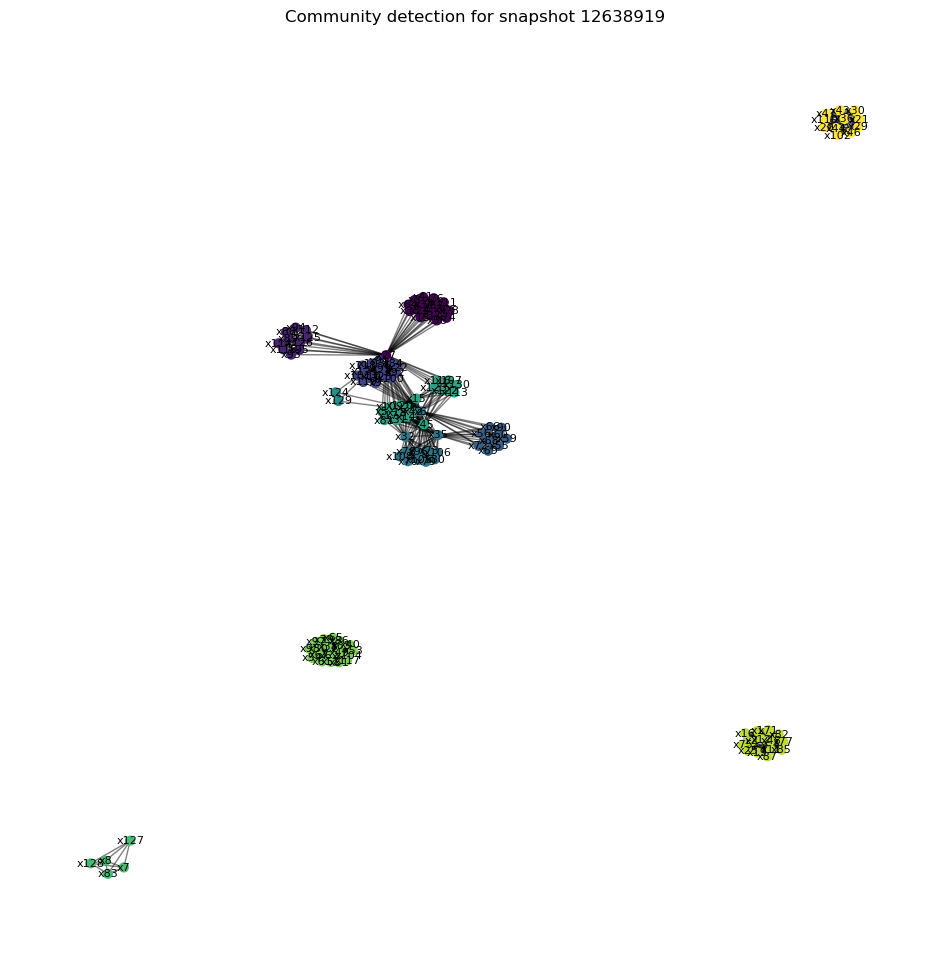

Snapshot: 12638919, Number of communities detected: 11
Community sizes for snapshot 12638919:
Community
9     19
7     18
1     16
10    14
3     14
5     12
11    11
2     10
4      9
8      5
6      2
Name: count, dtype: int64


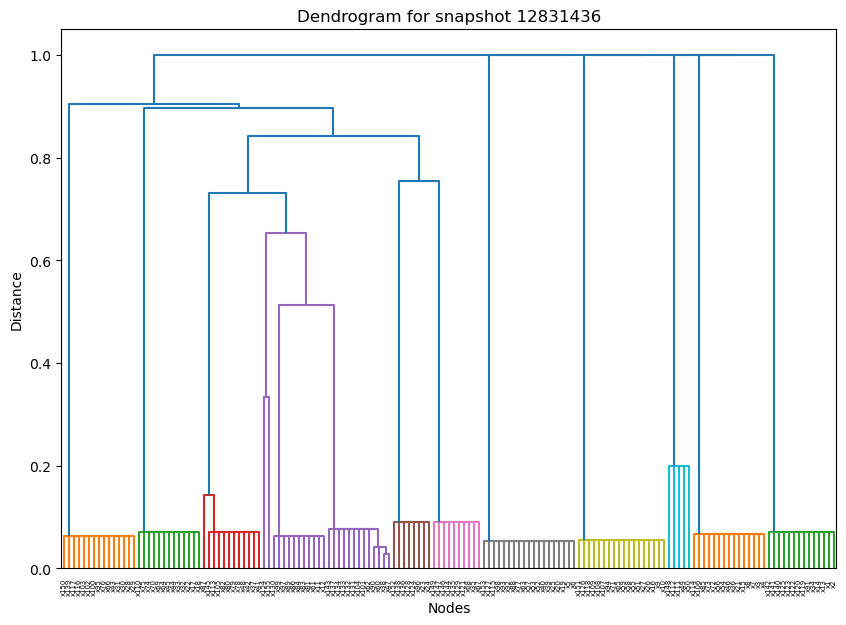

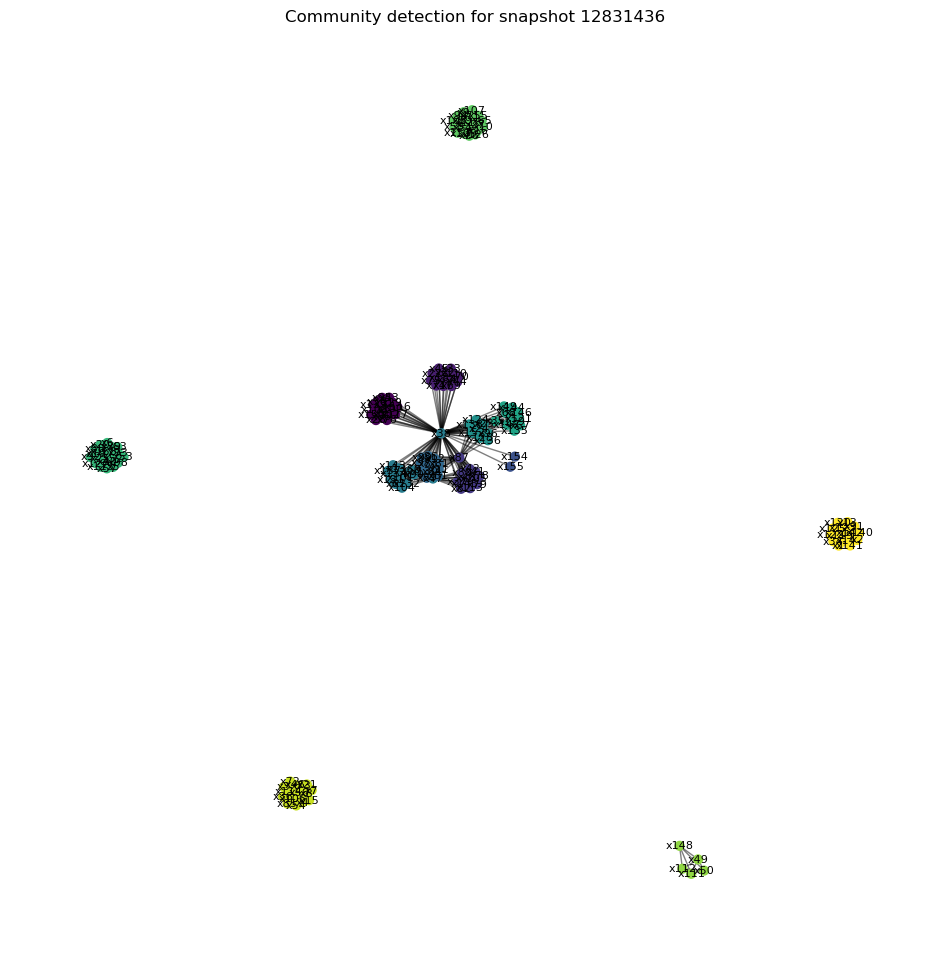

Snapshot: 12831436, Number of communities detected: 13
Community sizes for snapshot 12831436:
Community
9     19
10    18
12    15
1     15
13    14
2     13
6     13
3     12
5     11
8     10
7      8
11     5
4      2
Name: count, dtype: int64


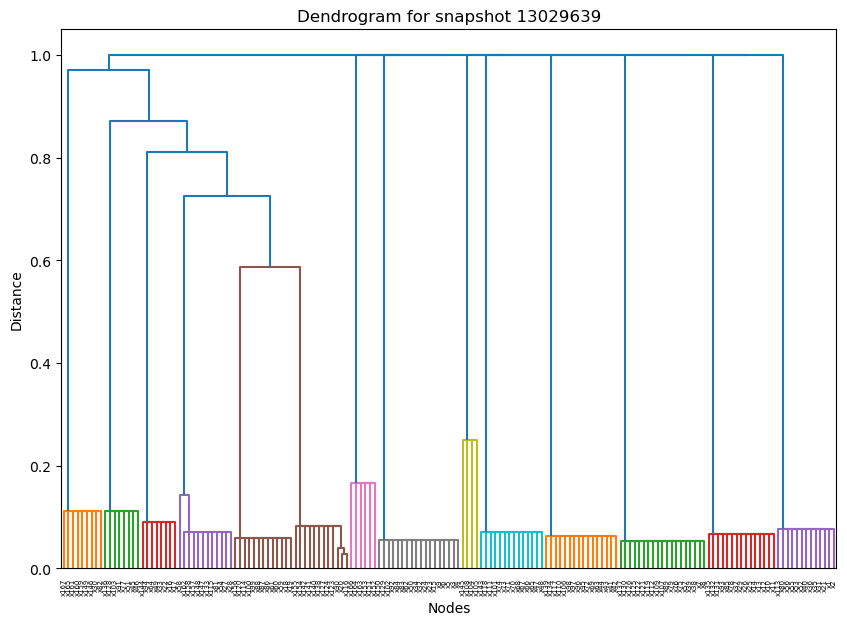

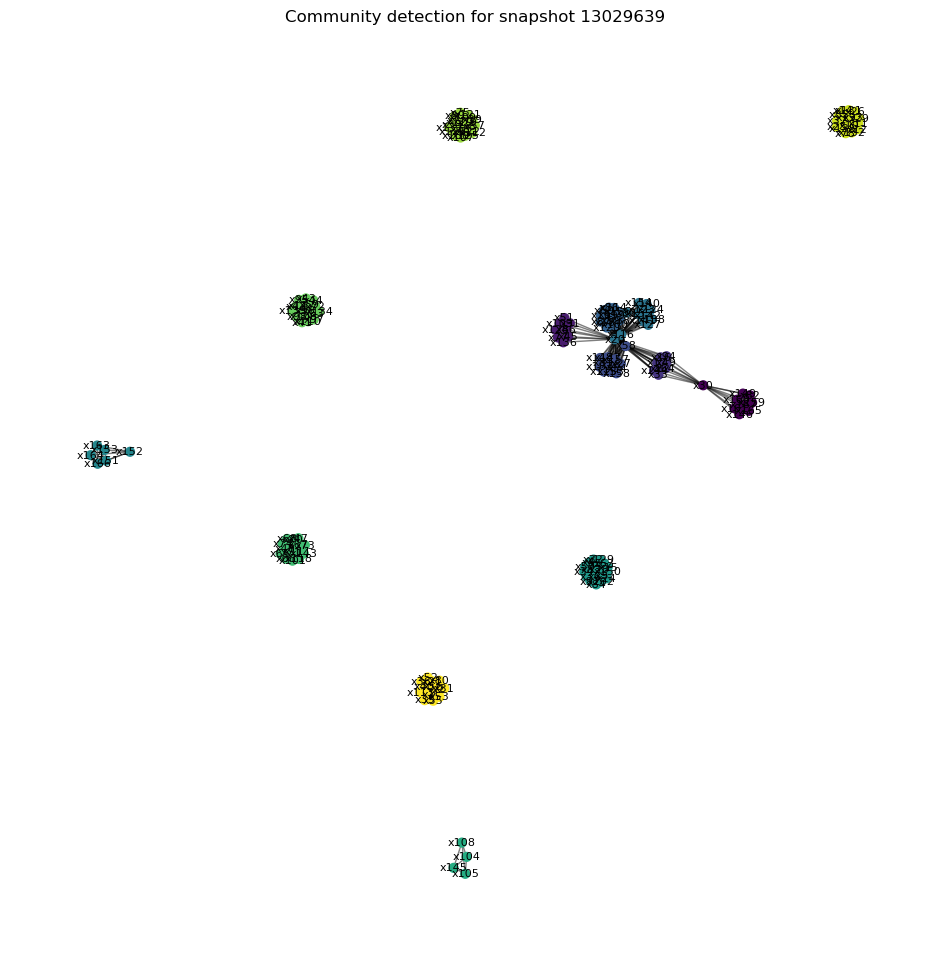

Snapshot: 13029639, Number of communities detected: 14
Community sizes for snapshot 13029639:
Community
12    19
8     18
11    16
13    15
10    14
14    13
5     13
6     12
4     12
1      9
3      8
2      8
7      6
9      4
Name: count, dtype: int64


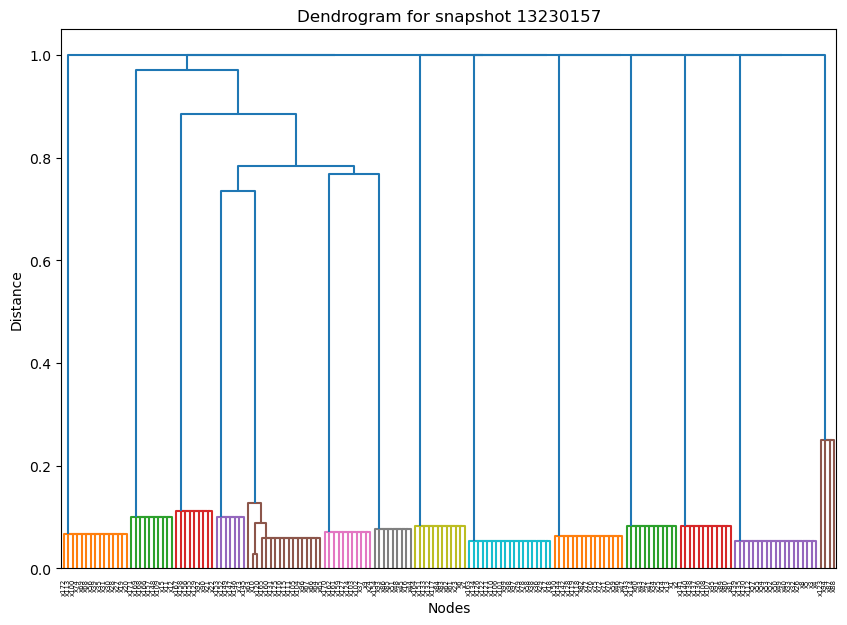

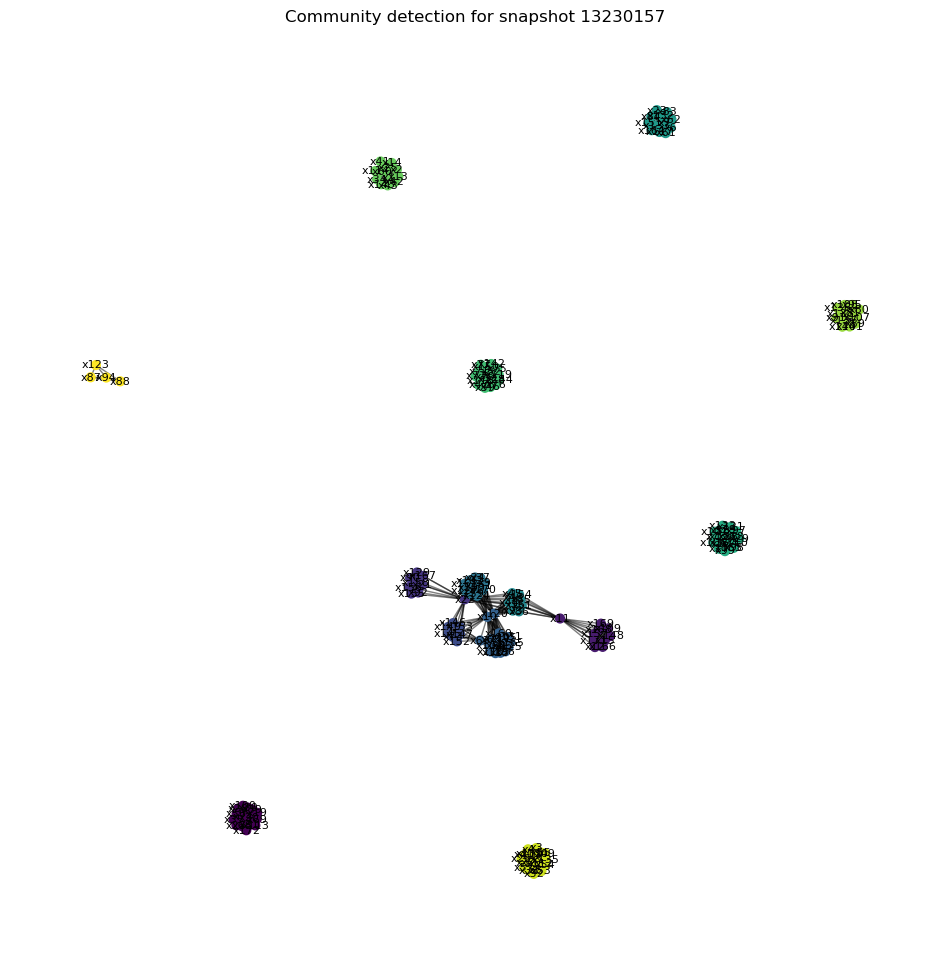

Snapshot: 13230157, Number of communities detected: 14
Community sizes for snapshot 13230157:
Community
13    19
9     19
5     17
10    16
1     15
11    12
8     12
12    12
6     11
2     10
7      9
3      9
4      7
14     4
Name: count, dtype: int64


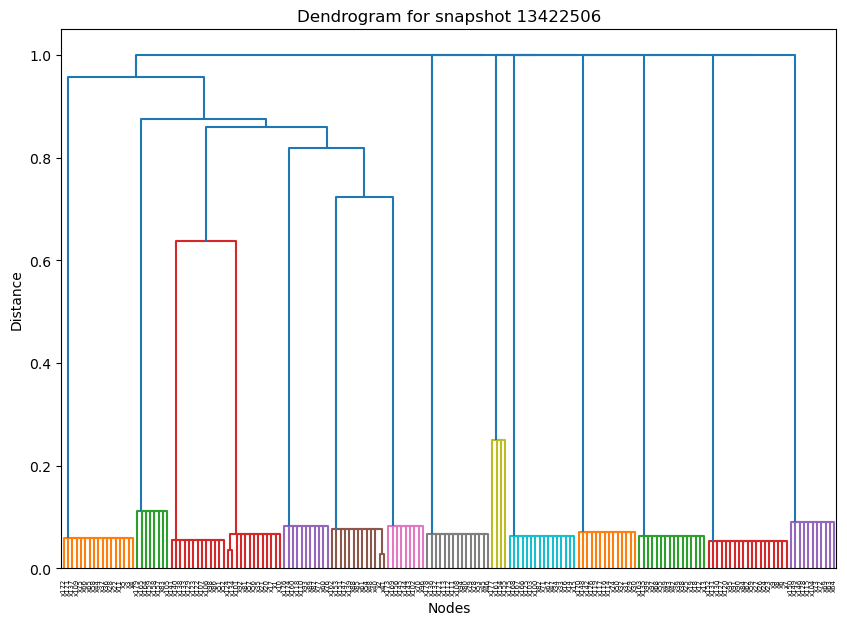

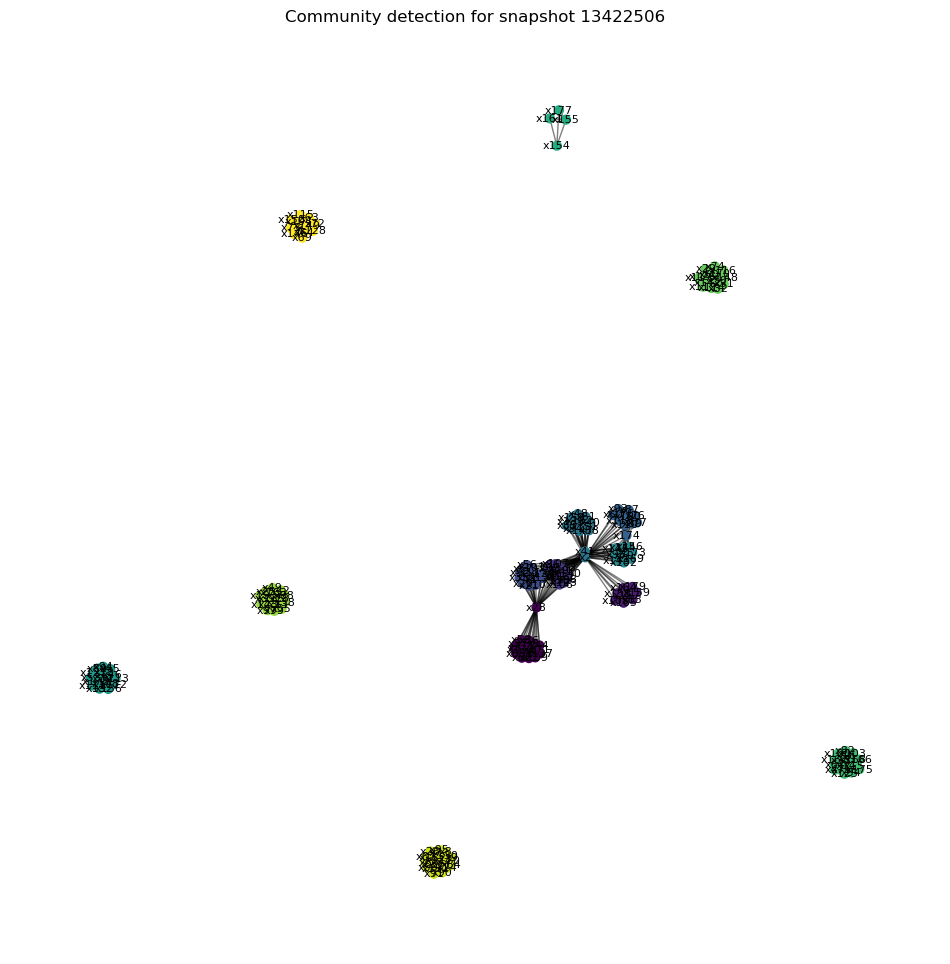

Snapshot: 13422506, Number of communities detected: 14
Community sizes for snapshot 13422506:
Community
13    19
1     17
12    16
10    16
8     15
11    14
4     13
6     13
3     13
5     11
14    11
7      9
2      8
9      4
Name: count, dtype: int64


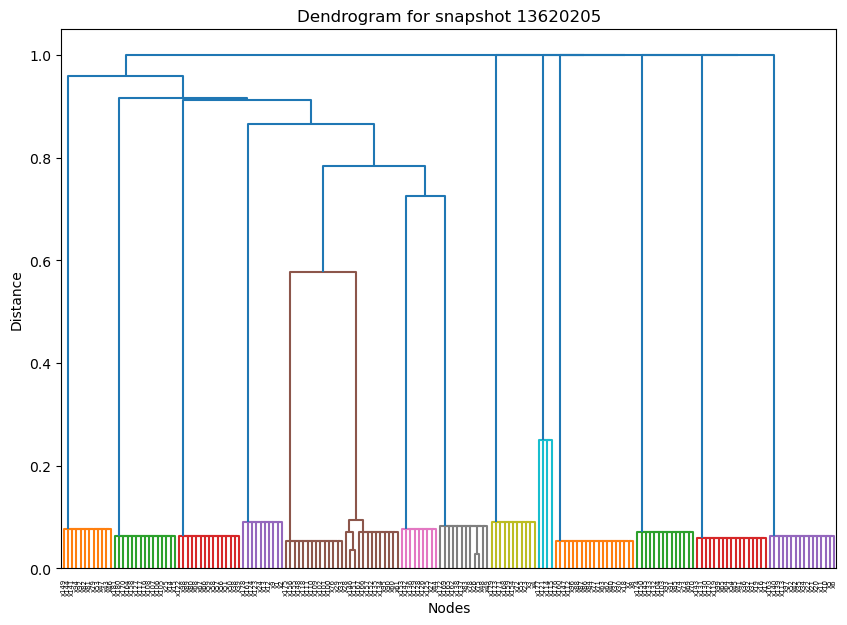

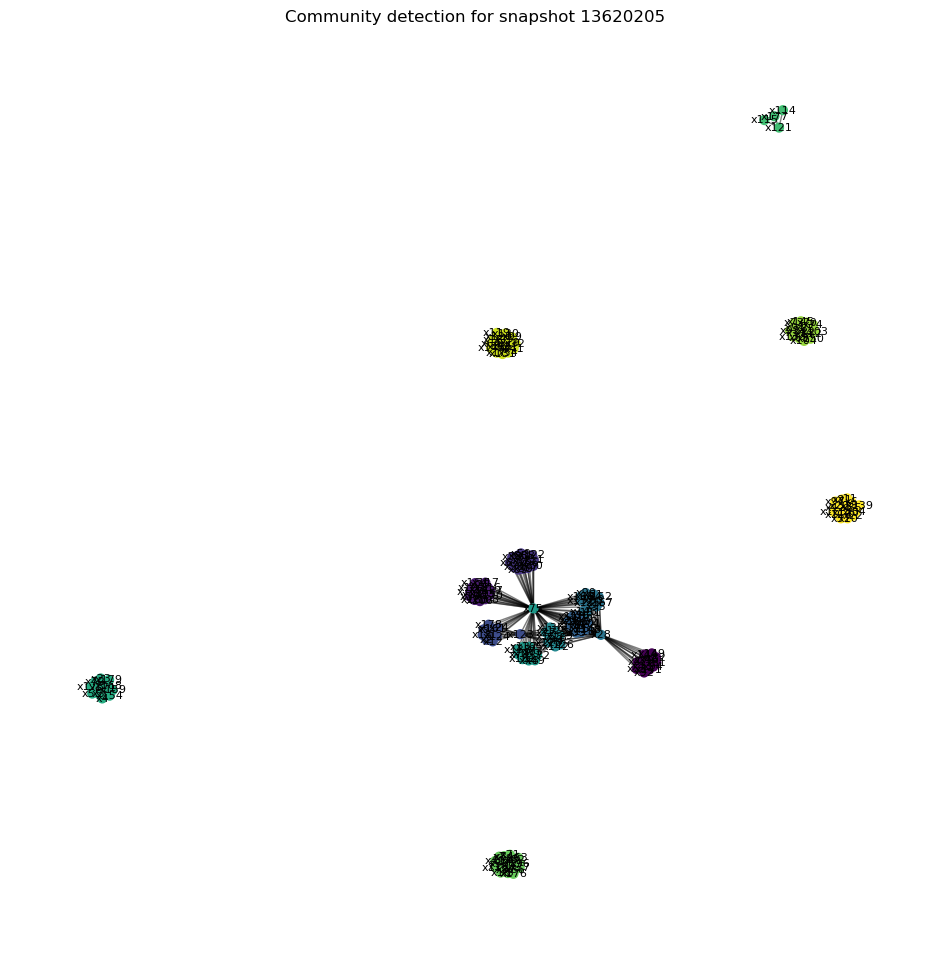

Snapshot: 13620205, Number of communities detected: 14
Community sizes for snapshot 13620205:
Community
11    19
13    17
14    16
2     15
3     15
5     14
12    14
6     13
8     12
1     12
9     11
4     10
7      9
10     4
Name: count, dtype: int64


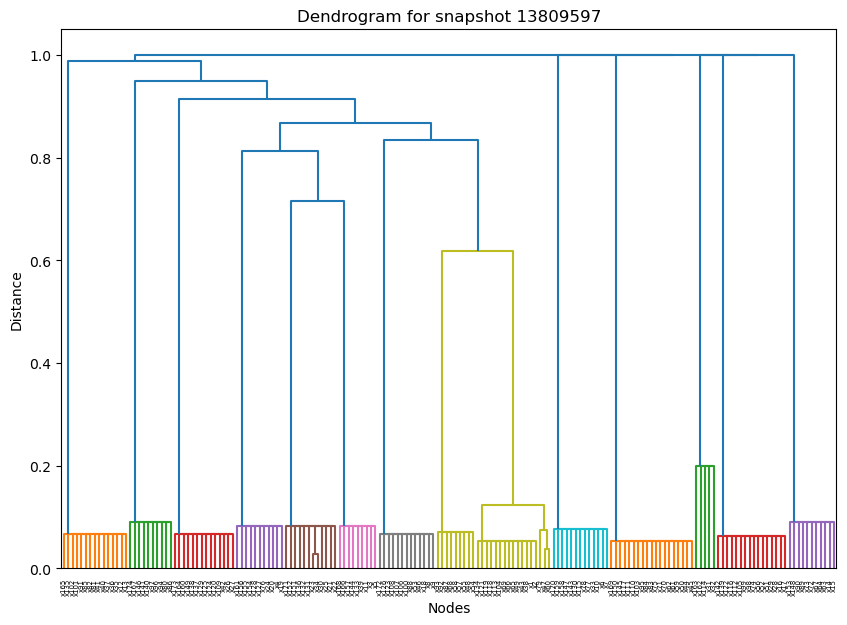

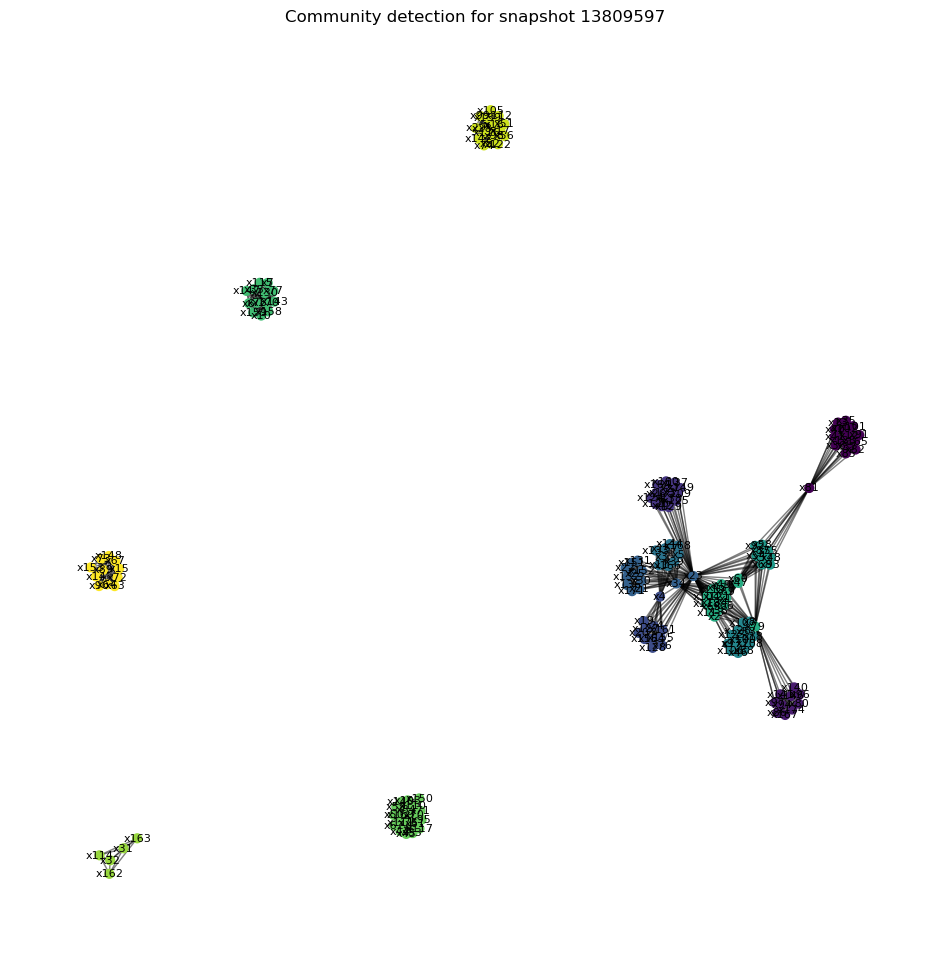

Snapshot: 13809597, Number of communities detected: 14
Community sizes for snapshot 13809597:
Community
11    19
9     17
13    16
1     15
3     14
10    13
7     13
5     12
4     11
14    11
2     10
6      9
8      9
12     5
Name: count, dtype: int64


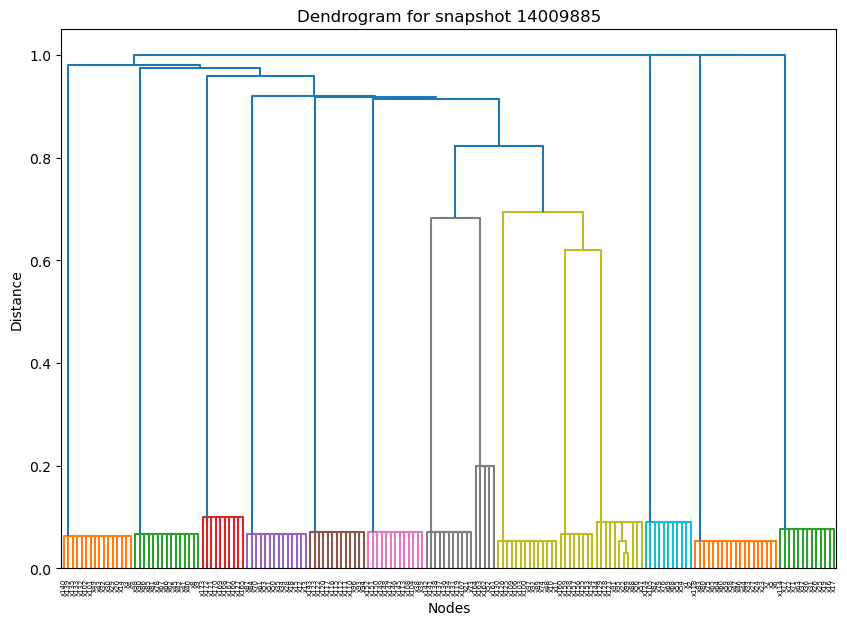

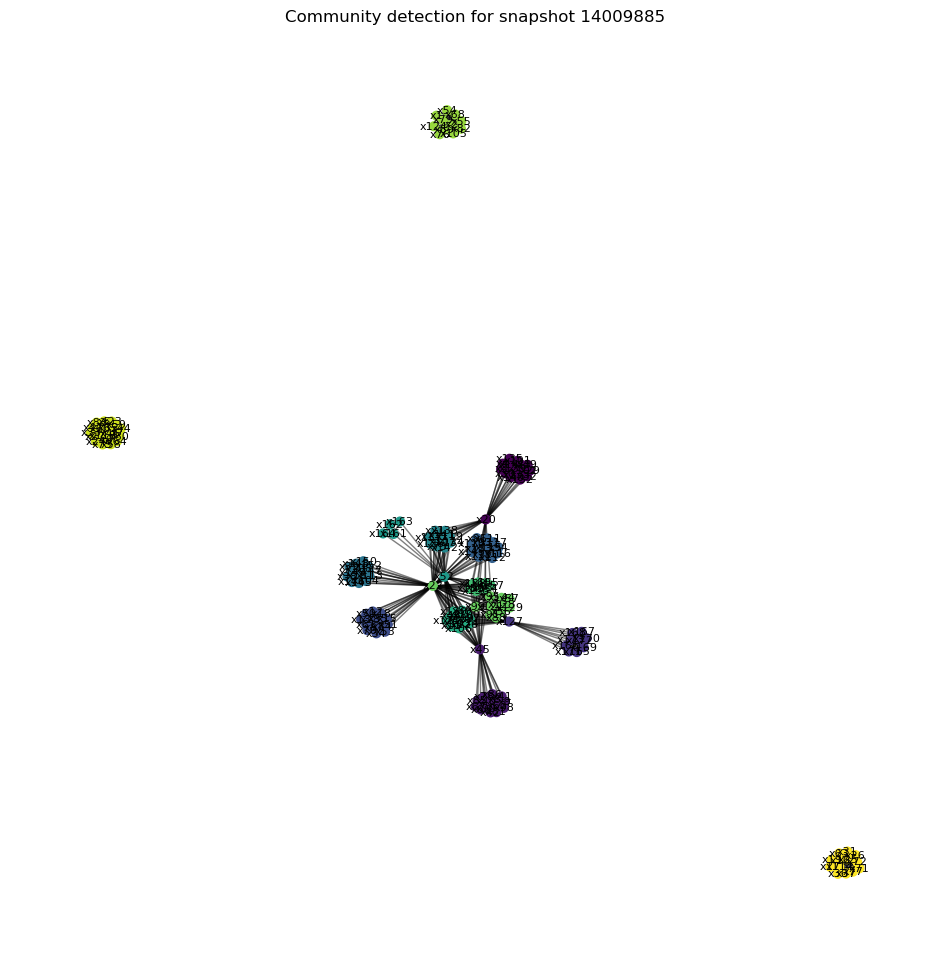

Snapshot: 14009885, Number of communities detected: 14
Community sizes for snapshot 14009885:
Community
13    19
1     16
2     15
9     14
4     14
14    13
6     13
5     13
12    11
7     11
11    11
3     10
10     8
8      5
Name: count, dtype: int64


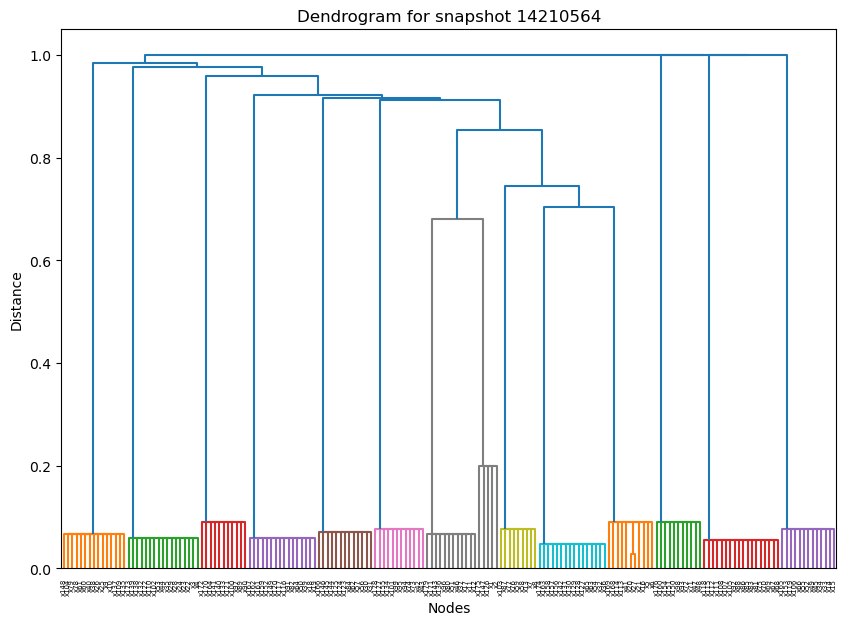

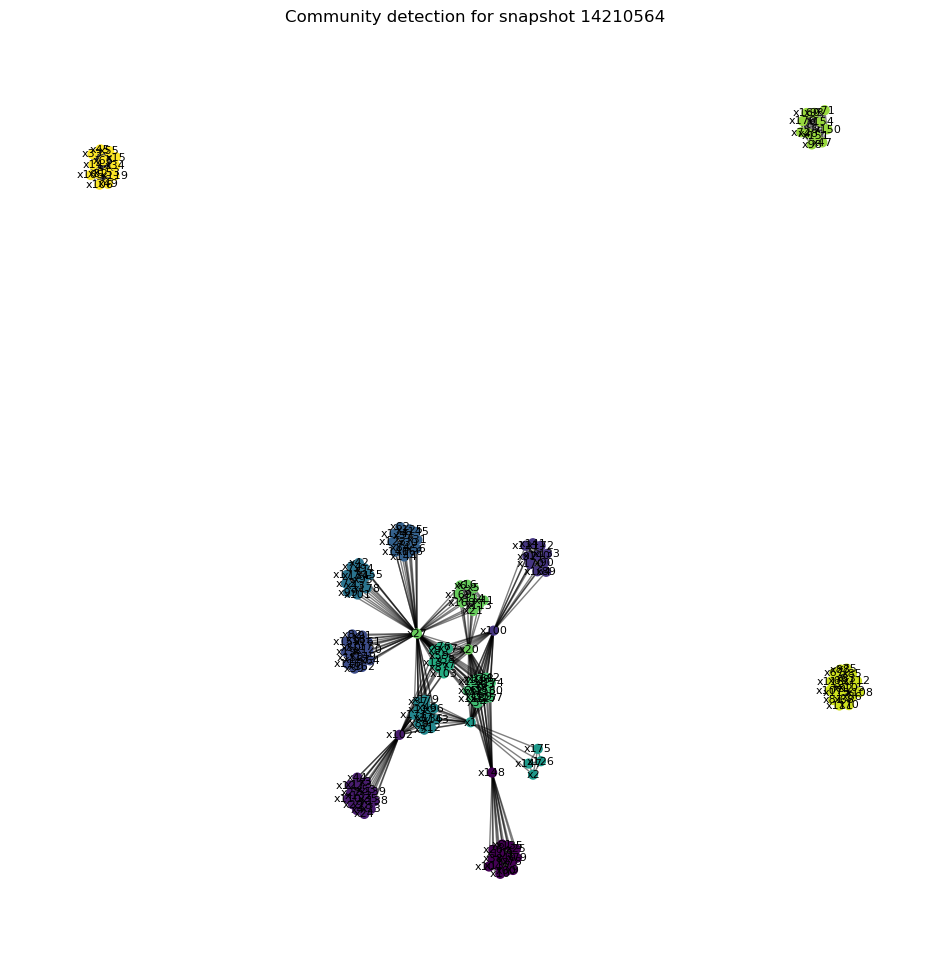

Snapshot: 14210564, Number of communities detected: 14
Community sizes for snapshot 14210564:
Community
13    18
2     17
4     16
10    16
1     15
14    13
5     13
7     12
6     12
11    11
12    11
3     11
9      9
8      5
Name: count, dtype: int64


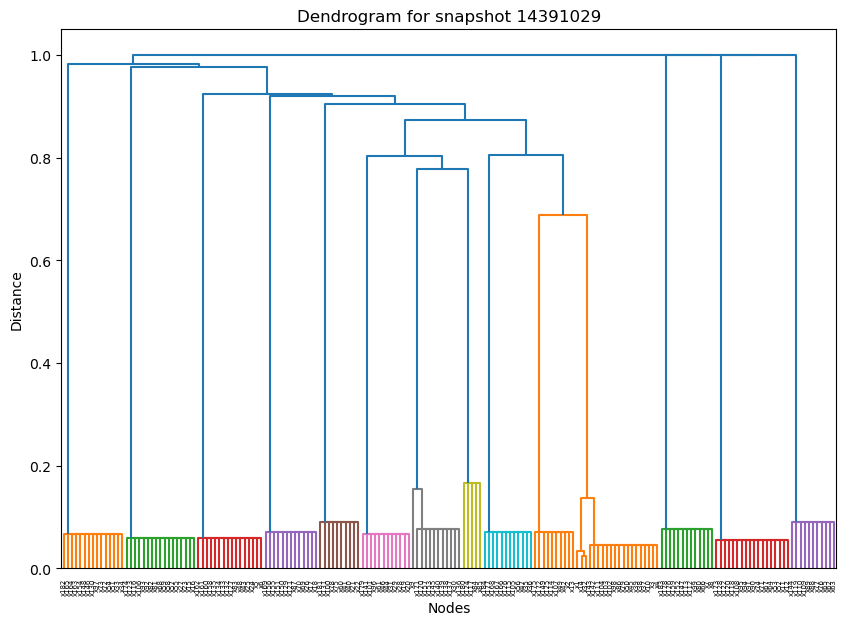

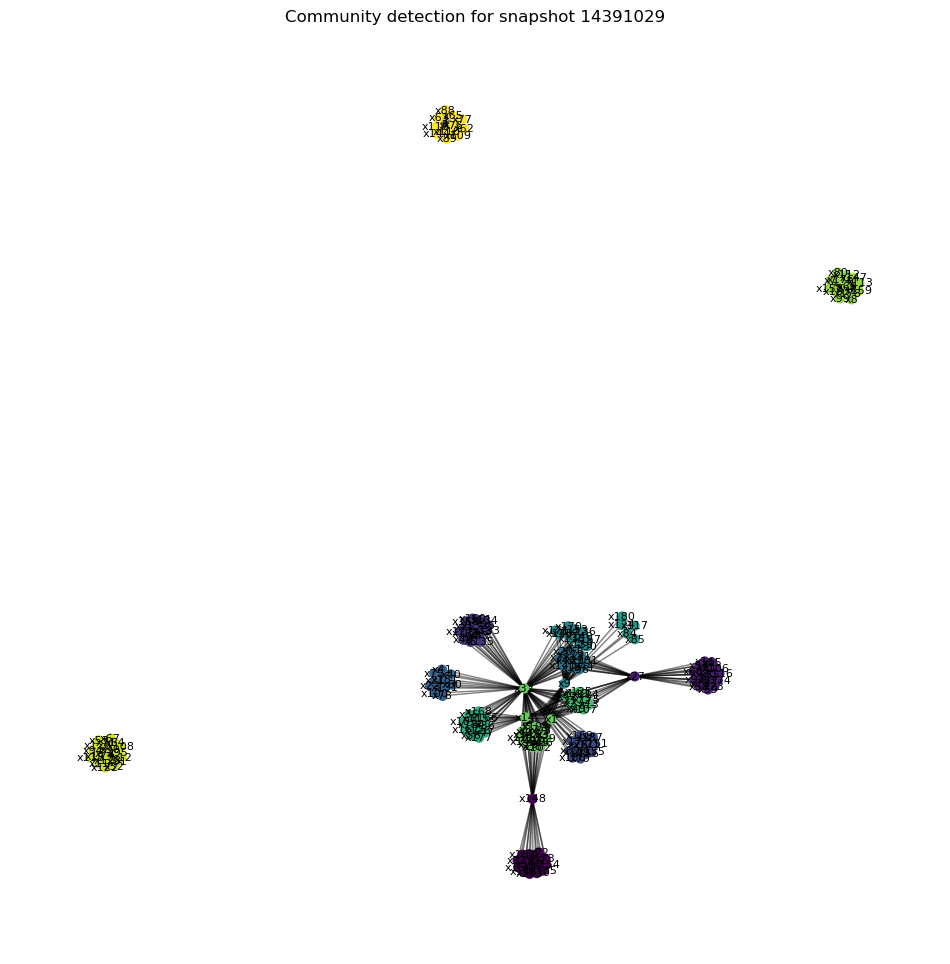

Snapshot: 14391029, Number of communities detected: 14
Community sizes for snapshot 14391029:
Community
11    20
13    18
2     17
3     16
1     15
12    13
4     13
7     12
6     12
9     12
14    11
10    10
5     10
8      5
Name: count, dtype: int64


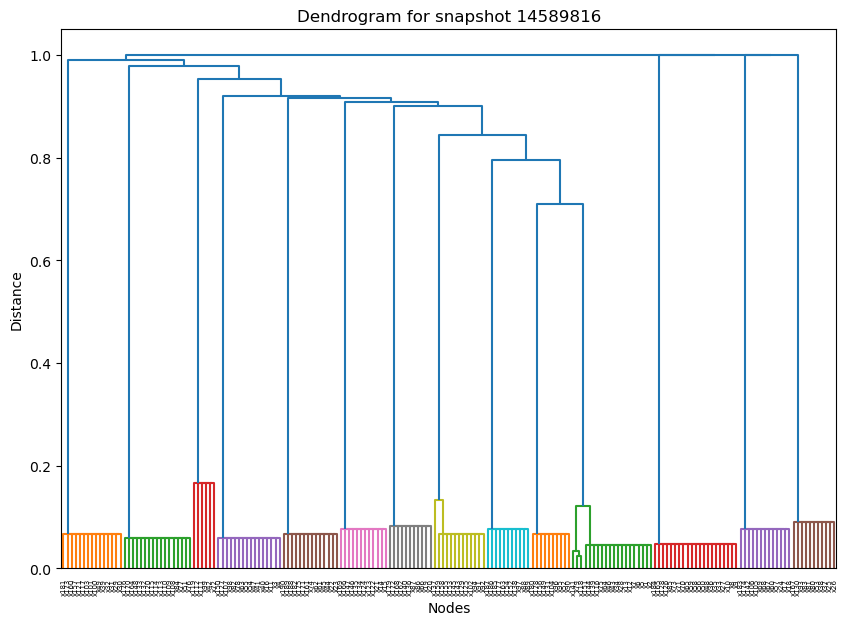

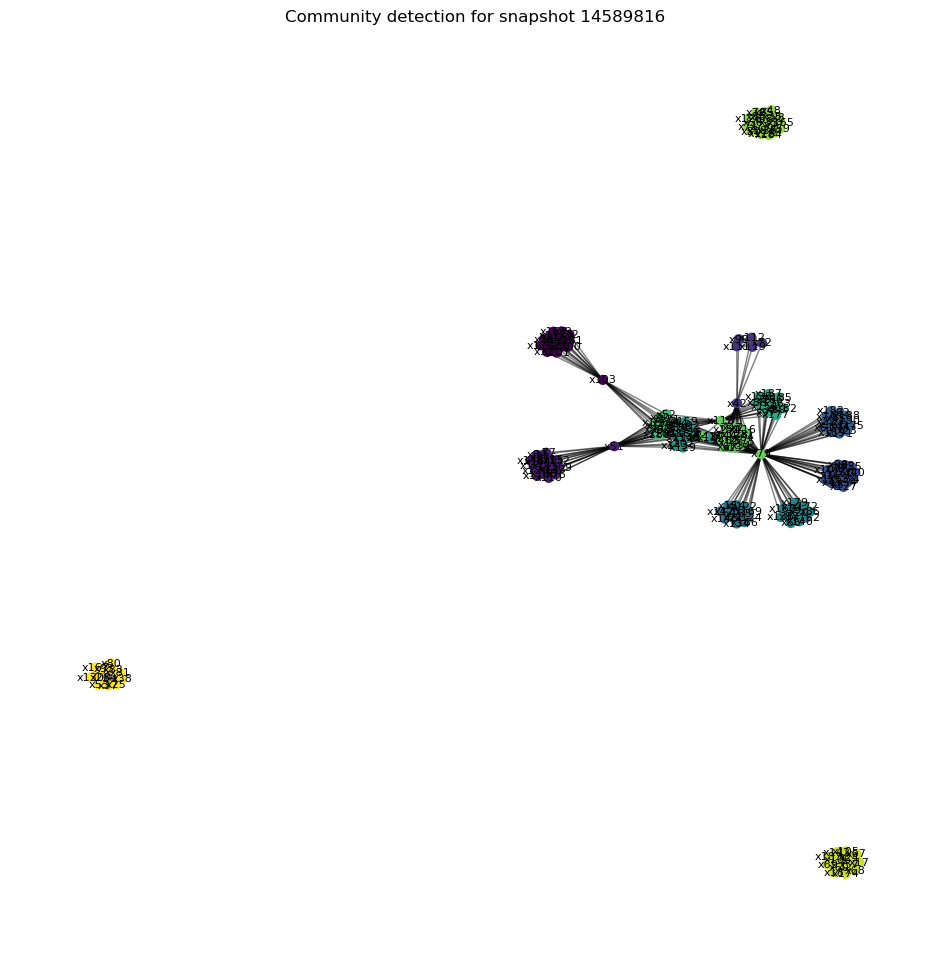

Snapshot: 14589816, Number of communities detected: 14
Community sizes for snapshot 14589816:
Community
12    21
11    20
2     17
4     16
1     15
5     14
13    13
8     13
6     12
7     11
14    11
9     11
10    10
3      6
Name: count, dtype: int64


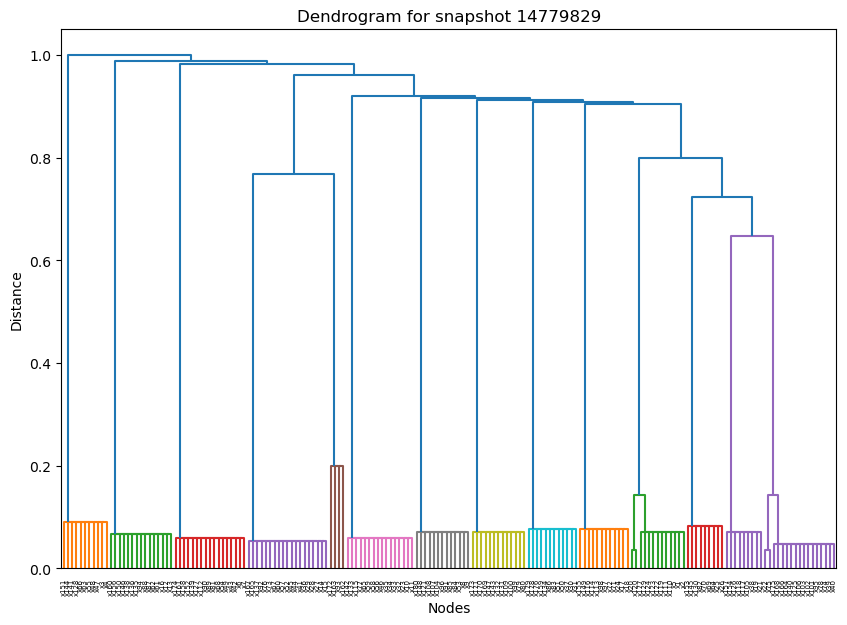

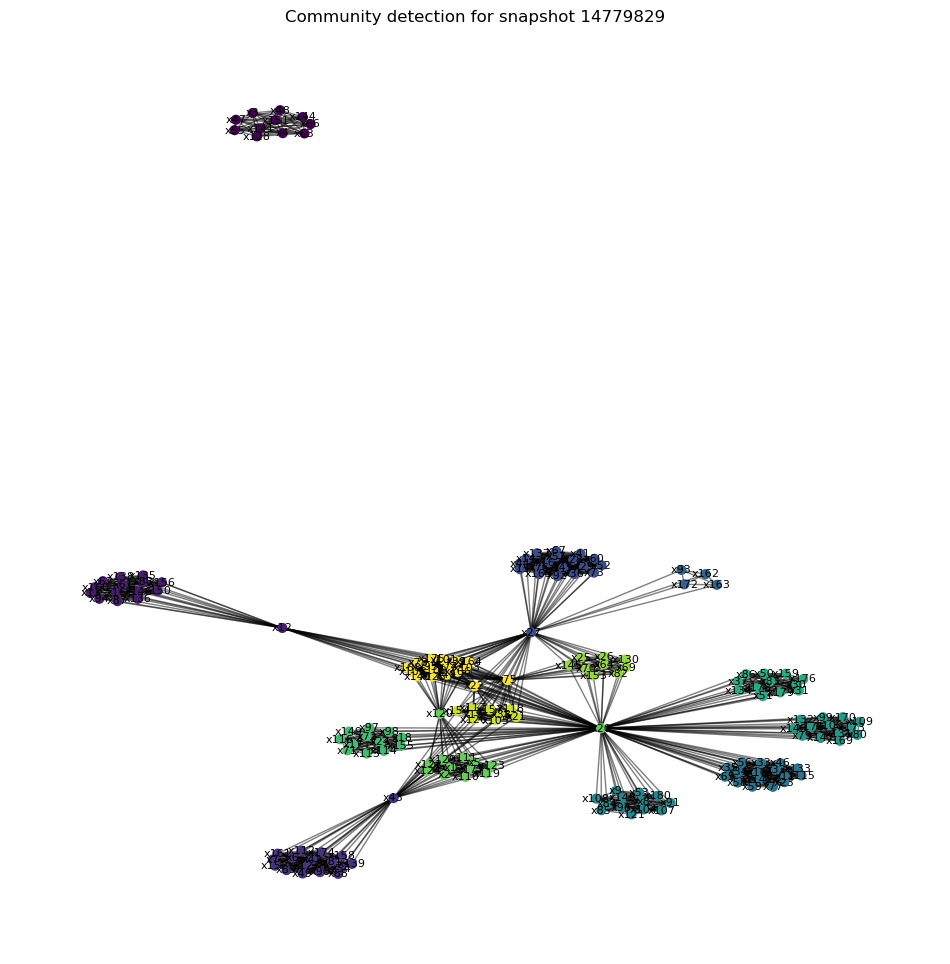

Snapshot: 14779829, Number of communities detected: 14
Community sizes for snapshot 14779829:
Community
4     19
3     17
14    17
6     16
2     15
11    13
7     13
8     13
10    12
9     12
1     11
13     9
12     9
5      4
Name: count, dtype: int64


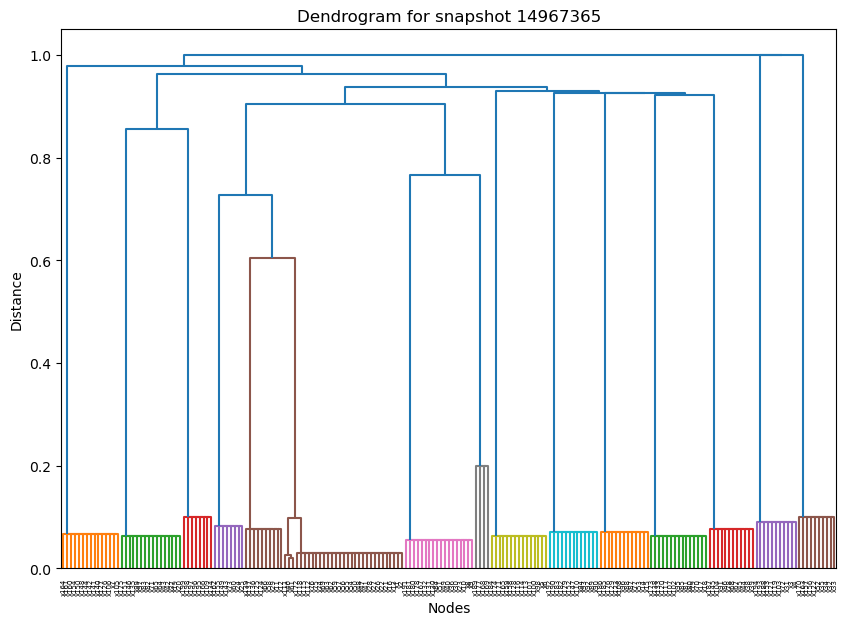

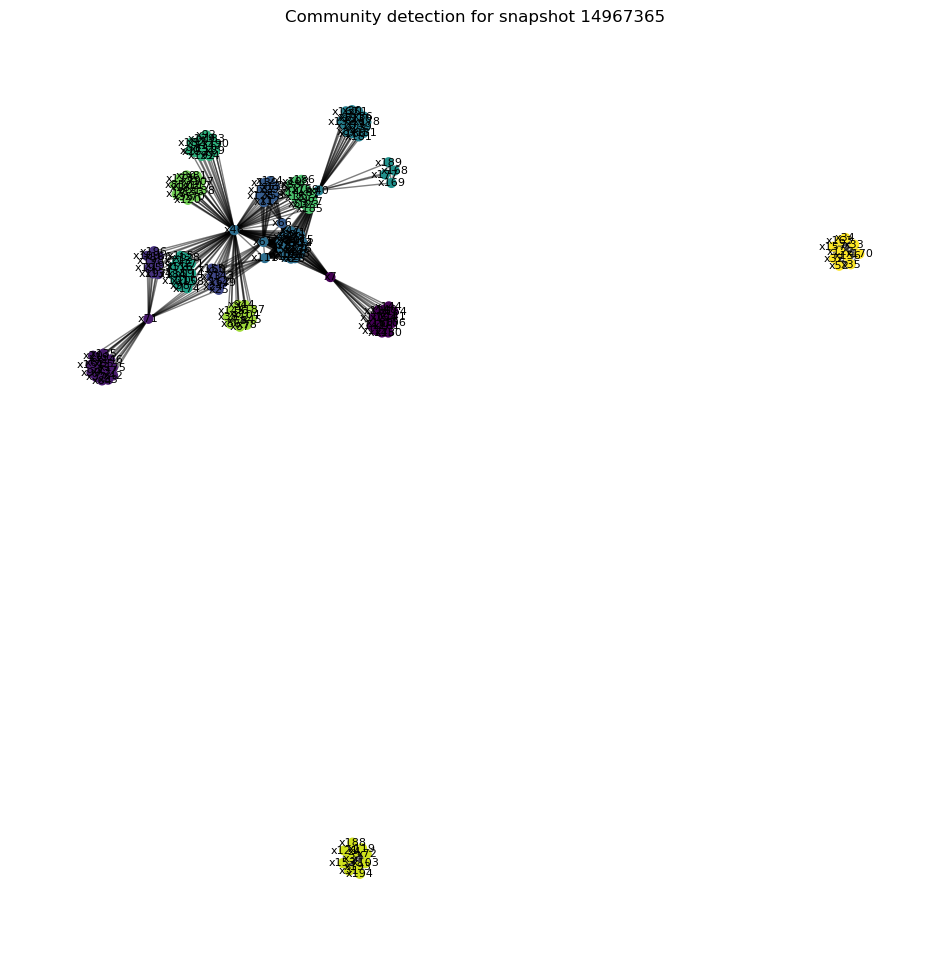

Snapshot: 14967365, Number of communities detected: 15
Community sizes for snapshot 14967365:
Community
6     31
7     18
2     16
9     15
1     15
12    15
11    13
10    13
13    12
14    11
5     10
15    10
4      8
3      8
8      4
Name: count, dtype: int64


/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_10220/3643464192.py:138: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  community_tracking = community_tracking.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_10220/3643464192.py:138: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  community_tracking = community_tracking.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)


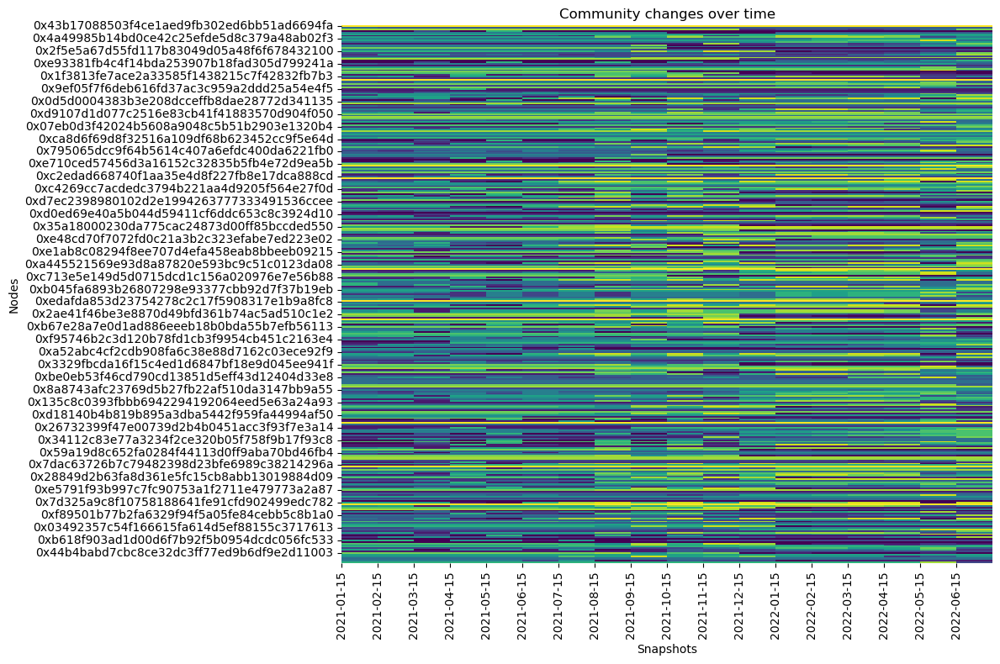

Community detection and analysis complete.


In [1]:
import os
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.spatial.distance import squareform
from sklearn.metrics import pairwise_distances
from networkx.algorithms.community import modularity
from dotenv import load_dotenv
from collections import defaultdict
import seaborn as sns

# Load environment variables from .env file (if needed for other variables)
load_dotenv()

# Set the input directory directly to the local folder where the graphs are stored
input_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'

# Check if the input directory exists
if not os.path.exists(input_directory):
    raise FileNotFoundError(f"Input directory does not exist: {input_directory}")

print(f"Input directory is set to: {input_directory}")

# Function to load graphs from snapshots
def load_wallet_graphs_from_snapshots(df_snapshots, input_directory):
    graphs = {}
    dates = {}
    missing_snapshots = []
    
    for index, row in df_snapshots.iterrows():
        snapshot = row['Block Height']
        date = row['Date'].strftime('%Y-%m-%d')  # Format date as string
        dates[snapshot] = date
        file_path = os.path.join(input_directory, f"validated_wallet_projection_graph_{snapshot}.graphml")
        
        print(f"Checking file: {file_path}")  # Debug print

        if os.path.exists(file_path):
            graph = nx.read_graphml(file_path)
            graphs[snapshot] = graph
            print(f"Loaded graph for snapshot {snapshot}")
        else:
            print(f"Graph file for snapshot {snapshot} does not exist at {file_path}")
            missing_snapshots.append(snapshot)
    
    return graphs, dates, missing_snapshots

# Function to calculate the topological overlap matrix
def calculate_topological_overlap(graph):
    nodes = list(graph.nodes())
    num_nodes = len(nodes)
    overlap_matrix = np.zeros((num_nodes, num_nodes))
    
    for i, node_i in enumerate(nodes):
        for j, node_j in enumerate(nodes):
            if i >= j:
                continue
            neighbors_i = set(graph.neighbors(node_i))
            neighbors_j = set(graph.neighbors(node_j))
            common_neighbors = neighbors_i & neighbors_j
            num_common_neighbors = len(common_neighbors)
            
            if graph.has_edge(node_i, node_j):
                num_common_neighbors += 1
            
            min_degree = min(graph.degree[node_i], graph.degree[node_j])
            overlap_matrix[i, j] = num_common_neighbors / (min_degree + 1)
            overlap_matrix[j, i] = overlap_matrix[i, j]
    
    return overlap_matrix, nodes

# Function to perform hierarchical clustering and visualize results
def detect_and_visualize_communities(graph, snapshot, output_directory):
    # Calculate the topological overlap matrix
    overlap_matrix, nodes = calculate_topological_overlap(graph)
    
    # Convert the overlap matrix to a distance matrix
    dist_matrix = 1 - overlap_matrix
    np.fill_diagonal(dist_matrix, 0)  # Ensure the diagonal is zero
    dist_matrix = squareform(dist_matrix)
    
    # Perform hierarchical clustering
    Z = linkage(dist_matrix, method='average')
    
    # Rename nodes for visualization
    node_labels = {node: f'x{i+1}' for i, node in enumerate(nodes)}
    renamed_nodes = [node_labels[node] for node in nodes]
    
    # Plot the dendrogram
    plt.figure(figsize=(10, 7))
    dendrogram(Z, labels=renamed_nodes)
    plt.title(f"Dendrogram for snapshot {snapshot}")
    plt.xlabel('Nodes')
    plt.ylabel('Distance')
    plt.savefig(os.path.join(output_directory, f'dendrogram_snapshot_{snapshot}.png'))
    plt.show()
    
    # Determine the clusters (communities)
    max_d = 0.5  # This threshold can be adjusted based on the dendrogram
    clusters = fcluster(Z, max_d, criterion='distance')
    
    # Create a partition dictionary
    partition = {nodes[i]: clusters[i] for i in range(len(nodes))}
    
    # Draw the graph with communities
    pos = nx.spring_layout(graph)
    cmap = plt.get_cmap('viridis')
    plt.figure(figsize=(12, 12))
    
    # Draw nodes with community colors
    nx.draw_networkx_nodes(graph, pos, partition.keys(), node_size=40, 
                           cmap=cmap, node_color=list(partition.values()))
    nx.draw_networkx_edges(graph, pos, alpha=0.5)
    nx.draw_networkx_labels(graph, pos, labels=node_labels, font_size=8)
    
    plt.title(f"Community detection for snapshot {snapshot}")
    plt.axis('off')
    plt.savefig(os.path.join(output_directory, f'community_snapshot_{snapshot}.png'))
    plt.show()
    
    return partition

# Function to track community changes over time
def track_community_changes_over_time(partitions, dates):
    # Create a DataFrame to store community changes over time
    all_nodes = set()
    for partition in partitions.values():
        all_nodes.update(partition.keys())
    
    community_tracking = pd.DataFrame(index=list(all_nodes), columns=sorted(partitions.keys()))
    
    for snapshot, partition in partitions.items():
        for node, community in partition.items():
            community_tracking.at[node, snapshot] = community
    
    community_tracking = community_tracking.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
    
    return community_tracking

# Function to visualize community changes over time
def visualize_community_changes(community_tracking, dates):
    plt.figure(figsize=(12, 8))
    sns.heatmap(community_tracking, cmap='viridis', cbar=False)
    plt.title('Community changes over time')
    plt.xlabel('Snapshots')
    plt.ylabel('Nodes')
    plt.xticks(ticks=range(len(community_tracking.columns)), labels=[dates[snapshot] for snapshot in community_tracking.columns], rotation=90)
    plt.tight_layout()
    plt.show()

# Assuming df_snapshots is already loaded
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
df_snapshots = pd.read_csv(os.path.join(data_directory, 'snapshot_selection.csv'))
df_snapshots['Date'] = pd.to_datetime(df_snapshots['Date'])  # Ensure dates are in datetime format

# Load the graphs
graphs, dates, missing_snapshots = load_wallet_graphs_from_snapshots(df_snapshots, input_directory)

# Directory to save community detection visualizations
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/output'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Perform community detection on loaded graphs and track changes over time
partitions = {}
for snapshot, graph in graphs.items():
    partition = detect_and_visualize_communities(graph, snapshot, output_directory)
    partitions[snapshot] = partition
    
    # Analyze the partition
    num_communities = len(set(partition.values()))
    print(f"Snapshot: {snapshot}, Number of communities detected: {num_communities}")
    
    # Save partition information
    partition_df = pd.DataFrame(list(partition.items()), columns=['Node', 'Community'])
    partition_df.to_csv(os.path.join(output_directory, f'partition_snapshot_{snapshot}.csv'), index=False)
    
    # Analyze community structure
    community_sizes = partition_df['Community'].value_counts()
    print(f"Community sizes for snapshot {snapshot}:")
    print(community_sizes)
    
    # Save community sizes to a CSV file
    community_sizes.to_csv(os.path.join(output_directory, f'community_sizes_snapshot_{snapshot}.csv'))

# Track community changes over time
community_tracking = track_community_changes_over_time(partitions, dates)

# Visualize community changes over time
visualize_community_changes(community_tracking, dates)

print("Community detection and analysis complete.")


/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_10220/3643464192.py:138: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  community_tracking = community_tracking.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_10220/3643464192.py:138: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  community_tracking = community_tracking.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)


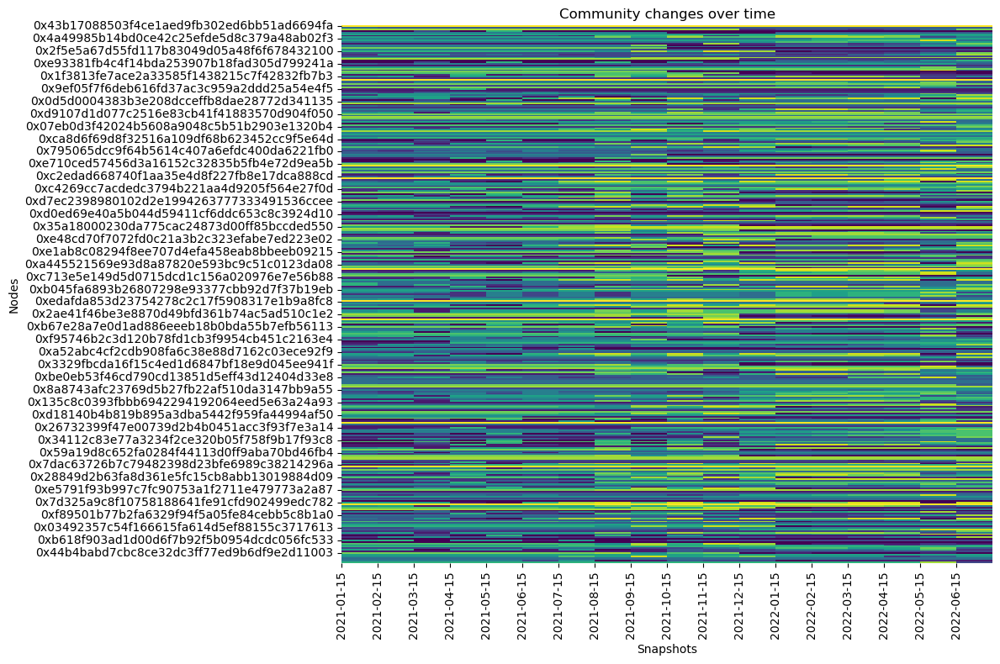

Community detection and analysis complete.


In [3]:
# Track community changes over time
community_tracking = track_community_changes_over_time(partitions, dates)

# Visualize community changes over time
visualize_community_changes(community_tracking, dates)

print("Community detection and analysis complete.")


## Community composition

#### Louvain method

Input directory is set to: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Graph file for snapshot 7962629 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Graph file for snapshot 8155117 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8354625.graphml
Graph file for snapshot 8354625 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_gra

Loaded graph for snapshot 13809597
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14009885.graphml
Loaded graph for snapshot 14009885
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14210564.graphml
Loaded graph for snapshot 14210564
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14391029.graphml
Loaded graph for snapshot 14391029
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14589816.graphml
Loaded graph for snapshot 14589816
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14779829.graphml
Loaded graph for snapshot 14779829
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_project

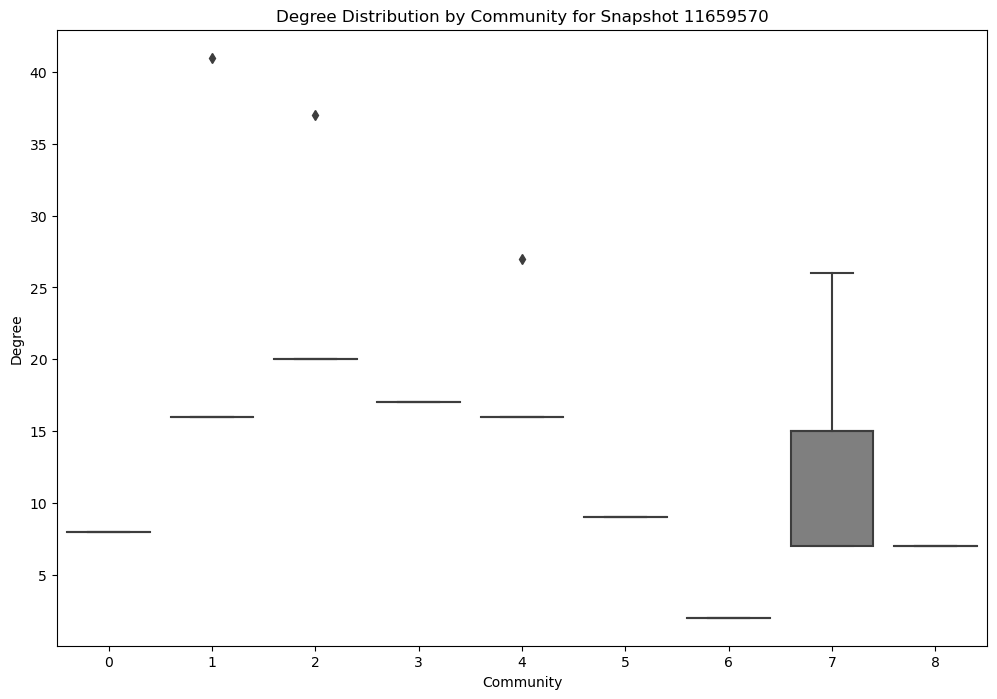

Snapshot: 11659570, Number of communities detected: 9
Community sizes for snapshot 11659570:
Community
2    21
7    19
3    18
1    17
4    17
0     9
5     8
8     6
6     3
Name: count, dtype: int64
Community Composition Summary for Snapshot 11861210:

  Community     Degree               DegreeCentrality                      \
                  mean       std max             mean       std       max   
0         0  19.850000  3.801316  36         0.175664  0.033640  0.318584   
1         1  13.863636  4.517642  29         0.122687  0.039979  0.256637   
2         2   9.533333  1.807392  15         0.084366  0.015995  0.132743   
3         3  14.733333  2.840188  25         0.130383  0.025134  0.221239   
4         4  12.941176  8.444455  42         0.114524  0.074730  0.371681   
5         5   6.000000  0.000000   6         0.053097  0.000000  0.053097   
6         6  17.000000  0.000000  17         0.150442  0.000000  0.150442   

  BetweennessCentrality                      
     

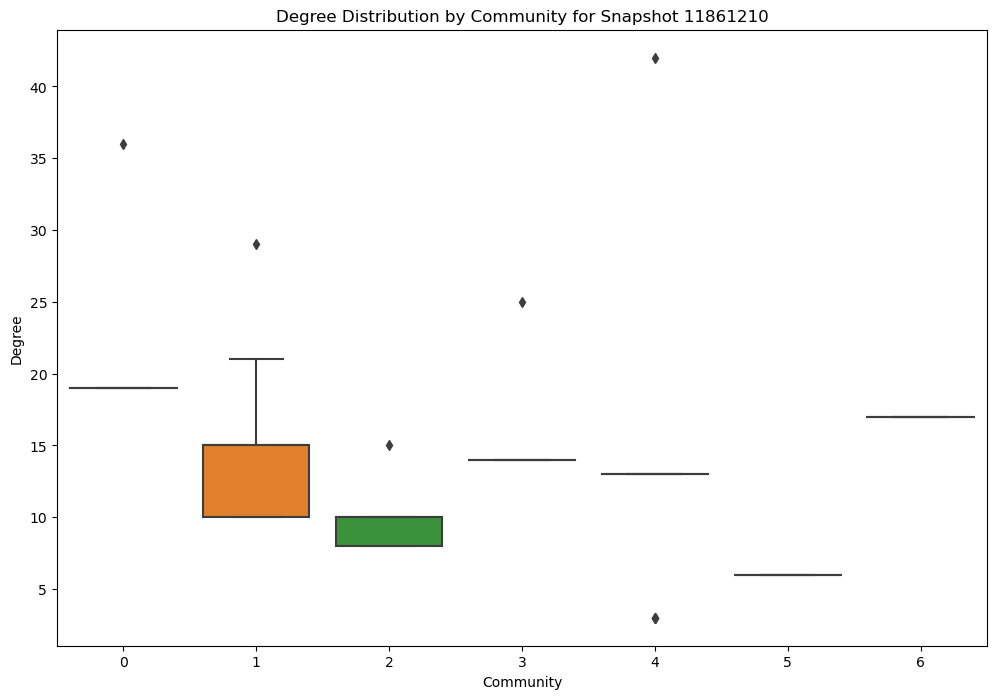

Snapshot: 11861210, Number of communities detected: 7
Community sizes for snapshot 11861210:
Community
1    22
0    20
6    18
4    17
3    15
2    15
5     7
Name: count, dtype: int64
Community Composition Summary for Snapshot 12043054:

  Community     Degree               DegreeCentrality                      \
                  mean       std max             mean       std       max   
0         0  17.000000  0.000000  17         0.147826  0.000000  0.147826   
1         1  18.684211  2.982405  31         0.162471  0.025934  0.269565   
2         2   7.000000  0.000000   7         0.060870  0.000000  0.060870   
3         3  14.866667  3.356586  27         0.129275  0.029188  0.234783   
4         4  10.000000  0.000000  10         0.086957  0.000000  0.086957   
5         5  16.272727  9.572688  52         0.141502  0.083241  0.452174   
6         6  15.294118  9.005309  46         0.132992  0.078307  0.400000   
7         7  10.000000  0.000000  10         0.086957  0.000000  0.0

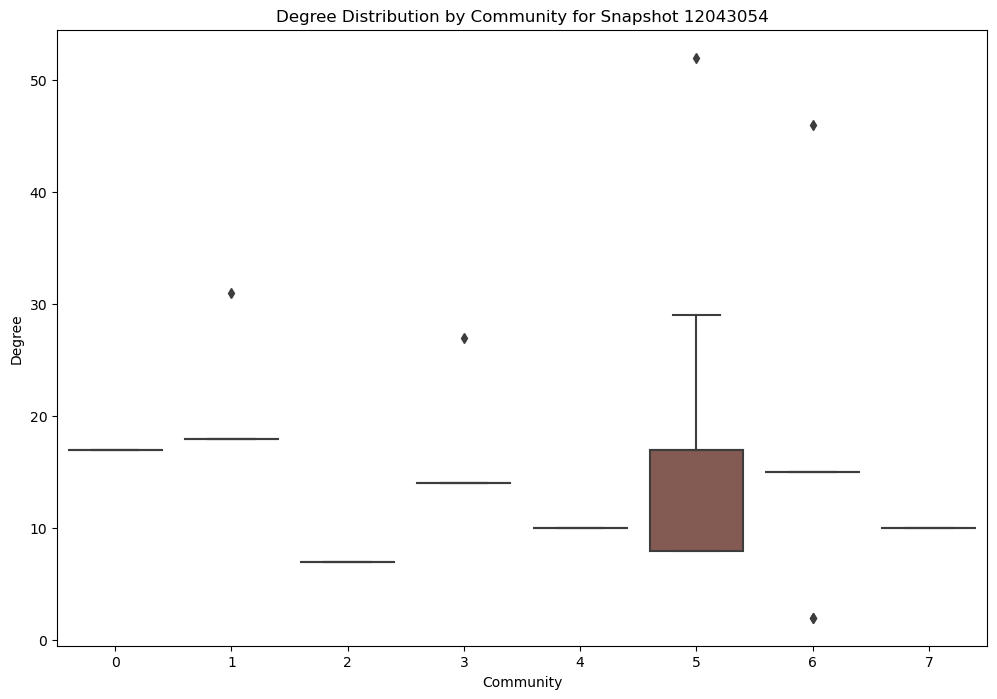

Snapshot: 12043054, Number of communities detected: 8
Community sizes for snapshot 12043054:
Community
5    22
1    19
0    18
6    17
3    15
7     9
4     8
2     8
Name: count, dtype: int64
Community Composition Summary for Snapshot 12244515:

  Community     Degree               DegreeCentrality                      \
                  mean       std max             mean       std       max   
0         0  16.000000  0.000000  16         0.141593  0.000000  0.141593   
1         1  15.033333  8.298248  50         0.133038  0.073436  0.442478   
2         2  14.800000  3.098387  26         0.130973  0.027419  0.230088   
3         3  15.176471  8.582215  44         0.134305  0.075949  0.389381   
4         4  17.000000  0.000000  17         0.150442  0.000000  0.150442   
5         5   9.000000  0.000000   9         0.079646  0.000000  0.079646   
6         6   9.000000  0.000000   9         0.079646  0.000000  0.079646   

  BetweennessCentrality                      
             

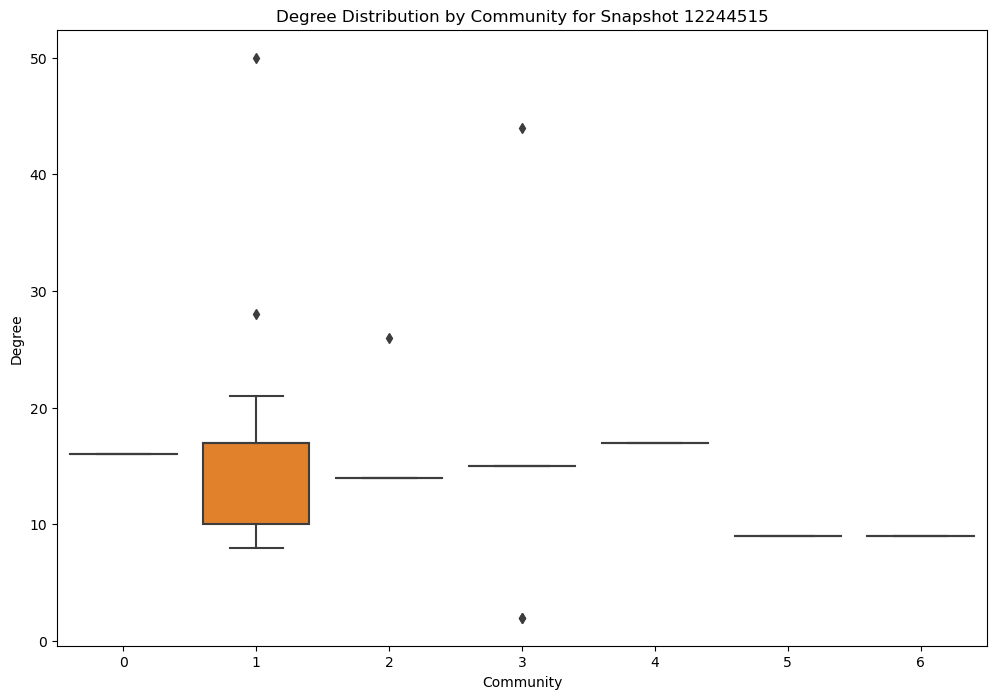

Snapshot: 12244515, Number of communities detected: 7
Community sizes for snapshot 12244515:
Community
1    30
4    18
0    17
3    17
2    15
6    10
5     7
Name: count, dtype: int64
Community Composition Summary for Snapshot 12438842:

  Community     Degree               DegreeCentrality                      \
                  mean       std max             mean       std       max   
0         0   9.000000  0.000000   9         0.076271  0.000000  0.076271   
1         1  15.461538  5.269652  33         0.131030  0.044658  0.279661   
2         2  19.000000  0.000000  19         0.161017  0.000000  0.161017   
3         3  11.842105  2.609026  19         0.100357  0.022110  0.161017   
4         4  15.277778  8.736708  46         0.129473  0.074040  0.389831   
5         5  14.000000  0.000000  14         0.118644  0.000000  0.118644   
6         6  15.214286  8.285098  44         0.128935  0.070213  0.372881   
7         7  11.000000  0.000000  11         0.093220  0.000000  0.0

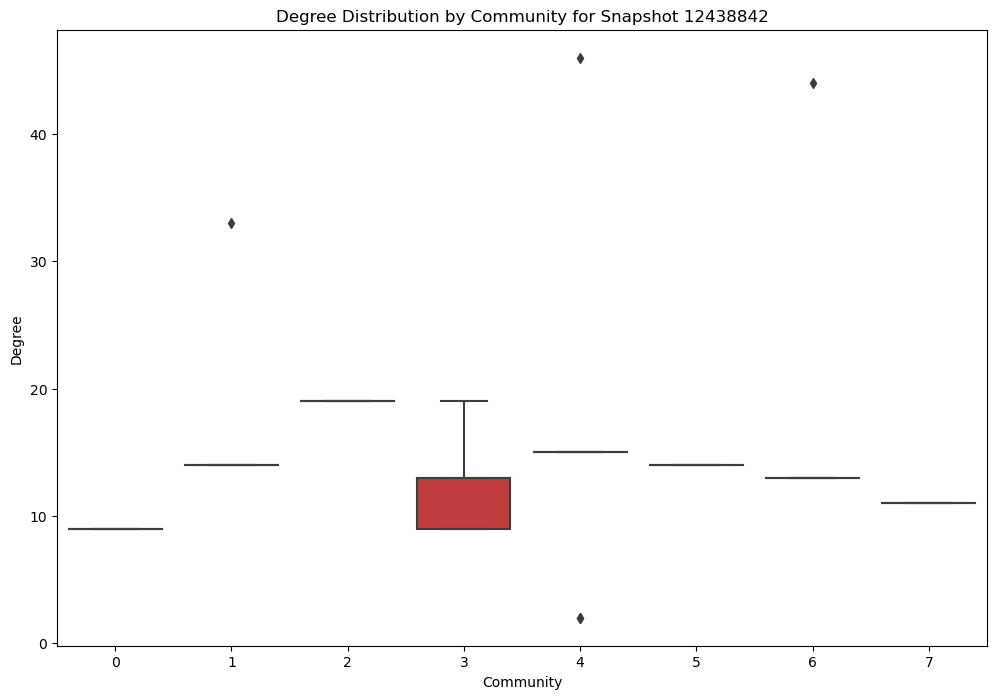

Snapshot: 12438842, Number of communities detected: 8
Community sizes for snapshot 12438842:
Community
2    20
3    19
4    18
5    15
6    14
1    13
7    10
0    10
Name: count, dtype: int64
Community Composition Summary for Snapshot 12638919:

  Community     Degree                DegreeCentrality                      \
                  mean        std max             mean       std       max   
0         0  13.000000   0.000000  13         0.100775  0.000000  0.100775   
1         1  16.812500   7.250000  44         0.130329  0.056202  0.341085   
2         2  12.000000   4.472136  30         0.093023  0.034668  0.232558   
3         3  15.058824  10.673979  54         0.116735  0.082744  0.418605   
4         4   4.000000   0.000000   4         0.031008  0.000000  0.031008   
5         5  10.000000   0.000000  10         0.077519  0.000000  0.077519   
6         6  14.368421   4.957716  28         0.111383  0.038432  0.217054   
7         7  18.000000   0.000000  18         0.139

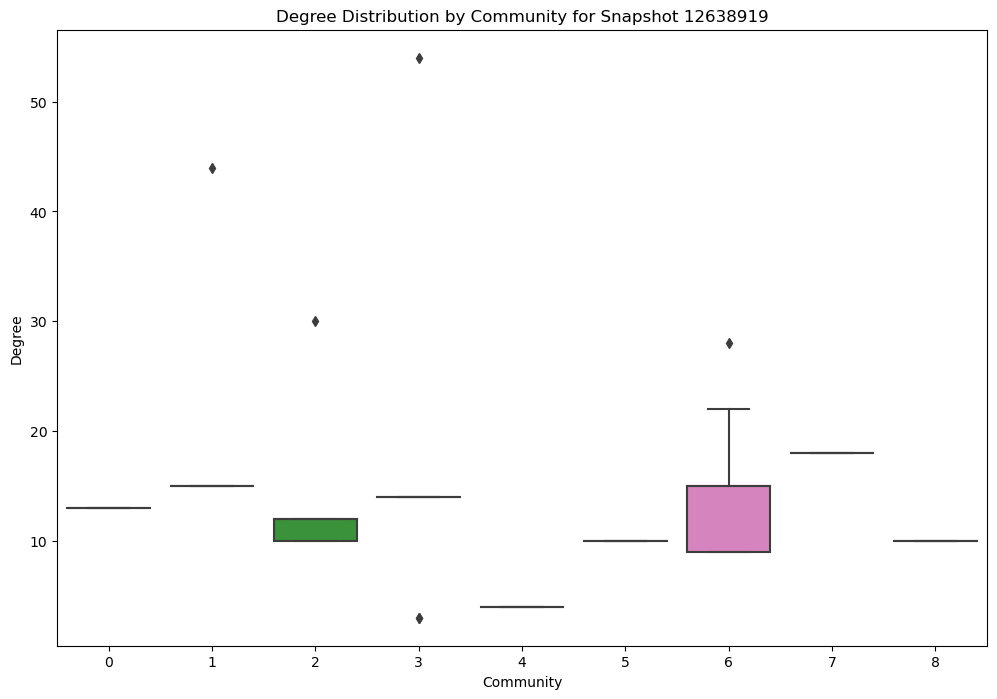

Snapshot: 12638919, Number of communities detected: 9
Community sizes for snapshot 12638919:
Community
6    19
2    19
7    19
3    17
1    16
0    14
5    11
8    10
4     5
Name: count, dtype: int64
Community Composition Summary for Snapshot 12831436:

  Community     Degree                DegreeCentrality                      \
                  mean        std max             mean       std       max   
0         0  13.000000   0.000000  13         0.084416  0.000000  0.084416   
1         1  14.000000   0.000000  14         0.090909  0.000000  0.090909   
2         2  18.000000   0.000000  18         0.116883  0.000000  0.116883   
3         3  17.000000   0.000000  17         0.110390  0.000000  0.110390   
4         4  14.500000   5.196152  31         0.094156  0.033741  0.201299   
5         5  16.000000  18.253767  83         0.103896  0.118531  0.538961   
6         6  10.444444   1.885618  18         0.067821  0.012244  0.116883   
7         7  15.000000   0.000000  15      

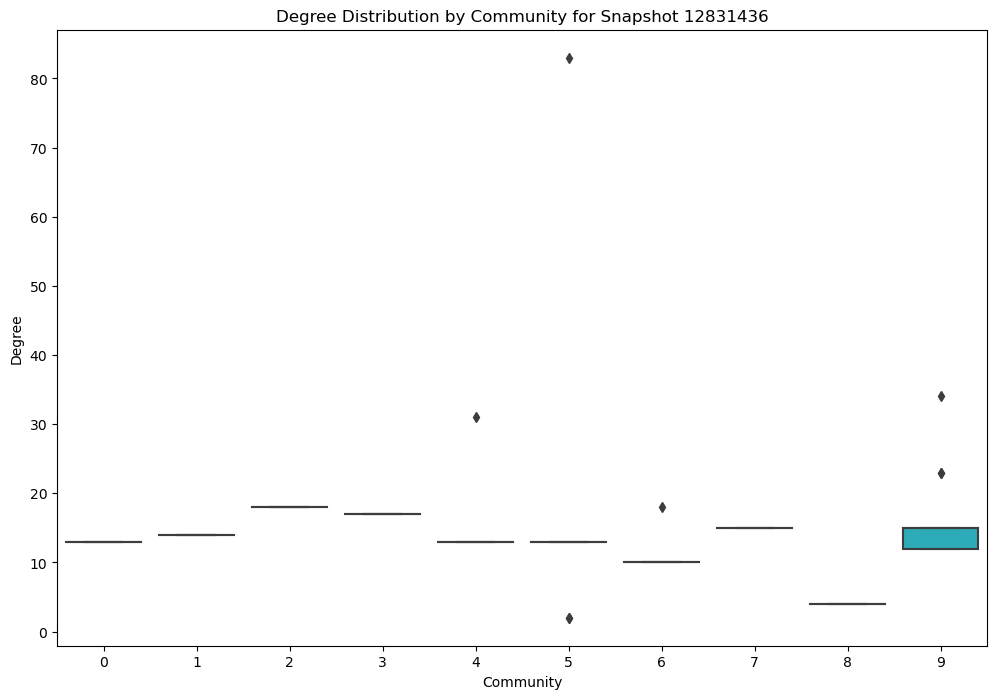

Snapshot: 12831436, Number of communities detected: 10
Community sizes for snapshot 12831436:
Community
9    23
2    19
3    18
6    18
5    16
1    15
7    15
0    14
4    12
8     5
Name: count, dtype: int64
Community Composition Summary for Snapshot 13029639:

   Community     Degree               DegreeCentrality                      \
                   mean       std max             mean       std       max   
0          0  12.000000  0.000000  12         0.072289  0.000000  0.072289   
1          1  17.000000  0.000000  17         0.102410  0.000000  0.102410   
2          2  18.000000  0.000000  18         0.108434  0.000000  0.108434   
3          3  14.000000  0.000000  14         0.084337  0.000000  0.084337   
4          4   3.000000  0.000000   3         0.018072  0.000000  0.018072   
5          5  16.054054  8.051728  52         0.096711  0.048504  0.313253   
6          6   5.000000  0.000000   5         0.030120  0.000000  0.030120   
7          7   9.411765  1.970369 

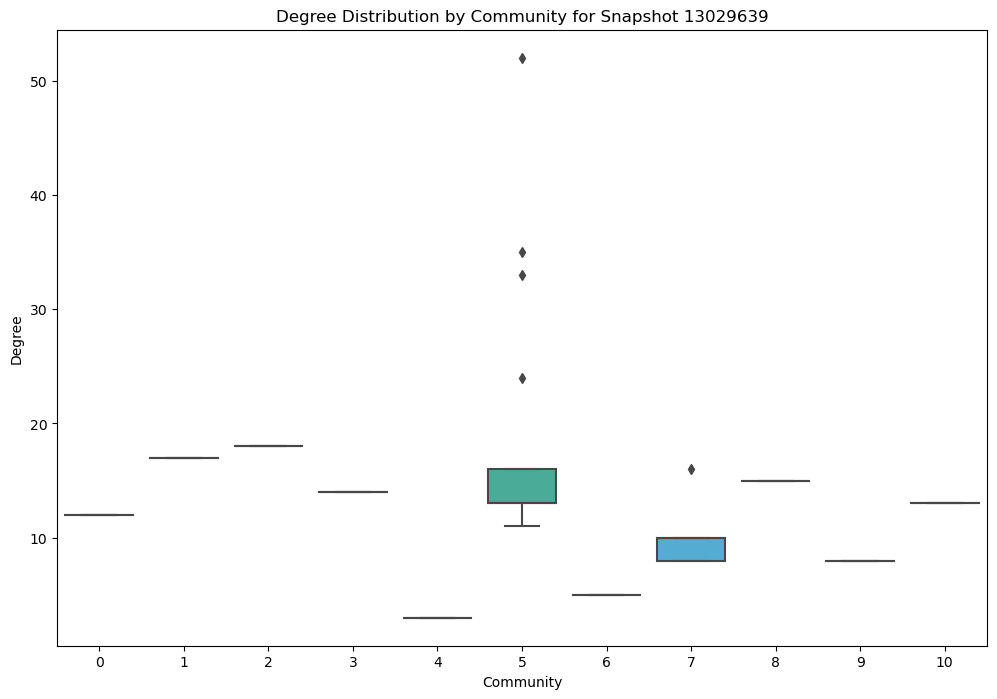

Snapshot: 13029639, Number of communities detected: 11
Community sizes for snapshot 13029639:
Community
5     37
2     19
1     18
7     17
8     16
3     15
10    14
0     13
9      8
6      6
4      4
Name: count, dtype: int64
Community Composition Summary for Snapshot 13230157:

   Community     Degree               DegreeCentrality                      \
                   mean       std max             mean       std       max   
0          0  11.000000  0.000000  11         0.064327  0.000000  0.064327   
1          1  18.000000  0.000000  18         0.105263  0.000000  0.105263   
2          2  11.000000  0.000000  11         0.064327  0.000000  0.064327   
3          3  16.125000  7.990824  43         0.094298  0.046730  0.251462   
4          4  11.000000  0.000000  11         0.064327  0.000000  0.064327   
5          5   3.000000  0.000000   3         0.017544  0.000000  0.017544   
6          6  10.894737  2.282658  18         0.063712  0.013349  0.105263   
7          7  1

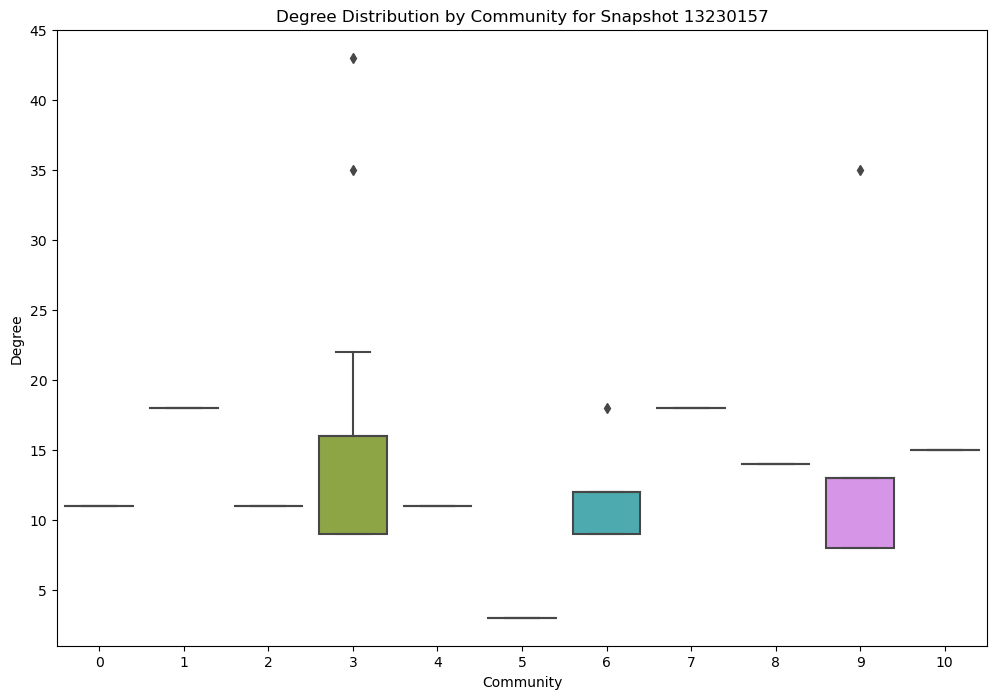

Snapshot: 13230157, Number of communities detected: 11
Community sizes for snapshot 13230157:
Community
3     24
9     20
1     19
6     19
7     19
10    16
8     15
0     12
2     12
4     12
5      4
Name: count, dtype: int64
Community Composition Summary for Snapshot 13422506:

   Community     Degree               DegreeCentrality                      \
                   mean       std max             mean       std       max   
0          0   8.000000  0.000000   8         0.044944  0.000000  0.044944   
1          1  16.948718  9.267796  66         0.095218  0.052066  0.370787   
2          2  17.529412  6.305926  42         0.098480  0.035427  0.235955   
3          3  18.000000  0.000000  18         0.101124  0.000000  0.101124   
4          4  15.000000  0.000000  15         0.084270  0.000000  0.084270   
5          5  15.000000  0.000000  15         0.084270  0.000000  0.084270   
6          6  13.000000  0.000000  13         0.073034  0.000000  0.073034   
7          7   

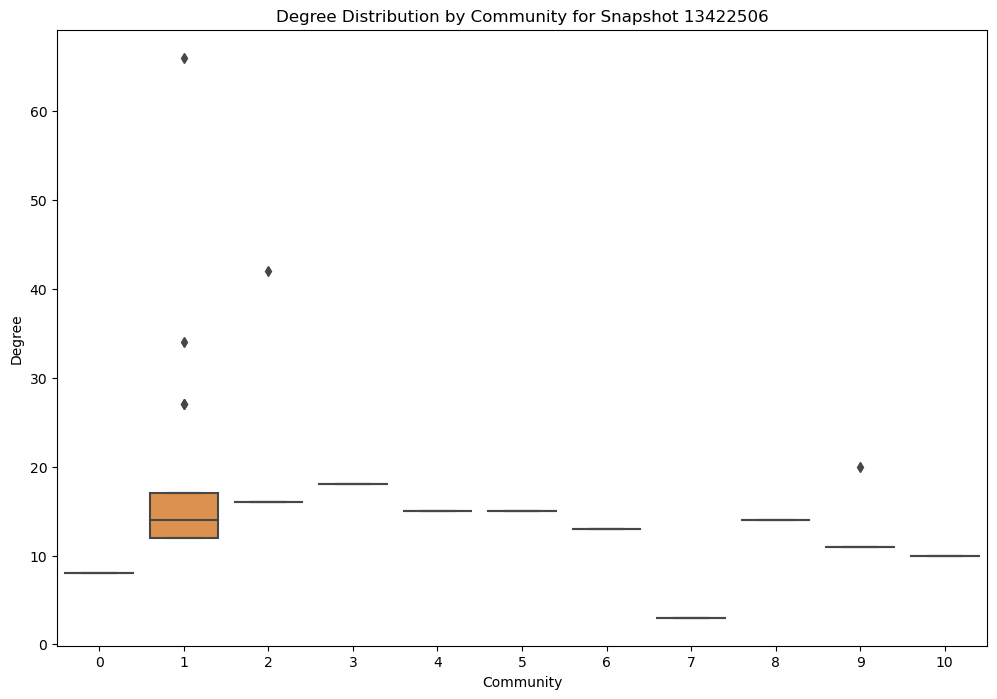

Snapshot: 13422506, Number of communities detected: 11
Community sizes for snapshot 13422506:
Community
1     39
9     20
3     19
2     17
4     16
5     16
8     15
6     14
10    11
0      8
7      4
Name: count, dtype: int64
Community Composition Summary for Snapshot 13620205:

   Community     Degree                DegreeCentrality                      \
                   mean        std max             mean       std       max   
0          0  13.000000   0.000000  13         0.072222  0.000000  0.072222   
1          1  10.000000   0.000000  10         0.055556  0.000000  0.055556   
2          2  15.000000   0.000000  15         0.083333  0.000000  0.083333   
3          3  18.000000   0.000000  18         0.100000  0.000000  0.100000   
4          4  15.000000   0.000000  15         0.083333  0.000000  0.083333   
5          5  16.000000   0.000000  16         0.088889  0.000000  0.088889   
6          6  18.464286   7.460921  47         0.102579  0.041450  0.261111   
7     

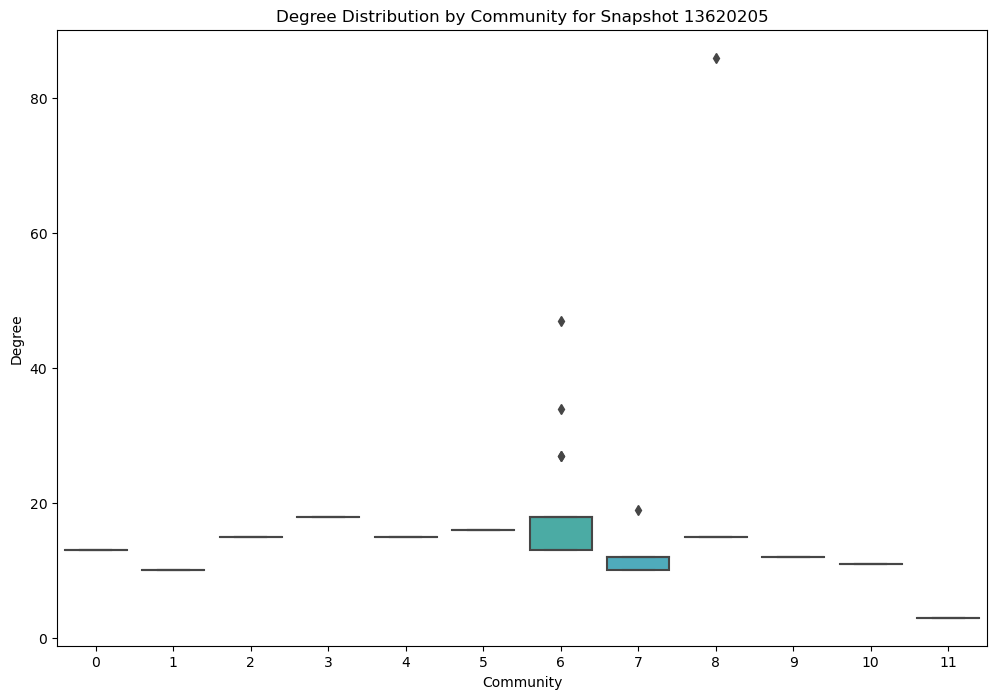

Snapshot: 13620205, Number of communities detected: 12
Community sizes for snapshot 13620205:
Community
6     28
7     19
3     19
5     17
2     16
8     16
4     15
0     14
9     12
1     11
10    10
11     4
Name: count, dtype: int64
Community Composition Summary for Snapshot 13809597:

   Community Degree                DegreeCentrality                      \
               mean        std max             mean       std       max   
0          0  18.00   0.000000  18         0.104046  0.000000  0.104046   
1          1  11.45   2.012461  20         0.066185  0.011633  0.115607   
2          2  17.50   4.909175  34         0.101156  0.028377  0.196532   
3          3  12.00   0.000000  12         0.069364  0.000000  0.069364   
4          4  13.75   7.559906  48         0.079480  0.043699  0.277457   
5          5  14.60   2.323790  23         0.084393  0.013432  0.132948   
6          6  10.00   0.000000  10         0.057803  0.000000  0.057803   
7          7  15.00   0.000000  1

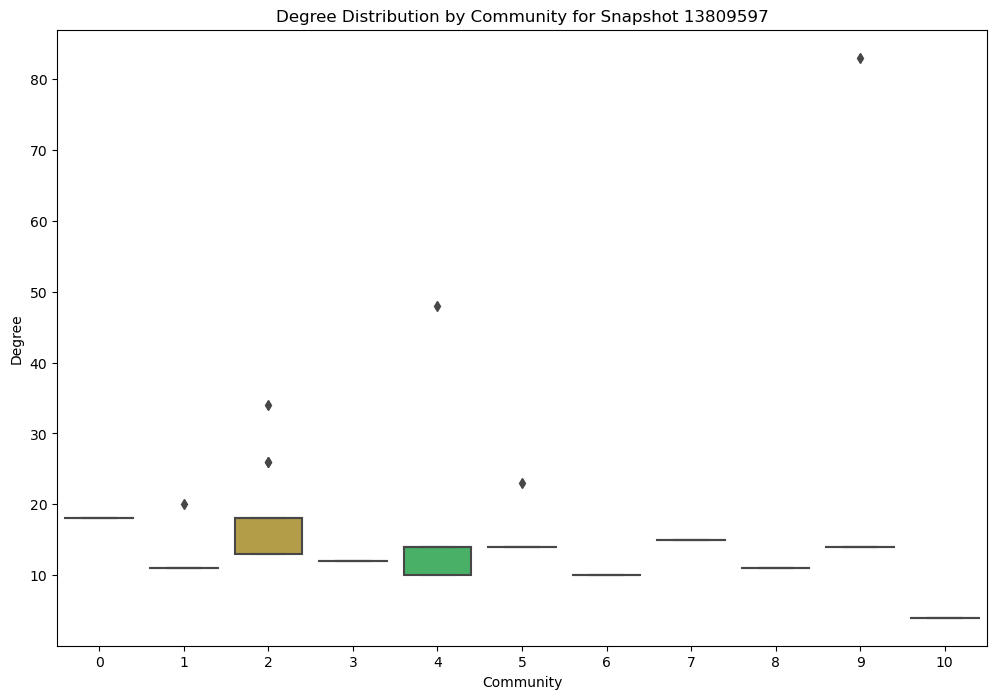

Snapshot: 13809597, Number of communities detected: 11
Community sizes for snapshot 13809597:
Community
2     26
4     24
1     20
0     19
7     16
5     15
9     15
3     13
6     11
8     10
10     5
Name: count, dtype: int64
Community Composition Summary for Snapshot 14009885:

   Community     Degree                DegreeCentrality                      \
                   mean        std max             mean       std       max   
0          0  10.000000   0.000000  10         0.058140  0.000000  0.058140   
1          1  16.187500   4.750000  34         0.094113  0.027616  0.197674   
2          2  18.000000   0.000000  18         0.104651  0.000000  0.104651   
3          3  15.466667   5.680376  36         0.089922  0.033025  0.209302   
4          4  16.551724   7.505171  37         0.096231  0.043635  0.215116   
5          5  18.600000  17.815723  83         0.108140  0.103580  0.482558   
6          6  12.000000   0.000000  12         0.069767  0.000000  0.069767   
7     

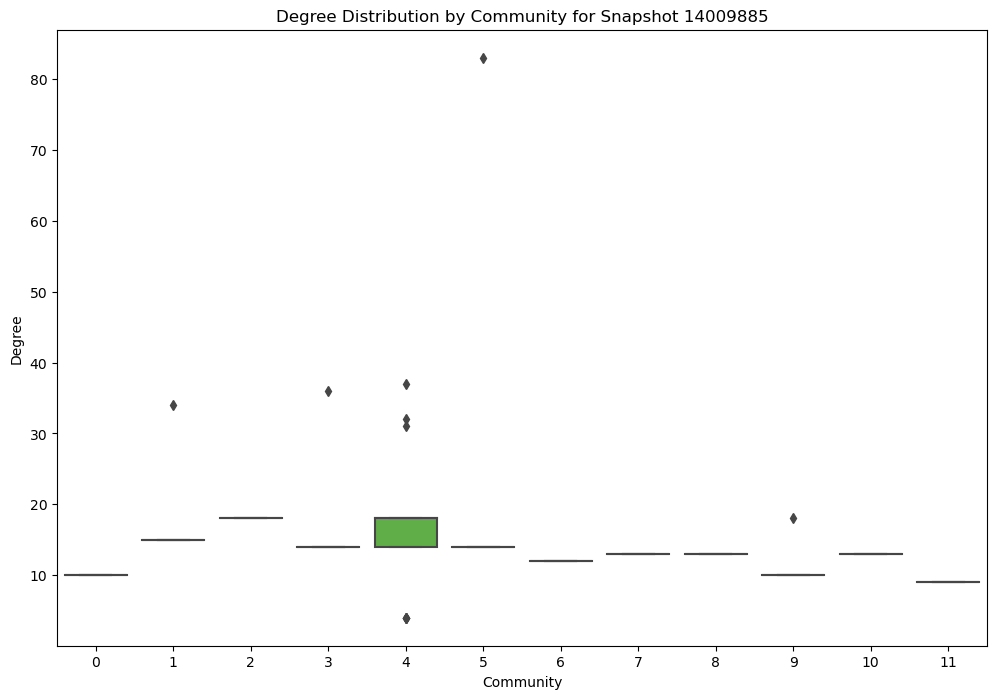

Snapshot: 14009885, Number of communities detected: 12
Community sizes for snapshot 14009885:
Community
4     29
2     19
1     16
3     15
5     15
6     13
8     13
10    13
0     11
7     11
9      9
11     9
Name: count, dtype: int64
Community Composition Summary for Snapshot 14210564:

   Community     Degree                DegreeCentrality                      \
                   mean        std max             mean       std       max   
0          0  17.000000   0.000000  17         0.095506  0.000000  0.095506   
1          1  17.062500   7.865554  35         0.095857  0.044189  0.196629   
2          2  17.235294   5.093248  37         0.096827  0.028614  0.207865   
3          3  10.000000   0.000000  10         0.056180  0.000000  0.056180   
4          4  10.000000   0.000000  10         0.056180  0.000000  0.056180   
5          5  15.066667   4.131182  30         0.084644  0.023209  0.168539   
6          6  14.000000   0.000000  14         0.078652  0.000000  0.078652 

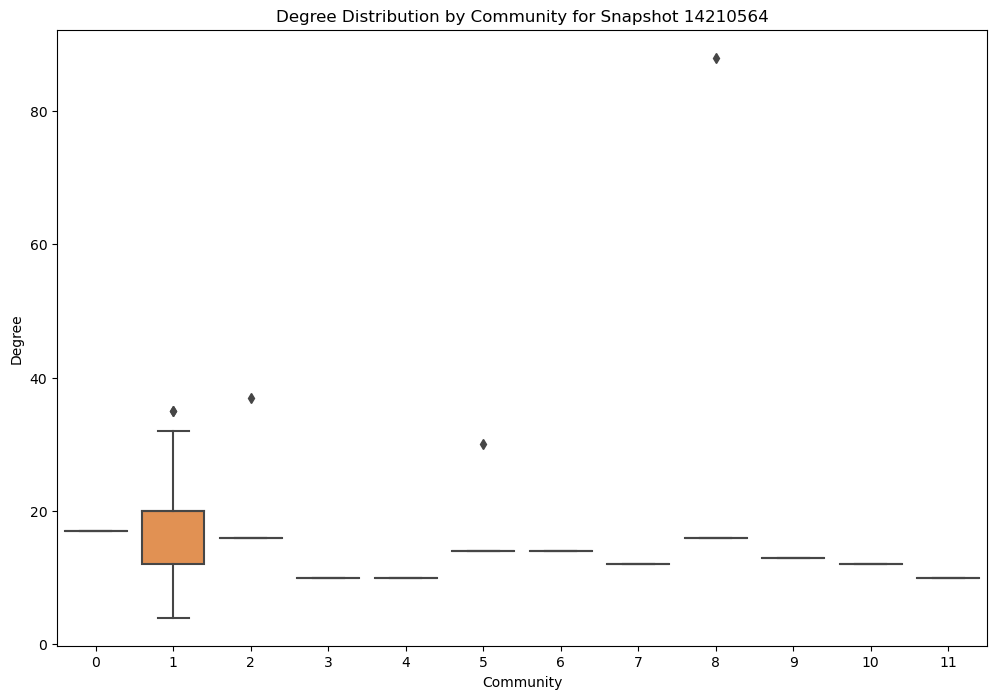

Snapshot: 14210564, Number of communities detected: 12
Community sizes for snapshot 14210564:
Community
1     32
0     18
2     17
8     17
5     15
7     13
9     13
6     12
10    12
11    11
4     10
3      9
Name: count, dtype: int64
Community Composition Summary for Snapshot 14391029:

   Community     Degree                 DegreeCentrality                      \
                   mean        std  max             mean       std       max   
0          0  19.880000   9.765244   45         0.108634  0.053362  0.245902   
1          1  13.000000   0.000000   13         0.071038  0.000000  0.071038   
2          2  16.000000   0.000000   16         0.087432  0.000000  0.087432   
3          3  12.000000   0.000000   12         0.065574  0.000000  0.065574   
4          4  17.000000   0.000000   17         0.092896  0.000000  0.092896   
5          5  17.294118   5.335784   38         0.094503  0.029157  0.207650   
6          6  10.000000   0.000000   10         0.054645  0.000000  

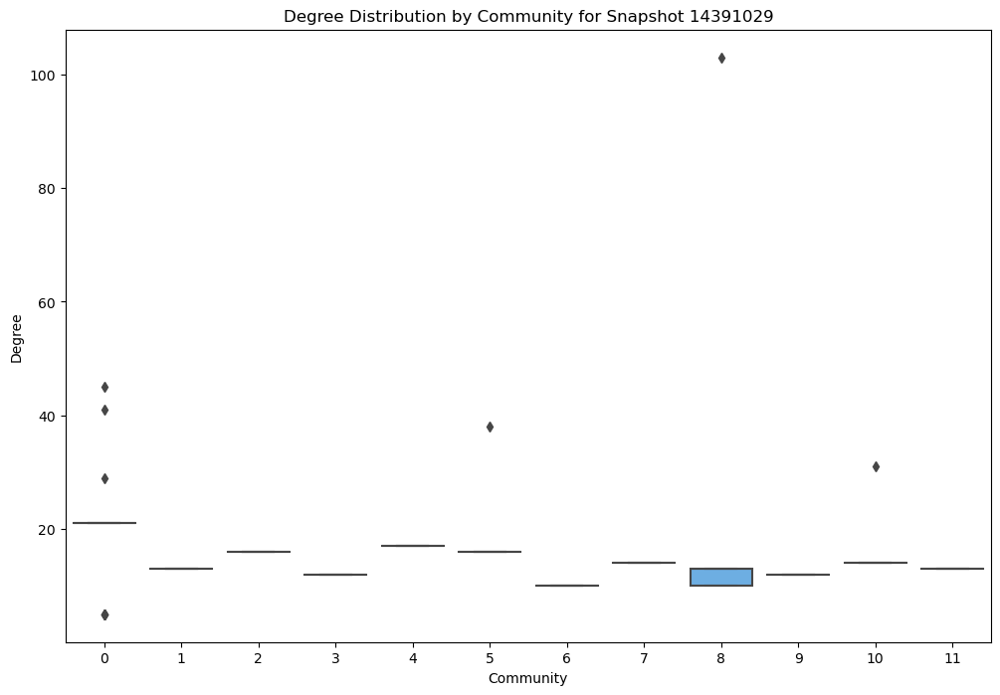

Snapshot: 14391029, Number of communities detected: 12
Community sizes for snapshot 14391029:
Community
0     25
8     24
4     18
5     17
2     16
10    15
3     13
7     12
11    12
9     11
6     11
1     10
Name: count, dtype: int64
Community Composition Summary for Snapshot 14589816:

   Community     Degree                 DegreeCentrality                      \
                   mean        std  max             mean       std       max   
0          0  14.000000   0.000000   14         0.074074  0.000000  0.074074   
1          1  16.000000   0.000000   16         0.084656  0.000000  0.084656   
2          2  20.000000   0.000000   20         0.105820  0.000000  0.105820   
3          3  12.000000   0.000000   12         0.063492  0.000000  0.063492   
4          4  12.000000   0.000000   12         0.063492  0.000000  0.063492   
5          5  11.000000   0.000000   11         0.058201  0.000000  0.058201   
6          6  20.133333  23.754298  106         0.106526  0.125684  

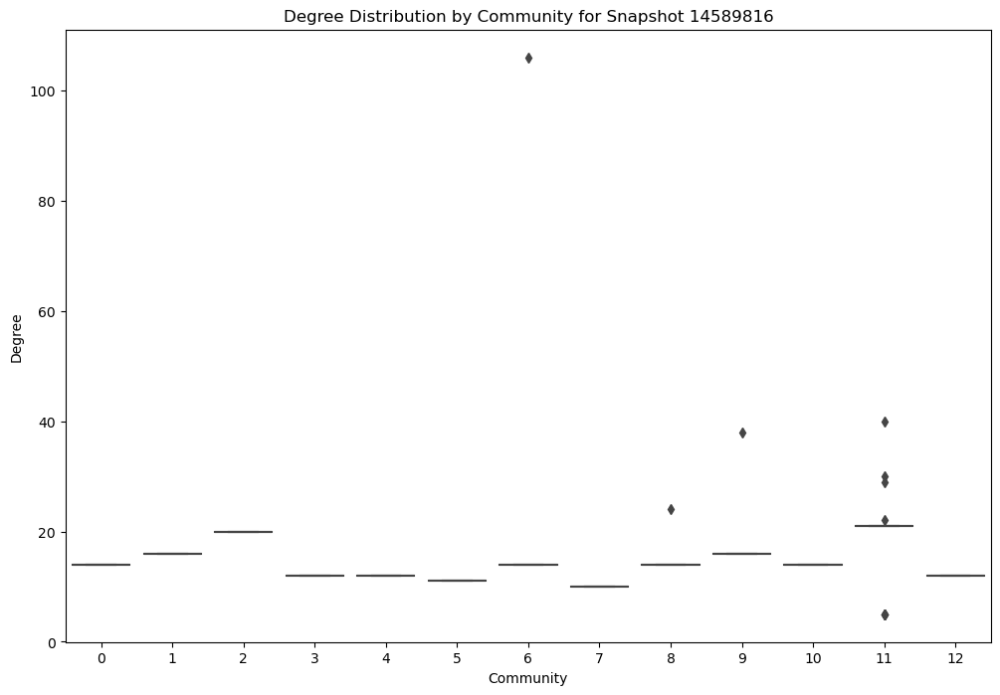

Snapshot: 14589816, Number of communities detected: 13
Community sizes for snapshot 14589816:
Community
11    26
2     21
9     17
1     16
6     15
8     15
4     13
3     12
0     12
5     11
7     11
12    11
10    10
Name: count, dtype: int64
Community Composition Summary for Snapshot 14779829:

   Community     Degree                 DegreeCentrality                      \
                   mean        std  max             mean       std       max   
0          0  13.000000   0.000000   13         0.072626  0.000000  0.072626   
1          1  10.000000   0.000000   10         0.055866  0.000000  0.055866   
2          2  17.176471   4.850713   36         0.095958  0.027099  0.201117   
3          3  13.000000   0.000000   13         0.072626  0.000000  0.072626   
4          4  16.000000   0.000000   16         0.089385  0.000000  0.089385   
5          5  15.000000   3.872983   29         0.083799  0.021637  0.162011   
6          6  17.260870  10.207918   57         0.096429  0

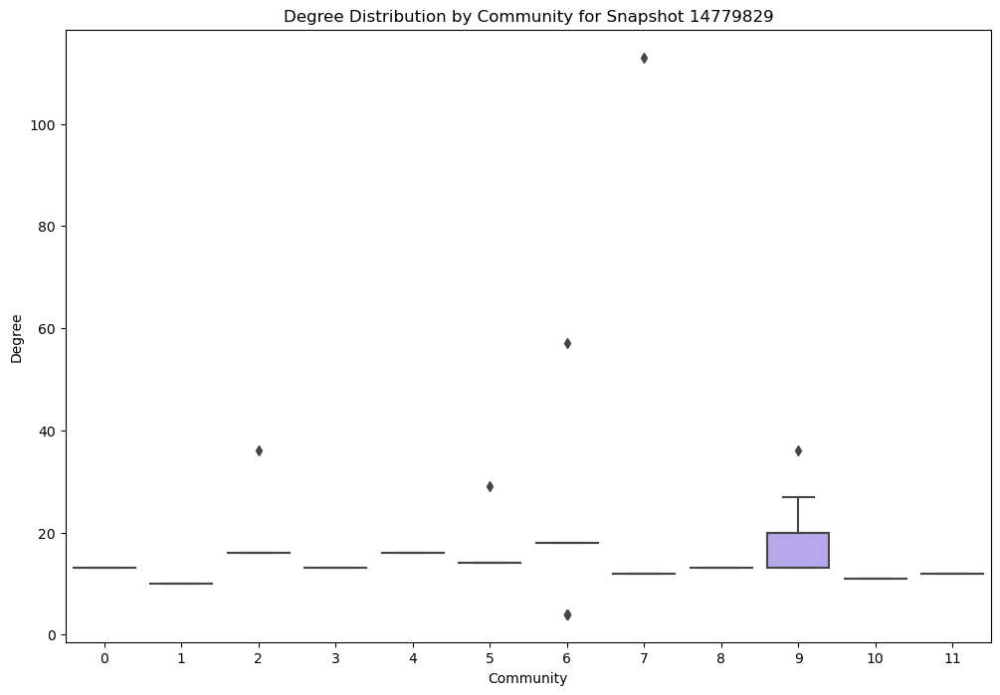

Snapshot: 14779829, Number of communities detected: 12
Community sizes for snapshot 14779829:
Community
9     27
6     23
2     17
4     16
5     15
3     13
7     13
8     13
11    12
0     11
1     11
10     9
Name: count, dtype: int64
Community Composition Summary for Snapshot 14967365:

   Community     Degree                 DegreeCentrality                      \
                   mean        std  max             mean       std       max   
0          0  34.125000   3.309322   48         0.172348  0.016714  0.242424   
1          1  10.000000   0.000000   10         0.050505  0.000000  0.050505   
2          2  15.000000   0.000000   15         0.075758  0.000000  0.075758   
3          3  16.545455  10.769124   59         0.083563  0.054390  0.297980   
4          4  12.000000   0.000000   12         0.060606  0.000000  0.060606   
5          5  13.000000   0.000000   13         0.065657  0.000000  0.065657   
6          6  15.000000   0.000000   15         0.075758  0.000000  

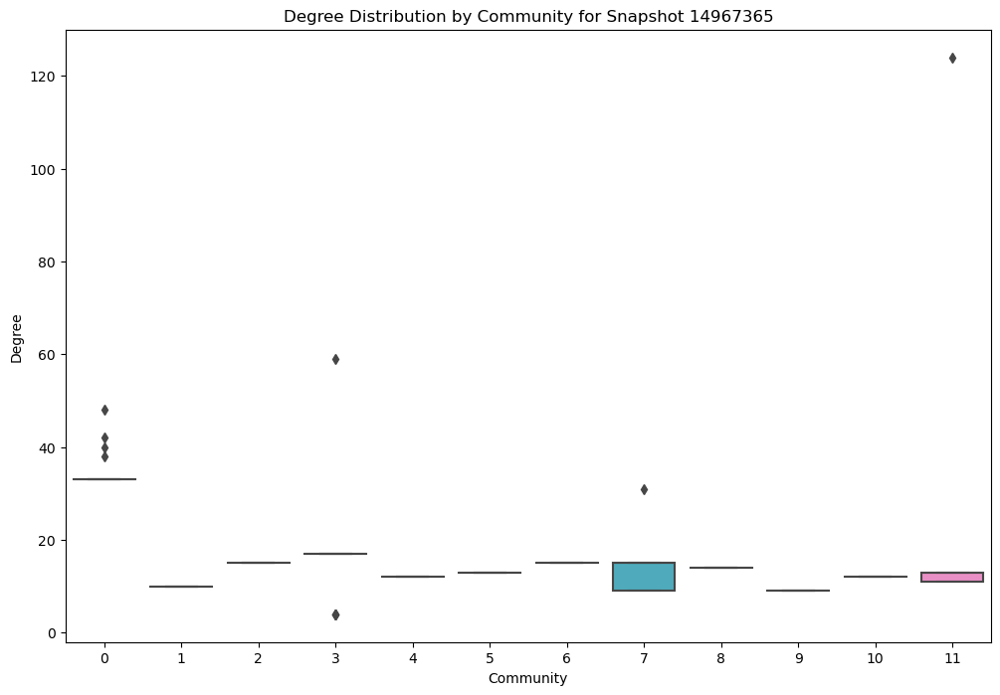

Snapshot: 14967365, Number of communities detected: 12
Community sizes for snapshot 14967365:
Community
0     32
7     24
3     22
11    22
2     15
6     15
8     14
5     13
10    12
1     11
9     10
4      9
Name: count, dtype: int64
Community detection and analysis complete.


In [30]:
import os
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from community import community_louvain
from dotenv import load_dotenv
import seaborn as sns

# Load environment variables from .env file (if needed for other variables)
load_dotenv()

# Set the input directory directly to the local folder where the graphs are stored
input_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'

# Check if the input directory exists
if not os.path.exists(input_directory):
    raise FileNotFoundError(f"Input directory does not exist: {input_directory}")

print(f"Input directory is set to: {input_directory}")

# Function to load graphs from snapshots
def load_wallet_graphs_from_snapshots(df_snapshots, input_directory):
    graphs = {}
    dates = {}
    missing_snapshots = []
    
    for index, row in df_snapshots.iterrows():
        snapshot = row['Block Height']
        date = row['Date'].strftime('%Y-%m-%d')  # Format date as string
        dates[snapshot] = date
        file_path = os.path.join(input_directory, f"validated_wallet_projection_graph_{snapshot}.graphml")
        
        print(f"Checking file: {file_path}")  # Debug print

        if os.path.exists(file_path):
            graph = nx.read_graphml(file_path)
            graphs[snapshot] = graph
            print(f"Loaded graph for snapshot {snapshot}")
        else:
            print(f"Graph file for snapshot {snapshot} does not exist at {file_path}")
            missing_snapshots.append(snapshot)
    
    return graphs, dates, missing_snapshots

# Function to perform community detection using the Louvain method
def detect_communities(graph):
    partition = community_louvain.best_partition(graph)
    return partition

# Function to analyze community composition
def analyze_community_composition(graph, partition, snapshot, output_directory):
    community_data = pd.DataFrame.from_dict(partition, orient='index', columns=['Community'])
    
    # Compute node degrees
    degrees = dict(graph.degree())
    community_data['Degree'] = community_data.index.map(degrees)
    
    # Compute centrality measures
    degree_centrality = nx.degree_centrality(graph)
    betweenness_centrality = nx.betweenness_centrality(graph)
    community_data['DegreeCentrality'] = community_data.index.map(degree_centrality)
    community_data['BetweennessCentrality'] = community_data.index.map(betweenness_centrality)
    
    # Analyze each community
    community_summary = community_data.groupby('Community').agg({
        'Degree': ['mean', 'std', 'max'],
        'DegreeCentrality': ['mean', 'std', 'max'],
        'BetweennessCentrality': ['mean', 'std', 'max']
    }).reset_index()
    
    print(f"Community Composition Summary for Snapshot {snapshot}:\n")
    print(community_summary)
    
    # Save the detailed community data
    community_data.to_csv(os.path.join(output_directory, f'community_composition_snapshot_{snapshot}.csv'))
    community_summary.to_csv(os.path.join(output_directory, f'community_summary_snapshot_{snapshot}.csv'))
    
    # Visualize community degree distributions
    plt.figure(figsize=(12, 8))
    sns.boxplot(x='Community', y='Degree', data=community_data)
    plt.title(f"Degree Distribution by Community for Snapshot {snapshot}")
    plt.xlabel('Community')
    plt.ylabel('Degree')
    plt.savefig(os.path.join(output_directory, f'degree_distribution_snapshot_{snapshot}.png'))
    plt.show()

# Assuming df_snapshots is already loaded
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
df_snapshots = pd.read_csv(os.path.join(data_directory, 'snapshot_selection.csv'))
df_snapshots['Date'] = pd.to_datetime(df_snapshots['Date'])  # Ensure dates are in datetime format

# Load the graphs
graphs, dates, missing_snapshots = load_wallet_graphs_from_snapshots(df_snapshots, input_directory)

# Directory to save visualizations
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/output'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Perform community detection and analyze composition
partitions = {}
sorted_snapshots = sorted(graphs.keys())
for snapshot in sorted_snapshots:
    graph = graphs[snapshot]
    partition = detect_communities(graph)
    partitions[snapshot] = partition
    
    # Analyze community composition
    analyze_community_composition(graph, partition, snapshot, output_directory)
    
    # Save partition information
    partition_df = pd.DataFrame(list(partition.items()), columns=['Node', 'Community'])
    partition_df.to_csv(os.path.join(output_directory, f'partition_snapshot_{snapshot}.csv'), index=False)
    
    # Analyze community structure
    community_sizes = partition_df['Community'].value_counts()
    print(f"Snapshot: {snapshot}, Number of communities detected: {len(community_sizes)}")
    print(f"Community sizes for snapshot {snapshot}:")
    print(community_sizes)
    
    # Save community sizes to a CSV file
    community_sizes.to_csv(os.path.join(output_directory, f'community_sizes_snapshot_{snapshot}.csv'))

print("Community detection and analysis complete.")


## Temporal dynamics
#### Louvain

## Functionality and Role

Input directory is set to: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Graph file for snapshot 7962629 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Graph file for snapshot 8155117 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8354625.graphml
Graph file for snapshot 8354625 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_gra

Loaded graph for snapshot 14589816
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14779829.graphml
Loaded graph for snapshot 14779829
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14967365.graphml
Loaded graph for snapshot 14967365
Role Summary for Snapshot 11659570:

  Community    degree                     betweenness                      \
                 mean       std       max        mean       std       max   
0         0  0.112910  0.042885  0.222222    0.018300  0.016478  0.068725   
1         1  0.149321  0.051824  0.350427    0.013085  0.053953  0.222453   
2         2  0.177859  0.031707  0.316239    0.010136  0.046449  0.212855   
3         3  0.145299  0.000000  0.145299    0.000000  0.000000  0.000000   
4         4  0.142283  0.022802  0.230769    0.009847  0.040601  0.167403   
5         5  0.076923  0.000000  0.

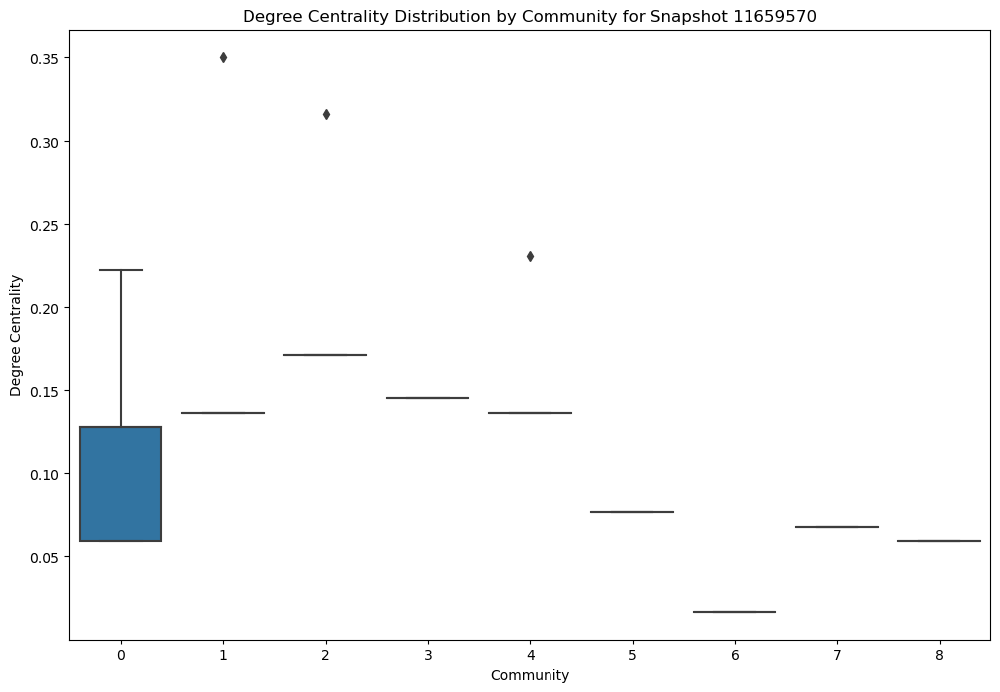

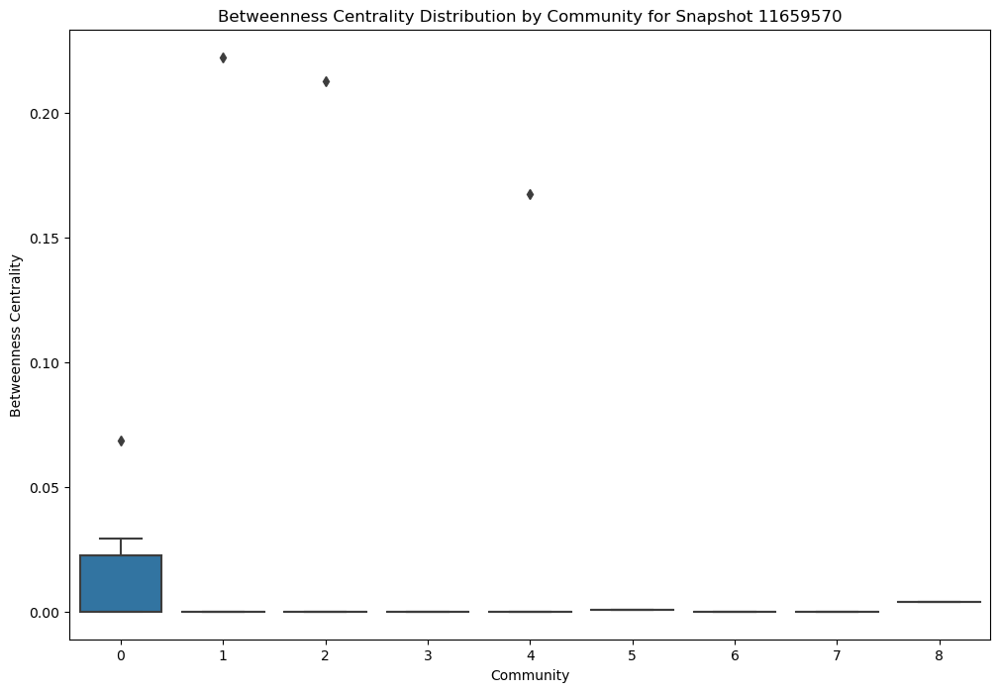

Snapshot: 11659570, Number of communities detected: 9
Community sizes for snapshot 11659570:
Community
2    21
0    19
3    18
1    17
4    17
7     9
5     8
8     6
6     3
Name: count, dtype: int64
Role Summary for Snapshot 11861210:

  Community    degree                     betweenness                      \
                 mean       std       max        mean       std       max   
0         0  0.175664  0.033640  0.318584    0.011169  0.049949  0.223378   
1         1  0.122687  0.039979  0.256637    0.018270  0.021312  0.092175   
2         2  0.084366  0.015995  0.132743    0.003503  0.002483  0.009592   
3         3  0.130383  0.025134  0.221239    0.010914  0.042271  0.163717   
4         4  0.114524  0.074730  0.371681    0.014284  0.058893  0.242822   
5         5  0.053097  0.000000  0.053097    0.000000  0.000000  0.000000   
6         6  0.150442  0.000000  0.150442    0.000000  0.000000  0.000000   

  closeness                       eigenvector                       

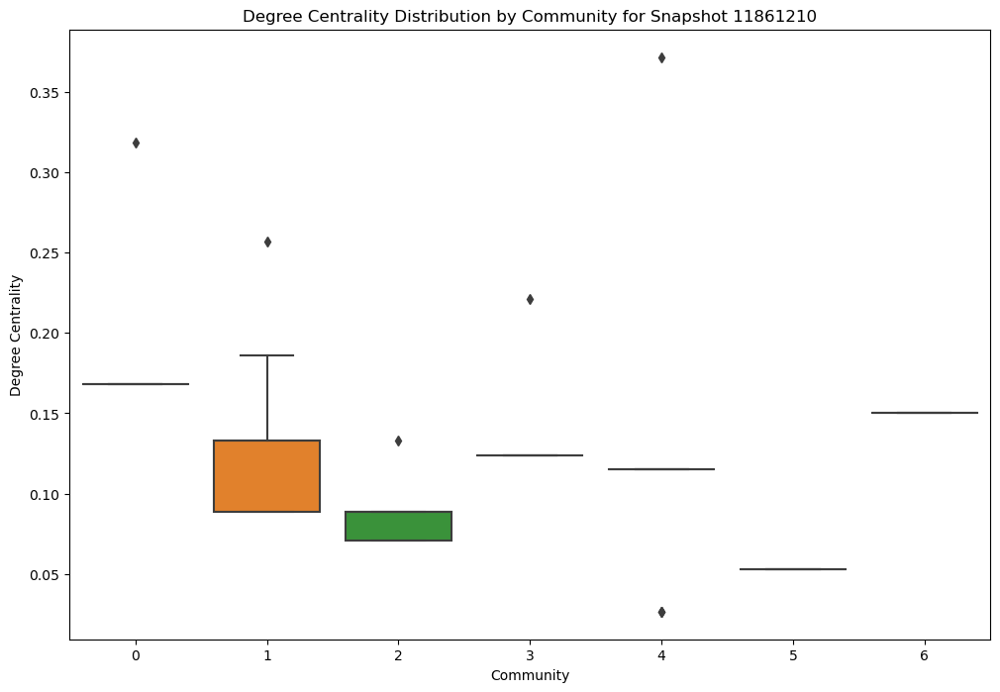

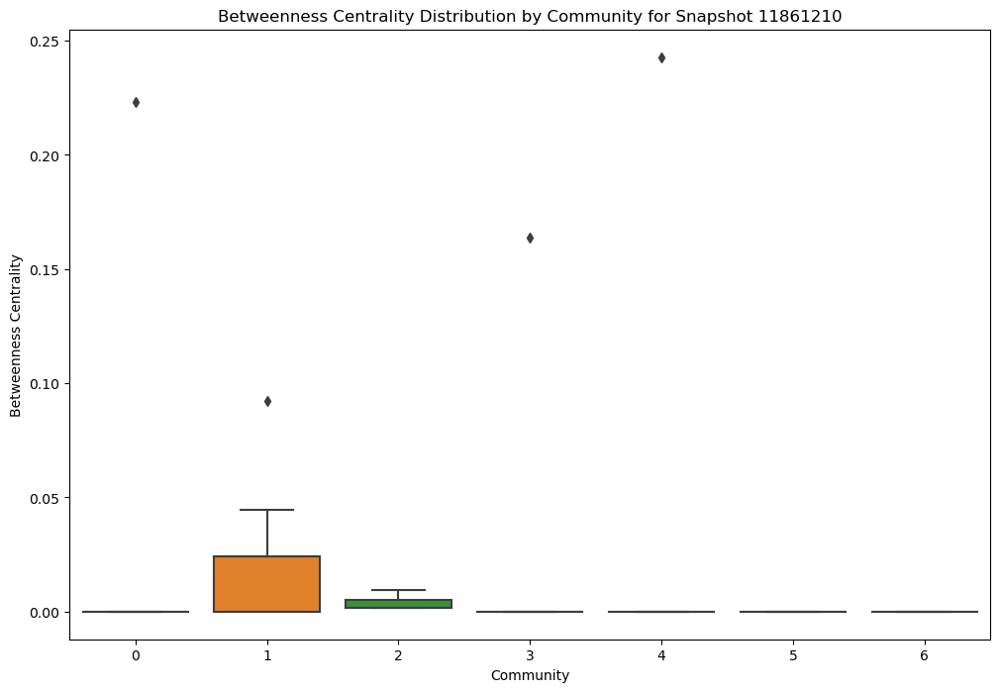

Snapshot: 11861210, Number of communities detected: 7
Community sizes for snapshot 11861210:
Community
1    22
0    20
6    18
4    17
3    15
2    15
5     7
Name: count, dtype: int64
Role Summary for Snapshot 12043054:

  Community    degree                     betweenness                      \
                 mean       std       max        mean       std       max   
0         0  0.147826  0.000000  0.147826    0.000000  0.000000  0.000000   
1         1  0.162471  0.025934  0.269565    0.010261  0.044728  0.194966   
2         2  0.060870  0.000000  0.060870    0.000000  0.000000  0.000000   
3         3  0.129275  0.029188  0.234783    0.010679  0.041359  0.160183   
4         4  0.086957  0.000000  0.086957    0.000131  0.000000  0.000131   
5         5  0.132992  0.078307  0.400000    0.008977  0.036796  0.151767   
6         6  0.141502  0.083241  0.452174    0.022844  0.038214  0.184828   
7         7  0.086957  0.000000  0.086957    0.000060  0.000000  0.000060   

  close

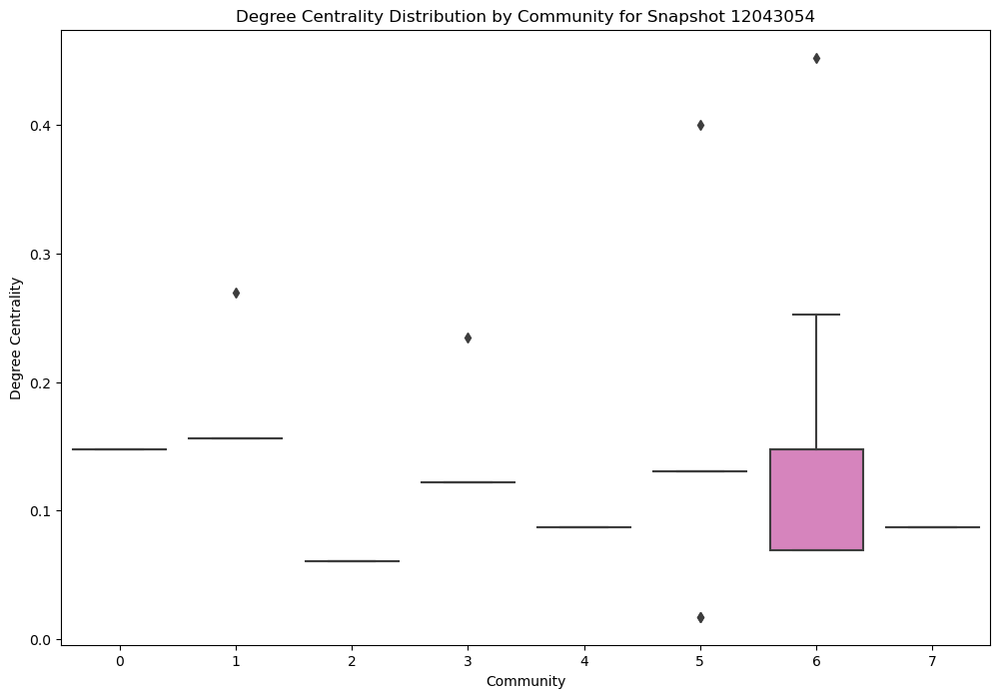

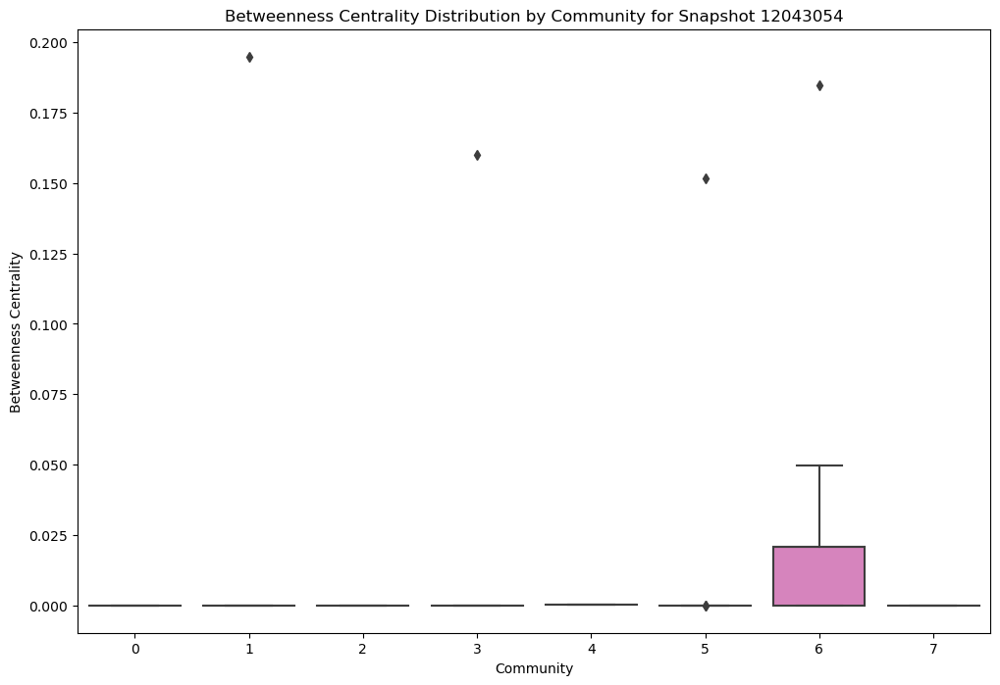

Snapshot: 12043054, Number of communities detected: 8
Community sizes for snapshot 12043054:
Community
6    22
1    19
0    18
5    17
3    15
7     9
4     8
2     8
Name: count, dtype: int64
Role Summary for Snapshot 12244515:

  Community    degree                     betweenness                      \
                 mean       std       max        mean       std       max   
0         0  0.141593  0.000000  0.141593    0.000000  0.000000  0.000000   
1         1  0.133038  0.073436  0.442478    0.008773  0.021041  0.116051   
2         2  0.130973  0.027419  0.230088    0.007965  0.030847  0.119469   
3         3  0.079646  0.000000  0.079646    0.000000  0.000000  0.000000   
4         4  0.150442  0.000000  0.150442    0.000000  0.000000  0.000000   
5         5  0.079646  0.000000  0.079646    0.000050  0.000000  0.000050   
6         6  0.134305  0.075949  0.389381    0.005618  0.022986  0.094817   

  closeness                       eigenvector                          
    

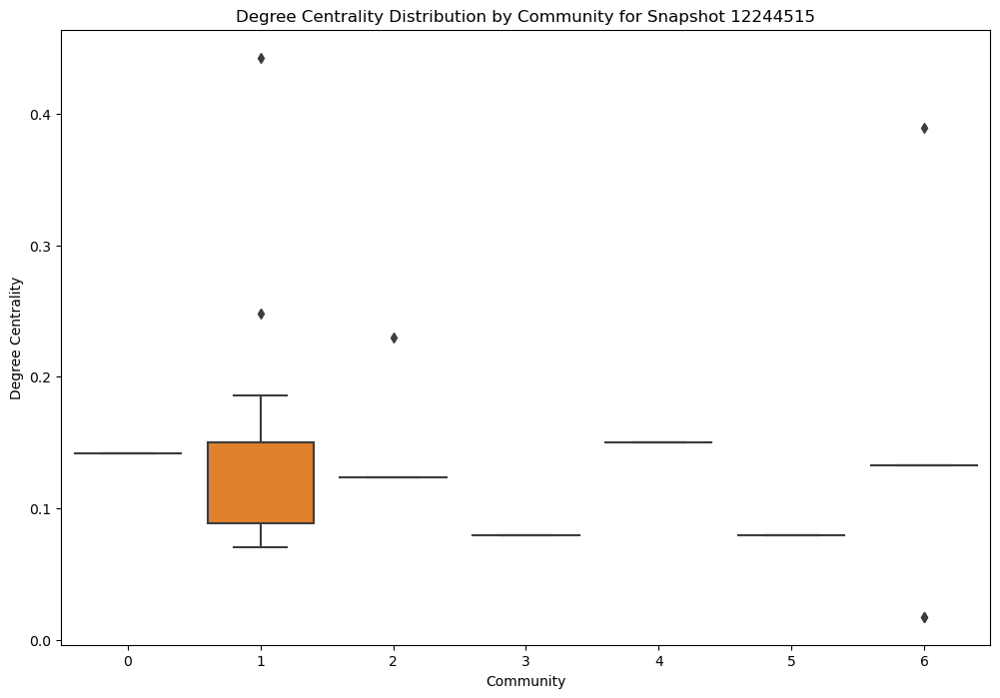

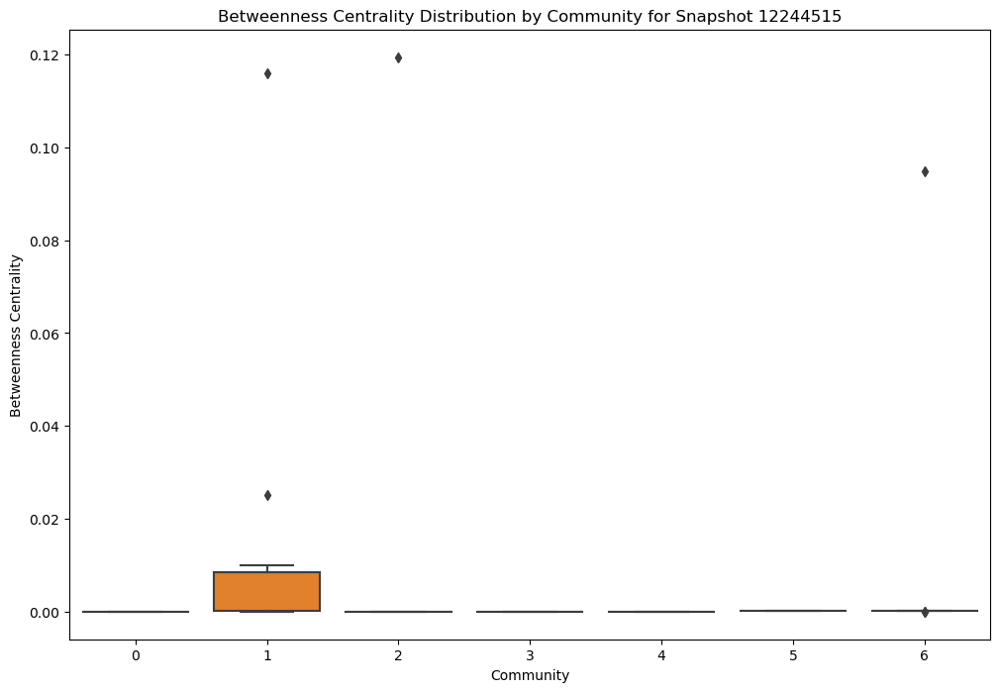

Snapshot: 12244515, Number of communities detected: 7
Community sizes for snapshot 12244515:
Community
1    30
4    18
0    17
6    17
2    15
3    10
5     7
Name: count, dtype: int64
Role Summary for Snapshot 12438842:

  Community    degree                     betweenness                      \
                 mean       std       max        mean       std       max   
0         0  0.100357  0.022110  0.161017    0.002423  0.002450  0.009959   
1         1  0.131030  0.044658  0.279661    0.008556  0.015254  0.059326   
2         2  0.161017  0.000000  0.161017    0.000000  0.000000  0.000000   
3         3  0.076271  0.000000  0.076271    0.000000  0.000000  0.000000   
4         4  0.129473  0.074040  0.389831    0.009851  0.041792  0.177310   
5         5  0.118644  0.000000  0.118644    0.000000  0.000000  0.000000   
6         6  0.128935  0.070213  0.372881    0.010552  0.039481  0.147726   
7         7  0.093220  0.000000  0.093220    0.000734  0.000000  0.000734   

  close

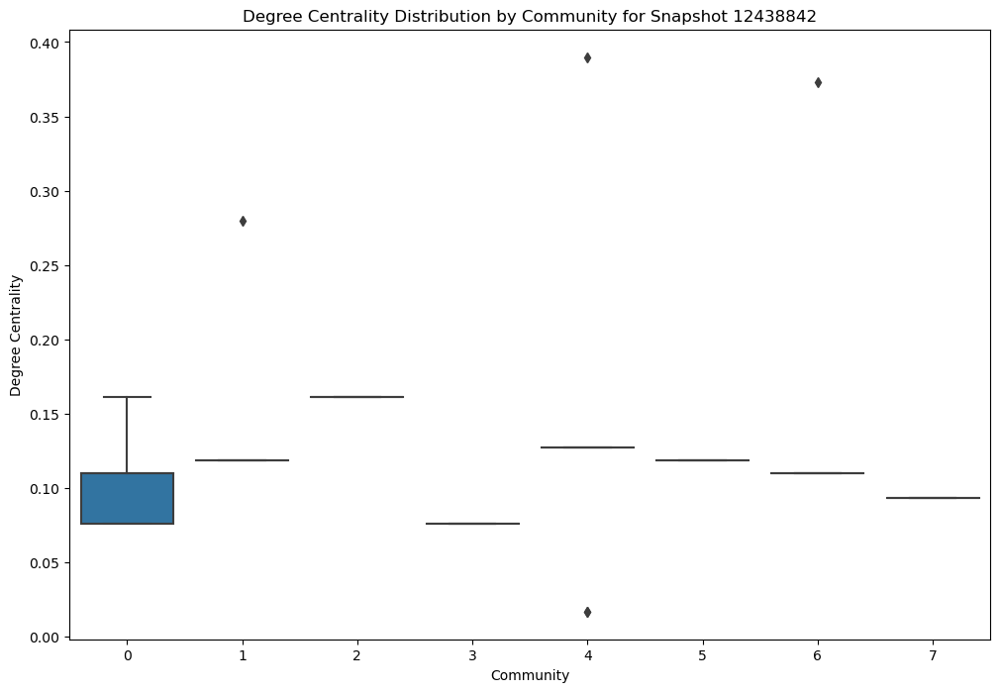

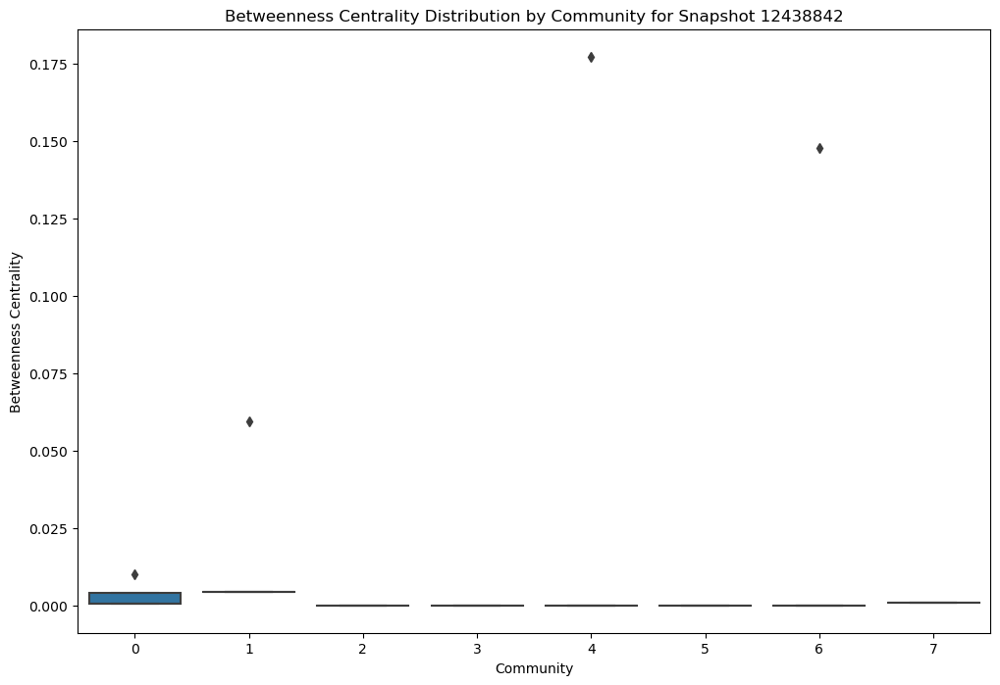

Snapshot: 12438842, Number of communities detected: 8
Community sizes for snapshot 12438842:
Community
2    20
0    19
4    18
5    15
6    14
1    13
7    10
3    10
Name: count, dtype: int64
Role Summary for Snapshot 12638919:

  Community    degree                     betweenness                      \
                 mean       std       max        mean       std       max   
0         0  0.100775  0.000000  0.100775    0.000000  0.000000  0.000000   
1         1  0.130329  0.056202  0.341085    0.011787  0.047148  0.188590   
2         2  0.111383  0.038432  0.217054    0.006981  0.002804  0.017335   
3         3  0.116735  0.082744  0.418605    0.010840  0.042670  0.176348   
4         4  0.031008  0.000000  0.031008    0.000000  0.000000  0.000000   
5         5  0.077519  0.000000  0.077519    0.000000  0.000000  0.000000   
6         6  0.093023  0.034668  0.232558    0.001501  0.006529  0.028461   
7         7  0.139535  0.000000  0.139535    0.000000  0.000000  0.000000   


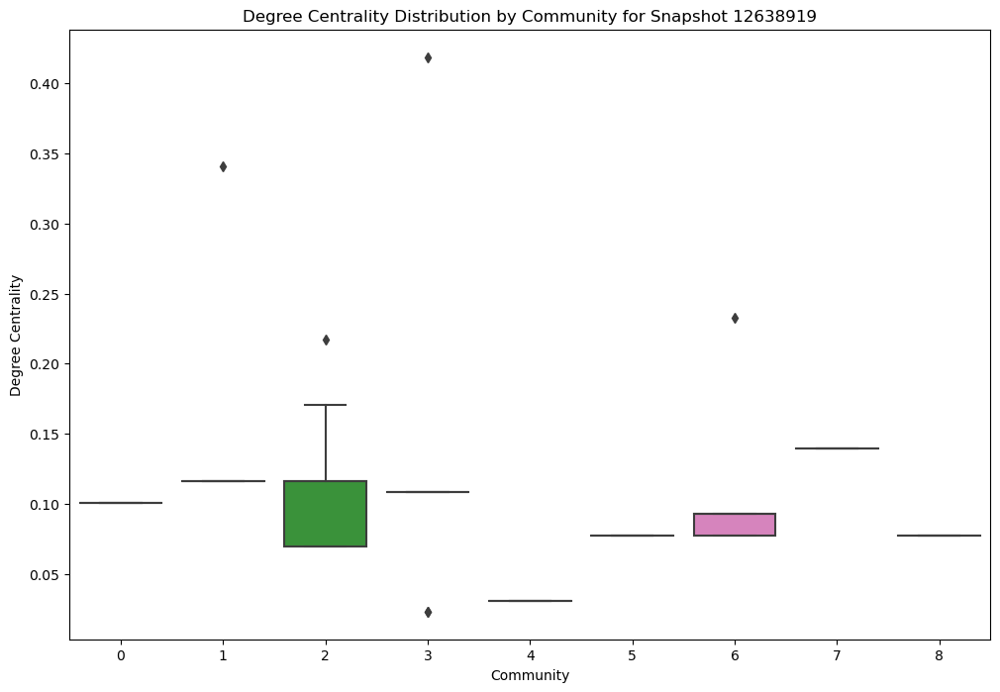

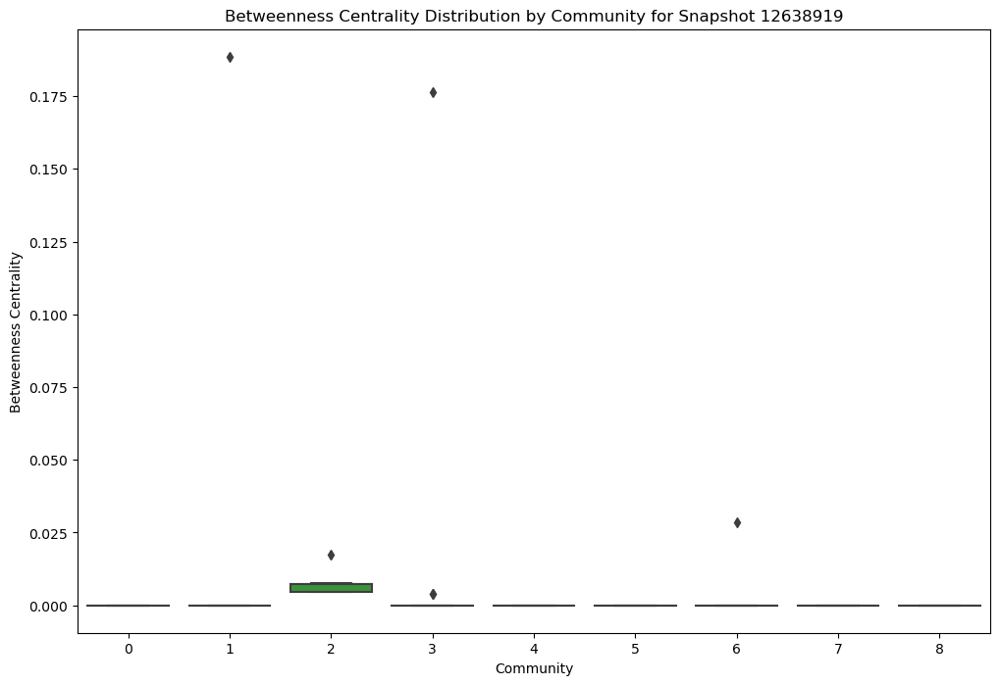

Snapshot: 12638919, Number of communities detected: 9
Community sizes for snapshot 12638919:
Community
2    19
6    19
7    19
3    17
1    16
0    14
5    11
8    10
4     5
Name: count, dtype: int64
Role Summary for Snapshot 12831436:

  Community    degree                     betweenness                      \
                 mean       std       max        mean       std       max   
0         0  0.084416  0.000000  0.084416    0.000000  0.000000  0.000000   
1         1  0.090909  0.000000  0.090909    0.000000  0.000000  0.000000   
2         2  0.116883  0.000000  0.116883    0.000000  0.000000  0.000000   
3         3  0.110390  0.000000  0.110390    0.000000  0.000000  0.000000   
4         4  0.097774  0.032845  0.220779    0.000743  0.002554  0.010893   
5         5  0.103896  0.118531  0.538961    0.013501  0.054004  0.216018   
6         6  0.067821  0.012244  0.116883    0.000174  0.000719  0.003056   
7         7  0.097403  0.000000  0.097403    0.000000  0.000000  0.00

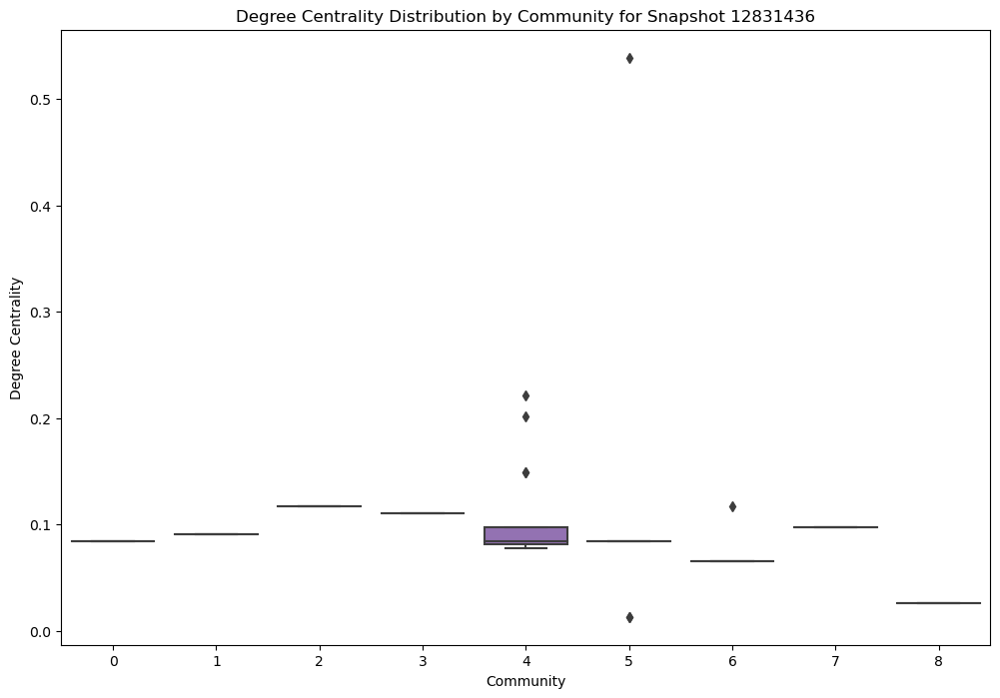

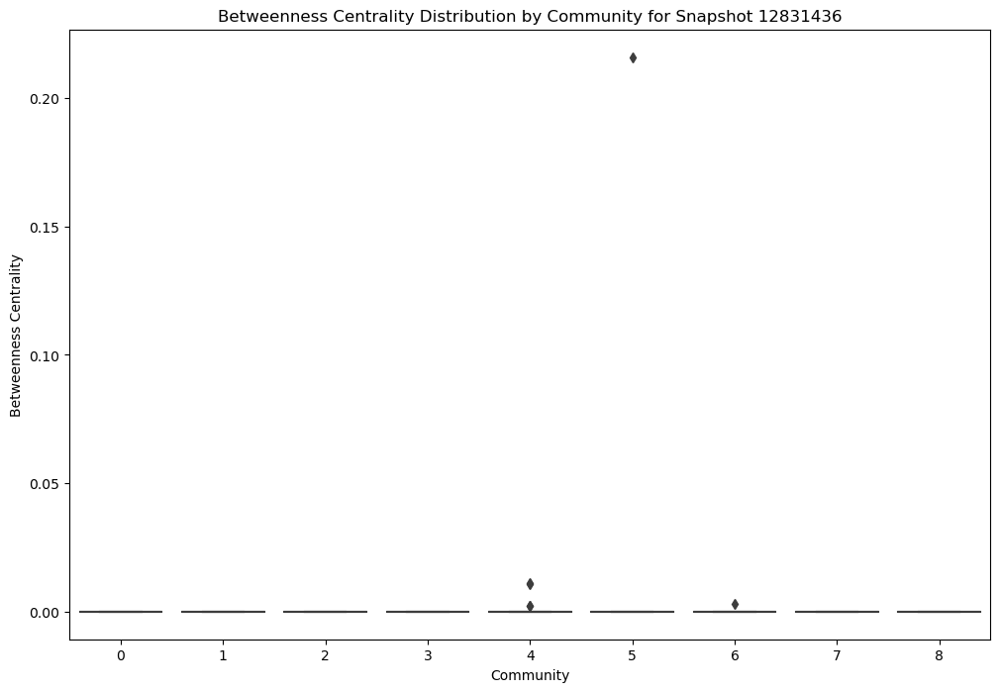

Snapshot: 12831436, Number of communities detected: 9
Community sizes for snapshot 12831436:
Community
4    35
2    19
3    18
6    18
5    16
1    15
7    15
0    14
8     5
Name: count, dtype: int64
Role Summary for Snapshot 13029639:

   Community    degree                     betweenness                     \
                  mean       std       max        mean       std      max   
0          0  0.072289  0.000000  0.072289    0.000000  0.000000  0.00000   
1          1  0.102410  0.000000  0.102410    0.000000  0.000000  0.00000   
2          2  0.108434  0.000000  0.108434    0.000000  0.000000  0.00000   
3          3  0.084337  0.000000  0.084337    0.000000  0.000000  0.00000   
4          4  0.018072  0.000000  0.018072    0.000000  0.000000  0.00000   
5          5  0.096711  0.048504  0.313253    0.002763  0.011953  0.07052   
6          6  0.030120  0.000000  0.030120    0.000000  0.000000  0.00000   
7          7  0.056697  0.011870  0.096386    0.003561  0.007299  0.0

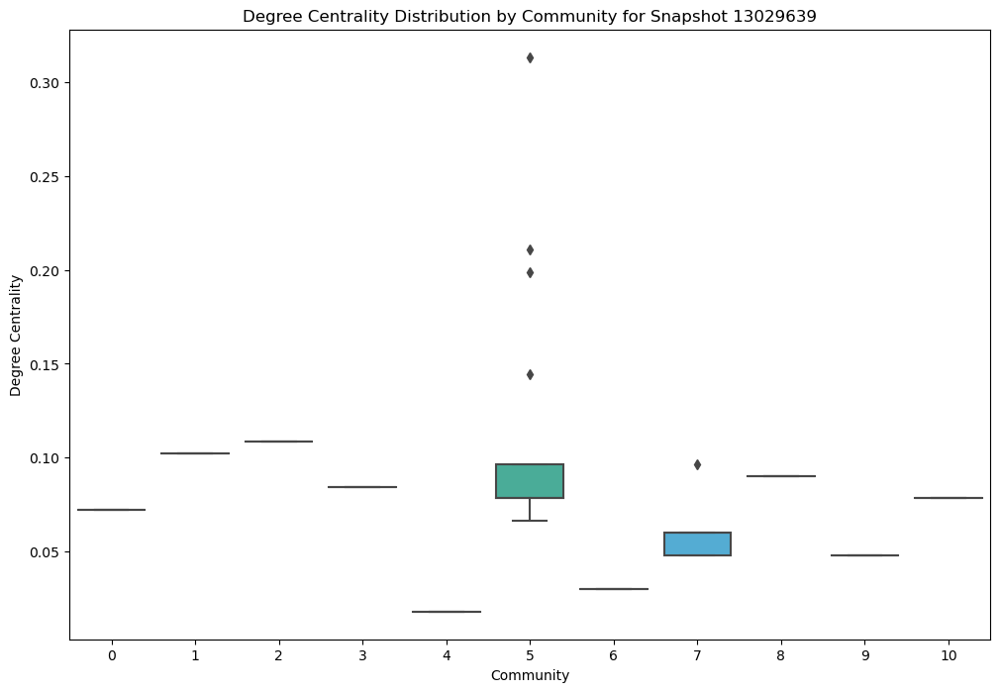

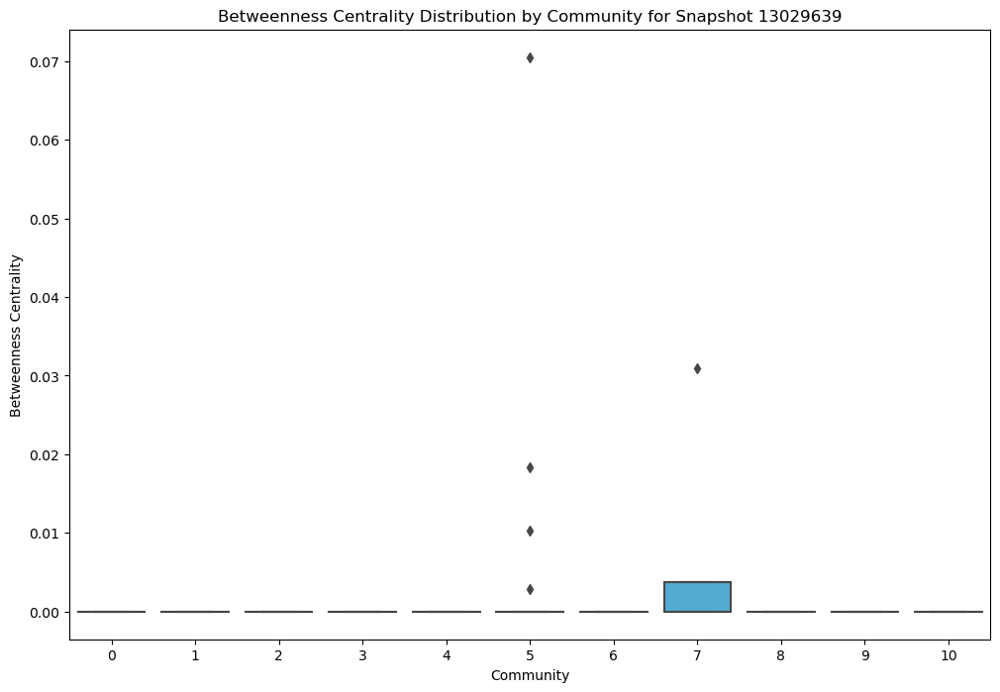

Snapshot: 13029639, Number of communities detected: 11
Community sizes for snapshot 13029639:
Community
5     37
2     19
1     18
7     17
8     16
3     15
10    14
0     13
9      8
6      6
4      4
Name: count, dtype: int64
Role Summary for Snapshot 13230157:

   Community    degree                     betweenness                      \
                  mean       std       max        mean       std       max   
0          0  0.064327  0.000000  0.064327    0.000000  0.000000  0.000000   
1          1  0.105263  0.000000  0.105263    0.000000  0.000000  0.000000   
2          2  0.064327  0.000000  0.064327    0.000000  0.000000  0.000000   
3          3  0.070760  0.034670  0.204678    0.002293  0.009286  0.041738   
4          4  0.064327  0.000000  0.064327    0.000000  0.000000  0.000000   
5          5  0.063712  0.013349  0.105263    0.003498  0.007342  0.032817   
6          6  0.017544  0.000000  0.017544    0.000000  0.000000  0.000000   
7          7  0.105263  0.000000

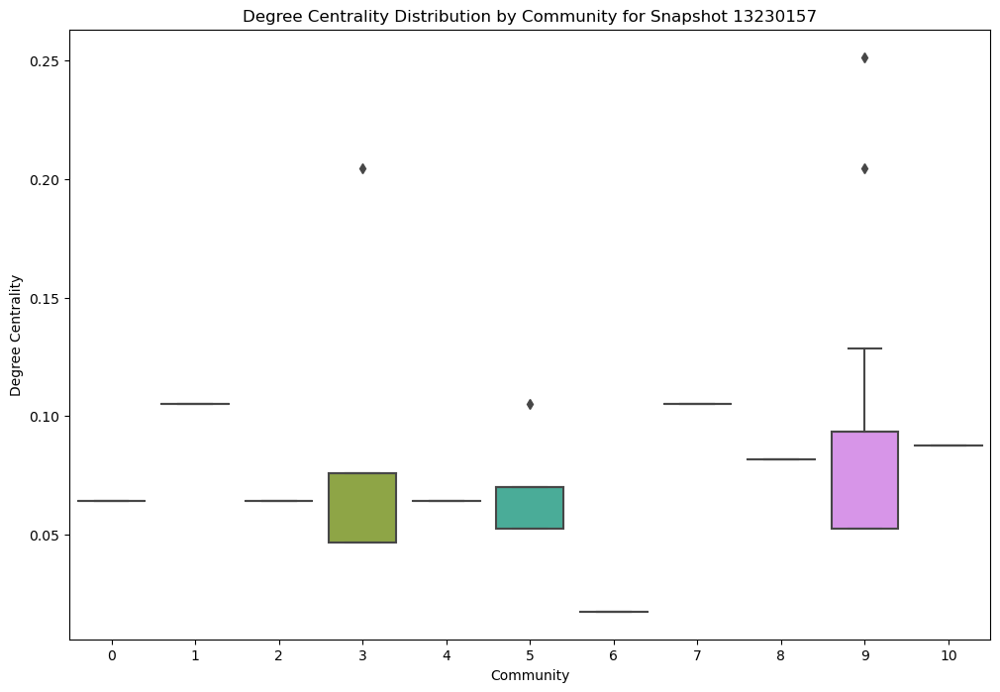

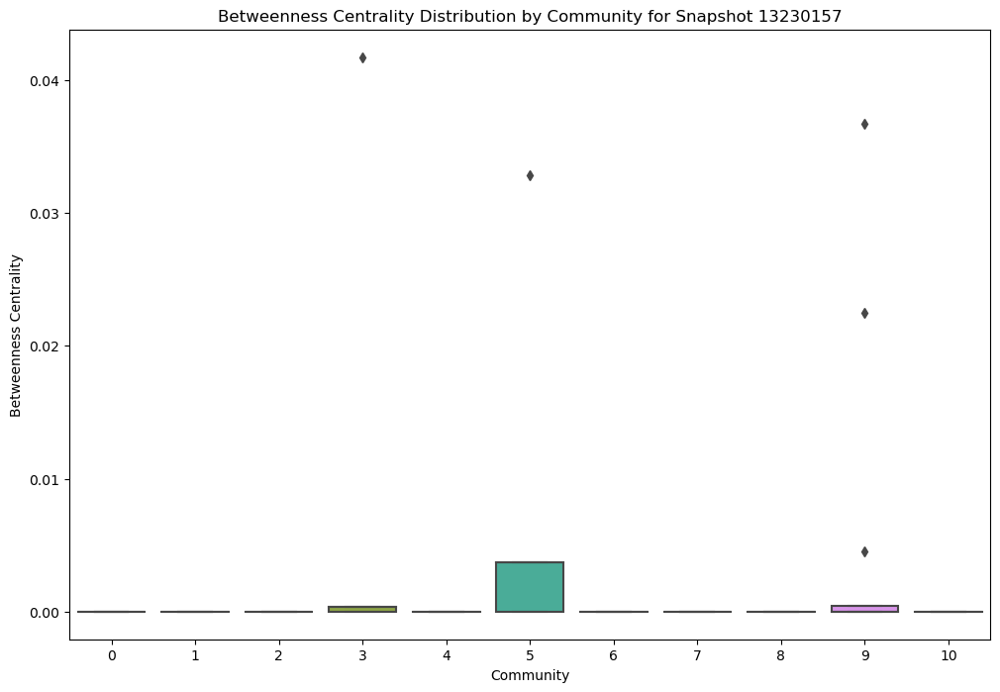

Snapshot: 13230157, Number of communities detected: 11
Community sizes for snapshot 13230157:
Community
9     24
3     20
1     19
5     19
7     19
10    16
8     15
0     12
2     12
4     12
6      4
Name: count, dtype: int64
Role Summary for Snapshot 13422506:

   Community    degree                     betweenness                      \
                  mean       std       max        mean       std       max   
0          0  0.106140  0.058110  0.370787    0.006859  0.023289  0.124558   
1          1  0.067416  0.000000  0.067416    0.000000  0.000000  0.000000   
2          2  0.098480  0.035427  0.235955    0.004136  0.017055  0.070320   
3          3  0.101124  0.000000  0.101124    0.000000  0.000000  0.000000   
4          4  0.084270  0.000000  0.084270    0.000000  0.000000  0.000000   
5          5  0.084270  0.000000  0.084270    0.000000  0.000000  0.000000   
6          6  0.073034  0.000000  0.073034    0.000000  0.000000  0.000000   
7          7  0.016854  0.000000

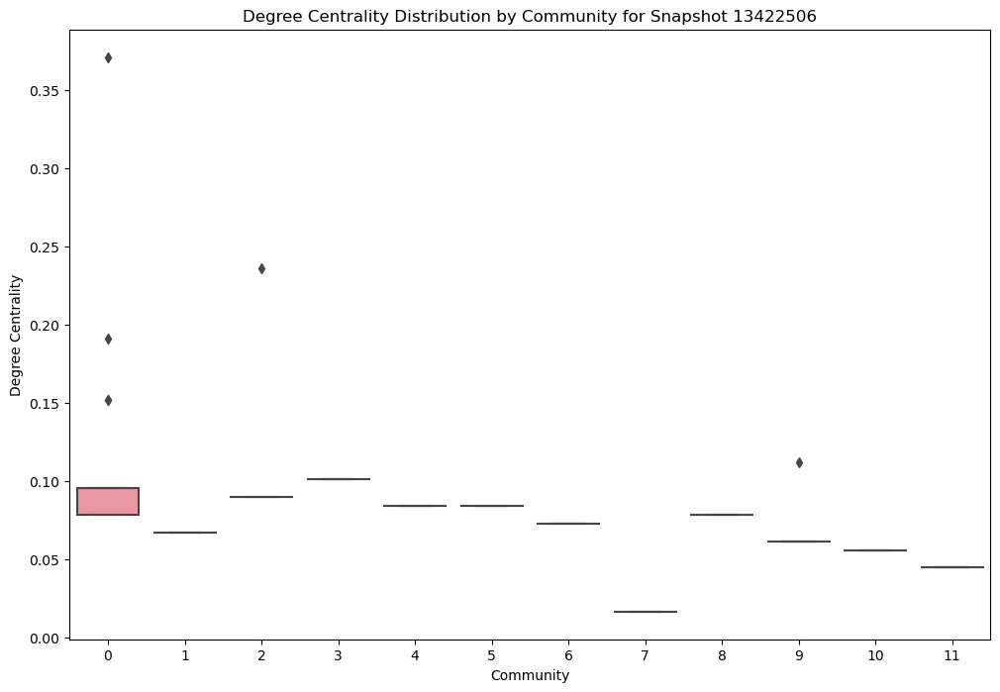

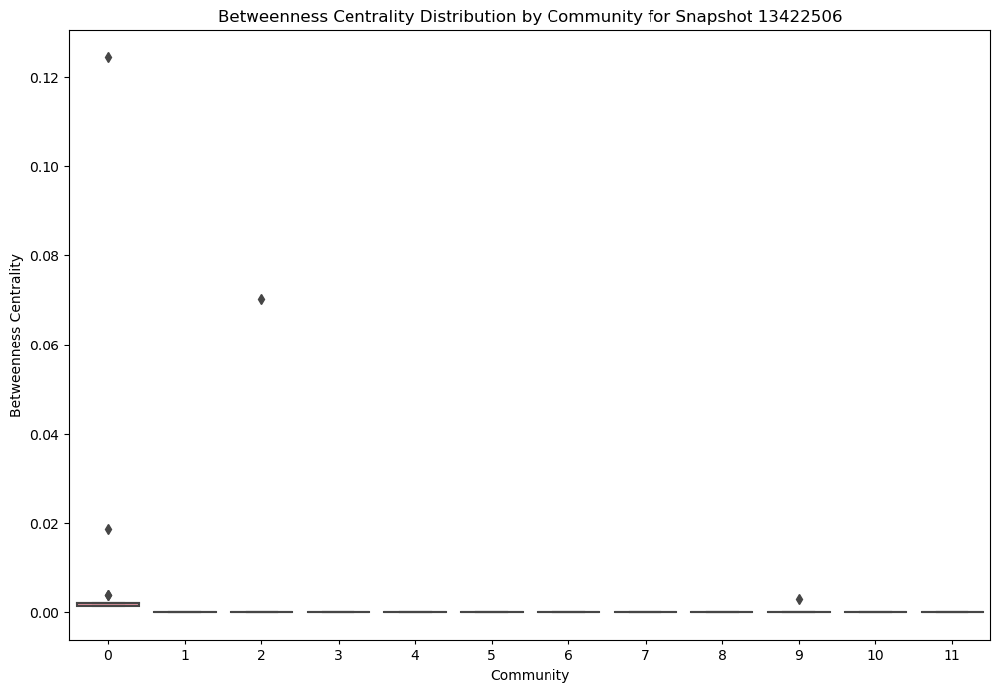

Snapshot: 13422506, Number of communities detected: 12
Community sizes for snapshot 13422506:
Community
0     28
9     20
3     19
2     17
4     16
5     16
8     15
6     14
1     11
10    11
11     8
7      4
Name: count, dtype: int64
Role Summary for Snapshot 13620205:

   Community    degree                     betweenness                      \
                  mean       std       max        mean       std       max   
0          0  0.063450  0.011612  0.105556    0.000899  0.001045  0.003999   
1          1  0.055556  0.000000  0.055556    0.000000  0.000000  0.000000   
2          2  0.083333  0.000000  0.083333    0.000000  0.000000  0.000000   
3          3  0.100000  0.000000  0.100000    0.000000  0.000000  0.000000   
4          4  0.083333  0.000000  0.083333    0.000000  0.000000  0.000000   
5          5  0.088889  0.000000  0.088889    0.000000  0.000000  0.000000   
6          6  0.072222  0.000000  0.072222    0.000000  0.000000  0.000000   
7          7  0.016667 

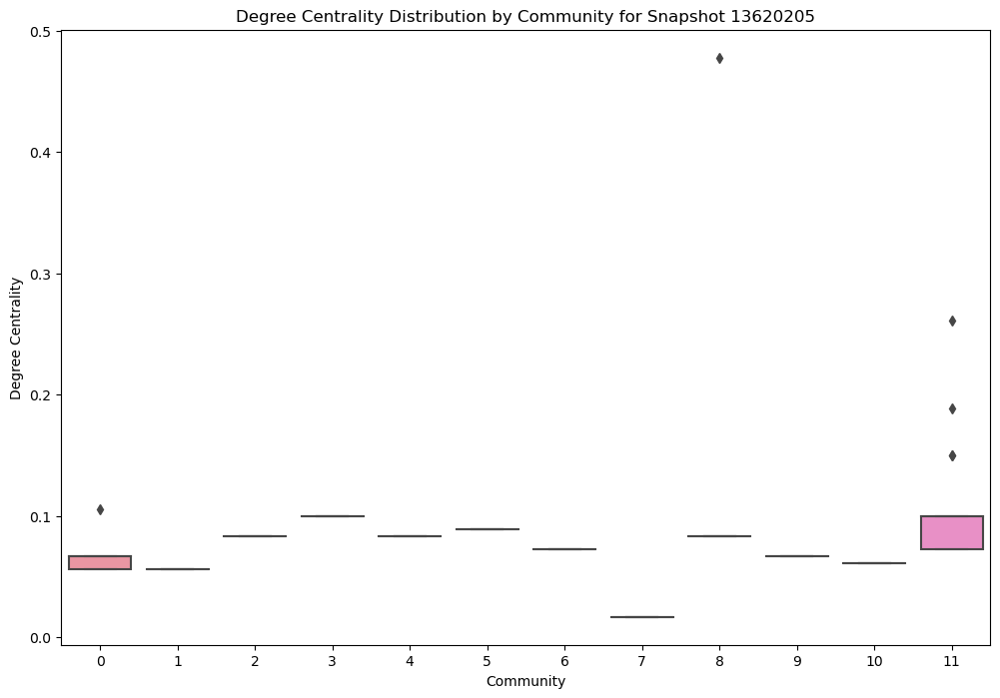

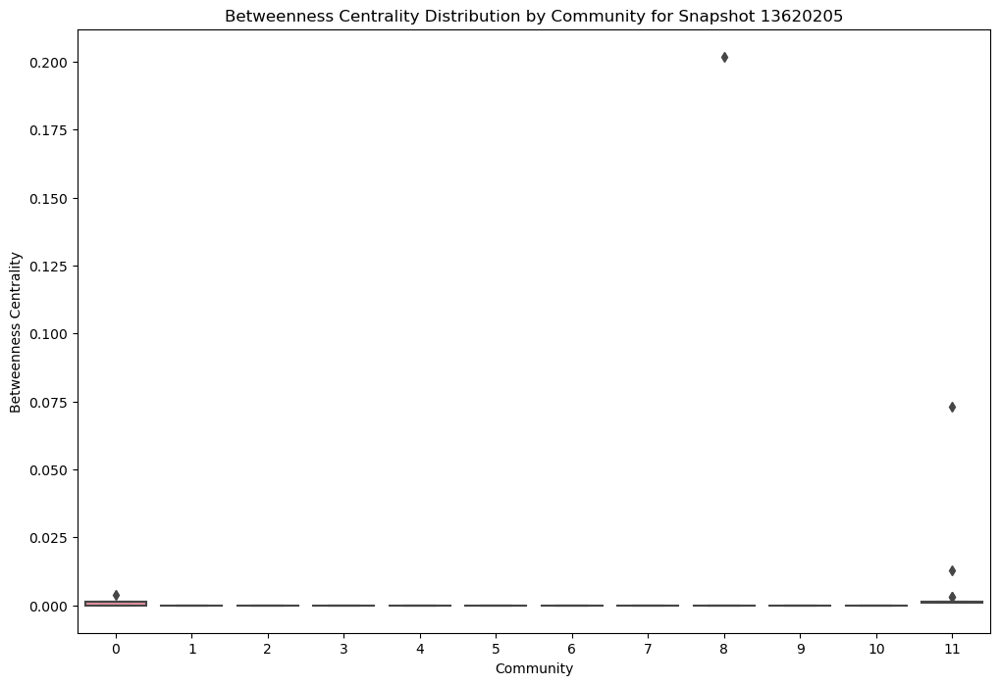

Snapshot: 13620205, Number of communities detected: 12
Community sizes for snapshot 13620205:
Community
11    28
0     19
3     19
5     17
2     16
8     16
4     15
6     14
9     12
1     11
10    10
7      4
Name: count, dtype: int64
Role Summary for Snapshot 13809597:

   Community    degree                     betweenness                      \
                  mean       std       max        mean       std       max   
0          0  0.101156  0.028377  0.196532    0.005300  0.004869  0.015746   
1          1  0.104046  0.000000  0.104046    0.000000  0.000000  0.000000   
2          2  0.066185  0.011633  0.115607    0.000154  0.000676  0.003025   
3          3  0.069364  0.000000  0.069364    0.000000  0.000000  0.000000   
4          4  0.079480  0.043699  0.277457    0.004156  0.018217  0.089663   
5          5  0.084393  0.013432  0.132948    0.005960  0.023081  0.089394   
6          6  0.057803  0.000000  0.057803    0.000000  0.000000  0.000000   
7          7  0.086705 

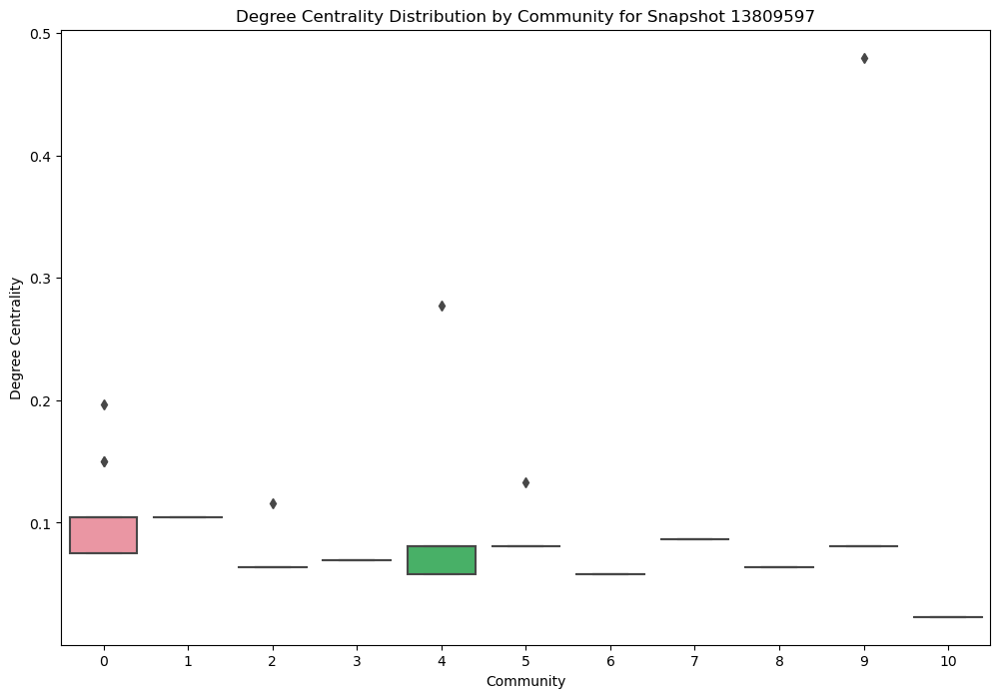

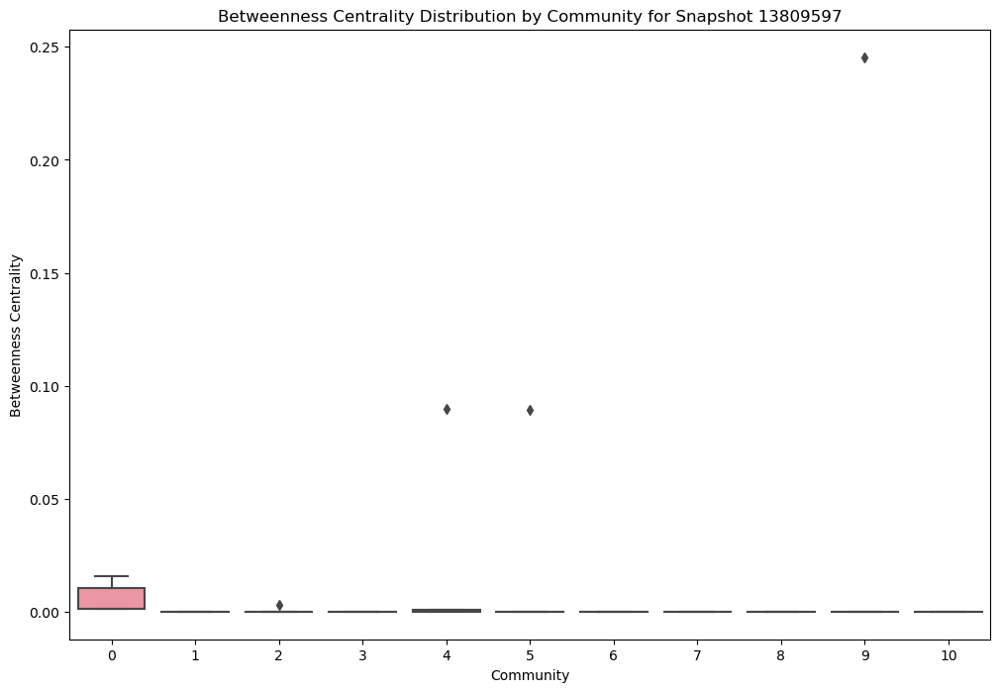

Snapshot: 13809597, Number of communities detected: 11
Community sizes for snapshot 13809597:
Community
0     26
4     24
2     20
1     19
7     16
5     15
9     15
3     13
6     11
8     10
10     5
Name: count, dtype: int64
Role Summary for Snapshot 14009885:

   Community    degree                     betweenness                      \
                  mean       std       max        mean       std       max   
0          0  0.058140  0.000000  0.058140    0.000000  0.000000  0.000000   
1          1  0.094113  0.027616  0.197674    0.007572  0.030288  0.121151   
2          2  0.104651  0.000000  0.104651    0.000000  0.000000  0.000000   
3          3  0.089922  0.033025  0.209302    0.007531  0.029168  0.112968   
4          4  0.052326  0.000000  0.052326    0.000000  0.000000  0.000000   
5          5  0.108140  0.103580  0.482558    0.021652  0.083856  0.324773   
6          6  0.069767  0.000000  0.069767    0.000000  0.000000  0.000000   
7          7  0.075581  0.000000

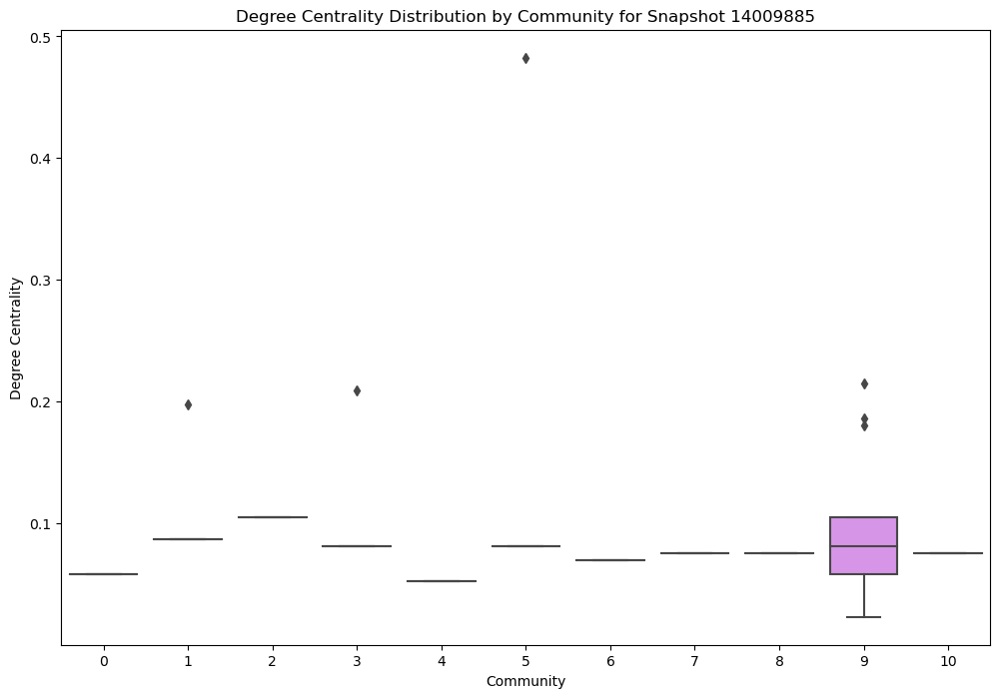

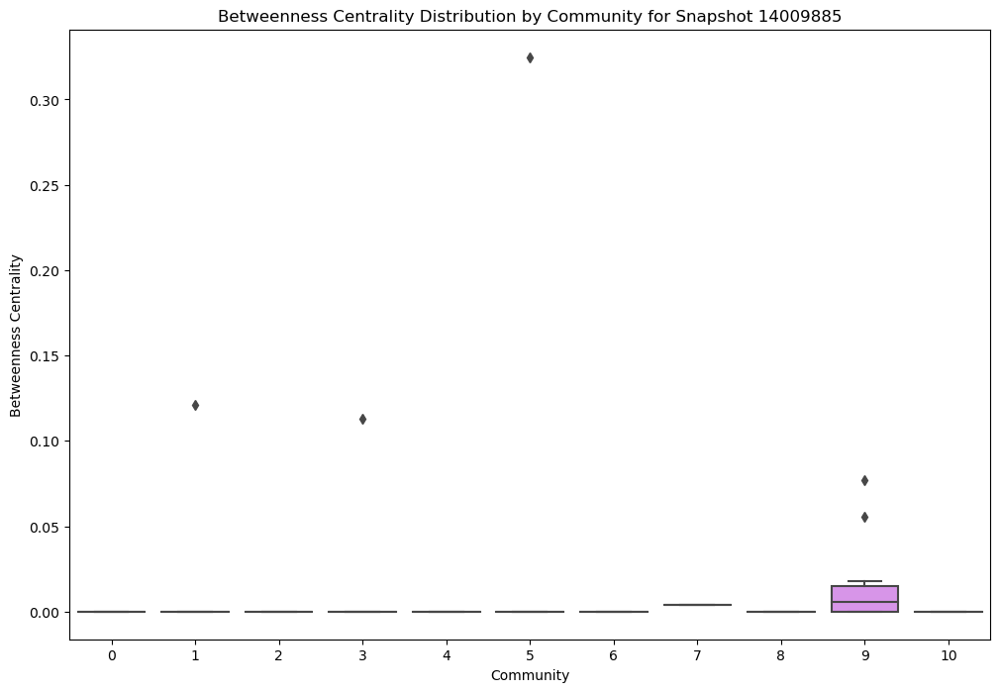

Snapshot: 14009885, Number of communities detected: 11
Community sizes for snapshot 14009885:
Community
9     38
2     19
1     16
3     15
5     15
6     13
8     13
10    13
0     11
7     11
4      9
Name: count, dtype: int64
Role Summary for Snapshot 14210564:

   Community    degree                     betweenness                      \
                  mean       std       max        mean       std       max   
0          0  0.095506  0.000000  0.095506    0.000000  0.000000  0.000000   
1          1  0.095857  0.044189  0.196629    0.012382  0.017604  0.092427   
2          2  0.096827  0.028614  0.207865    0.007488  0.030873  0.127294   
3          3  0.056180  0.000000  0.056180    0.000000  0.000000  0.000000   
4          4  0.056180  0.000000  0.056180    0.000000  0.000000  0.000000   
5          5  0.084644  0.023209  0.168539    0.007228  0.027995  0.108424   
6          6  0.078652  0.000000  0.078652    0.004864  0.000000  0.004864   
7          7  0.067416  0.000000

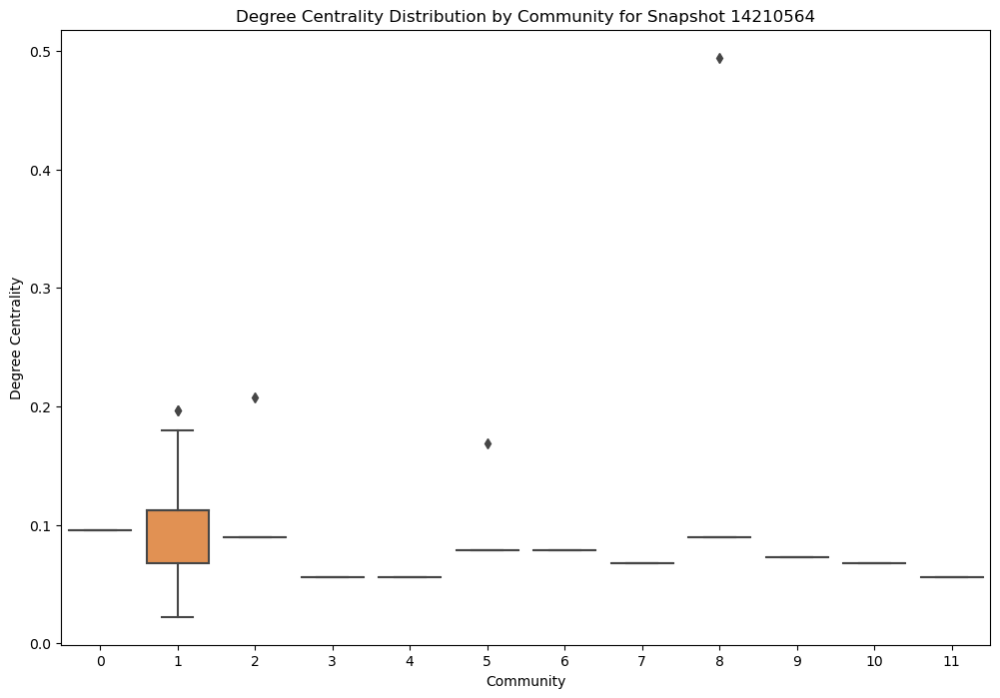

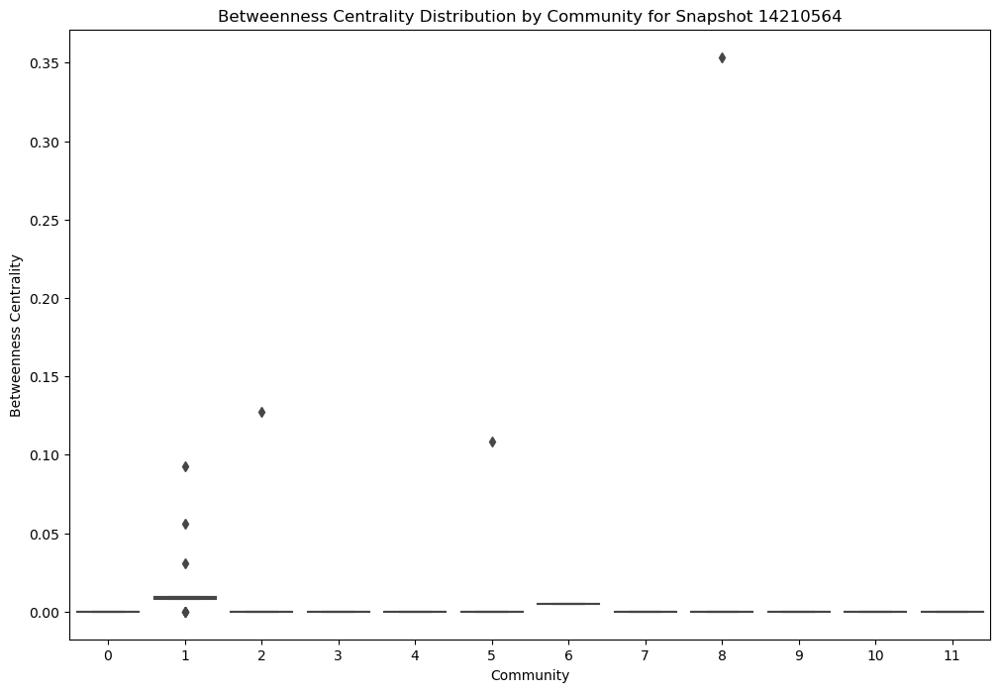

Snapshot: 14210564, Number of communities detected: 12
Community sizes for snapshot 14210564:
Community
1     32
0     18
2     17
8     17
5     15
7     13
9     13
6     12
10    12
11    11
4     10
3      9
Name: count, dtype: int64
Role Summary for Snapshot 14391029:

   Community    degree                     betweenness                      \
                  mean       std       max        mean       std       max   
0          0  0.054645  0.000000  0.054645    0.000000  0.000000  0.000000   
1          1  0.071038  0.000000  0.071038    0.004971  0.000000  0.004971   
2          2  0.087432  0.000000  0.087432    0.000000  0.000000  0.000000   
3          3  0.065574  0.000000  0.065574    0.000000  0.000000  0.000000   
4          4  0.092896  0.000000  0.092896    0.000000  0.000000  0.000000   
5          5  0.094503  0.029157  0.207650    0.007306  0.030124  0.124204   
6          6  0.084699  0.102168  0.562842    0.015833  0.077565  0.379990   
7          7  0.076503 

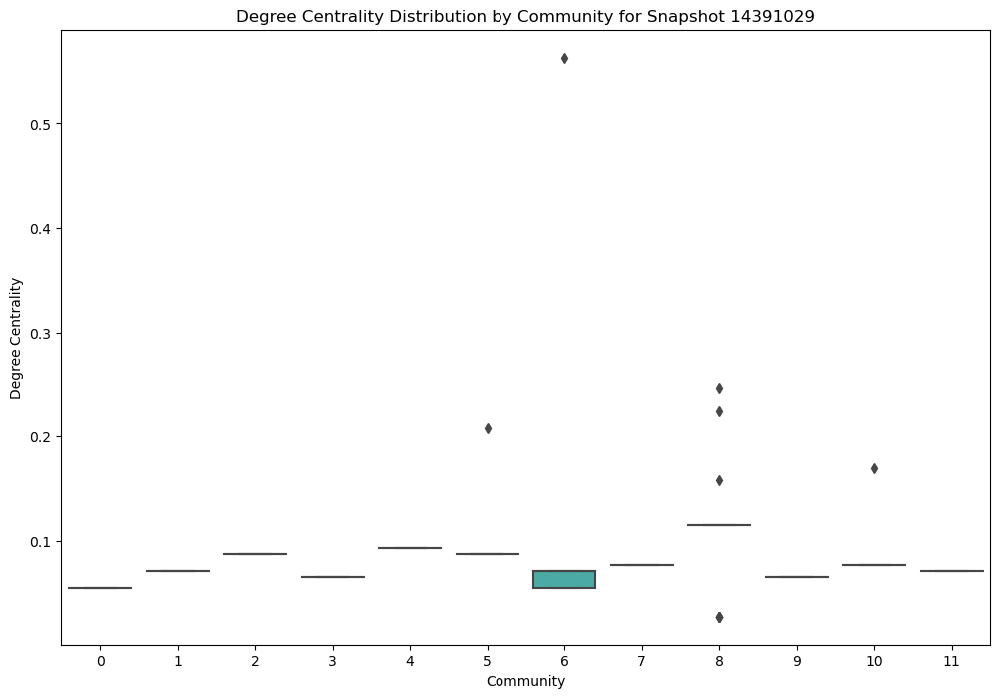

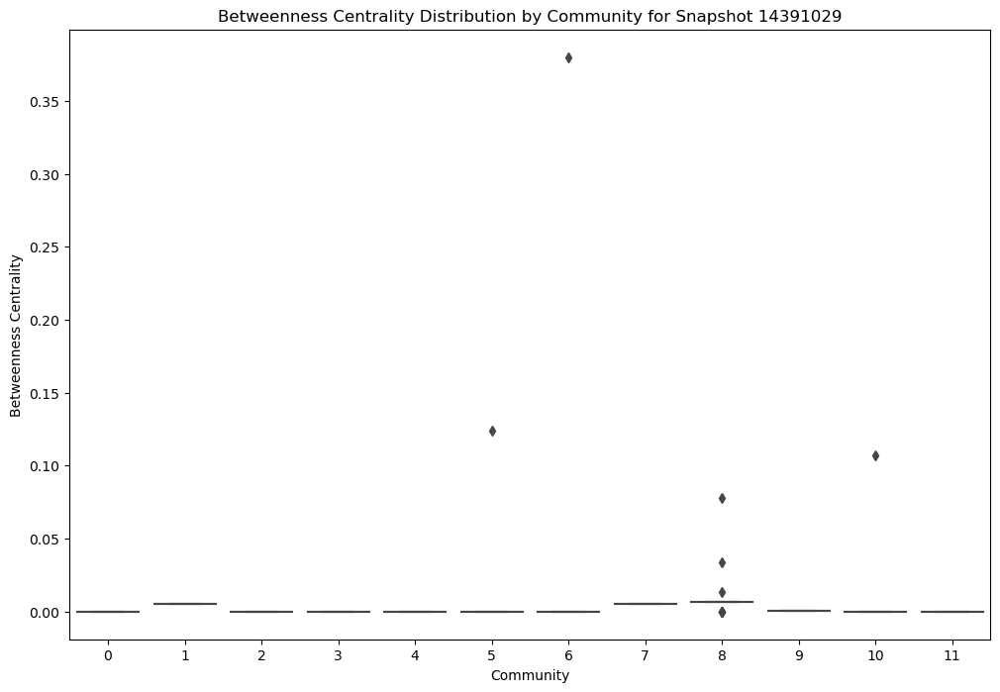

Snapshot: 14391029, Number of communities detected: 12
Community sizes for snapshot 14391029:
Community
8     25
6     24
4     18
5     17
2     16
10    15
3     13
7     12
11    12
9     11
0     11
1     10
Name: count, dtype: int64
Role Summary for Snapshot 14589816:

   Community    degree                     betweenness                      \
                  mean       std       max        mean       std       max   
0          0  0.102361  0.043834  0.211640    0.005434  0.009705  0.039120   
1          1  0.084656  0.000000  0.084656    0.000000  0.000000  0.000000   
2          2  0.105820  0.000000  0.105820    0.000000  0.000000  0.000000   
3          3  0.063492  0.000000  0.063492    0.000000  0.000000  0.000000   
4          4  0.063492  0.000000  0.063492    0.000000  0.000000  0.000000   
5          5  0.058201  0.000000  0.058201    0.000000  0.000000  0.000000   
6          6  0.106526  0.125684  0.560847    0.026636  0.103159  0.399535   
7          7  0.052910 

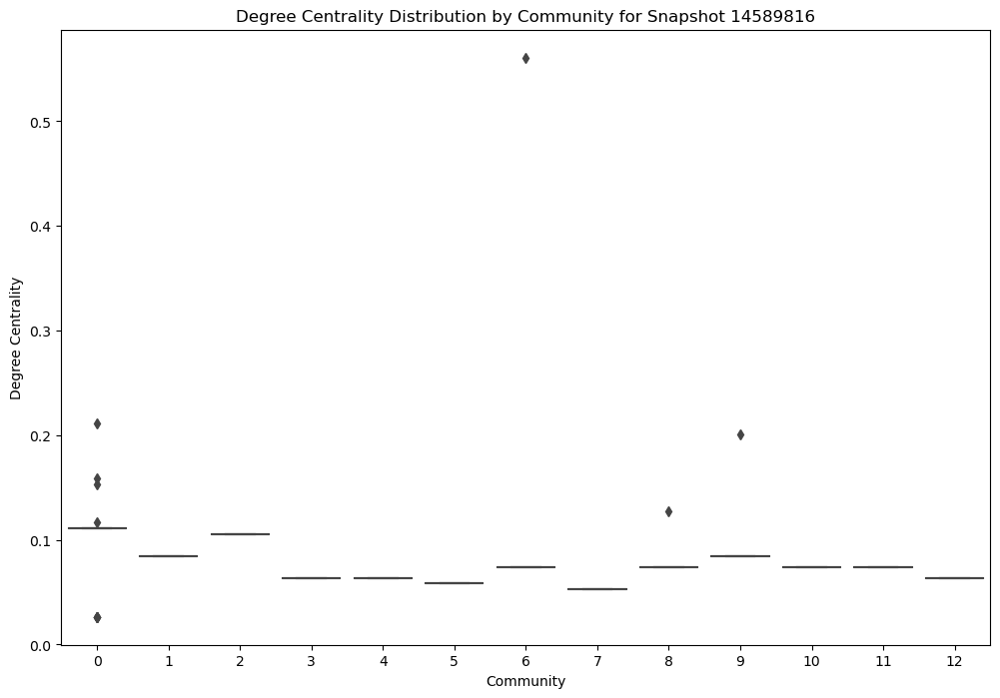

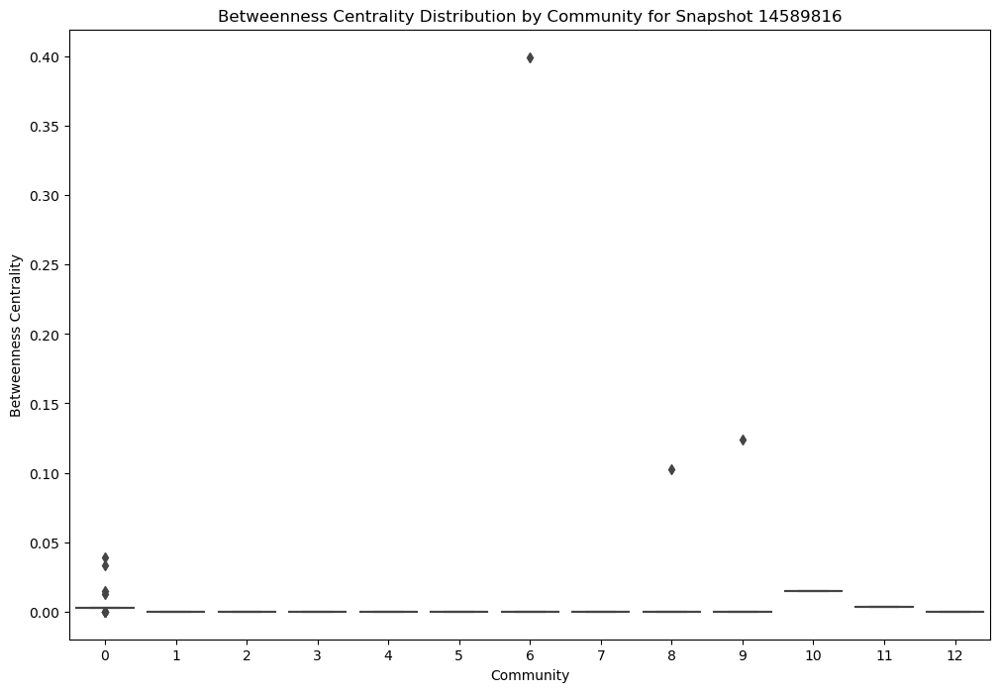

Snapshot: 14589816, Number of communities detected: 13
Community sizes for snapshot 14589816:
Community
0     26
2     21
9     17
1     16
6     15
8     15
4     13
3     12
11    12
5     11
7     11
12    11
10    10
Name: count, dtype: int64
Role Summary for Snapshot 14779829:

   Community    degree                     betweenness                      \
                  mean       std       max        mean       std       max   
0          0  0.072626  0.000000  0.072626    0.005028  0.000000  0.005028   
1          1  0.055866  0.000000  0.055866    0.000000  0.000000  0.000000   
2          2  0.095958  0.027099  0.201117    0.009305  0.038366  0.158188   
3          3  0.072626  0.000000  0.072626    0.000000  0.000000  0.000000   
4          4  0.089385  0.000000  0.089385    0.000000  0.000000  0.000000   
5          5  0.083799  0.021637  0.162011    0.009022  0.034943  0.135334   
6          6  0.096429  0.057027  0.318436    0.009789  0.046947  0.225151   
7          7  

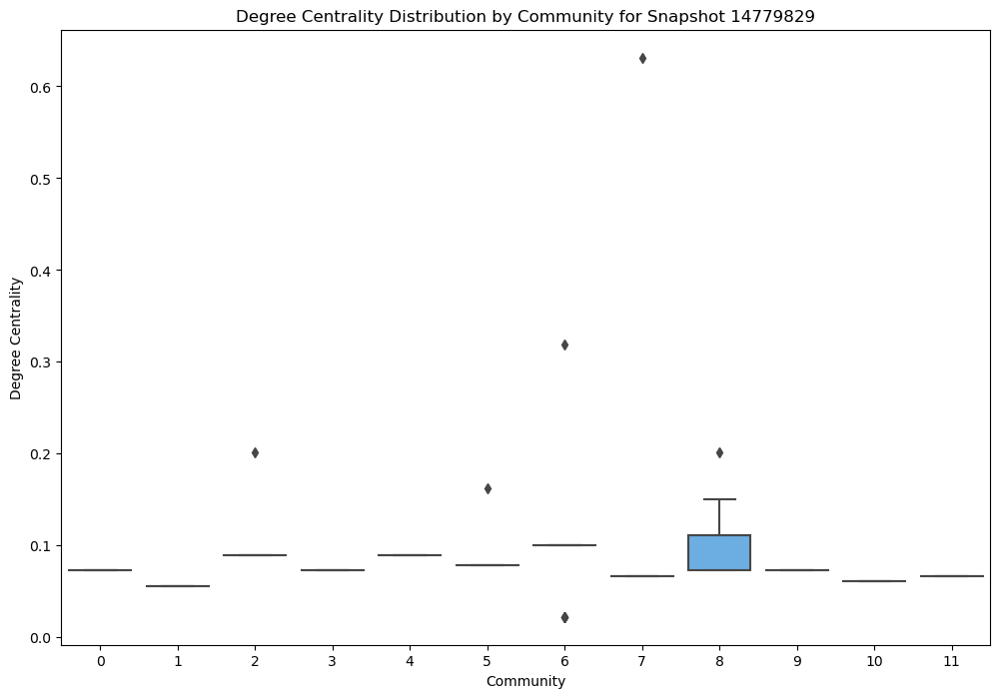

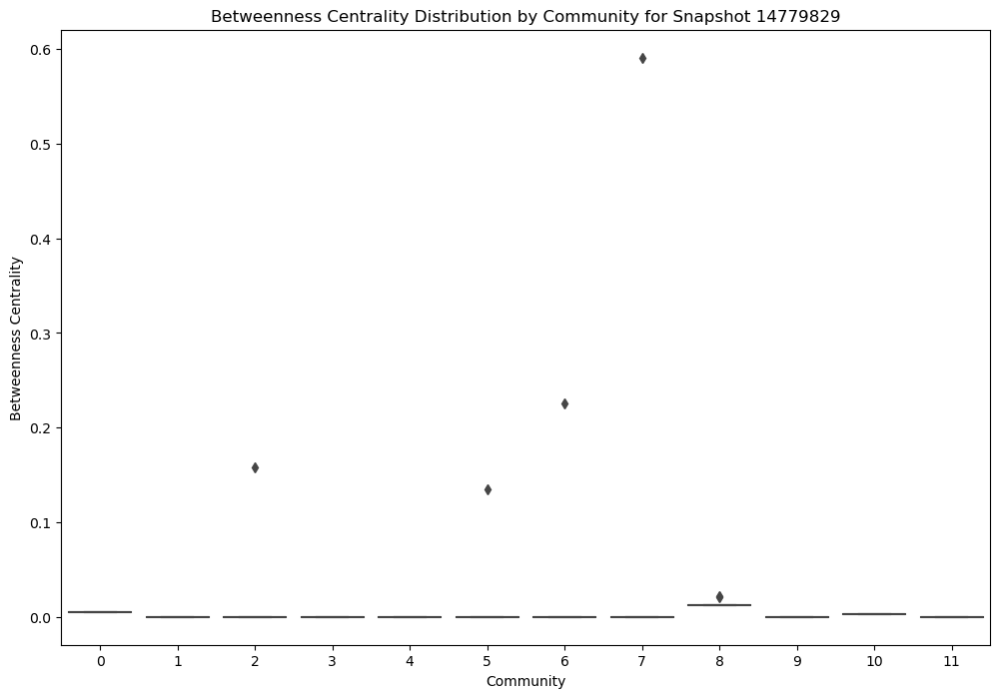

Snapshot: 14779829, Number of communities detected: 12
Community sizes for snapshot 14779829:
Community
8     27
6     23
2     17
4     16
5     15
3     13
7     13
9     13
11    12
0     11
1     11
10     9
Name: count, dtype: int64
Role Summary for Snapshot 14967365:

   Community    degree                     betweenness                      \
                  mean       std       max        mean       std       max   
0          0  0.172348  0.016714  0.242424    0.011553  0.019914  0.117008   
1          1  0.050505  0.000000  0.050505    0.000000  0.000000  0.000000   
2          2  0.075758  0.000000  0.075758    0.000000  0.000000  0.000000   
3          3  0.069024  0.023579  0.156566    0.007122  0.025511  0.126237   
4          4  0.060606  0.000000  0.060606    0.002870  0.000000  0.002870   
5          5  0.083563  0.054390  0.297980    0.008019  0.037613  0.176422   
6          6  0.075758  0.000000  0.075758    0.000000  0.000000  0.000000   
7          7  0.087466 

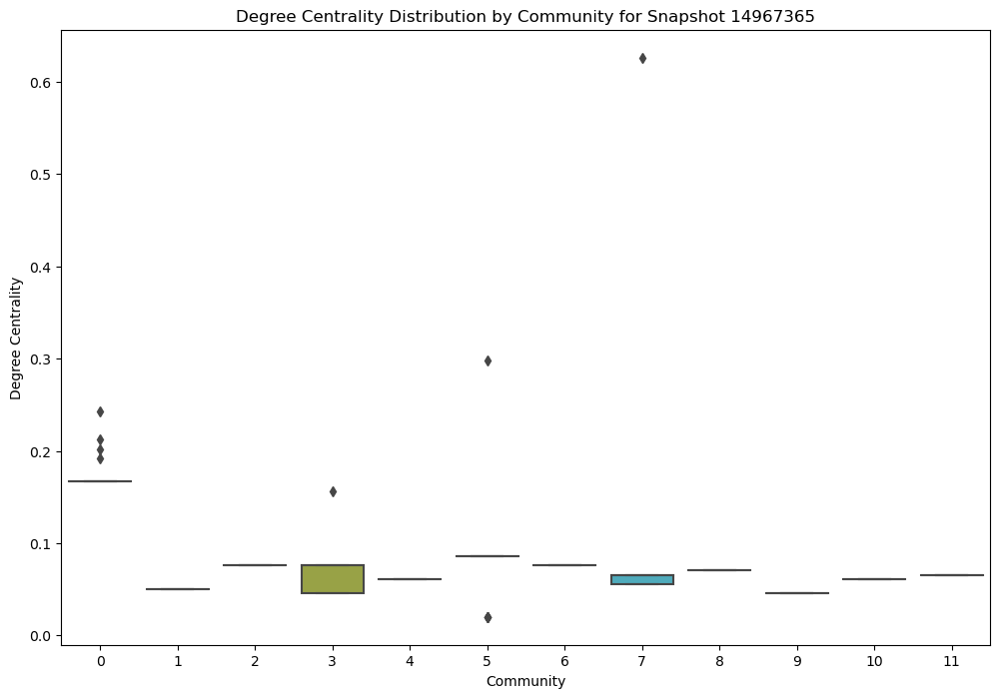

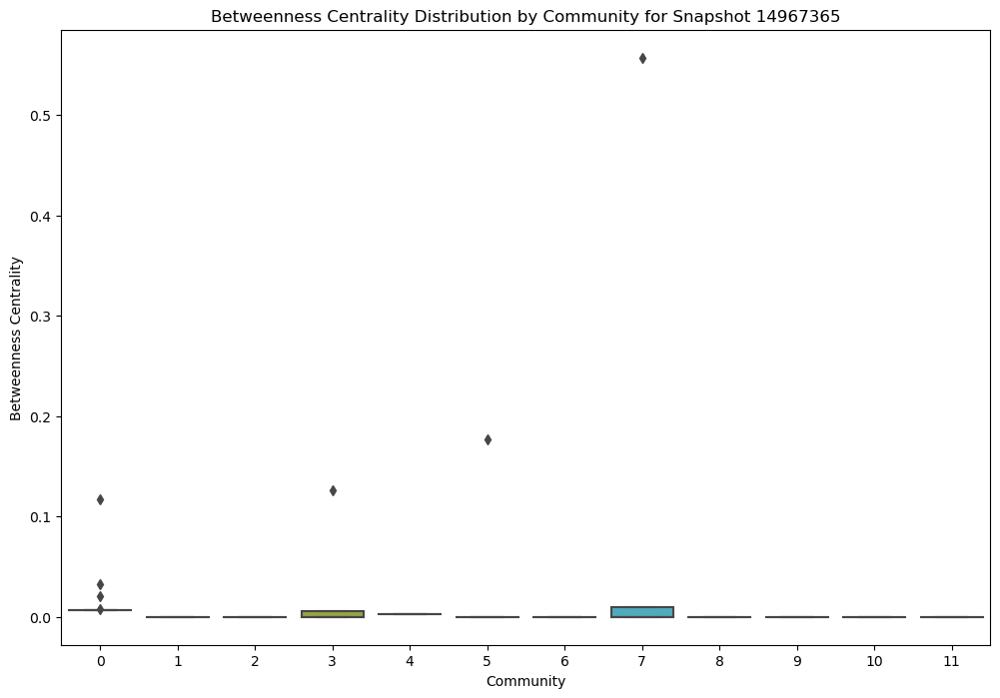

Snapshot: 14967365, Number of communities detected: 12
Community sizes for snapshot 14967365:
Community
0     32
3     24
5     22
7     22
2     15
6     15
8     14
11    13
10    12
1     11
9     10
4      9
Name: count, dtype: int64
Community detection and analysis complete.


In [32]:
import os
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from community import community_louvain
from dotenv import load_dotenv
import seaborn as sns

# Load environment variables from .env file (if needed for other variables)
load_dotenv()

# Set the input directory directly to the local folder where the graphs are stored
input_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'

# Check if the input directory exists
if not os.path.exists(input_directory):
    raise FileNotFoundError(f"Input directory does not exist: {input_directory}")

print(f"Input directory is set to: {input_directory}")

# Function to load graphs from snapshots
def load_wallet_graphs_from_snapshots(df_snapshots, input_directory):
    graphs = {}
    dates = {}
    missing_snapshots = []
    
    for index, row in df_snapshots.iterrows():
        snapshot = row['Block Height']
        date = row['Date'].strftime('%Y-%m-%d')  # Format date as string
        dates[snapshot] = date
        file_path = os.path.join(input_directory, f"validated_wallet_projection_graph_{snapshot}.graphml")
        
        print(f"Checking file: {file_path}")  # Debug print

        if os.path.exists(file_path):
            graph = nx.read_graphml(file_path)
            graphs[snapshot] = graph
            print(f"Loaded graph for snapshot {snapshot}")
        else:
            print(f"Graph file for snapshot {snapshot} does not exist at {file_path}")
            missing_snapshots.append(snapshot)
    
    return graphs, dates, missing_snapshots

# Function to perform community detection using the Louvain method
def detect_communities(graph):
    partition = community_louvain.best_partition(graph)
    return partition


def compute_centrality_measures(graph, partition):
    try:
        centrality_measures = {
            'degree': nx.degree_centrality(graph),
            'betweenness': nx.betweenness_centrality(graph),
            'closeness': nx.closeness_centrality(graph),
            'eigenvector': nx.eigenvector_centrality(graph, max_iter=500, tol=1e-06)
        }
    except nx.PowerIterationFailedConvergence:
        print("Power iteration failed to converge. Attempting to increase iterations.")
        centrality_measures = {
            'degree': nx.degree_centrality(graph),
            'betweenness': nx.betweenness_centrality(graph),
            'closeness': nx.closeness_centrality(graph),
            'eigenvector': nx.eigenvector_centrality(graph, max_iter=1000, tol=1e-06)
        }
    except Exception as e:
        print(f"An error occurred: {e}")
        centrality_measures = {
            'degree': nx.degree_centrality(graph),
            'betweenness': nx.betweenness_centrality(graph),
            'closeness': nx.closeness_centrality(graph),
            'eigenvector': {}
        }

    # Create a DataFrame to store centrality measures and community information
    centrality_data = pd.DataFrame(index=graph.nodes())
    for measure, values in centrality_measures.items():
        centrality_data[measure] = pd.Series(values)
    centrality_data['Community'] = pd.Series(partition)

    return centrality_data

    # Create a DataFrame to store centrality measures and community information
    centrality_data = pd.DataFrame(index=graph.nodes())
    for measure, values in centrality_measures.items():
        centrality_data[measure] = pd.Series(values)
    
    centrality_data['Community'] = pd.Series(partition)
    
    return centrality_data

# Function to analyze the roles within communities
def analyze_roles_within_communities(centrality_data, snapshot, output_directory):
    role_summary = centrality_data.groupby('Community').agg({
        'degree': ['mean', 'std', 'max'],
        'betweenness': ['mean', 'std', 'max'],
        'closeness': ['mean', 'std', 'max'],
        'eigenvector': ['mean', 'std', 'max']
    }).reset_index()
    
    print(f"Role Summary for Snapshot {snapshot}:\n")
    print(role_summary)
    
    # Save the detailed centrality data
    centrality_data.to_csv(os.path.join(output_directory, f'centrality_data_snapshot_{snapshot}.csv'))
    role_summary.to_csv(os.path.join(output_directory, f'role_summary_snapshot_{snapshot}.csv'))
    
    # Visualize centrality measures
    plt.figure(figsize=(12, 8))
    sns.boxplot(x='Community', y='degree', data=centrality_data)
    plt.title(f"Degree Centrality Distribution by Community for Snapshot {snapshot}")
    plt.xlabel('Community')
    plt.ylabel('Degree Centrality')
    plt.savefig(os.path.join(output_directory, f'degree_centrality_distribution_snapshot_{snapshot}.png'))
    plt.show()

    plt.figure(figsize=(12, 8))
    sns.boxplot(x='Community', y='betweenness', data=centrality_data)
    plt.title(f"Betweenness Centrality Distribution by Community for Snapshot {snapshot}")
    plt.xlabel('Community')
    plt.ylabel('Betweenness Centrality')
    plt.savefig(os.path.join(output_directory, f'betweenness_centrality_distribution_snapshot_{snapshot}.png'))
    plt.show()

# Assuming df_snapshots is already loaded
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
df_snapshots = pd.read_csv(os.path.join(data_directory, 'snapshot_selection.csv'))
df_snapshots['Date'] = pd.to_datetime(df_snapshots['Date'])  # Ensure dates are in datetime format

# Load the graphs
graphs, dates, missing_snapshots = load_wallet_graphs_from_snapshots(df_snapshots, input_directory)

# Directory to save visualizations
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/output'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Perform community detection and analyze functionality and roles
partitions = {}
sorted_snapshots = sorted(graphs.keys())
for snapshot in sorted_snapshots:
    graph = graphs[snapshot]
    partition = detect_communities(graph)
    partitions[snapshot] = partition
    
    # Compute centrality measures
    centrality_data = compute_centrality_measures(graph, partition)
    
    # Analyze roles within communities
    analyze_roles_within_communities(centrality_data, snapshot, output_directory)
    
    # Save partition information
    partition_df = pd.DataFrame(list(partition.items()), columns=['Node', 'Community'])
    partition_df.to_csv(os.path.join(output_directory, f'partition_snapshot_{snapshot}.csv'), index=False)
    
    # Analyze community structure
    community_sizes = partition_df['Community'].value_counts()
    print(f"Snapshot: {snapshot}, Number of communities detected: {len(community_sizes)}")
    print(f"Community sizes for snapshot {snapshot}:")
    print(community_sizes)
    
    # Save community sizes to a CSV file
    community_sizes.to_csv(os.path.join(output_directory, f'community_sizes_snapshot_{snapshot}.csv'))

print("Community detection and analysis complete.")


Input directory is set to: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Graph file for snapshot 7962629 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Graph file for snapshot 8155117 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8354625.graphml
Graph file for snapshot 8354625 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_gra

Loaded graph for snapshot 14009885
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14210564.graphml
Loaded graph for snapshot 14210564
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14391029.graphml
Loaded graph for snapshot 14391029
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14589816.graphml
Loaded graph for snapshot 14589816
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14779829.graphml
Loaded graph for snapshot 14779829
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14967365.graphml
Loaded graph for snapshot 14967365
Role Summary for Snapshot 11659570:

  Community    degree                     b

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_10220/3793550559.py:84: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  role_summary = pd.merge(role_summary, role_summary_eigenvector, on='Community')


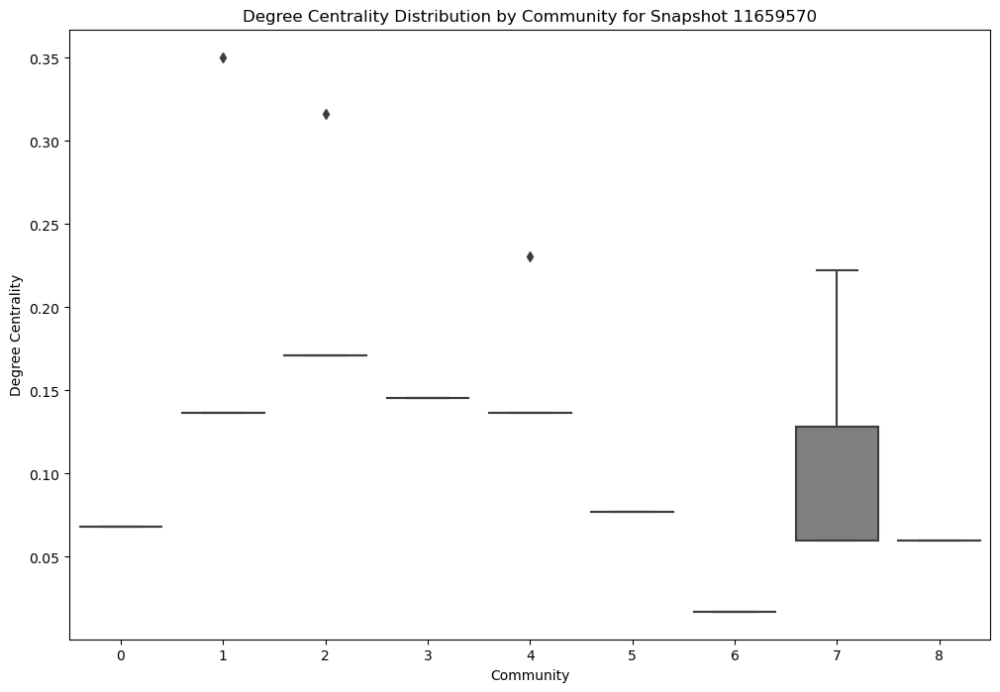

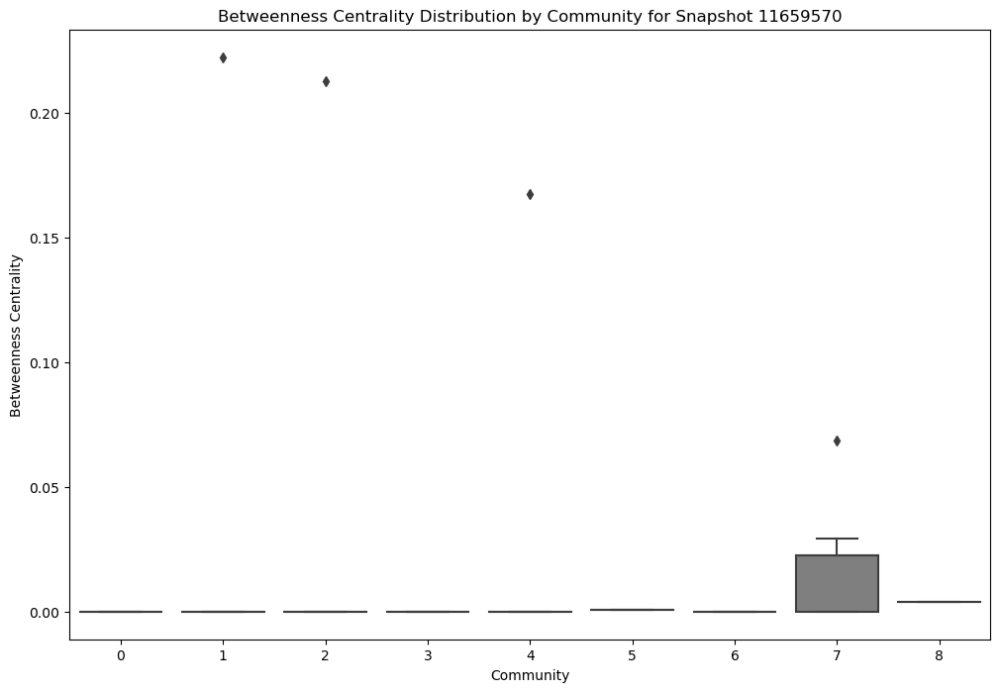

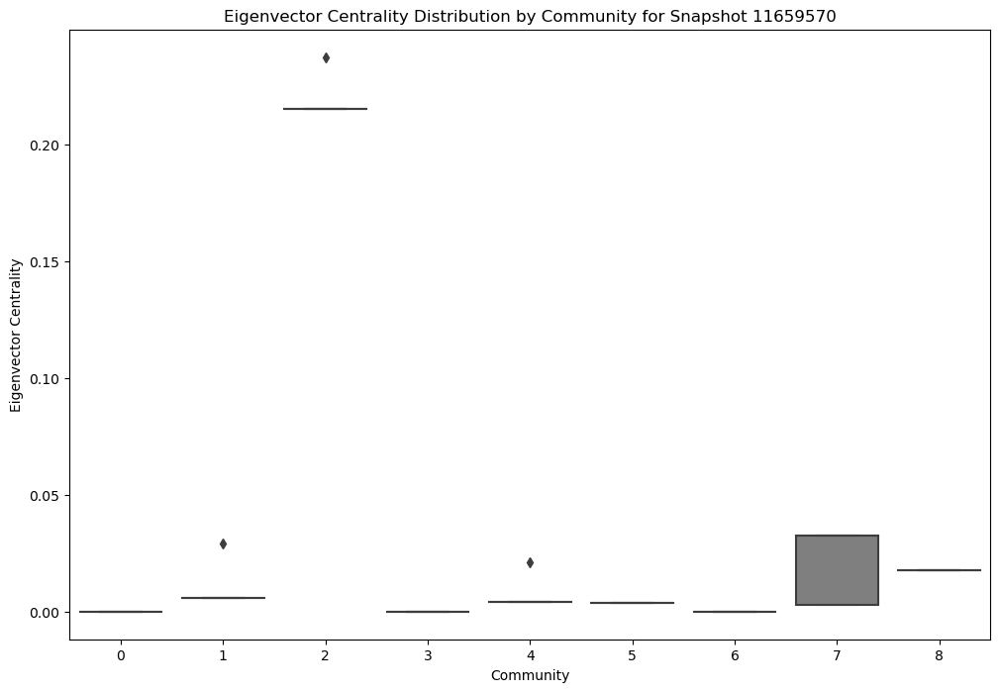

Snapshot: 11659570, Number of communities detected: 9
Community sizes for snapshot 11659570:
Community
2    21
7    19
3    18
1    17
4    17
0     9
5     8
8     6
6     3
Name: count, dtype: int64
Role Summary for Snapshot 11861210:

  Community    degree                     betweenness                      \
                 mean       std       max        mean       std       max   
0         0  0.175664  0.033640  0.318584    0.011169  0.049949  0.223378   
1         1  0.122687  0.039979  0.256637    0.018270  0.021312  0.092175   
2         2  0.084366  0.015995  0.132743    0.003503  0.002483  0.009592   
3         3  0.130383  0.025134  0.221239    0.010914  0.042271  0.163717   
4         4  0.053097  0.000000  0.053097    0.000000  0.000000  0.000000   
5         5  0.114524  0.074730  0.371681    0.014284  0.058893  0.242822   
6         6  0.150442  0.000000  0.150442    0.000000  0.000000  0.000000   

  closeness                       eigenvector                       

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_10220/3793550559.py:84: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  role_summary = pd.merge(role_summary, role_summary_eigenvector, on='Community')


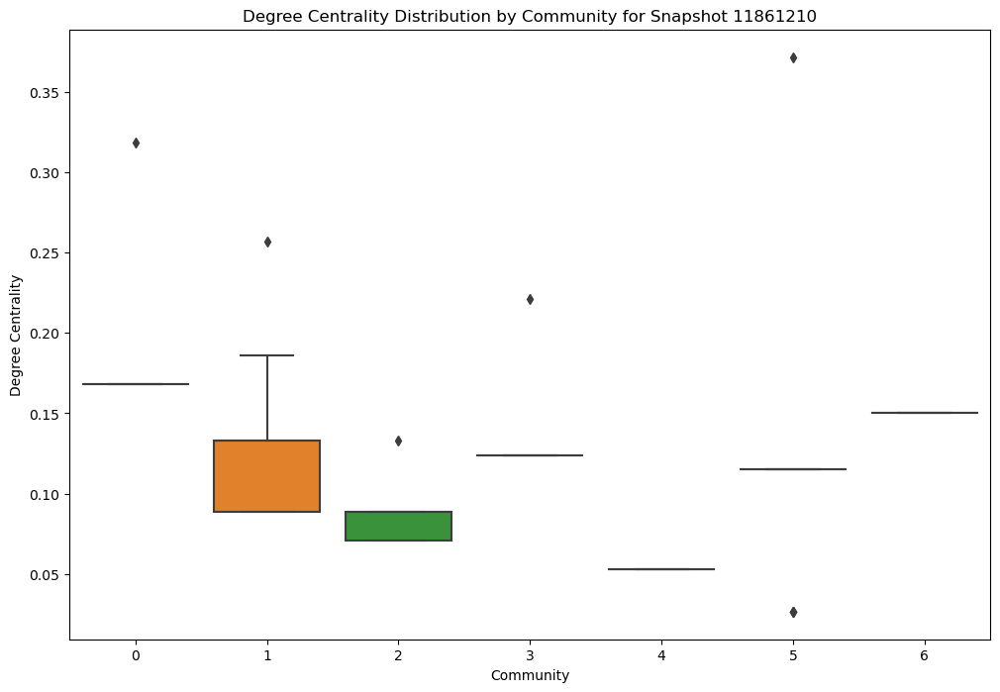

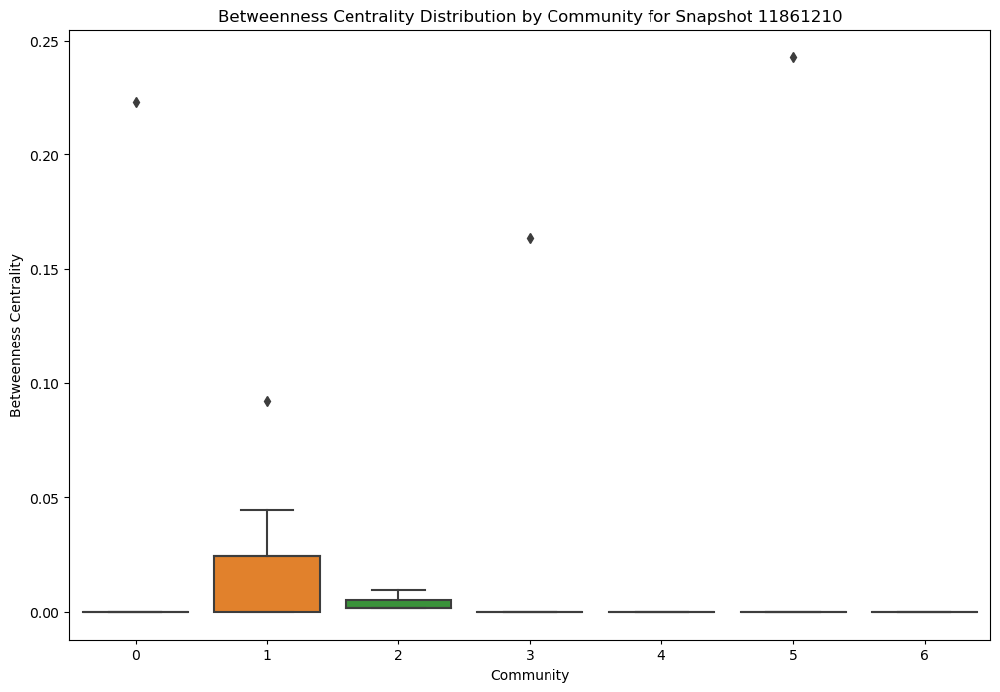

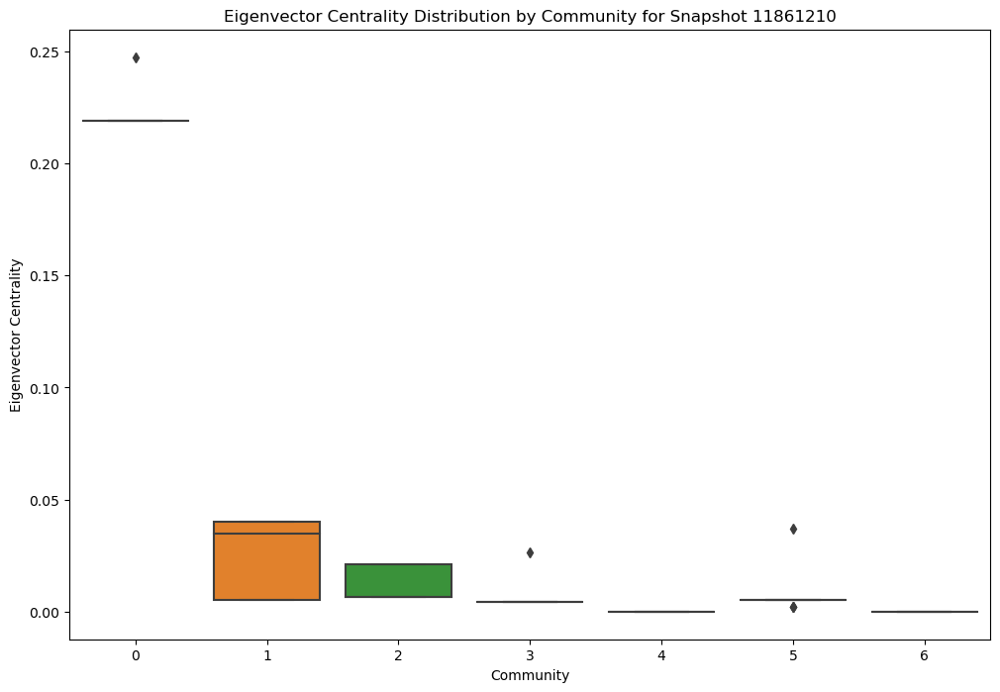

Snapshot: 11861210, Number of communities detected: 7
Community sizes for snapshot 11861210:
Community
1    22
0    20
6    18
5    17
3    15
2    15
4     7
Name: count, dtype: int64
Role Summary for Snapshot 12043054:

  Community    degree                     betweenness                      \
                 mean       std       max        mean       std       max   
0         0  0.147826  0.000000  0.147826    0.000000  0.000000  0.000000   
1         1  0.162471  0.025934  0.269565    0.010261  0.044728  0.194966   
2         2  0.132992  0.078307  0.400000    0.008977  0.036796  0.151767   
3         3  0.129275  0.029188  0.234783    0.010679  0.041359  0.160183   
4         4  0.060870  0.000000  0.060870    0.000000  0.000000  0.000000   
5         5  0.126957  0.074963  0.452174    0.016787  0.034086  0.184828   
6         6  0.086957  0.000000  0.086957    0.000060  0.000000  0.000060   

  closeness                       eigenvector                          
       mean 

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_10220/3793550559.py:84: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  role_summary = pd.merge(role_summary, role_summary_eigenvector, on='Community')


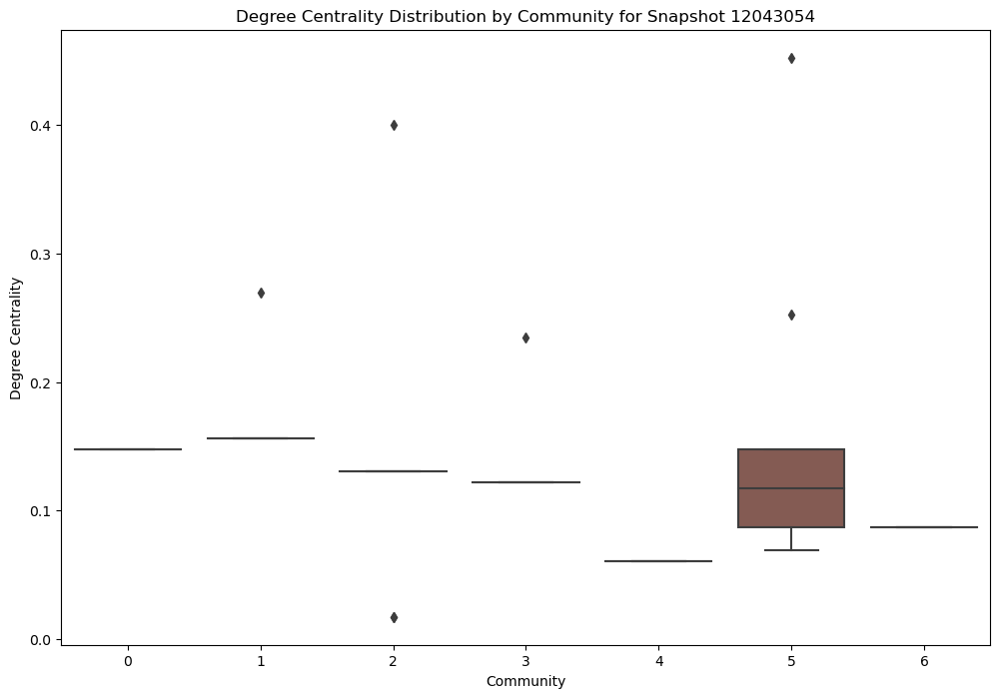

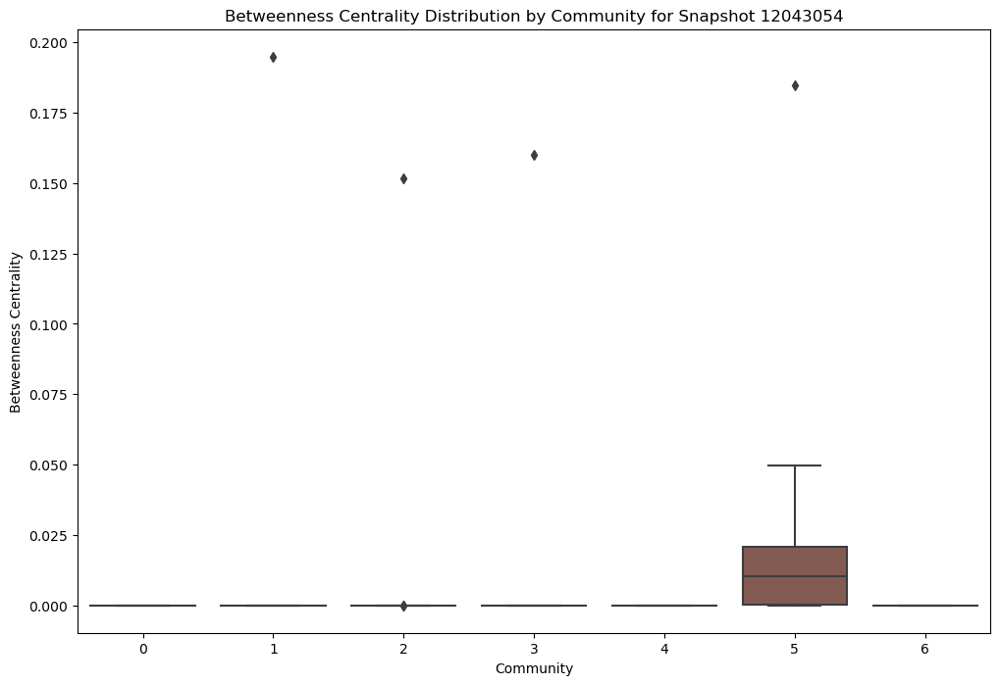

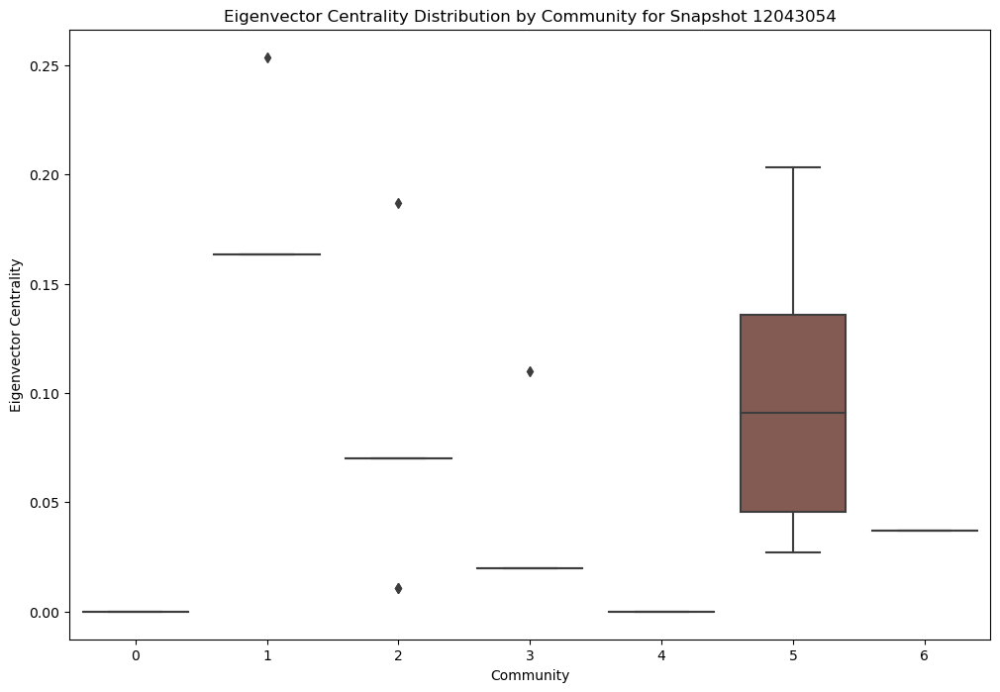

Snapshot: 12043054, Number of communities detected: 7
Community sizes for snapshot 12043054:
Community
5    30
1    19
0    18
2    17
3    15
6     9
4     8
Name: count, dtype: int64
Role Summary for Snapshot 12244515:

  Community    degree                     betweenness                      \
                 mean       std       max        mean       std       max   
0         0  0.141593  0.000000  0.141593    0.000000  0.000000  0.000000   
1         1  0.079646  0.000000  0.079646    0.000000  0.000000  0.000000   
2         2  0.130973  0.027419  0.230088    0.007965  0.030847  0.119469   
3         3  0.134305  0.075949  0.389381    0.005618  0.022986  0.094817   
4         4  0.150442  0.000000  0.150442    0.000000  0.000000  0.000000   
5         5  0.079646  0.000000  0.079646    0.000050  0.000000  0.000050   
6         6  0.088496  0.000000  0.088496    0.000112  0.000000  0.000112   
7         7  0.149236  0.080103  0.442478    0.011922  0.023926  0.116051   

  close

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_10220/3793550559.py:84: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  role_summary = pd.merge(role_summary, role_summary_eigenvector, on='Community')


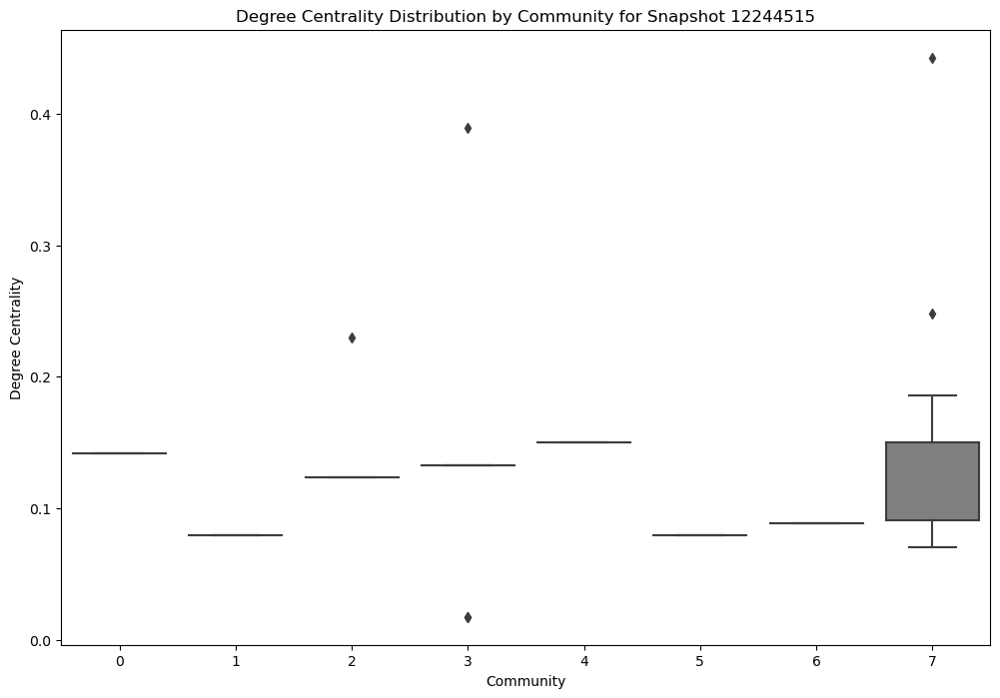

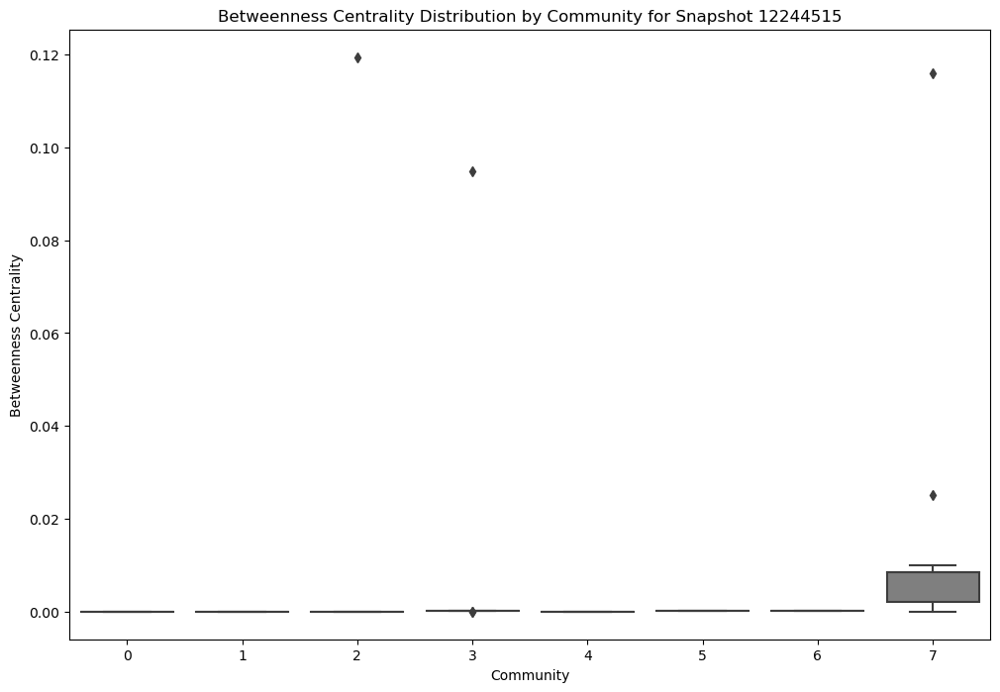

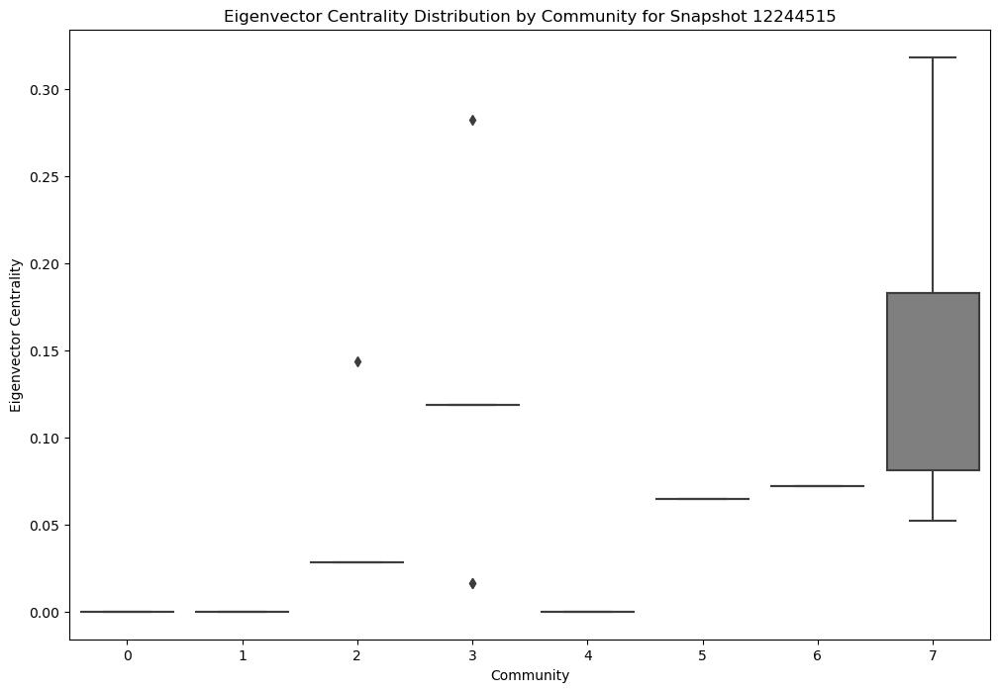

Snapshot: 12244515, Number of communities detected: 8
Community sizes for snapshot 12244515:
Community
7    22
4    18
0    17
3    17
2    15
1    10
6     8
5     7
Name: count, dtype: int64
Role Summary for Snapshot 12438842:

  Community    degree                     betweenness                      \
                 mean       std       max        mean       std       max   
0         0  0.100357  0.022110  0.161017    0.002423  0.002450  0.009959   
1         1  0.131030  0.044658  0.279661    0.008556  0.015254  0.059326   
2         2  0.161017  0.000000  0.161017    0.000000  0.000000  0.000000   
3         3  0.076271  0.000000  0.076271    0.000000  0.000000  0.000000   
4         4  0.129473  0.074040  0.389831    0.009851  0.041792  0.177310   
5         5  0.118644  0.000000  0.118644    0.000000  0.000000  0.000000   
6         6  0.128935  0.070213  0.372881    0.010552  0.039481  0.147726   
7         7  0.093220  0.000000  0.093220    0.000734  0.000000  0.000734   


/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_10220/3793550559.py:84: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  role_summary = pd.merge(role_summary, role_summary_eigenvector, on='Community')


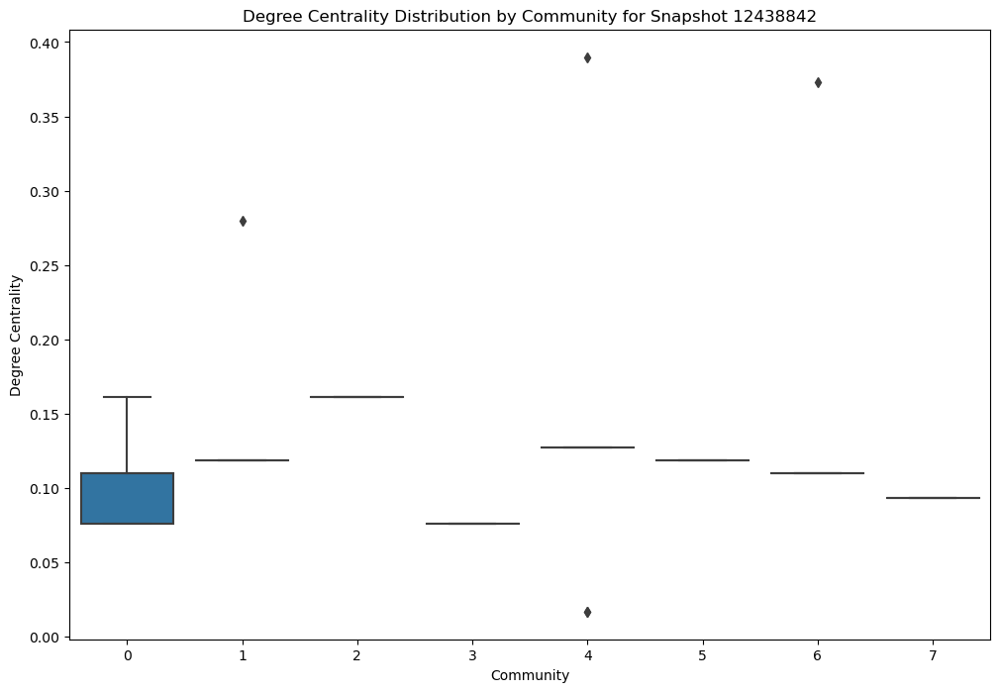

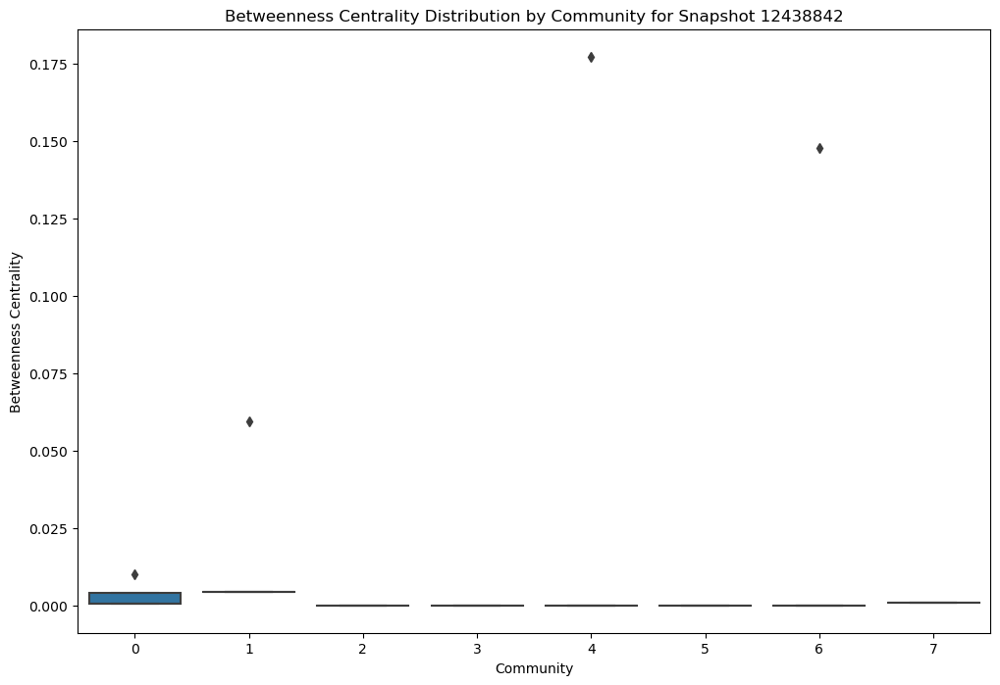

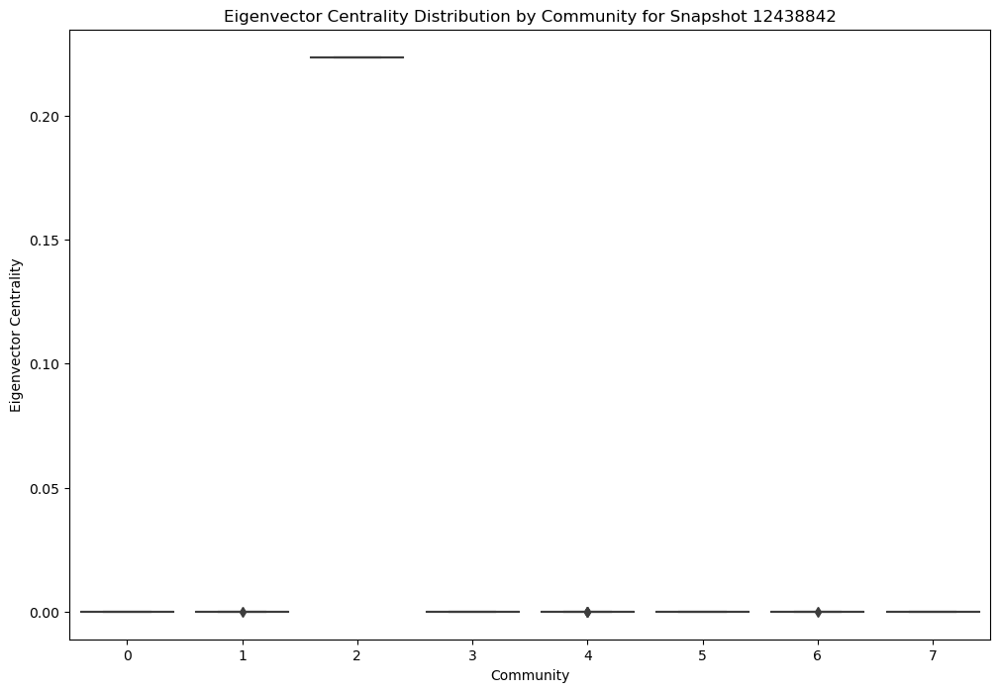

Snapshot: 12438842, Number of communities detected: 8
Community sizes for snapshot 12438842:
Community
2    20
0    19
4    18
5    15
6    14
1    13
7    10
3    10
Name: count, dtype: int64
Role Summary for Snapshot 12638919:

  Community    degree                     betweenness                      \
                 mean       std       max        mean       std       max   
0         0  0.100775  0.000000  0.100775    0.000000  0.000000  0.000000   
1         1  0.111383  0.038432  0.217054    0.006981  0.002804  0.017335   
2         2  0.130329  0.056202  0.341085    0.011787  0.047148  0.188590   
3         3  0.116735  0.082744  0.418605    0.010840  0.042670  0.176348   
4         4  0.031008  0.000000  0.031008    0.000000  0.000000  0.000000   
5         5  0.077519  0.000000  0.077519    0.000000  0.000000  0.000000   
6         6  0.093023  0.034668  0.232558    0.001501  0.006529  0.028461   
7         7  0.139535  0.000000  0.139535    0.000000  0.000000  0.000000   


/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_10220/3793550559.py:84: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  role_summary = pd.merge(role_summary, role_summary_eigenvector, on='Community')


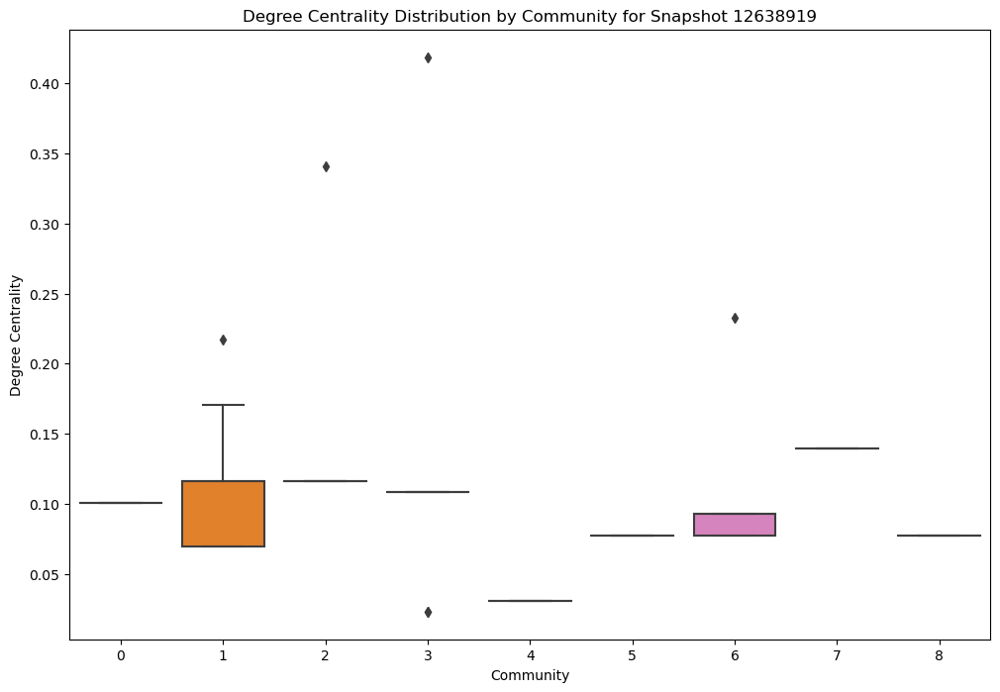

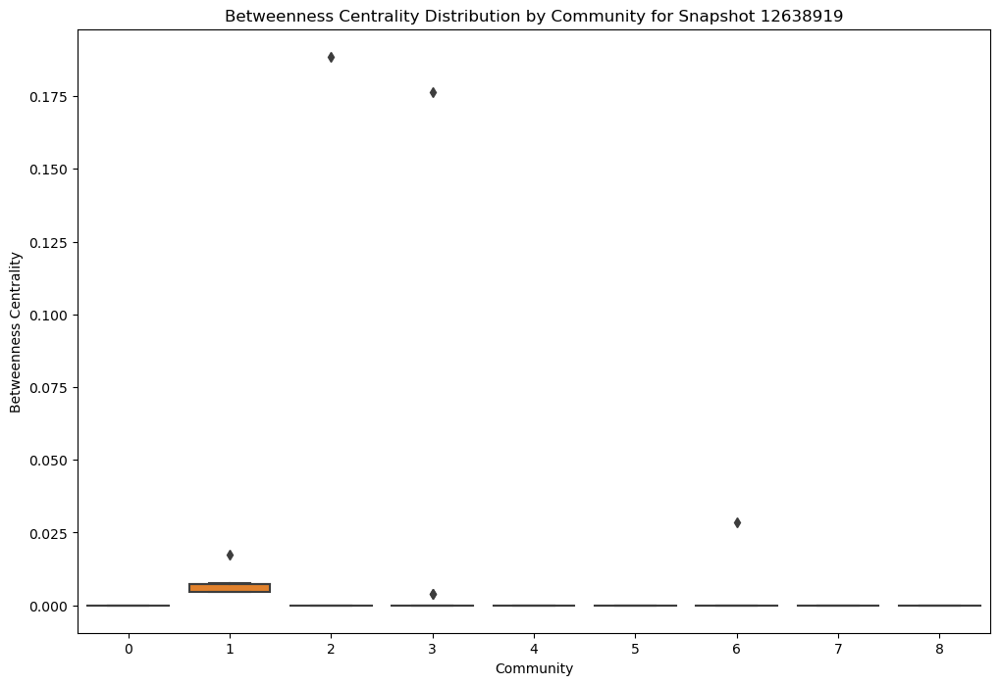

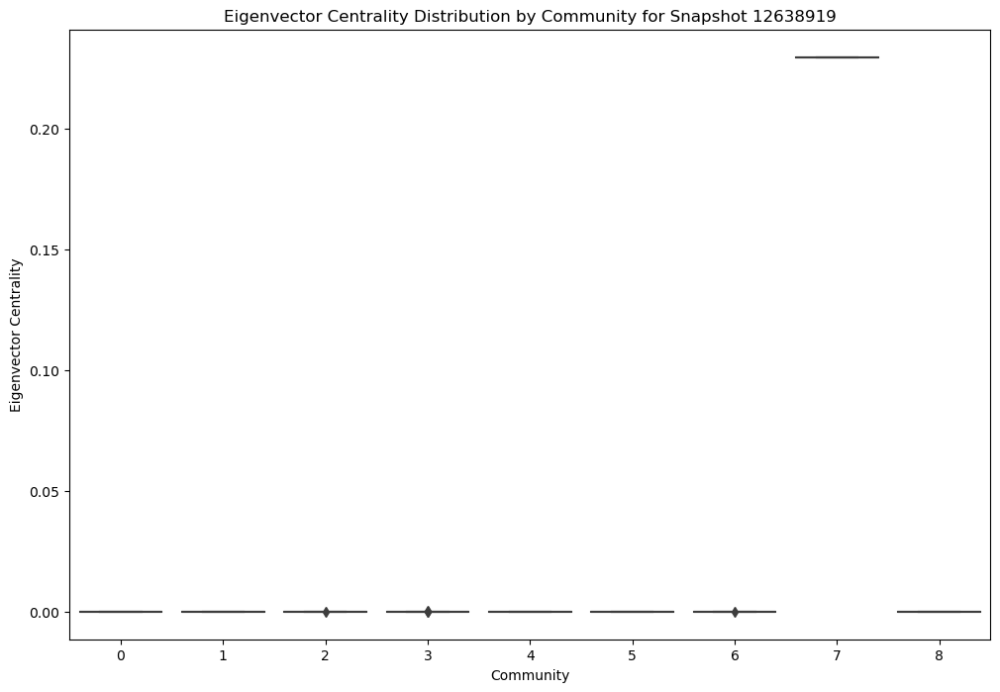

Snapshot: 12638919, Number of communities detected: 9
Community sizes for snapshot 12638919:
Community
1    19
6    19
7    19
3    17
2    16
0    14
5    11
8    10
4     5
Name: count, dtype: int64


/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_10220/3793550559.py:84: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  role_summary = pd.merge(role_summary, role_summary_eigenvector, on='Community')


Role Summary for Snapshot 12831436:

  Community    degree                     betweenness                      \
                 mean       std       max        mean       std       max   
0         0  0.084416  0.000000  0.084416    0.000000  0.000000  0.000000   
1         1  0.090909  0.000000  0.090909    0.000000  0.000000  0.000000   
2         2  0.116883  0.000000  0.116883    0.000000  0.000000  0.000000   
3         3  0.110390  0.000000  0.110390    0.000000  0.000000  0.000000   
4         4  0.099661  0.032972  0.220779    0.000655  0.002262  0.010660   
5         5  0.025974  0.000000  0.025974    0.000000  0.000000  0.000000   
6         6  0.103896  0.118531  0.538961    0.013501  0.054004  0.216018   
7         7  0.097403  0.000000  0.097403    0.000000  0.000000  0.000000   
8         8  0.067821  0.012244  0.116883    0.000174  0.000719  0.003056   
9         9  0.094156  0.033741  0.201299    0.000911  0.003144  0.010893   

  closeness                        eig

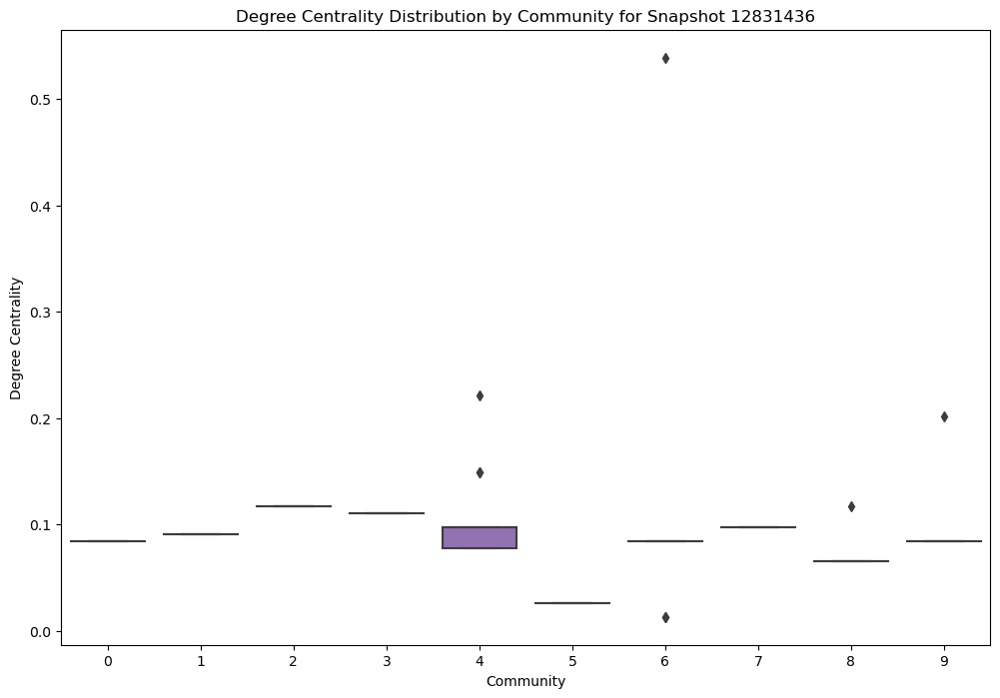

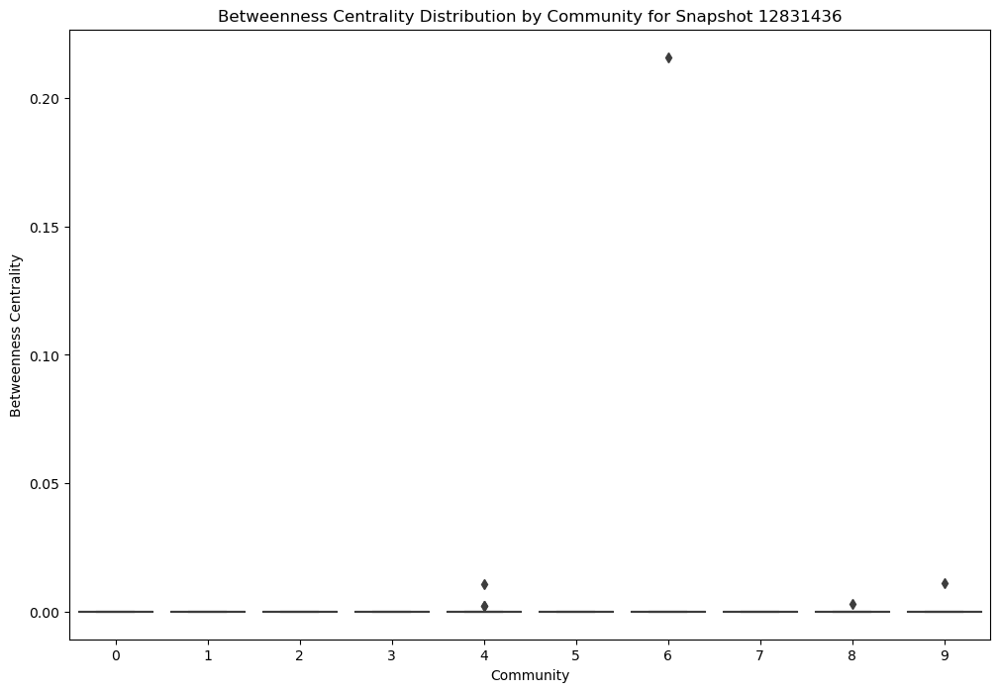

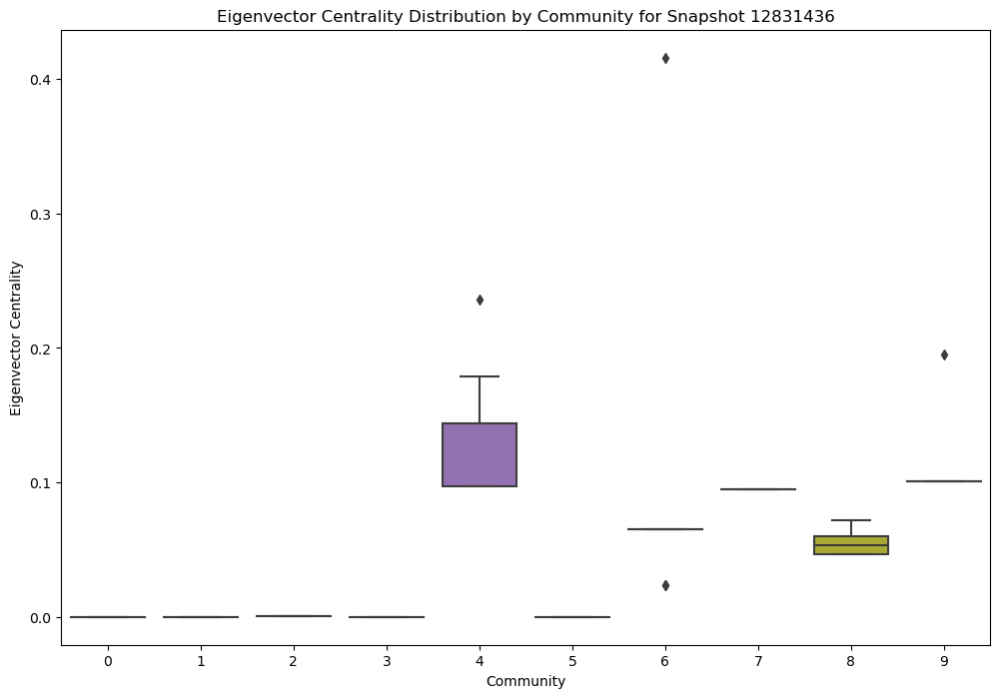

Snapshot: 12831436, Number of communities detected: 10
Community sizes for snapshot 12831436:
Community
4    23
2    19
3    18
8    18
6    16
1    15
7    15
0    14
9    12
5     5
Name: count, dtype: int64


In [ ]:
import os
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from community import community_louvain
from dotenv import load_dotenv
import seaborn as sns

# Load environment variables from .env file (if needed for other variables)
load_dotenv()

# Set the input directory directly to the local folder where the graphs are stored
input_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'

# Check if the input directory exists
if not os.path.exists(input_directory):
    raise FileNotFoundError(f"Input directory does not exist: {input_directory}")

print(f"Input directory is set to: {input_directory}")

# Function to load graphs from snapshots
def load_wallet_graphs_from_snapshots(df_snapshots, input_directory):
    graphs = {}
    dates = {}
    missing_snapshots = []
    
    for index, row in df_snapshots.iterrows():
        snapshot = row['Block Height']
        date = row['Date'].strftime('%Y-%m-%d')  # Format date as string
        dates[snapshot] = date
        file_path = os.path.join(input_directory, f"validated_wallet_projection_graph_{snapshot}.graphml")
        
        print(f"Checking file: {file_path}")  # Debug print

        if os.path.exists(file_path):
            graph = nx.read_graphml(file_path)
            graphs[snapshot] = graph
            print(f"Loaded graph for snapshot {snapshot}")
        else:
            print(f"Graph file for snapshot {snapshot} does not exist at {file_path}")
            missing_snapshots.append(snapshot)
    
    return graphs, dates, missing_snapshots

# Function to perform community detection using the Louvain method
def detect_communities(graph):
    partition = community_louvain.best_partition(graph)
    return partition

# Function to compute centrality measures
def compute_centrality_measures(graph, partition):
    centrality_measures = {
        'degree': nx.degree_centrality(graph),
        'betweenness': nx.betweenness_centrality(graph),
        'closeness': nx.closeness_centrality(graph),
    }
    
    try:
        centrality_measures['eigenvector'] = nx.eigenvector_centrality(graph, max_iter=500)
    except nx.PowerIterationFailedConvergence:
        print("Eigenvector centrality did not converge, skipping this measure.")
    
    # Create a DataFrame to store centrality measures and community information
    centrality_data = pd.DataFrame(index=graph.nodes())
    for measure, values in centrality_measures.items():
        centrality_data[measure] = pd.Series(values)
    
    centrality_data['Community'] = pd.Series(partition)
    
    return centrality_data

# Function to analyze the roles within communities
def analyze_roles_within_communities(centrality_data, snapshot, output_directory):
    role_summary = centrality_data.groupby('Community').agg({
        'degree': ['mean', 'std', 'max'],
        'betweenness': ['mean', 'std', 'max'],
        'closeness': ['mean', 'std', 'max'],
    }).reset_index()
    
    if 'eigenvector' in centrality_data.columns:
        role_summary_eigenvector = centrality_data.groupby('Community').agg({
            'eigenvector': ['mean', 'std', 'max'],
        }).reset_index()
        role_summary = pd.merge(role_summary, role_summary_eigenvector, on='Community')
    
    print(f"Role Summary for Snapshot {snapshot}:\n")
    print(role_summary)
    
    # Save the detailed centrality data
    centrality_data.to_csv(os.path.join(output_directory, f'centrality_data_snapshot_{snapshot}.csv'))
    role_summary.to_csv(os.path.join(output_directory, f'role_summary_snapshot_{snapshot}.csv'))
    
    # Visualize centrality measures
    plt.figure(figsize=(12, 8))
    sns.boxplot(x='Community', y='degree', data=centrality_data)
    plt.title(f"Degree Centrality Distribution by Community for Snapshot {snapshot}")
    plt.xlabel('Community')
    plt.ylabel('Degree Centrality')
    plt.savefig(os.path.join(output_directory, f'degree_centrality_distribution_snapshot_{snapshot}.png'))
    plt.show()

    plt.figure(figsize=(12, 8))
    sns.boxplot(x='Community', y='betweenness', data=centrality_data)
    plt.title(f"Betweenness Centrality Distribution by Community for Snapshot {snapshot}")
    plt.xlabel('Community')
    plt.ylabel('Betweenness Centrality')
    plt.savefig(os.path.join(output_directory, f'betweenness_centrality_distribution_snapshot_{snapshot}.png'))
    plt.show()

    if 'eigenvector' in centrality_data.columns:
        plt.figure(figsize=(12, 8))
        sns.boxplot(x='Community', y='eigenvector', data=centrality_data)
        plt.title(f"Eigenvector Centrality Distribution by Community for Snapshot {snapshot}")
        plt.xlabel('Community')
        plt.ylabel('Eigenvector Centrality')
        plt.savefig(os.path.join(output_directory, f'eigenvector_centrality_distribution_snapshot_{snapshot}.png'))
        plt.show()

# Assuming df_snapshots is already loaded
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
df_snapshots = pd.read_csv(os.path.join(data_directory, 'snapshot_selection.csv'))
df_snapshots['Date'] = pd.to_datetime(df_snapshots['Date'])  # Ensure dates are in datetime format

# Load the graphs
graphs, dates, missing_snapshots = load_wallet_graphs_from_snapshots(df_snapshots, input_directory)

# Directory to save visualizations
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/output'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Perform community detection and analyze functionality and roles
partitions = {}
sorted_snapshots = sorted(graphs.keys())
for snapshot in sorted_snapshots:
    graph = graphs[snapshot]
    partition = detect_communities(graph)
    partitions[snapshot] = partition
    
    # Compute centrality measures
    centrality_data = compute_centrality_measures(graph, partition)
    
    # Analyze roles within communities
    analyze_roles_within_communities(centrality_data, snapshot, output_directory)
    
    # Save partition information
    partition_df = pd.DataFrame(list(partition.items()), columns=['Node', 'Community'])
    partition_df.to_csv(os.path.join(output_directory, f'partition_snapshot_{snapshot}.csv'), index=False)
    
    # Analyze community structure
    community_sizes = partition_df['Community'].value_counts()
    print(f"Snapshot: {snapshot}, Number of communities detected: {len(community_sizes)}")
    print(f"Community sizes for snapshot {snapshot}:")
    print(community_sizes)
    
    # Save community sizes to a CSV file
    community_sizes.to_csv(os.path.join(output_directory, f'community_sizes_snapshot_{snapshot}.csv'))

print("Community detection and analysis complete.")
